In [92]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split, KFold, GridSearchCV

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score, PredictionErrorDisplay
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

In [176]:
ames_lasso = pd.read_csv('ames.csv', index_col=0)
ames_lasso.head(10)
#ames_lasso.columns

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalBath,TotalSF,HQSF,yrsbtwn,BedxBath,RoomsxBath,FireplaceYN,TotalPorchSF
1,909176150,856,126000,30,RL,58.769231,7890,Pave,No Alley,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,No MasVnr,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,No Pool,No Fence,No Misc,0,3,2010,WD,Normal,2.0,1712.0,1712.0,11,4.0,8.0,1,166
2,905476230,1049,139500,120,RL,42.000000,4235,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,No Fireplace,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,No Pool,No Fence,No Misc,0,2,2009,WD,Normal,3.0,2098.0,2098.0,0,6.0,15.0,0,105
3,911128020,1001,124900,30,C (all),60.000000,6060,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,No MasVnr,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,No Fireplace,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,No Pool,No Fence,No Misc,0,11,2007,WD,Normal,1.0,1838.0,1838.0,77,2.0,5.0,0,282
4,535377150,1039,114000,70,RL,80.000000,8146,Pave,No Alley,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,No MasVnr,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,No Fireplace,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,No Pool,No Fence,No Misc,0,5,2009,WD,Normal,1.0,1444.0,1444.0,103,2.0,6.0,0,279
5,534177230,1665,227000,60,RL,70.000000,8400,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,No MasVnr,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,No Fireplace,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,No Pool,No Fence,No Misc,0,11,2009,WD,Normal,3.5,2475.0,2475.0,0,10.5,21.0,0,45
6,908128060,1922,198500,85,RL,64.000000,7301,Pave,No Alley,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,SFoyer,7,5,2003,2003,Gable,CompShg,HdBoard,HdBoard,BrkFace,500.0,Gd,TA,Slab,No Bsmt,No Bsmt,No Bsmt,No Bsmt,0.0,No Bsmt,0.0,0.0,0.0,GasA,Ex,Y,SBrkr,495,1427,0,0.0,0.0,3,0,4,1,Gd,7,Typ,1,Ex,BuiltIn,2003.0,RFn,2.0,672.0,TA,TA,Y,0,0,177,0,0,0,No Pool,No Fence,No Misc,0,7,2009,ConLD,Normal,3.0,1922.0,1922.0,0,12.0,21.0,1,177
7,902135020,936,93000,20,RM,60.000000,6000,Pave,Pave,Reg,Bnk,AllPub,Inside,Mod,OldTown,Norm,Norm,2fmCon,1Story,4,4,1953,1953,Gable,CompShg,MetalSd,MetalSd,No MasVnr,0.0,Fa,TA,CBlock,Fa,TA,No,Unf,0.0,Unf,0.0,936.0,936.0,GasA,TA,N,SBrkr,936,0,0,0.0,0.0,1,0,2,1,TA,4,Min2,0,No Fireplace,Detchd,1974.0,Unf,2.0,576.0,TA,TA,Y,0,32,112,0,0,0,No Pool,No Fence,No Misc,0,2,2009,WD,Normal,1.0,1872.0,1872.0,0,2.0,4.0,0,144
8,528228540,1246,187687,20,RL,53.000000,3710,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,1Fam,1Story,7,5,2007,2008,G

### Encoding
Split columns up by type, prepare to encode differently

In [94]:
all_cols = []

nominal_cols = ['Alley','BldgType','CentralAir','Condition1','Condition2','Electrical','Exterior1st','Exterior2nd','Fence',
           'Foundation','GarageType','Heating','HouseStyle','LandContour','LotConfig','MSSubClass','MSZoning',
           'MasVnrType','MiscFeature','MoSold','Neighborhood','PavedDrive','RoofMatl','RoofStyle','SaleCondition',
           'SaleType','Street','YrSold'] #FireplaceYN

ordinal_cols = ['LotShape','Utilities','LandSlope','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1',
 'BsmtFinType2','HeatingQC','KitchenQual','Functional','FireplaceQu','GarageFinish','GarageQual','GarageCond','PoolQC']

numerical_cols = ['GrLivArea','LotFrontage','LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','MasVnrArea',
             'BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','LowQualFinSF','BsmtFullBath',
             'BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces', 'Age'
             'GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch',
             'ScreenPorch','PoolArea','MiscVal', 'TotalSF', 'TotalBath', 'HQSF', 'yrsbtwn', 'BedxBath', 
             'GarageYrBlt','RoomsxBath', 'TotalPorchSF']

all_cols.extend(nominal_cols)
all_cols.extend(ordinal_cols)
all_cols.extend(numerical_cols)

for col in ames_lasso.columns:
    if col not in all_cols:
        print(col)


PID
SalePrice
FireplaceYN


### Hybrid encoding: 
Encode ordinal features/dummify nominal features. Don't drop columns for dummifying nominal features because lasso does the dropping for you, reducing coefficients of some variables all the way to 0, effectively performing feature selection!

In [8]:
ordinal_mappings = {
    'BsmtCond': {'No Bsmt': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'BsmtExposure': {'No Bsmt': 0, 'No': 1, 'Mn': 2, 'Av': 3, 'Gd': 4},
    'BsmtFinType1': {'No Bsmt': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6},
    'BsmtFinType2': {'No Bsmt': 0, 'Unf': 1, 'LwQ': 2, 'Rec': 3, 'BLQ': 4, 'ALQ': 5, 'GLQ': 6}, 
    'BsmtQual': {'No Bsmt': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}, 
    'ExterCond': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}, 
    'ExterQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}, 
    'FireplaceQu': {'No Fireplace': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}, 
    'Functional': {'Sal':1, 'Maj2':2, 'Maj1':3 , 'Mod':4 ,'Min2':5 , 'Min1':6 ,'Typ':7}, 
    'GarageCond': {'No Garage': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}, 
    'GarageFinish': {'No Garage': 0, 'Unf':1, 'RFn':2, 'Fin':3}, 
    'GarageQual': {'No Garage': 0, 'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5 }, 
    'HeatingQC': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5 }, 
    'KitchenQual': {'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5 }, 
    'LandSlope': {'Gtl':1, 'Mod':2, 'Sev':3}, 
    'LotShape': {'IR3':1, 'IR2':2, 'IR1':3, 'Reg':4},
    'PavedDrive': {'N':1, 'P':2, 'Y':3}, 
    'PoolQC': {'No Pool': 0, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5},
    'Utilities': {'ELO': 0, 'NoSeWa': 1, 'NoSewr': 2, 'AllPub': 3}
    
}
# Map ordinal variables
for col_key, mapping_vals in ordinal_mappings.items():
    if col_key in ames_lasso.columns:
        ames_lasso[col_key] = ames_lasso[col_key].map(mapping_vals)

ames_lasso_encoded = ames_lasso.copy()

ames_lasso_encoded_nodrop = pd.get_dummies(ames_lasso_encoded, columns=nominal_cols, drop_first=False)


In [97]:
ames_lasso_encoded_nodrop.head(10) #True/False vs 1/0 handled the same with Lasso, no need to relabel

,PID,GrLivArea,SalePrice,LotFrontage,LotArea,LotShape,Utilities,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,MiscVal,TotalBath,TotalSF,HQSF,yrsbtwn,BedxBath,RoomsxBath,FireplaceYN,TotalPorchSF,Alley_Grvl,Alley_No Alley,Alley_Pave,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,CentralAir_N,CentralAir_Y,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_PreCast,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_PreCast,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_A (agr),MSZoning_C (all),MSZoning_FV,MSZoning_I (all),MSZoning_RH,MSZoning_RL,MSZoning_RM,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_No MasVnr,MasVnrType_Stone,MiscFeature_Gar2,MiscFeature_No Misc,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,MoSold_1,MoSold_2,MoSold_3,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_9,MoSold_10,MoSold_11,MoSold_12,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,PavedDrive_1,PavedDrive_2,PavedDrive_3,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SaleType_COD,SaleType_CWD,SaleT

In [98]:
import os

current_directory = os.getcwd()

file_path = os.path.join(current_directory, "ames_encoded_nodrop.csv")

ames_lasso_encoded_nodrop.to_csv(file_path)

## Scaling/Leakage
Need to be particular here about scaling to avoid data leakage and to avoid scaling dummified variables.

In [99]:
#Split columns into ones to scale and dummified (to not scale)
col_list = ames_lasso_encoded_nodrop.columns.tolist()
dummified_cols = []
cols_to_scale = []
for col_name in col_list:
    if "_" in col_name:
        dummified_cols.append(col_name)
    else:
        cols_to_scale.append(col_name)

cols_to_scale.remove('PID')
cols_to_scale.remove('SalePrice')
cols_to_scale.remove('FireplaceYN')
cols_to_scale

['GrLivArea',
 'LotFrontage',
 'LotArea',
 'LotShape',
 'Utilities',
 'LandSlope',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'PoolQC',
 'MiscVal',
 'TotalBath',
 'TotalSF',
 'HQSF',
 'yrsbtwn',
 'BedxBath',
 'RoomsxBath',
 'TotalPorchSF']

In [100]:
#Want to avoid scaling dummified variables, but would also like to include scaling in a pipeline.
#Instantiate this scaler and include 'cols_to_scale' in parentheses to use in pipeline.

class SubsetScaler(BaseEstimator, TransformerMixin):
    def __init__(self, cols_to_scale):
        self.cols_to_scale = cols_to_scale
        self.scaler = StandardScaler()
    
    def fit(self, X, y=None):
        self.scaler.fit(X[self.cols_to_scale], y)
        return self
    
    def transform(self, X):
        X_scaled = X.copy()
        X_scaled[self.cols_to_scale] = self.scaler.transform(X[self.cols_to_scale])
        return X_scaled
    
    def fit_transform(self, X, y=None):
        return self.fit(X, y).transform(X)

pipeline = Pipeline([
    ('scaler', SubsetScaler(cols_to_scale)), #Scales non-dummified variables, leaves dummies intact
    ('model', Lasso(max_iter = 10000))
])

In [101]:
#Feature Selection using Lasso- train_test split
y = ames_lasso_encoded_nodrop['SalePrice']
X = ames_lasso_encoded_nodrop.drop(columns = ['PID', 'SalePrice'], axis = 1)

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state = 0)

In [ ]:
#In previous versions of this notebook, I did a train-test split above this cell

## Tune Alpha for Lasso
Run a series of gridsearches with the created pipeline. We need to tune alpha/lambda, the penalization term in the Lasso. Start with a very wide range and then gradually zoom in. 

In [13]:
log_scale_search = GridSearchCV(pipeline,
                     {'model__alpha': np.logspace(-3, 5, 8)},
                     cv = 5,
                     scoring = 'r2',
                    return_train_score=True,
                     verbose = 1)

In [102]:
log_scale_search.fit(X, y) #previously X_train y_train

Fitting 5 folds for each of 8 candidates, totalling 40 fits


/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.074e+11, tolerance: 1.090e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.833e+11, tolerance: 1.096e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'LotShape',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'TotalBsmtSF',
                                                                    'HeatingQC',
                                                                    '1stFlrSF',
                                                                    '2ndFlrSF',
                                                                    'LowQualFinSF',
                                                                    'BsmtFullBath',
                                                                    'BsmtHalfBath',
                                                                    'FullBath',
                                                                    'HalfBath', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': array([1.00000000e-03, 1.38949549e-02, 1.93069773e-01, 2.68269580e+00,
       3.72759372e+01, 5.17947468e+02, 7.19685673e+03, 1.00000000e+05])},
             return_train_score=True, scoring='r2', verbose=1)

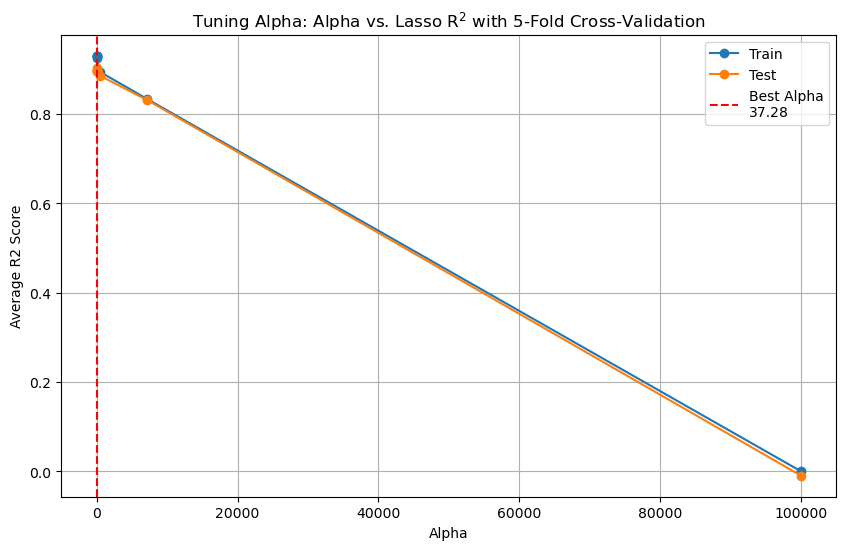

Best parameters: {'model__alpha': 37.27593720314938}
Best R-squared: 0.9020566946131195


In [127]:
def alpha_tune_plot(mygridsearch):
    
    results = mygridsearch.cv_results_
    train_score = results['mean_train_score']
    test_score = results['mean_test_score']
    alphas = results['param_model__alpha'].data.astype(float)

    best_alpha = mygridsearch.best_params_['model__alpha']

    plt.figure(figsize=(10, 6))
    plt.plot(alphas, train_score, label = 'Train', marker='o')
    plt.plot(alphas, test_score, label = 'Test', marker = 'o')
    plt.title('Tuning Alpha: Alpha vs. Lasso R$^2$ with 5-Fold Cross-Validation')
    plt.xlabel('Alpha')
    plt.ylabel('Average R2 Score')
    plt.grid(True)

    plt.axvline(x=best_alpha, color='r', linestyle='--', label = f'Best Alpha\n{round(best_alpha, 2)}')
    plt.legend()
    plt.show()
    print("Best parameters:", mygridsearch.best_params_)
    print("Best R-squared:", mygridsearch.best_score_)
    
alpha_tune_plot(log_scale_search)

In [16]:
thousand_search = GridSearchCV(pipeline,
                     {'model__alpha': np.linspace(0, 1000, 20)},
                     cv = 5,
                     scoring = 'r2',
                    return_train_score=True,
                     verbose = 1)

In [104]:
thousand_search.fit(X, y)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/base.py:1151: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  return fit_method(estimator, *args, **kwargs)
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.327e+11, tolerance: 1.090e+09 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV in

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'LotShape',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',...
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': array([   0.        ,   52.63157895,  105.26315789,  157.89473684,
        210.52631579,  263.15789474,  315.78947368,  368.42105263,
        421.05263158,  473.68421053,  526.31578947,  578.94736842,
        631.57894737,  684.21052632,  736.84210526,  789.47368421,
        842.10526316,  894.73684211,  947.36842105, 1000.        ])},
             return_train_score=True, scoring='r2', verbose=1)

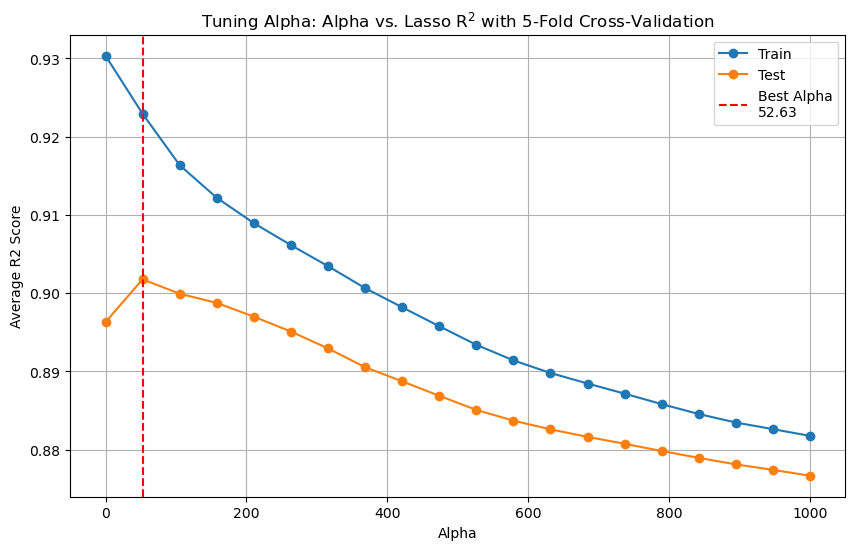

Best parameters: {'model__alpha': 52.63157894736842}
Best R-squared: 0.9017587100278174


In [128]:
alpha_tune_plot(thousand_search)
#Where the train curve is at its highest while also being closest to test is an optimal value for alpha.
#In this way we can shoot for best performance possible while avoiding overfitting.

In [110]:
hundred_search = GridSearchCV(pipeline,
                     {'model__alpha': np.linspace(1, 100, 10)},
                     cv = 5,
                     scoring = 'r2',
                      return_train_score=True,
                     verbose = 1)
hundred_search.fit(X, y)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+10, tolerance: 1.090e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.779e+09, tolerance: 1.096e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'LotShape',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'TotalBsmtSF',
                                                                    'HeatingQC',
                                                                    '1stFlrSF',
                                                                    '2ndFlrSF',
                                                                    'LowQualFinSF',
                                                                    'BsmtFullBath',
                                                                    'BsmtHalfBath',
                                                                    'FullBath',
                                                                    'HalfBath', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': array([  1.,  12.,  23.,  34.,  45.,  56.,  67.,  78.,  89., 100.])},
             return_train_score=True, scoring='r2', verbose=1)

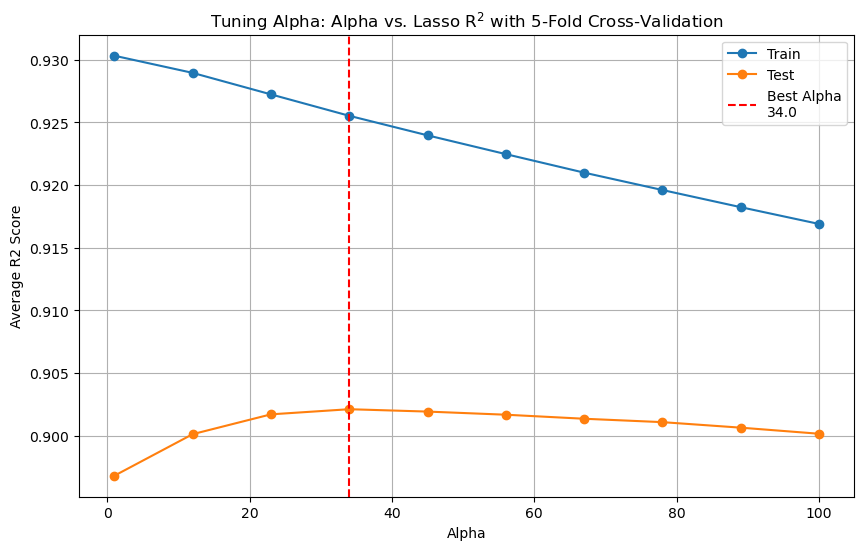

Best parameters: {'model__alpha': 34.0}
Best R-squared: 0.9021039832164227


In [129]:
alpha_tune_plot(hundred_search)

In [114]:
twenty_search = GridSearchCV(pipeline,
                     {'model__alpha': range(24, 45)},
                     cv = 5,
                     scoring = 'r2',
                      return_train_score=True,
                     verbose = 1)
twenty_search.fit(X, y)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'LotShape',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'TotalBsmtSF',
                                                                    'HeatingQC',
                                                                    '1stFlrSF',
                                                                    '2ndFlrSF',
                                                                    'LowQualFinSF',
                                                                    'BsmtFullBath',
                                                                    'BsmtHalfBath',
                                                                    'FullBath',
                                                                    'HalfBath', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': range(24, 45)},
             return_train_score=True, scoring='r2', verbose=1)

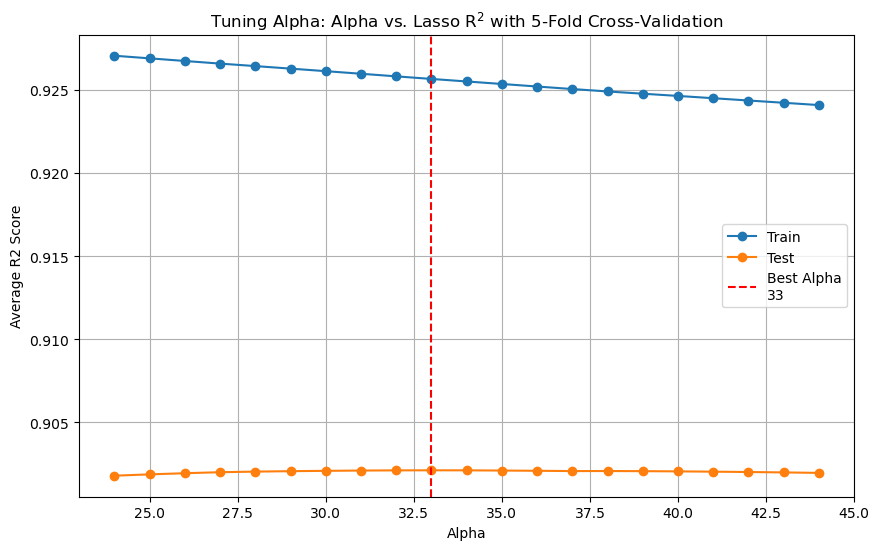

Best parameters: {'model__alpha': 33}
Best R-squared: 0.902105938049047


In [130]:
alpha_tune_plot(twenty_search)

In [116]:
results = twenty_search.cv_results_
train_score = results['mean_train_score']
test_score = results['mean_test_score']
best_alpha = twenty_search.best_params_['model__alpha']

print(f"{train_score = }, {test_score = }, {best_alpha = }")

#For alpha = 33:
#train_score = 0.92566764
#test_score = 0.90210594

train_score = array([0.92706539, 0.9269073 , 0.92674916, 0.92659105, 0.92644137,
       0.92628923, 0.92613552, 0.92598024, 0.92582314, 0.92566764,
       0.92551566, 0.9253642 , 0.92521133, 0.92505962, 0.92491408,
       0.92477887, 0.92464454, 0.92450731, 0.92436948, 0.92423274,
       0.92409424]), test_score = array([0.90177967, 0.90186214, 0.90193025, 0.90199082, 0.90202727,
       0.90205377, 0.90207358, 0.90209098, 0.9021018 , 0.90210594,
       0.90210398, 0.90209118, 0.90207664, 0.90205911, 0.90206235,
       0.90205469, 0.90204151, 0.90202381, 0.902003  , 0.90197889,
       0.90194997]), best_alpha = 33


## Good alpha = 33
We have an idea that setting alpha to 33 in our lasso regression of SalePrice onto all of Ames data will yield our best performing model while avoiding overfitting.

## What variables have survived being lasso-ed and what have been reduced to zero?

In [117]:
coefs = twenty_search.best_estimator_[1].coef_
coefs
#cursory look at this is that a great deal of coefficients have been shrunk to 0.

array([ 1.72221702e+04,  1.26237658e+02,  3.34997260e+03,  0.00000000e+00,
        2.07970925e+02, -8.71900932e+00,  1.15440374e+04,  6.31655131e+03,
        8.85202850e+03,  8.42302253e+02,  6.01003526e+03,  3.72183515e+03,
       -2.19484835e+00,  2.33929945e+03, -3.16422044e+03,  5.03015519e+03,
       -6.25078680e+02,  8.82600946e+03, -8.32683970e-01,  1.90031535e+03,
       -5.98735368e+01,  0.00000000e+00,  1.32116231e+03,  0.00000000e+00,
        4.57221799e+02, -6.09585541e+02, -0.00000000e+00, -8.27563831e+01,
       -4.38055856e+02,  3.47406262e+02, -1.54430481e+03, -1.38157731e+03,
        3.97330393e+03, -5.09273517e+03,  2.53442144e+03,  5.41638937e+03,
        2.56835366e+03, -2.64504132e+03,  9.13800004e+02,  2.63129149e+03,
        3.77468248e+03,  0.00000000e+00, -2.48356628e+02,  0.00000000e+00,
       -6.85188070e+02,  1.04481705e+02,  1.85589145e+02,  1.89164755e+03,
       -3.96046413e+03,  4.75456150e+03,  0.00000000e+00, -7.03394464e+03,
        8.50668970e+03,  

In [118]:
lasso_coefs = twenty_search.best_estimator_[1].coef_
feature_names = X.columns 
zero_coef_features = [feature_names[i] for i in range(len(lasso_coefs)) if lasso_coefs[i] == 0]

print(f"Number of features shrunk to zero: {len(zero_coef_features)}")
print("Features shrunk to zero by Lasso:")
for feature in zero_coef_features:
    print(feature)

Number of features shrunk to zero: 118
Features shrunk to zero by Lasso:
LotShape
TotalBsmtSF
1stFlrSF
BsmtFullBath
GarageQual
WoodDeckSF
MiscVal
yrsbtwn
Alley_Grvl
BldgType_Duplex
BldgType_TwnhsE
Condition1_RRAn
Condition1_RRNe
Condition1_RRNn
Condition2_Artery
Condition2_Feedr
Condition2_Norm
Condition2_RRAe
Condition2_RRAn
Condition2_RRNn
Electrical_FuseA
Electrical_FuseF
Electrical_FuseP
Exterior1st_AsbShng
Exterior1st_AsphShn
Exterior1st_BrkComm
Exterior1st_CBlock
Exterior1st_CemntBd
Exterior1st_ImStucc
Exterior1st_Plywood
Exterior1st_PreCast
Exterior1st_WdShing
Exterior2nd_AsphShn
Exterior2nd_CBlock
Exterior2nd_ImStucc
Exterior2nd_MetalSd
Exterior2nd_PreCast
Exterior2nd_Stone
Exterior2nd_Stucco
Exterior2nd_Wd Sdng
Fence_GdPrv
Fence_MnPrv
Fence_MnWw
Fence_No Fence
Foundation_PConc
Foundation_Stone
Foundation_Wood
GarageType_BuiltIn
GarageType_CarPort
GarageType_No Garage
Heating_Floor
Heating_GasA
Heating_GasW
Heating_Grav
Heating_OthW
Heating_Wall
HouseStyle_1.5Unf
HouseStyle_2.5

In [119]:
non_zero_coef_features = [feature_names[i] for i in range(len(lasso_coefs)) if lasso_coefs[i] != 0]
print(f"Number of features not shrunk to zero: {len(non_zero_coef_features)}")
print("Features not shrunk to zero by Lasso:")
for feature in non_zero_coef_features:
    print(feature)

Number of features not shrunk to zero: 155
Features not shrunk to zero by Lasso:
GrLivArea
LotFrontage
LotArea
Utilities
LandSlope
OverallQual
OverallCond
YearBuilt
YearRemodAdd
MasVnrArea
ExterQual
ExterCond
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinSF1
BsmtFinType2
BsmtFinSF2
BsmtUnfSF
HeatingQC
2ndFlrSF
LowQualFinSF
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
KitchenQual
TotRmsAbvGrd
Functional
Fireplaces
FireplaceQu
GarageYrBlt
GarageFinish
GarageCars
GarageArea
GarageCond
OpenPorchSF
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
PoolQC
TotalBath
TotalSF
HQSF
BedxBath
RoomsxBath
FireplaceYN
TotalPorchSF
Alley_No Alley
Alley_Pave
BldgType_1Fam
BldgType_2fmCon
BldgType_Twnhs
CentralAir_N
CentralAir_Y
Condition1_Artery
Condition1_Feedr
Condition1_Norm
Condition1_PosA
Condition1_PosN
Condition1_RRAe
Condition2_PosA
Condition2_PosN
Electrical_SBrkr
Exterior1st_BrkFace
Exterior1st_HdBoard
Exterior1st_MetalSd
Exterior1st_Stucco
Exterior1st_VinylSd
Exterior1st_Wd Sdng


In [120]:
#Characterize Non-zero Coefficient Features
#Recover General Names of Coefficients (pre-dummification)

orig_feature_names_list = []

for feature in non_zero_coef_features:
    orig_feature_names_list.append(feature.split('_')[0])

orig_feature_names_list = list(set(orig_feature_names_list)) #remove duplicates

print(f'Remaining Features: {len(orig_feature_names_list)}')
orig_feature_names_list

Remaining Features: 76


['LandSlope',
 'YearRemodAdd',
 'BsmtFinType2',
 'HQSF',
 'KitchenAbvGr',
 'TotalPorchSF',
 'LandContour',
 'Exterior2nd',
 'KitchenQual',
 '3SsnPorch',
 'Fireplaces',
 'YearBuilt',
 'Condition1',
 'GrLivArea',
 'BsmtExposure',
 'BsmtHalfBath',
 'ScreenPorch',
 'Alley',
 'Functional',
 'Condition2',
 'MasVnrArea',
 'OverallCond',
 'TotRmsAbvGrd',
 'PoolQC',
 'Exterior1st',
 'MSZoning',
 'MasVnrType',
 'MoSold',
 'PavedDrive',
 '2ndFlrSF',
 'GarageYrBlt',
 'MSSubClass',
 'FireplaceQu',
 'Electrical',
 'FullBath',
 'BsmtUnfSF',
 'LotFrontage',
 'BsmtCond',
 'CentralAir',
 'GarageCond',
 'LowQualFinSF',
 'ExterCond',
 'EnclosedPorch',
 'LotConfig',
 'RoofMatl',
 'LotArea',
 'SaleType',
 'Utilities',
 'RoofStyle',
 'BsmtQual',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'GarageArea',
 'HalfBath',
 'GarageFinish',
 'TotalBath',
 'Fence',
 'SaleCondition',
 'Foundation',
 'HouseStyle',
 'Neighborhood',
 'BedxBath',
 'FireplaceYN',
 'BsmtFinType1',
 'YrSold',
 'OverallQual',
 'GarageCars',
 'BedroomAbvGr'

### Characterize remaining variables

In [121]:
nominal_vars = []
ord_vars = []
num_vars = []

for feature in orig_feature_names_list:
    if feature in nominal_cols:
        nominal_vars.append(feature)
    elif feature in ordinal_cols:
        ord_vars.append(feature)
    else:
        num_vars.append(feature)

print(f"Nominal Features ({len(nominal_vars)}):", nominal_vars)
print(f"\nOrdinal Features ({len(ord_vars)}):", ord_vars)
print(f"\nNumeric Features ({len(num_vars)}):", num_vars)

Nominal Features (25): ['LandContour', 'Exterior2nd', 'Condition1', 'Alley', 'Condition2', 'Exterior1st', 'MSZoning', 'MasVnrType', 'MoSold', 'PavedDrive', 'MSSubClass', 'Electrical', 'CentralAir', 'LotConfig', 'RoofMatl', 'SaleType', 'RoofStyle', 'Fence', 'SaleCondition', 'Foundation', 'HouseStyle', 'Neighborhood', 'YrSold', 'GarageType', 'BldgType']

Ordinal Features (16): ['LandSlope', 'BsmtFinType2', 'KitchenQual', 'BsmtExposure', 'Functional', 'PoolQC', 'FireplaceQu', 'BsmtCond', 'GarageCond', 'ExterCond', 'Utilities', 'BsmtQual', 'GarageFinish', 'BsmtFinType1', 'ExterQual', 'HeatingQC']

Numeric Features (35): ['YearRemodAdd', 'HQSF', 'KitchenAbvGr', 'TotalPorchSF', '3SsnPorch', 'Fireplaces', 'YearBuilt', 'GrLivArea', 'BsmtHalfBath', 'ScreenPorch', 'MasVnrArea', 'OverallCond', 'TotRmsAbvGrd', '2ndFlrSF', 'GarageYrBlt', 'FullBath', 'BsmtUnfSF', 'LotFrontage', 'LowQualFinSF', 'EnclosedPorch', 'LotArea', 'BsmtFinSF1', 'BsmtFinSF2', 'GarageArea', 'HalfBath', 'TotalBath', 'BedxBath', 

### Run lasso again, this time only with non-zero features

In [122]:
#Calculate best alpha with all non-zero features
X = ames_lasso_encoded_nodrop.drop(columns = ['PID', 'SalePrice'], axis = 1)
X = X.drop(columns = zero_coef_features)
y = ames_lasso_encoded_nodrop['SalePrice']

In [123]:
#Redefine cols_to_scale (cols_to_scale1)
cols_to_scale1 = []        
for col_name in non_zero_coef_features:
    if "_" not in col_name:
        cols_to_scale1.append(col_name)

In [138]:
np.logspace(-3, 5, 8)

array([1.00000000e-03, 1.38949549e-02, 1.93069773e-01, 2.68269580e+00,
       3.72759372e+01, 5.17947468e+02, 7.19685673e+03, 1.00000000e+05])

In [131]:
pipeline_1 = Pipeline([
    ('scaler', SubsetScaler(cols_to_scale1)), #SubsetScaler
    ('model', Lasso(max_iter = 10000))
])

log_search_1 = GridSearchCV(pipeline_1,
                     {'model__alpha': np.logspace(-3, 5, 8)},
                     cv = 5,
                     scoring = 'r2',
                    return_train_score=True,
                     verbose = 1)
log_search_1.fit(X, y)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.486e+11, tolerance: 1.090e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.088e+11, tolerance: 1.096e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'HeatingQC'...
                                                                    'LowQualFinSF',
                                                                    'BsmtHalfBath',
                                                                    'FullBath',
                                                                    'HalfBath',
                                                                    'BedroomAbvGr',
                                                                    'KitchenAbvGr',
                                                                    'KitchenQual',
                                                                    'TotRmsAbvGrd', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': array([1.00000000e-03, 1.38949549e-02, 1.93069773e-01, 2.68269580e+00,
       3.72759372e+01, 5.17947468e+02, 7.19685673e+03, 1.00000000e+05])},
             return_train_score=True, scoring='r2', verbose=1)

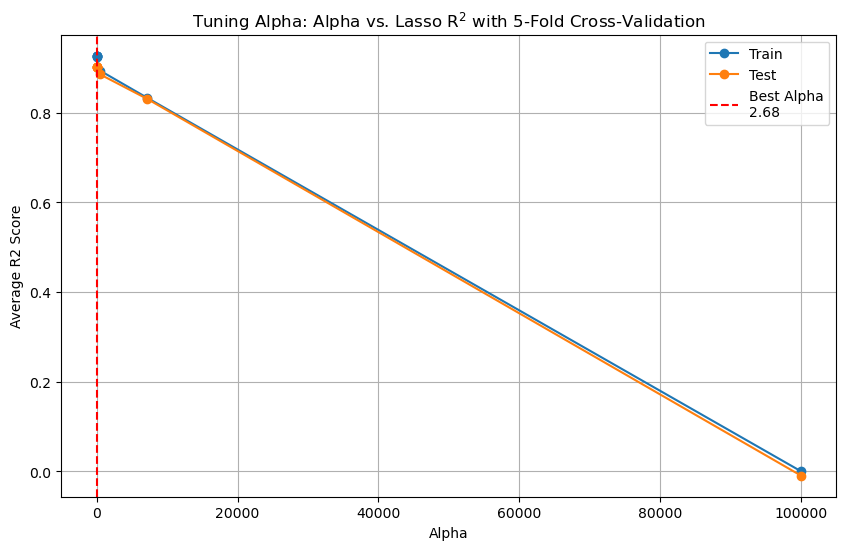

Best parameters: {'model__alpha': 2.6826957952797246}
Best R-squared: 0.9031935403920206


In [132]:
alpha_tune_plot(log_search_1)

In [146]:
np.linspace(0.2, 37, 20)

array([ 0.2       ,  2.13684211,  4.07368421,  6.01052632,  7.94736842,
        9.88421053, 11.82105263, 13.75789474, 15.69473684, 17.63157895,
       19.56842105, 21.50526316, 23.44210526, 25.37894737, 27.31578947,
       29.25263158, 31.18947368, 33.12631579, 35.06315789, 37.        ])

In [139]:
thirty_search_1 = GridSearchCV(pipeline_1,
                     {'model__alpha': np.linspace(0.2, 37, 20)},
                     cv = 5,
                     scoring = 'r2',
                    return_train_score=True,
                     verbose = 1)
thirty_search_1.fit(X, y)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.032e+11, tolerance: 1.090e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.115e+11, tolerance: 1.096e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'HeatingQC'...
                                                                    'TotRmsAbvGrd', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': array([ 0.2       ,  2.13684211,  4.07368421,  6.01052632,  7.94736842,
        9.88421053, 11.82105263, 13.75789474, 15.69473684, 17.63157895,
       19.56842105, 21.50526316, 23.44210526, 25.37894737, 27.31578947,
       29.25263158, 31.18947368, 33.12631579, 35.06315789, 37.        ])},
             return_train_score=True, scoring='r2', verbose=1)

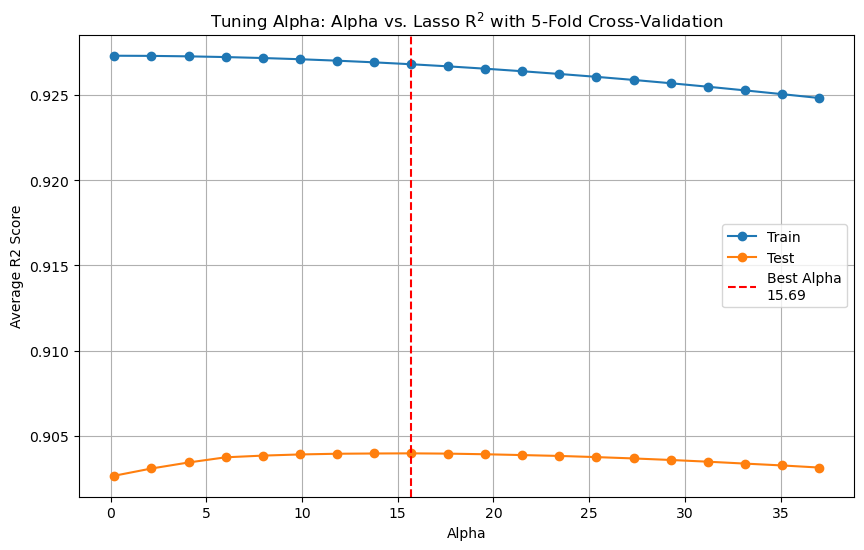

Best parameters: {'model__alpha': 15.69473684210526}
Best R-squared: 0.9039786090739014


In [147]:
alpha_tune_plot(thirty_search_1)

In [148]:
fourteen_search_1 = GridSearchCV(pipeline_1,
                     {'model__alpha': range(14, 18)},
                     cv = 5,
                     scoring = 'r2',
                    return_train_score=True,
                     verbose = 1)
fourteen_search_1.fit(X, y)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler',
                                        SubsetScaler(cols_to_scale=['GrLivArea',
                                                                    'LotFrontage',
                                                                    'LotArea',
                                                                    'Utilities',
                                                                    'LandSlope',
                                                                    'OverallQual',
                                                                    'OverallCond',
                                                                    'YearBuilt',
                                                                    'YearRemodAdd',
                                                                    'MasVnrArea',
                                                                    'ExterQual',
                                                                    'ExterCond',
                                                                    'BsmtQual',
                                                                    'BsmtCond',
                                                                    'BsmtExposure',
                                                                    'BsmtFinType1',
                                                                    'BsmtFinSF1',
                                                                    'BsmtFinType2',
                                                                    'BsmtFinSF2',
                                                                    'BsmtUnfSF',
                                                                    'HeatingQC',
                                                                    '2ndFlrSF',
                                                                    'LowQualFinSF',
                                                                    'BsmtHalfBath',
                                                                    'FullBath',
                                                                    'HalfBath',
                                                                    'BedroomAbvGr',
                                                                    'KitchenAbvGr',
                                                                    'KitchenQual',
                                                                    'TotRmsAbvGrd', ...])),
                                       ('model', Lasso(max_iter=10000))]),
             param_grid={'model__alpha': range(14, 18)},
             return_train_score=True, scoring='r2', verbose=1)

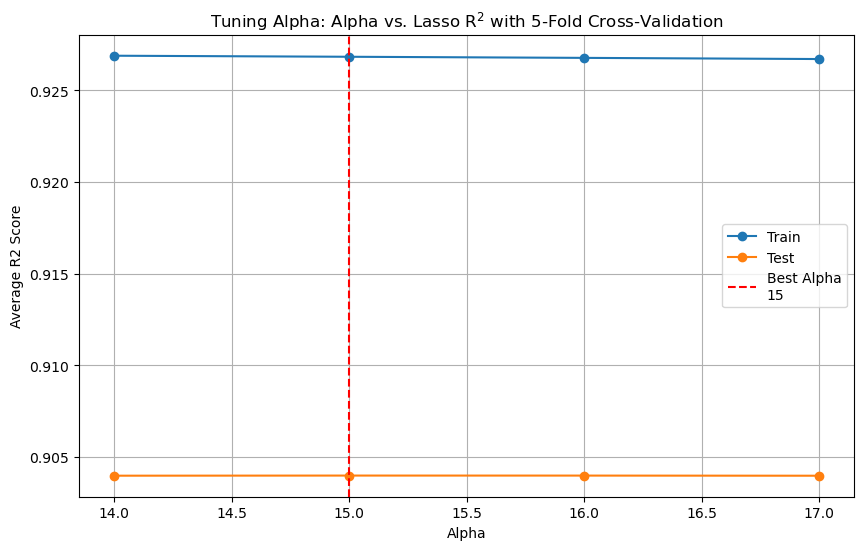

Best parameters: {'model__alpha': 15}
Best R-squared: 0.9039784201188527


In [149]:
alpha_tune_plot(fourteen_search_1)

### Good alpha candidate: 15

In [155]:
lasso_coefs_1 = fourteen_search_1.best_estimator_[1].coef_
feature_names_1 = X.columns 
zero_coef_features_1 = [feature_names_1[i] for i in range(len(lasso_coefs_1)) if lasso_coefs_1[i] == 0]

print(f"Number of features shrunk to zero: {len(zero_coef_features_1)}")
print("Features shrunk to zero by Lasso:")
for feature in zero_coef_features_1:
    print(feature)

Number of features shrunk to zero: 3
Features shrunk to zero by Lasso:
LotFrontage
ExterCond
MSSubClass_20


In [156]:
non_zero_coef_features_1 = [feature_names_1[i] for i in range(len(lasso_coefs_1)) if lasso_coefs_1[i] != 0]
print(f"Number of features not shrunk to zero: {len(non_zero_coef_features_1)}")
print("Features not shrunk to zero by Lasso:")
for feature in non_zero_coef_features_1:
    print(feature)

Number of features not shrunk to zero: 152
Features not shrunk to zero by Lasso:
GrLivArea
LotArea
Utilities
LandSlope
OverallQual
OverallCond
YearBuilt
YearRemodAdd
MasVnrArea
ExterQual
BsmtQual
BsmtCond
BsmtExposure
BsmtFinType1
BsmtFinSF1
BsmtFinType2
BsmtFinSF2
BsmtUnfSF
HeatingQC
2ndFlrSF
LowQualFinSF
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
KitchenQual
TotRmsAbvGrd
Functional
Fireplaces
FireplaceQu
GarageYrBlt
GarageFinish
GarageCars
GarageArea
GarageCond
OpenPorchSF
EnclosedPorch
3SsnPorch
ScreenPorch
PoolArea
PoolQC
TotalBath
TotalSF
HQSF
BedxBath
RoomsxBath
FireplaceYN
TotalPorchSF
Alley_No Alley
Alley_Pave
BldgType_1Fam
BldgType_2fmCon
BldgType_Twnhs
CentralAir_N
CentralAir_Y
Condition1_Artery
Condition1_Feedr
Condition1_Norm
Condition1_PosA
Condition1_PosN
Condition1_RRAe
Condition2_PosA
Condition2_PosN
Electrical_SBrkr
Exterior1st_BrkFace
Exterior1st_HdBoard
Exterior1st_MetalSd
Exterior1st_Stucco
Exterior1st_VinylSd
Exterior1st_Wd Sdng
Exterior2nd_AsbShng
Ex

In [157]:
print(X.columns) #155 features
len(X.columns)

Index(['GrLivArea', 'LotFrontage', 'LotArea', 'Utilities', 'LandSlope', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       ...
       'RoofStyle_Mansard', 'SaleCondition_Abnorml', 'SaleCondition_Family', 'SaleCondition_Partial', 'SaleType_COD', 'SaleType_WD ', 'YrSold_2006', 'YrSold_2007', 'YrSold_2009', 'YrSold_2010'], dtype='object', length=155)


155

### Lasso Path Plot-
all 80 coefficients featured here would eventually be lassoed down to 0

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.145e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.066e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.458e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.020e+10, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.771e+09, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

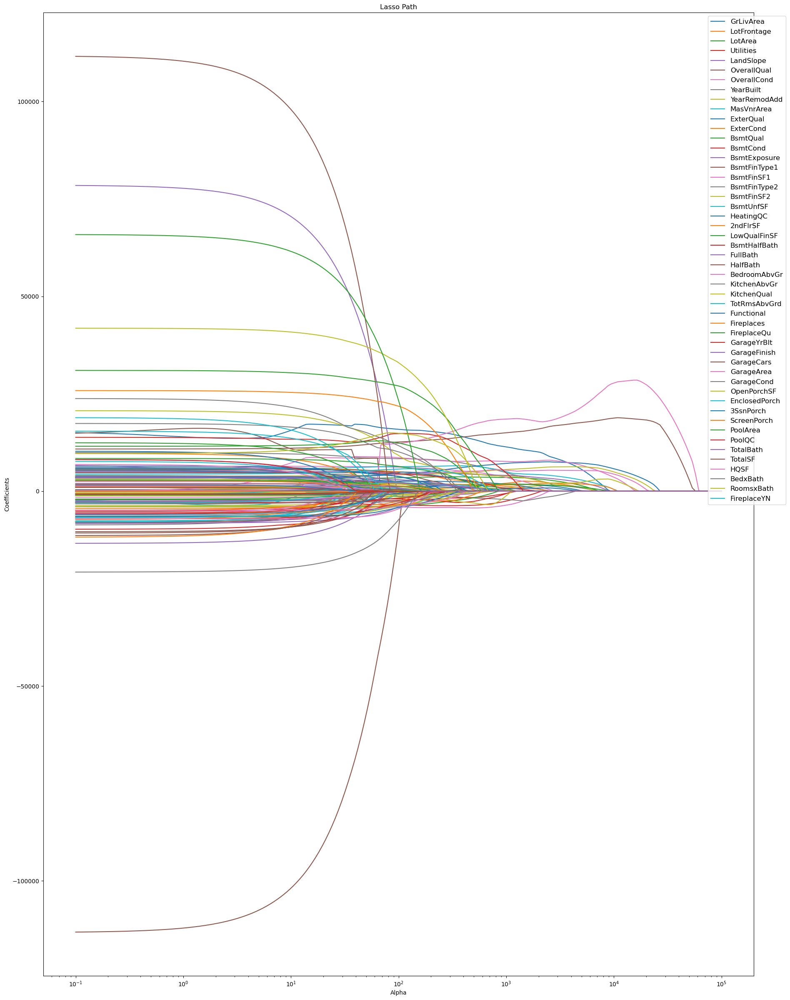

In [158]:
#Lasso Coefficient Plot- way to make this look a bit nicer?

numeric_scaler = SubsetScaler(cols_to_scale1)
X_scaled = numeric_scaler.fit_transform(X)

#Alphas
alphas = np.logspace(-1, 5, 200)

#Store Coefficients
coefs = []
for alpha in alphas:
    model = Lasso(alpha = alpha, max_iter=10000)
    model.fit(X_scaled, y)
    coefs.append(model.coef_)

#Plot
plt.figure(figsize=(22, 30))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Coefficients')
plt.title('Lasso Path')
plt.axis('tight')

plt.legend(X.columns[:50], loc='upper right', bbox_to_anchor=(1.05, 1), fontsize='large')
plt.show()


## More legible

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.145e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.066e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.458e+11, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.020e+10, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.771e+09, tolerance: 1.452e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

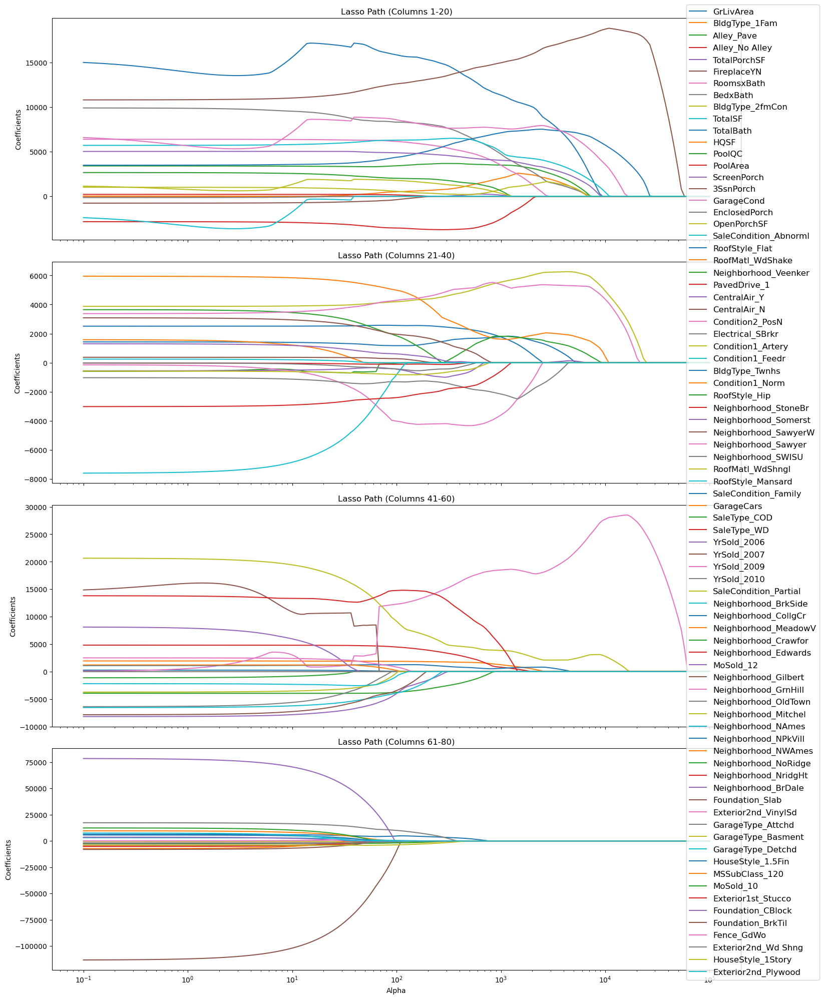

In [159]:
# Define the number of subplots and the number of columns per subplot
num_subplots = 4
cols_per_subplot = 20

# Calculate the total number of columns
total_cols = len(X.columns)

# Calculate the number of columns per subplot
cols_per_subplot = min(cols_per_subplot, total_cols // num_subplots)

# Alphas
alphas = np.logspace(-1, 5, 200)

# Store Coefficients
coefs = []
for alpha in alphas:
    model = Lasso(alpha=alpha, max_iter=10000)
    model.fit(X_scaled, y)
    coefs.append(model.coef_)

# Calculate the order in which features become zero coefficients for each alpha
zero_coef_order = np.argsort(np.argmax(np.abs(coefs) == 0, axis=1))

# Reorder the columns based on the zero coefficient order
sorted_columns = [col for _, col in sorted(zip(zero_coef_order, X.columns))]

# Create subplots
fig, axes = plt.subplots(num_subplots, 1, figsize=(15, 20), sharex=True)

# Plot each subset of columns on a separate subplot
legend_labels = []
for i, ax in enumerate(axes):
    start_idx = i * cols_per_subplot
    end_idx = min((i + 1) * cols_per_subplot, total_cols)
    lines = ax.plot(alphas, np.array(coefs)[:, start_idx:end_idx])
    legend_labels.extend(lines)
    ax.set_xscale('log')
    ax.set_ylabel('Coefficients')
    ax.set_title(f'Lasso Path (Columns {start_idx + 1}-{end_idx})')

# Set common x-axis label
axes[-1].set_xlabel('Alpha')

# Create a common legend outside of the subplots
fig.legend(legend_labels, sorted_columns[:total_cols], loc='upper right', bbox_to_anchor=(1.1, 1), fontsize='large')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

## Run Lasso with Remaining Non-zero features, best alpha

In [164]:
#Applying best alpha with kfold5 and dropping coefficients that dropped to 0.
#Now running lasso with the best parameters (alpha) and the most relevant features.

#Redefine here for clarity:
X = ames_lasso_encoded_nodrop.drop(columns = ['PID', 'SalePrice'], axis = 1)
X = X.drop(columns = zero_coef_features)
y = ames_lasso_encoded_nodrop['SalePrice']

#Store info about residuals to plot

all_y_pred = []
all_y_actual = []
residuals = []

# Initialize the KFold cross-validator
kf = KFold(n_splits=5, shuffle=True, random_state=0)

# Initialize a StandardScaler
scaler = StandardScaler()

# Initialize Lasso with optimized alpha 15
lasso = Lasso(alpha=15, random_state=0, max_iter= 10000)

# Lists to store RMSE and R2 scores for each fold
rmse_scores = []
r2_scores = []

# KFold cross-validation
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Scaling features
    X_train_scaled = scaler.fit_transform(X_train[cols_to_scale1])
    X_test_scaled = scaler.transform(X_test[cols_to_scale1])

    # Fit Lasso model
    lasso.fit(X_train_scaled, y_train)

    # Make predictions
    y_pred = lasso.predict(X_test_scaled)

    #Residuals info to plot
    all_y_pred.extend(y_pred)
    all_y_actual.extend(y_test.values)
    residuals.extend(y_test.values - y_pred)
    
    # Calculate RMSE and R2 for this fold and store them
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    # Print RMSE and R2 for each fold
    print(f"Fold {train_index}: RMSE = {rmse:.4f}, R2 = {r2:.4f}")

# Calculate and print the mean RMSE and R2 across all folds
mean_rmse = np.mean(rmse_scores)
mean_r2 = np.mean(r2_scores)
print(f"\nMean RMSE: {mean_rmse:.4f}")
print(f"Mean R2: {mean_r2:.4f}")

Fold [   0    1    2 ... 2577 2578 2579]: RMSE = 25700.8365, R2 = 0.8955
Fold [   0    2    3 ... 2577 2578 2579]: RMSE = 30671.1479, R2 = 0.7846
Fold [   0    1    3 ... 2575 2576 2579]: RMSE = 22263.2546, R2 = 0.9187
Fold [   0    1    2 ... 2576 2577 2578]: RMSE = 22757.8694, R2 = 0.8941
Fold [   1    2    4 ... 2577 2578 2579]: RMSE = 29323.4472, R2 = 0.8660

Mean RMSE: 26143.3111
Mean R2: 0.8718


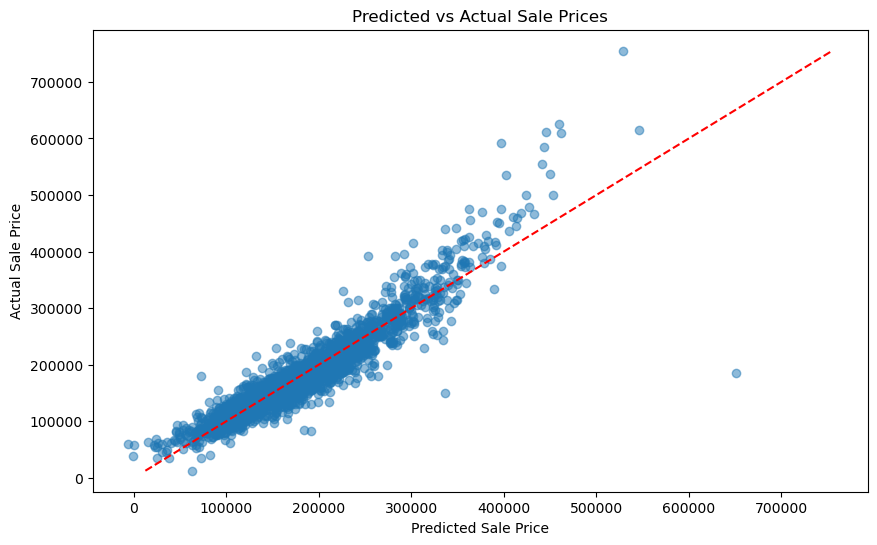

In [165]:
# Visualization of Predicted vs Actual Sale Prices
plt.figure(figsize=(10, 6))
plt.scatter(all_y_pred, all_y_actual, alpha=0.5)
plt.title('Predicted vs Actual Sale Prices')
plt.xlabel('Predicted Sale Price')
plt.ylabel('Actual Sale Price')
plt.plot([min(all_y_actual), max(all_y_actual)], [min(all_y_actual), max(all_y_actual)], color='red', linestyle='--')
plt.show()

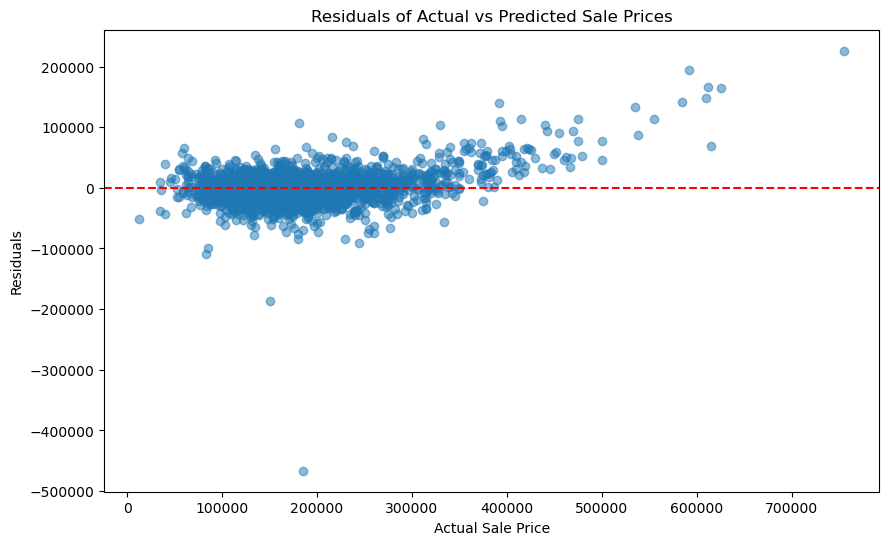

In [166]:
plt.figure(figsize=(10, 6))
plt.scatter(all_y_actual, residuals, alpha=0.5)
plt.title('Residuals of Actual vs Predicted Sale Prices')
plt.xlabel('Actual Sale Price')
plt.ylabel('Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.807e+11, tolerance: 1.090e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.510e+11, tolerance: 1.096e+09
  model = cd_fast.enet_coordinate_descent(
/Users/joesferra/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularis

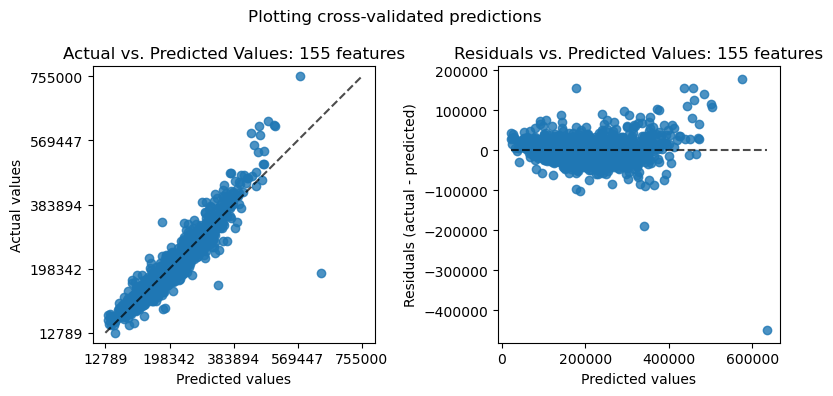

In [167]:
def lasso_residuals_plot(featurelist, x, y):
    myX = x[featurelist]
    myY = y
    
    scaler = SubsetScaler(cols_to_scale1)
    myX_scaled = scaler.fit_transform(myX)

    lasso = Lasso(alpha=20, random_state=0)
    
    y_pred = cross_val_predict(lasso, myX, myY, cv = 5)
    
    fig, axs = plt.subplots(ncols=2, figsize=(8, 4))
    PredictionErrorDisplay.from_predictions(
        y,
        y_pred=y_pred,
        kind="actual_vs_predicted",
        subsample=2580,
        ax=axs[0],
        random_state=0,
    )
    axs[0].set_title(f"Actual vs. Predicted Values: {len(featurelist)} features")
    PredictionErrorDisplay.from_predictions(
        y,
        y_pred=y_pred,
        kind="residual_vs_predicted",
        subsample=2580,
        ax=axs[1],
        random_state=0,
    )
    axs[1].set_title(f"Residuals vs. Predicted Values: {len(featurelist)} features")
    fig.suptitle("Plotting cross-validated predictions")
    plt.tight_layout()
    plt.show()

lasso_residuals_plot(non_zero_coef_features, X, y)

In [168]:
#Examine outliers
results_df = ames_lasso_encoded_nodrop.copy()
results_df['PredictedPrice'] = y_pred_total
results_df['Residuals'] = residuals_total

#Remove and store outliers
outlier_rows=results_df[abs(results_df['Residuals']) > 40000]

outliers_removed = results_df[abs(results_df['Residuals']) <= 40000]

In [169]:
def snshist(colname, framename, plotx = 14, ploty = 7, bins = 30): #detailed histogram
    "makes clean histograms with stats summaries:\
    colname: string of column name in chosen dataframe\
    framename: non-string, name of dataframe\
    plotx: horizontal size of plot\
    ploty: vertical size of plot\
    bins: binsinhistogram"
    
    col = framename[colname]
    
    mean = col.mean()
    median = col.median()
    mode = col.mode().values[0]
    plt.figure(figsize=(plotx, ploty))
    sns.histplot(x = col.values, bins=bins, kde=True, color='skyblue')
    plt.axvline(mean, color='r', linestyle='--', label=f"Mean: {mean:.2f}")
    plt.axvline(median, color='g', linestyle='-', label=f"Median: {median:.2f}")
    plt.axvline(mode, color='b', linestyle='-.', label=f"Mode: {mode:.2f}")
    
    plt.annotate(f"Skewness: {col.skew():.2f}\nKurtosis: {col.kurt():.2f}", xy = (.85, .1), xycoords = 'axes fraction',
                 fontsize = 14, bbox = dict(boxstyle="round,pad=.3", edgecolor="black", facecolor="aliceblue"))

    plt.title(f"Histogram of {colname} with KDE and Reference Lines")
    plt.xlabel(f"{colname}")
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

## Would like to say something smart about the outliers here

In [172]:
#What about these outlier homes lead to them being outliers?
outlier_rows.shape

(132, 277)

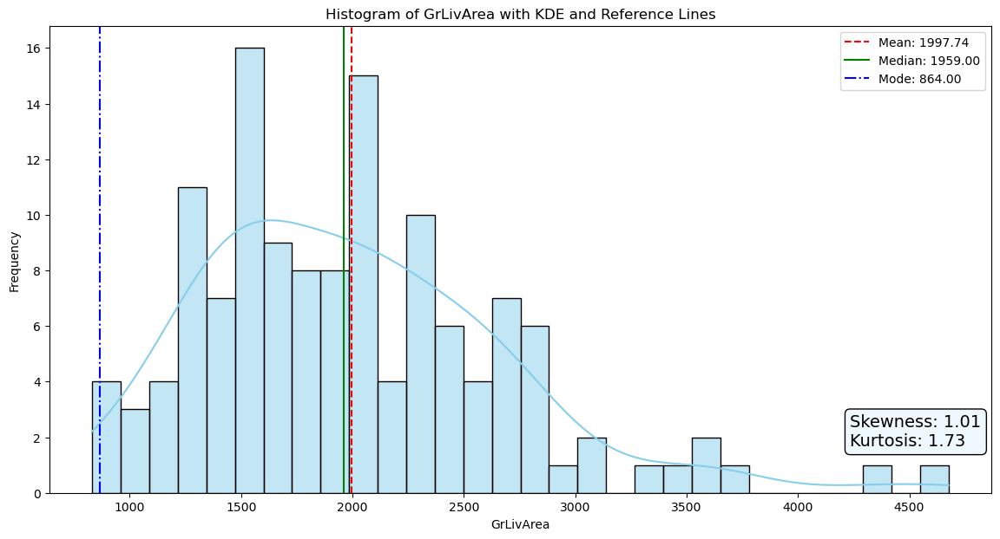

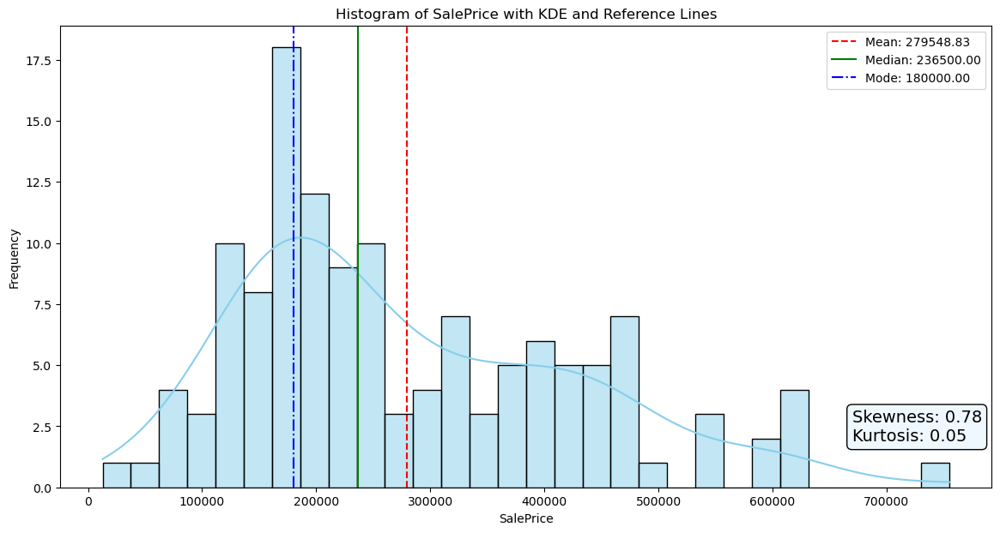

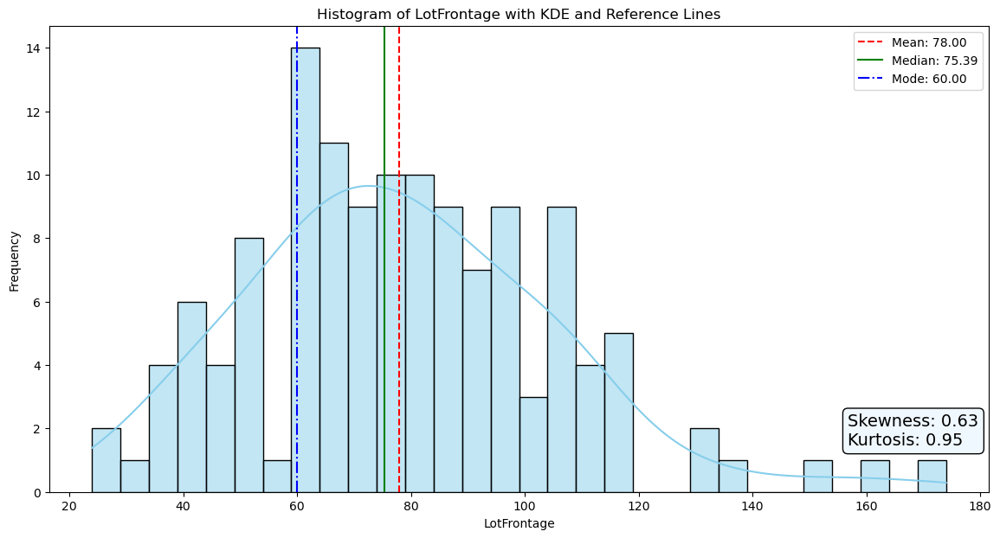

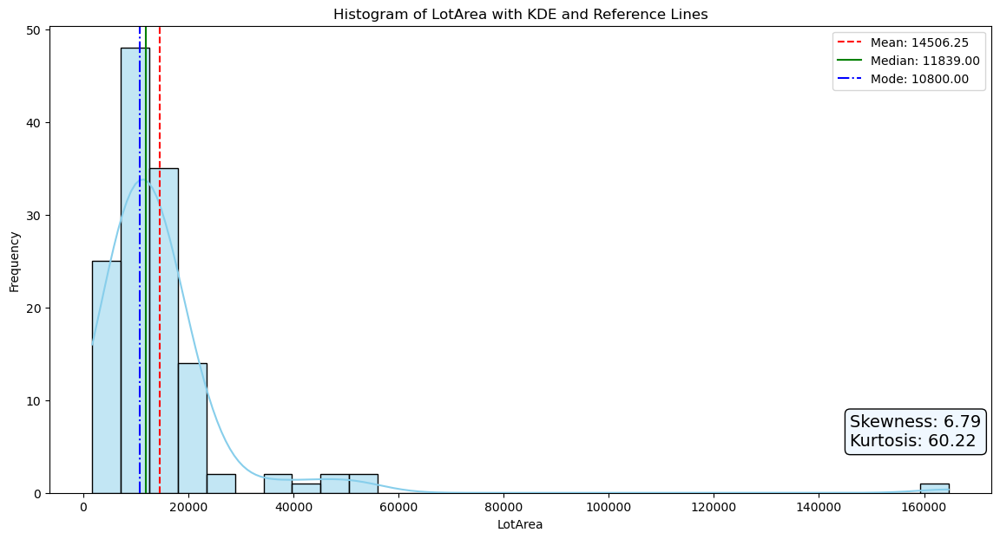

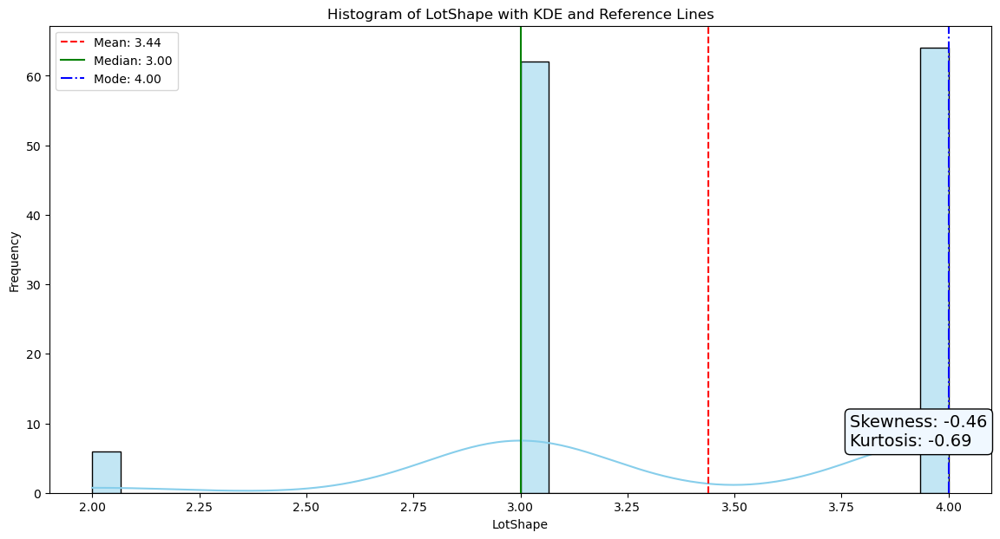

...

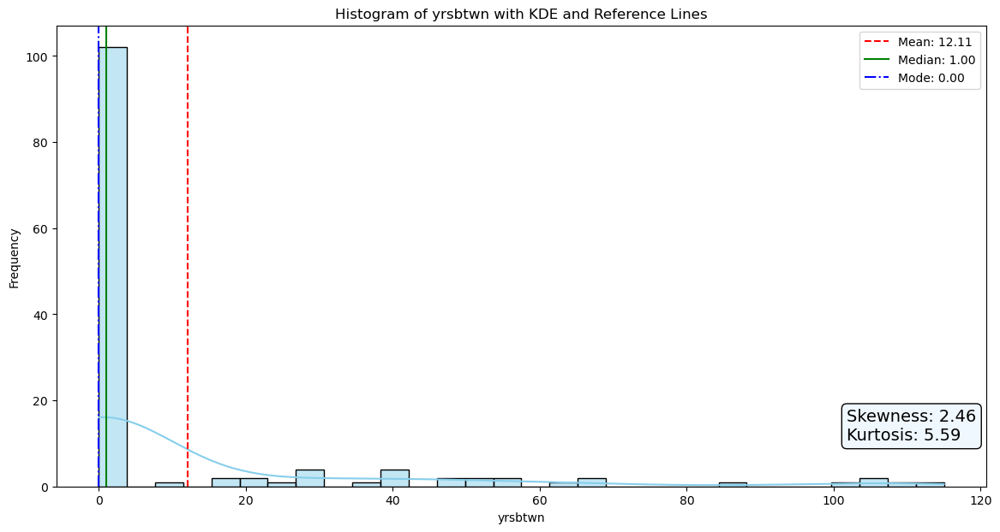

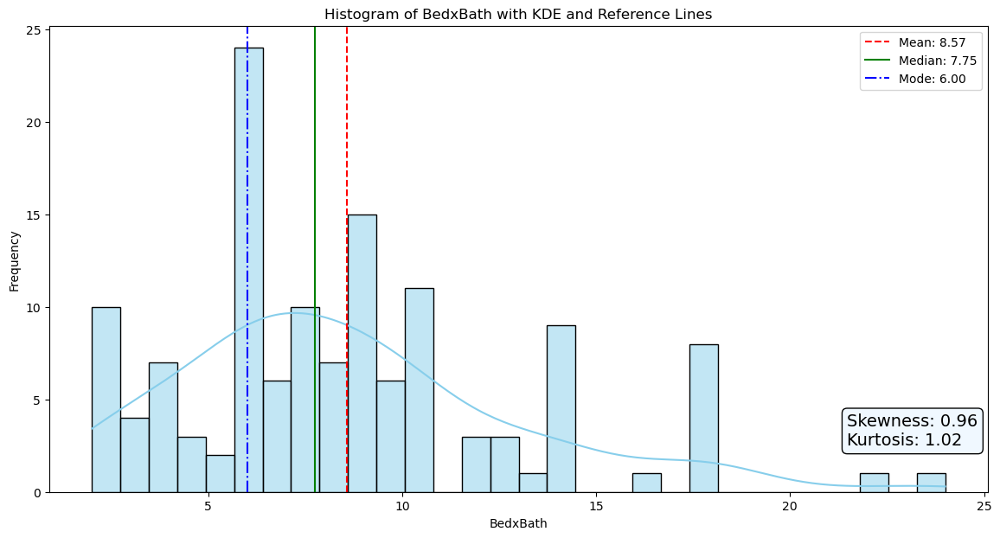

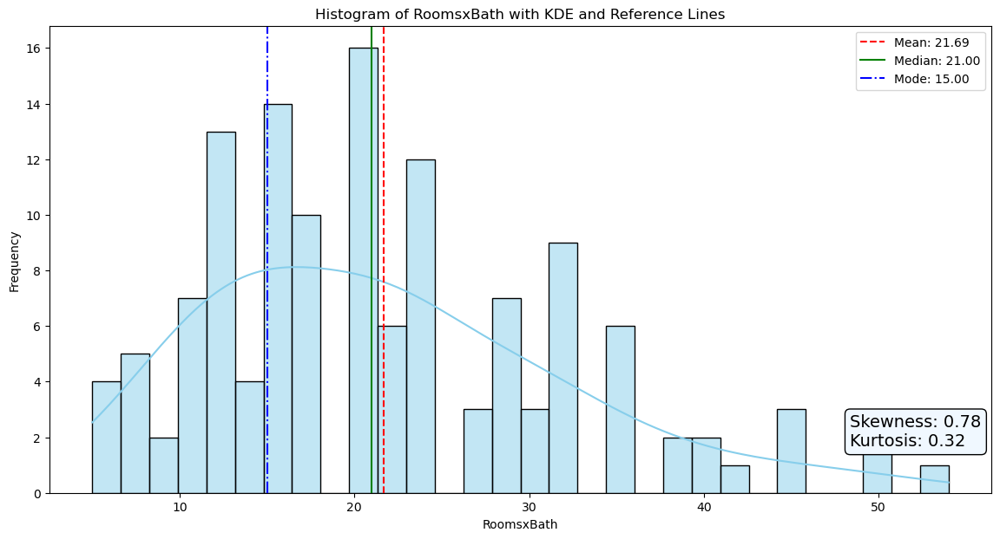

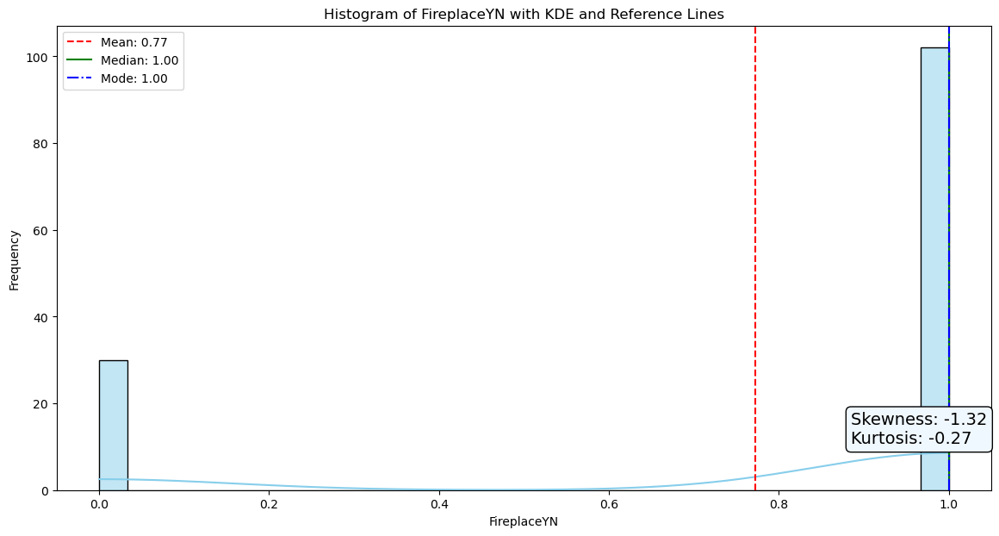

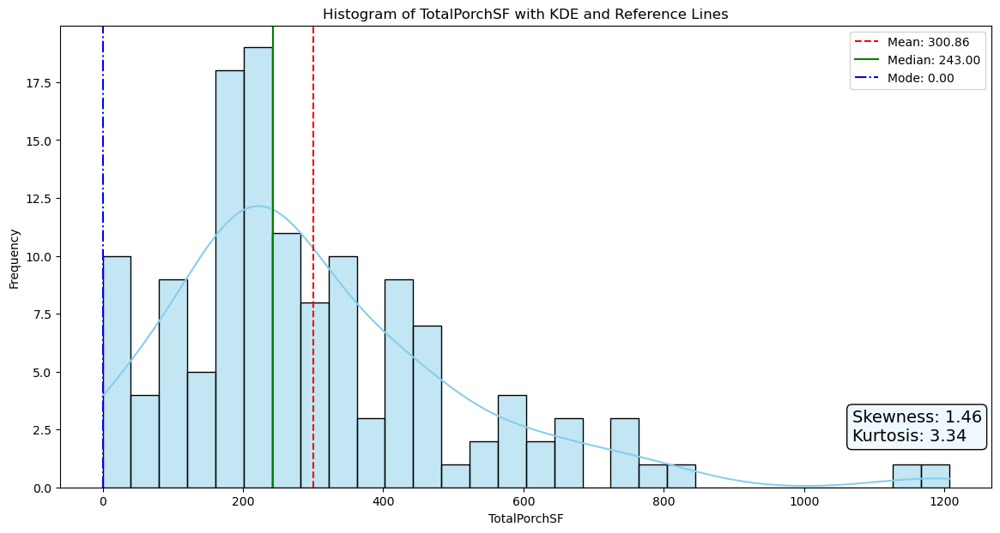

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


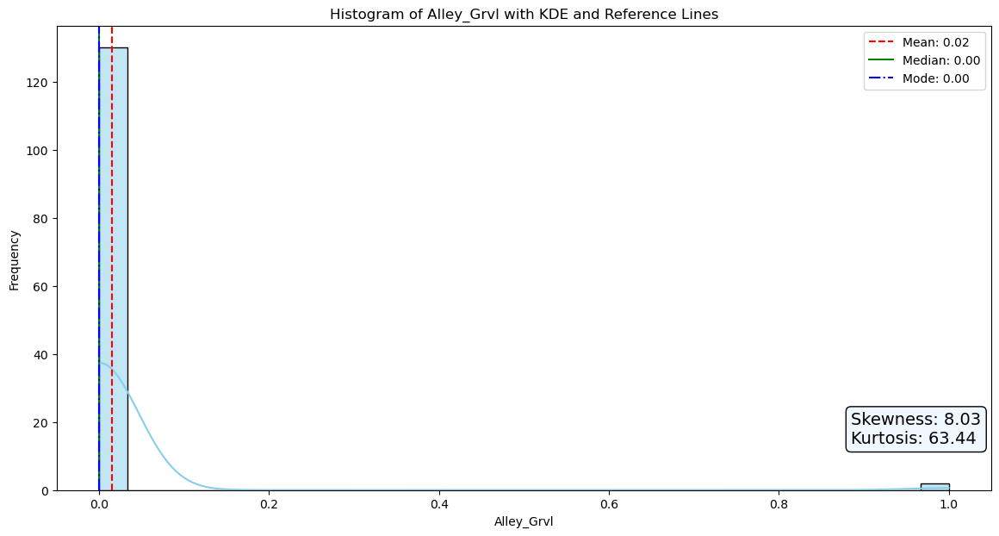

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


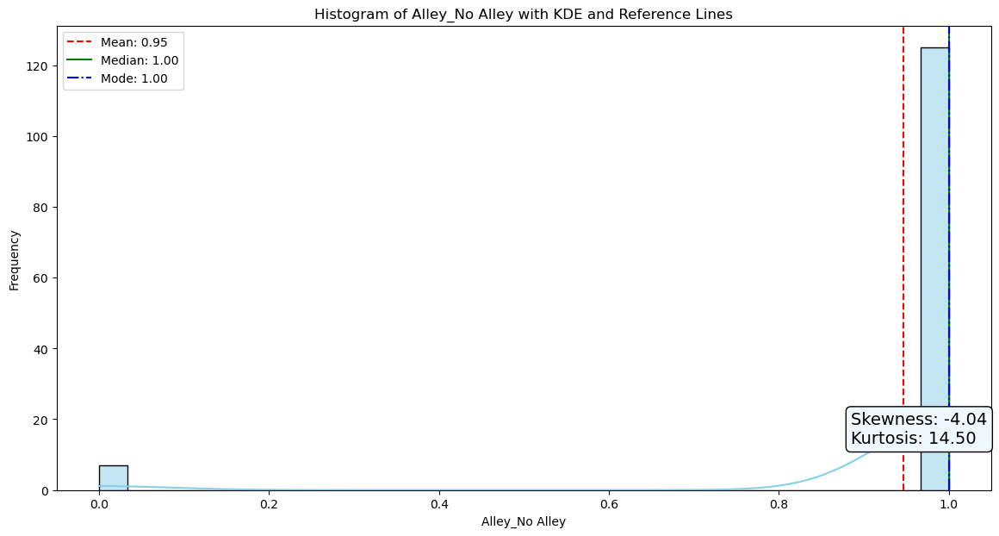

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


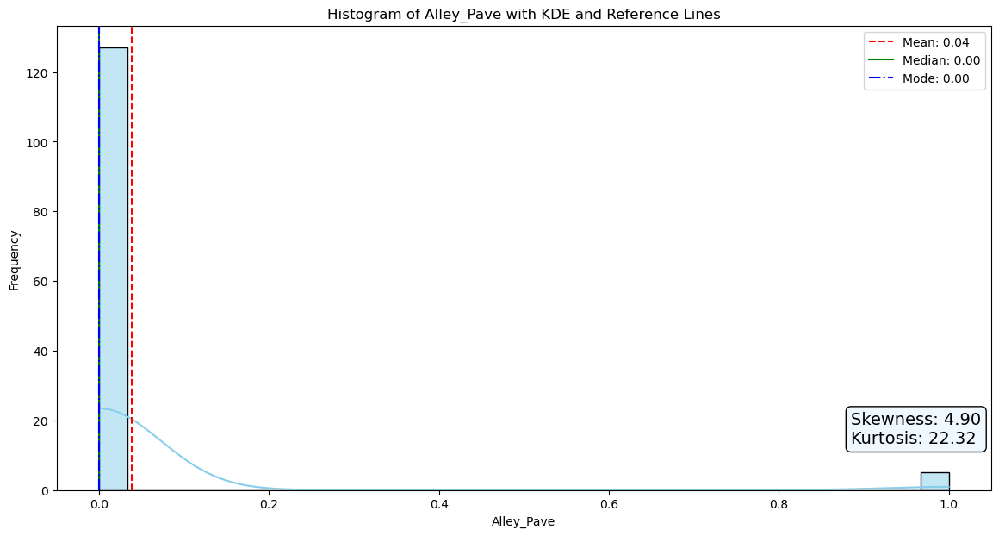

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


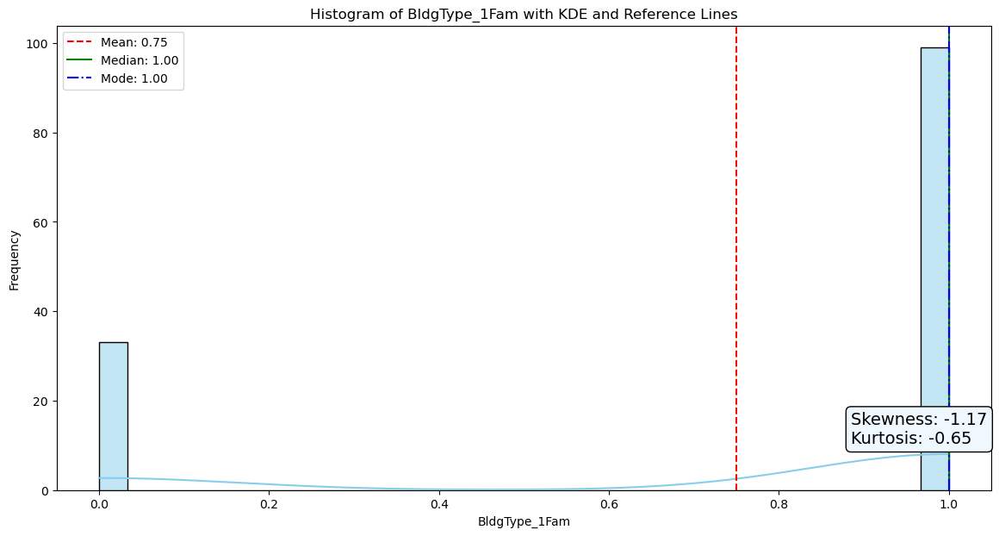

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


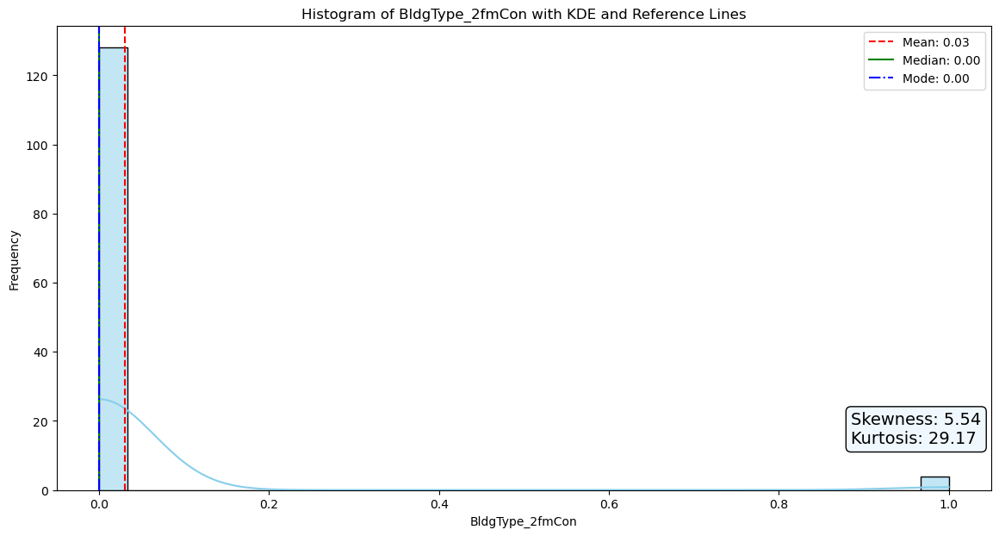

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


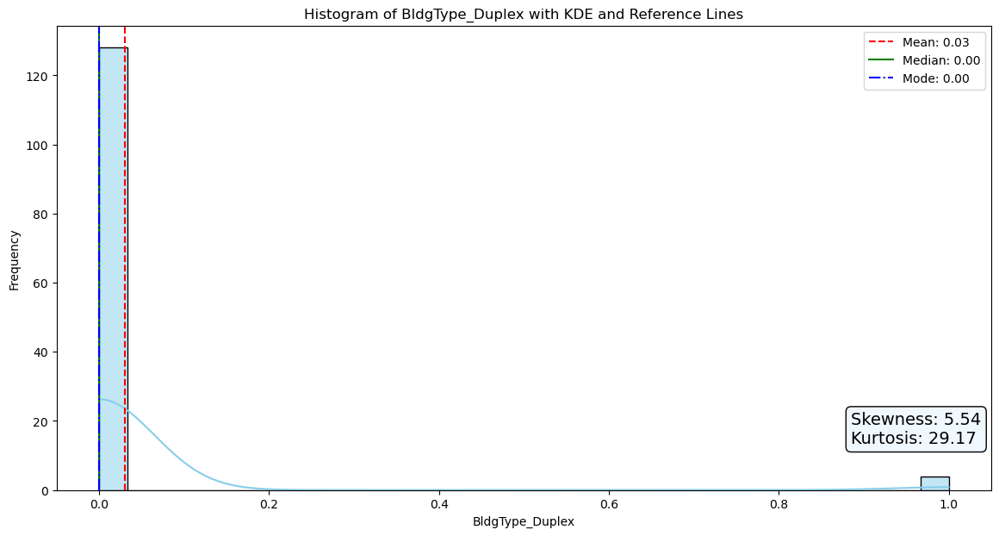

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


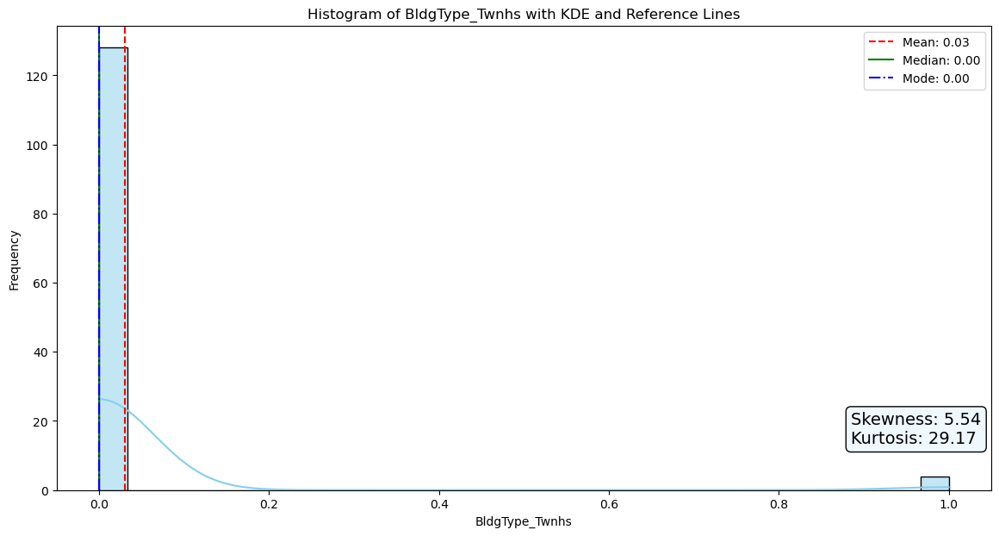

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


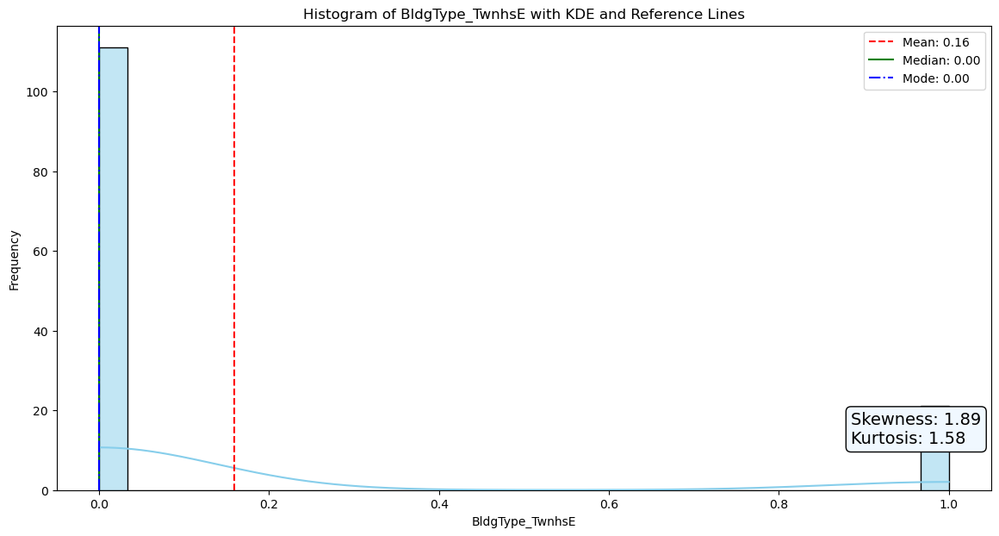

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


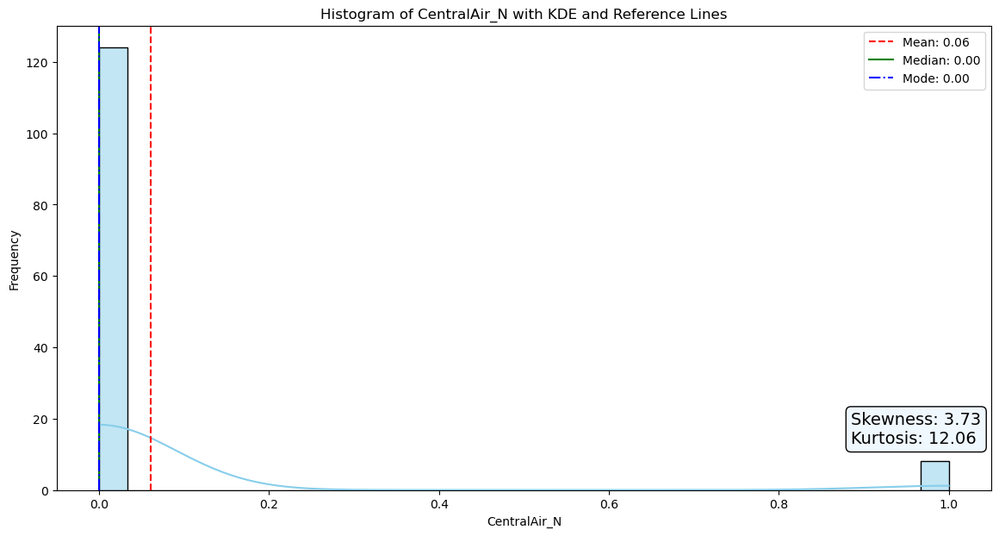

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


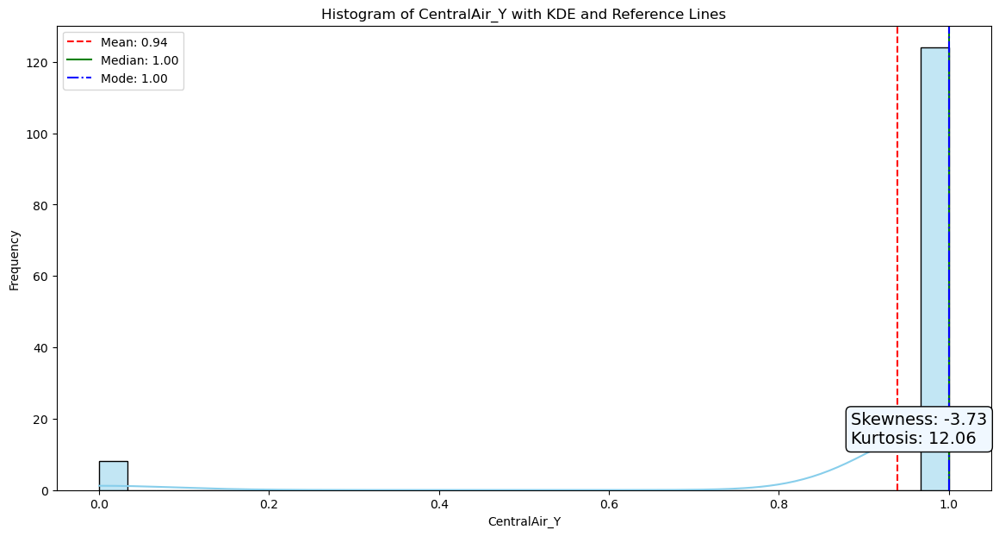

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


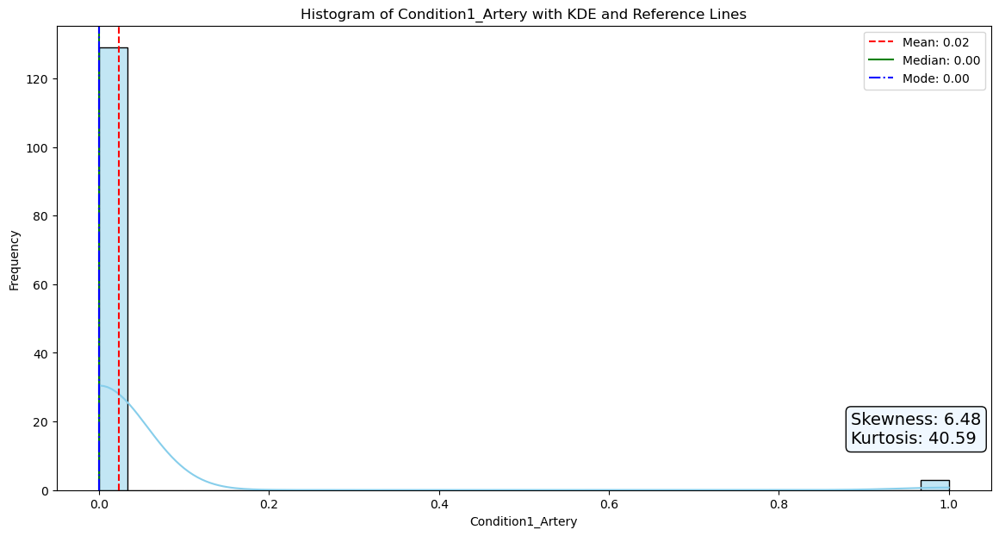

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


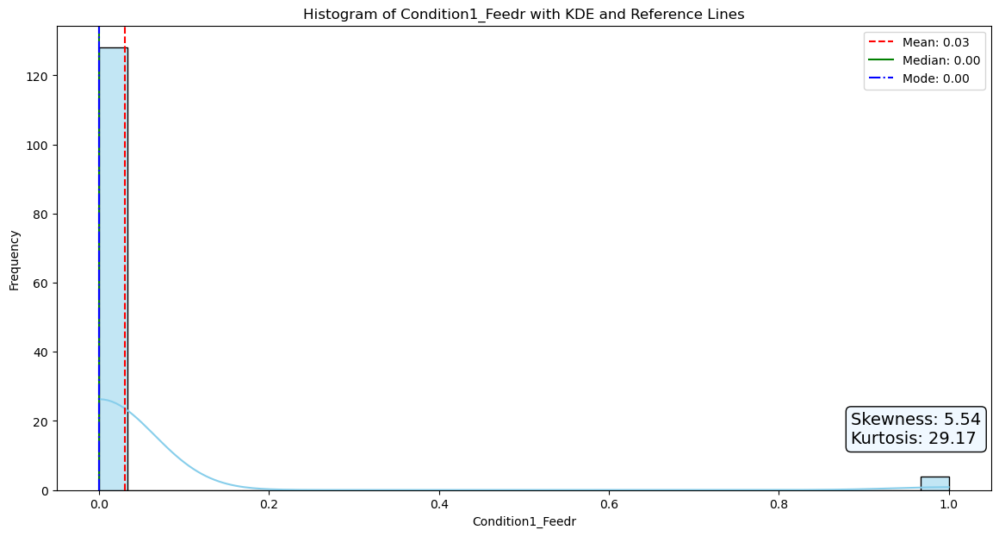

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


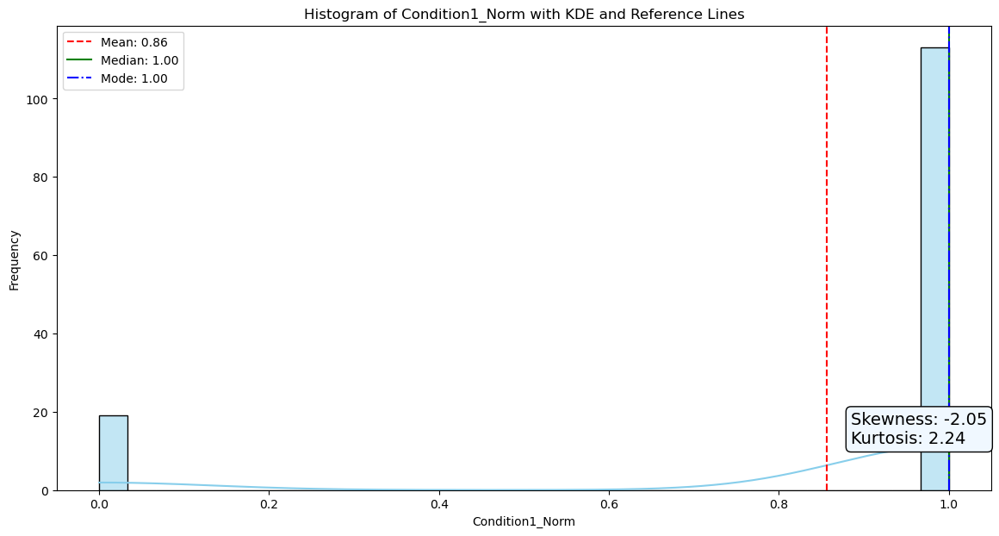

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


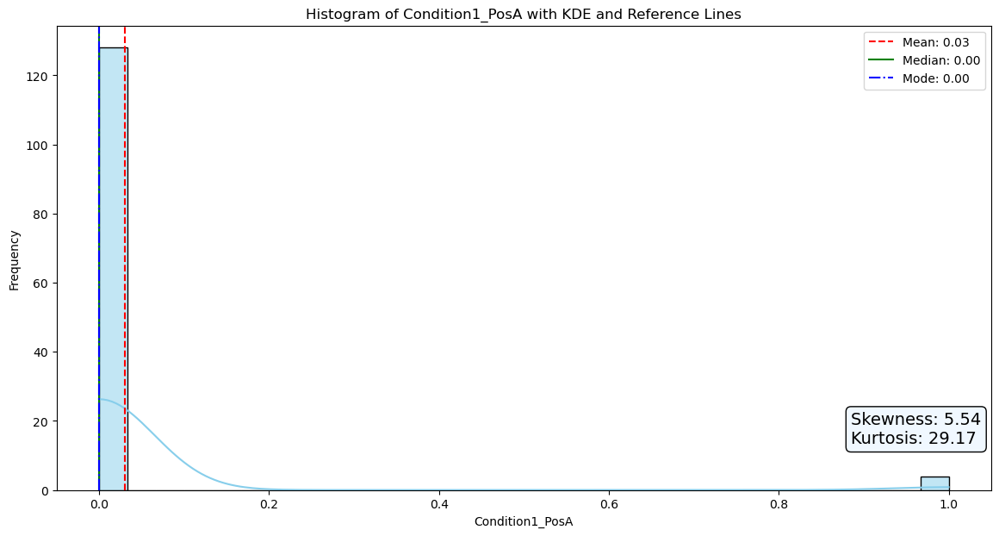

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


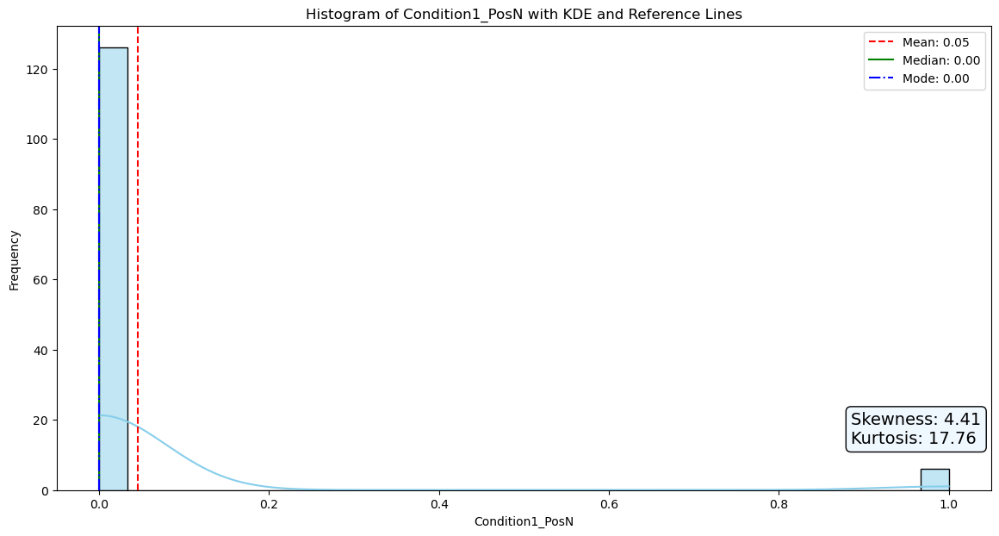

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


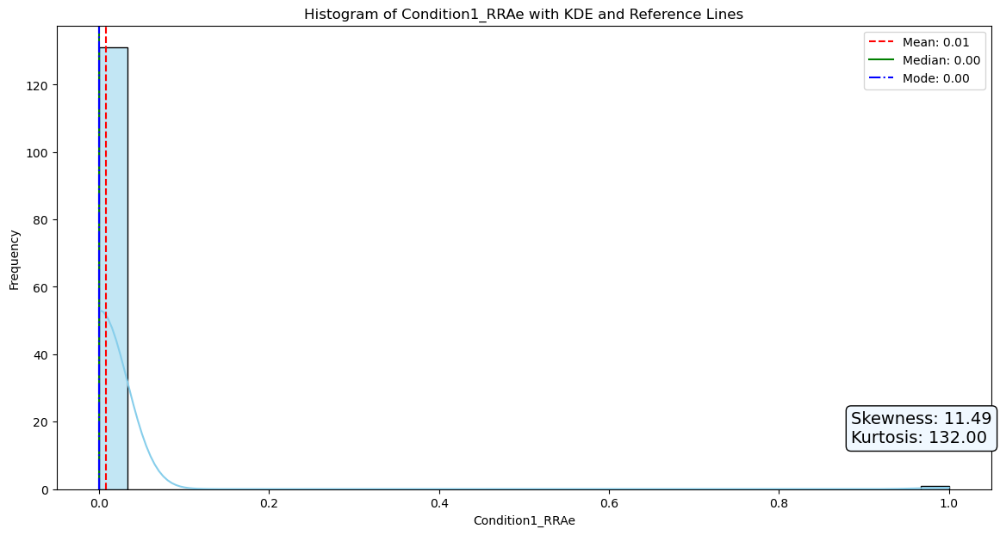

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


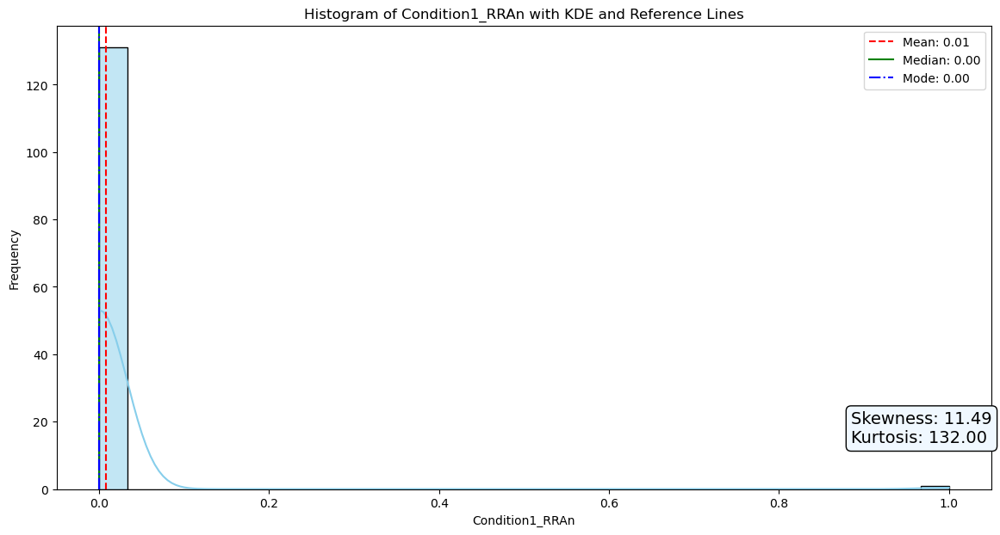

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


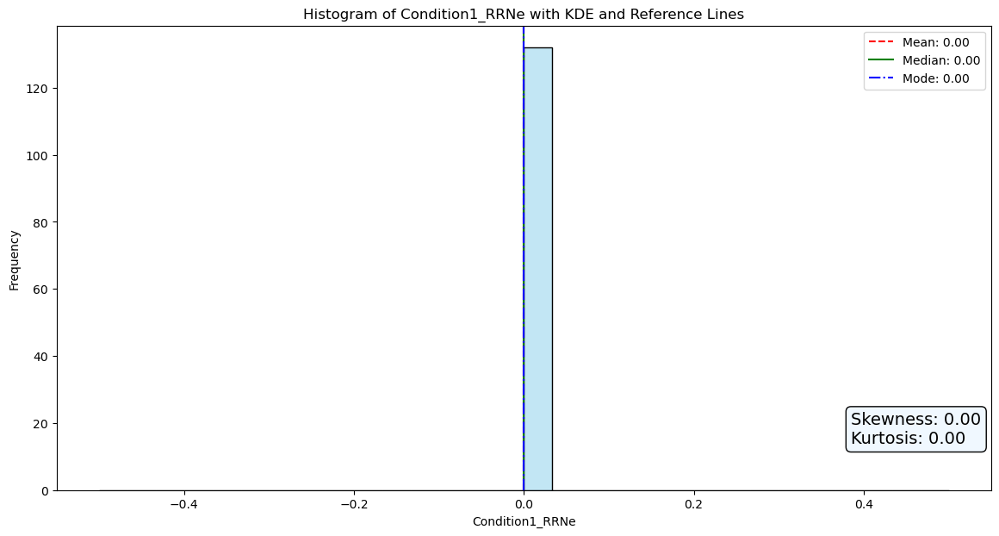

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


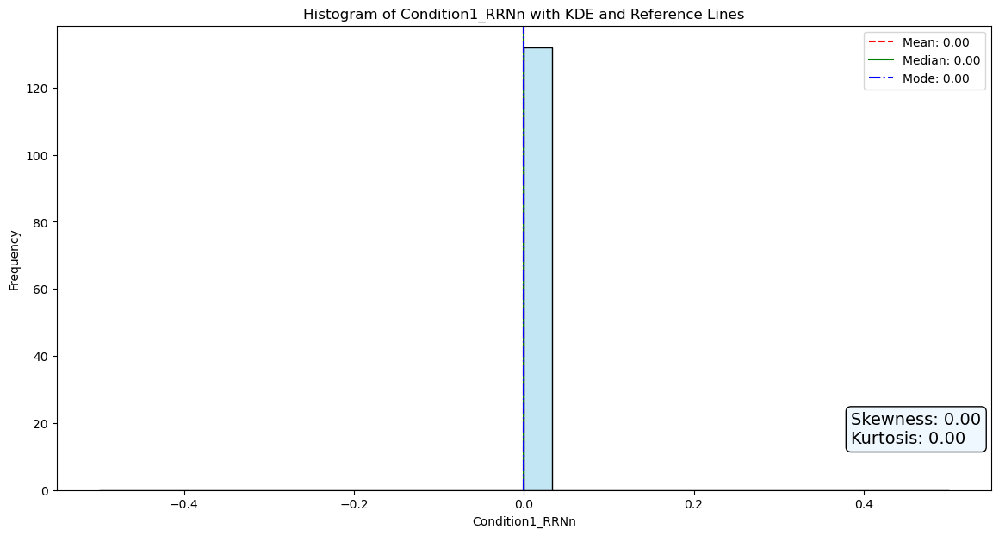

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


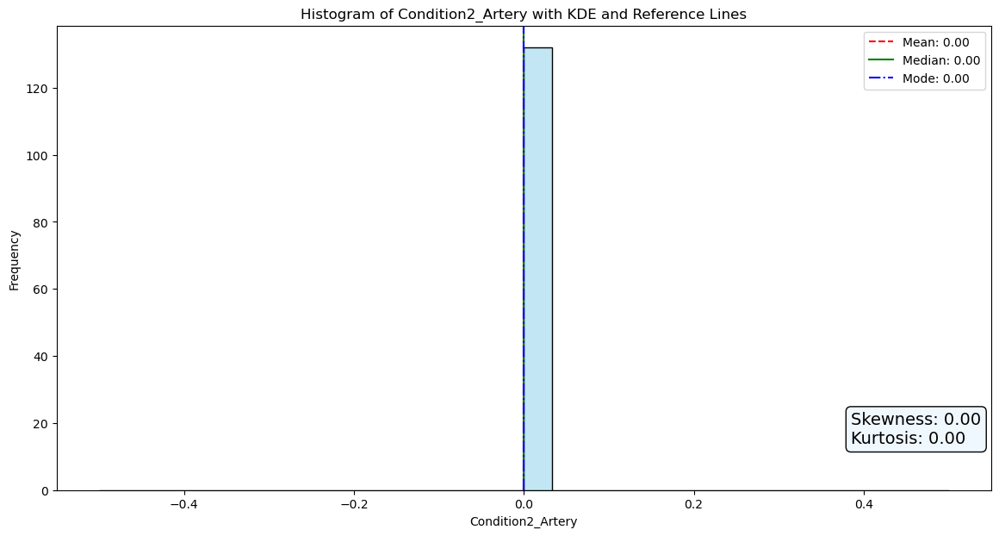

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


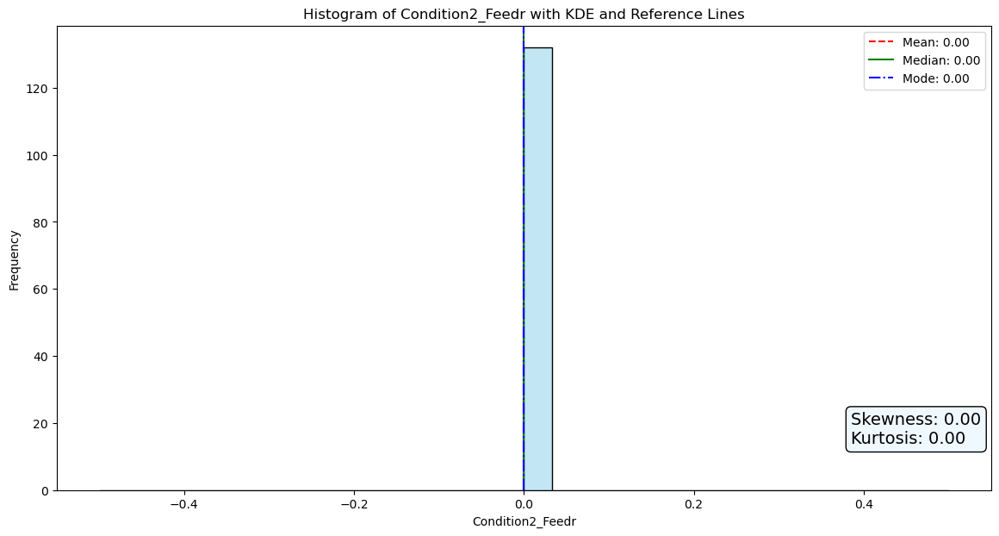

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


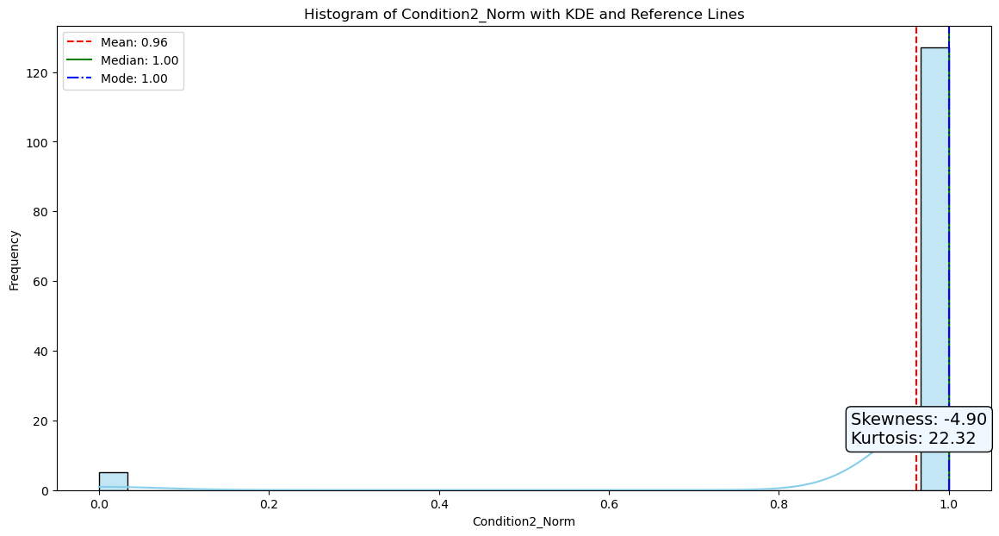

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


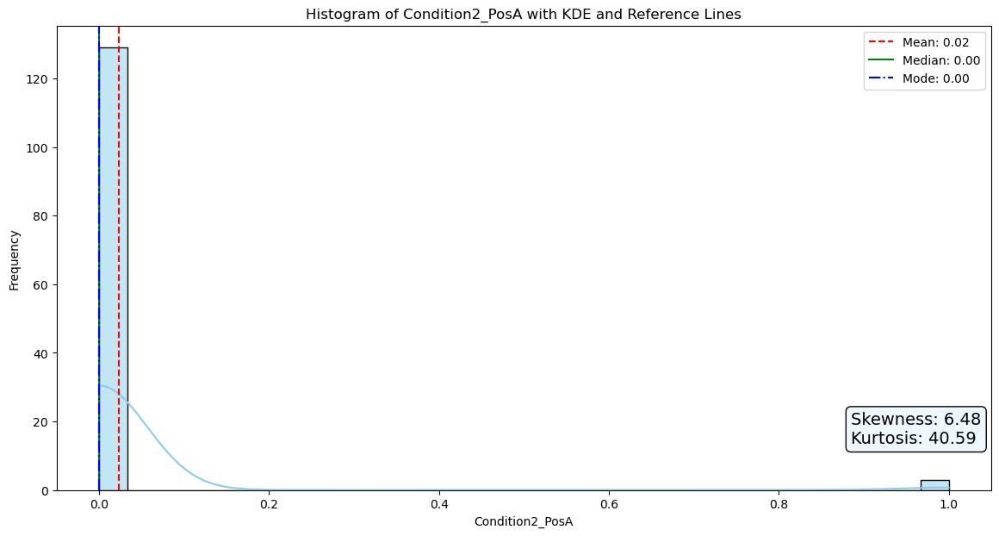

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


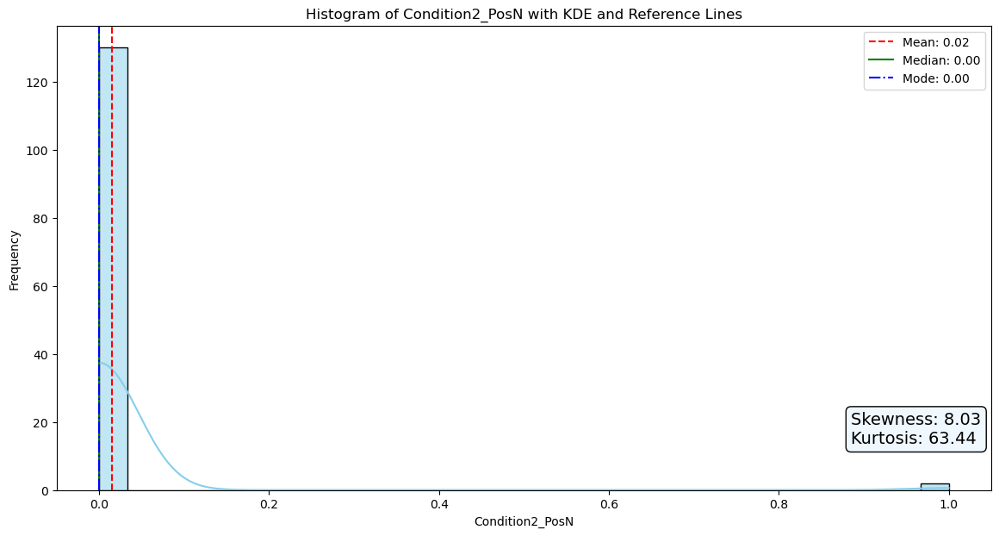

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


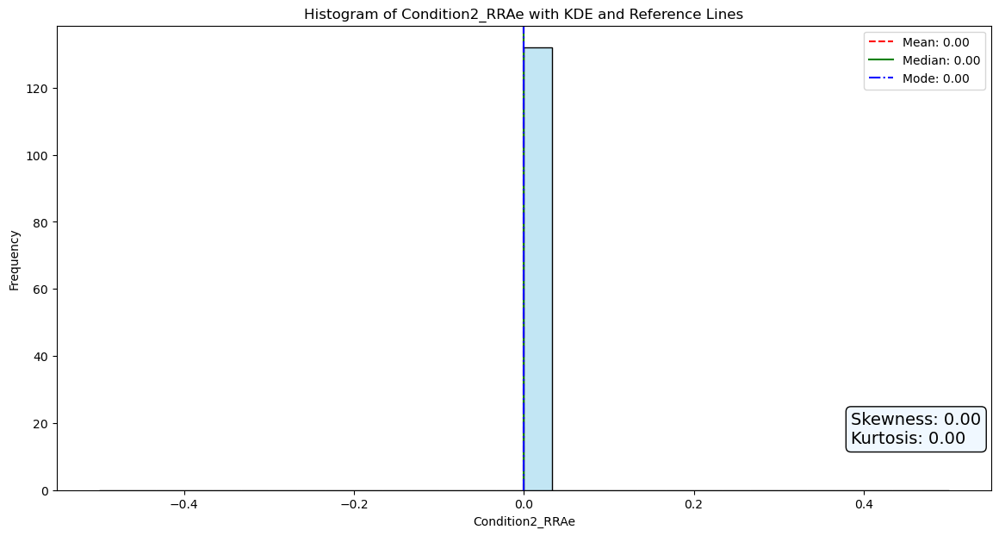

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


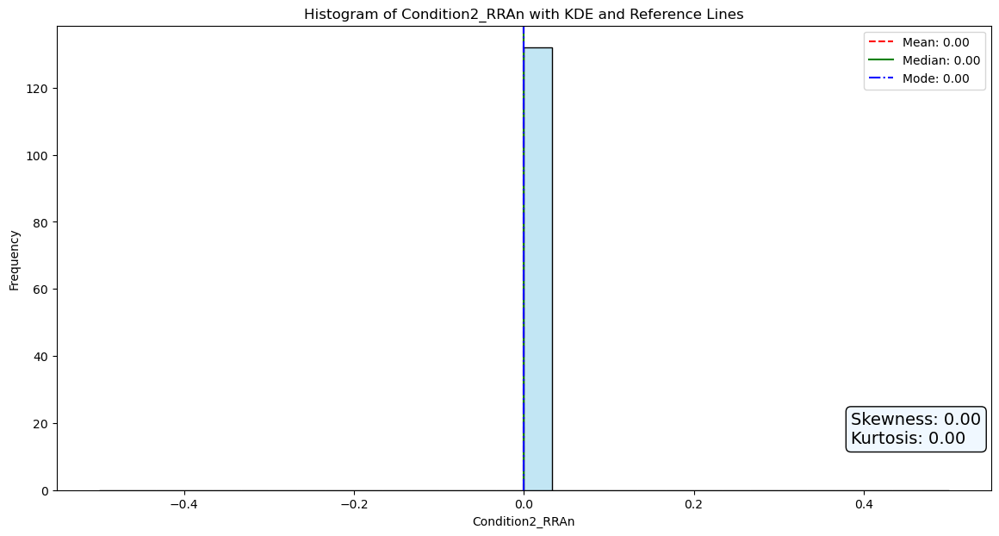

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


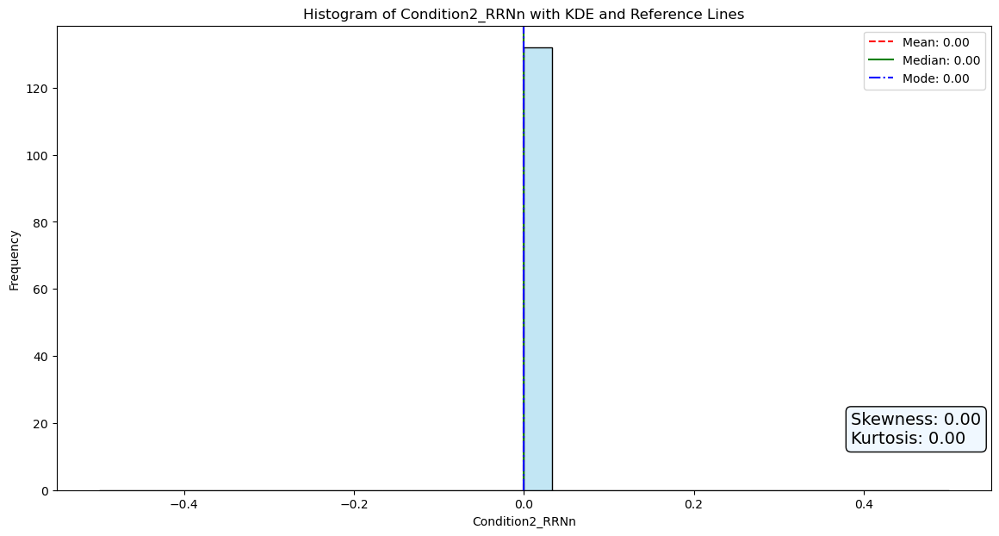

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


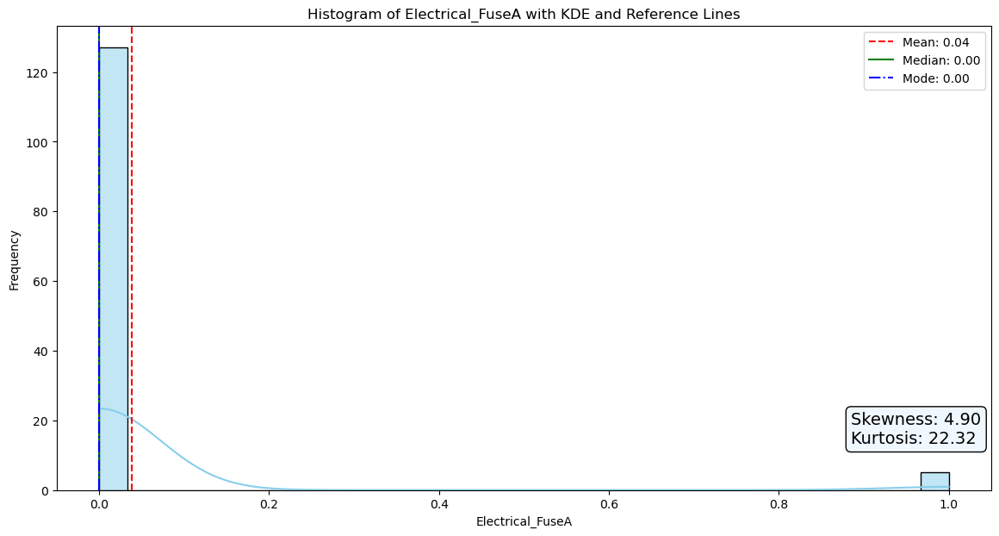

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


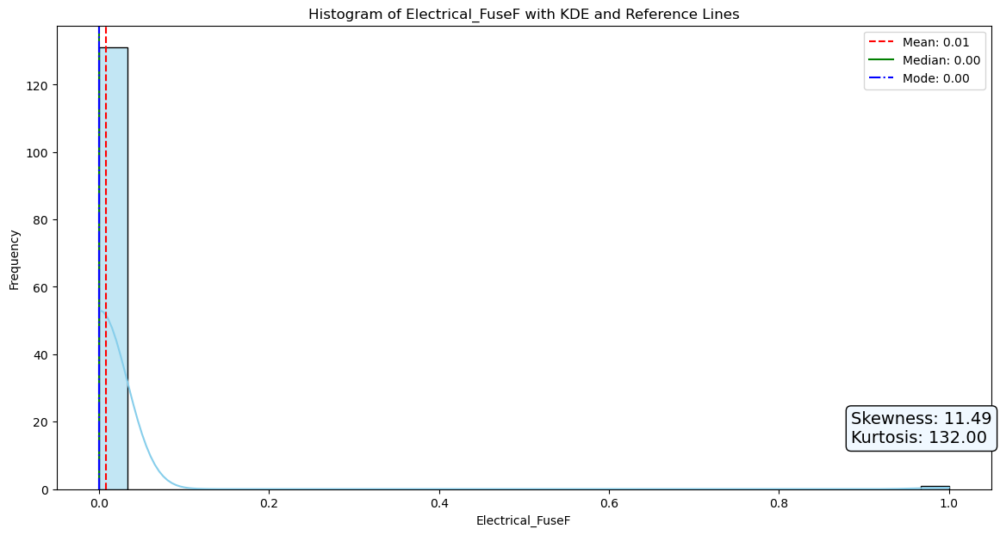

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


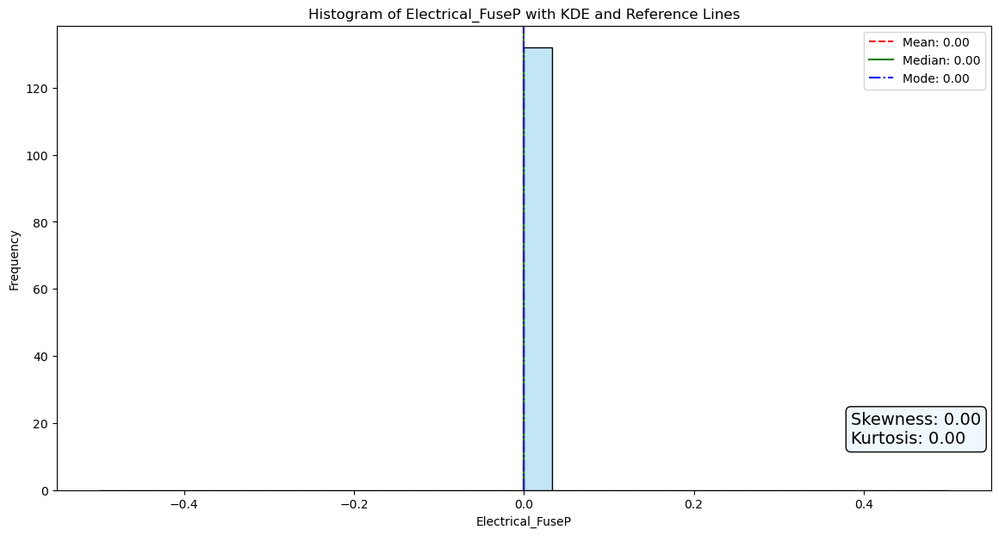

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


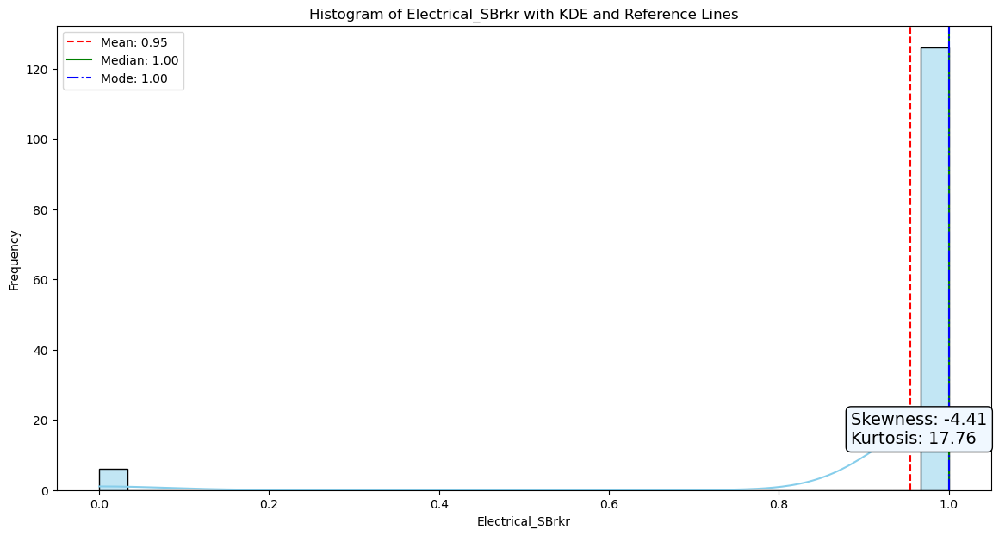

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


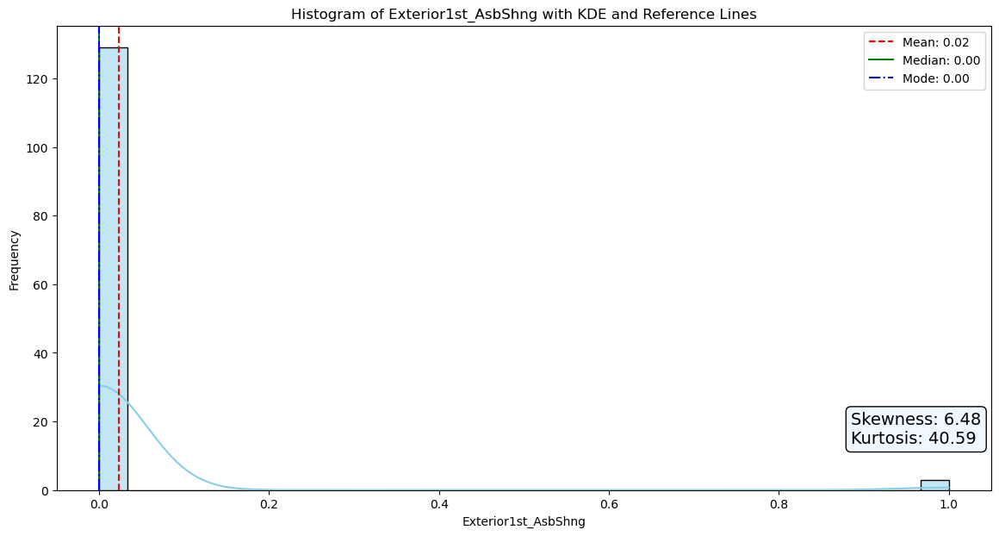

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


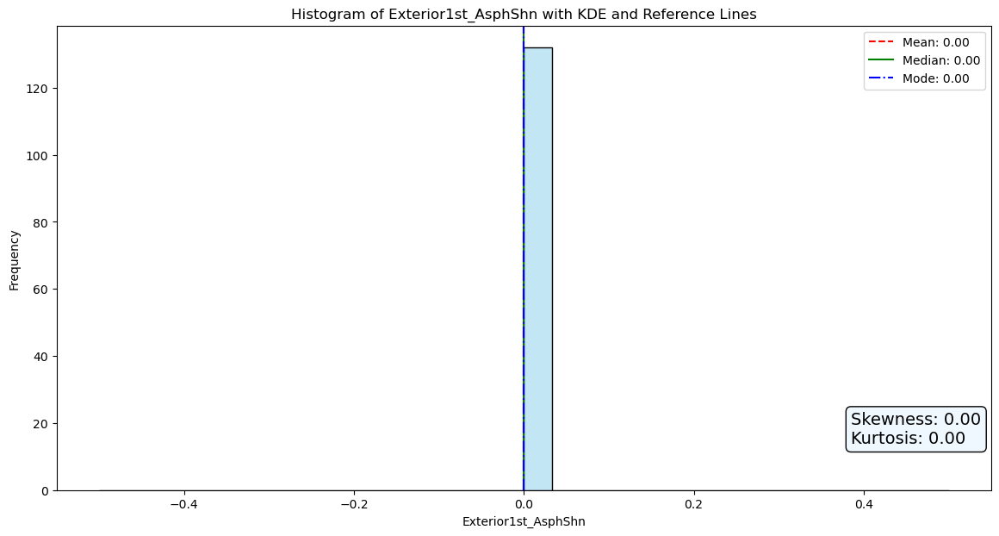

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


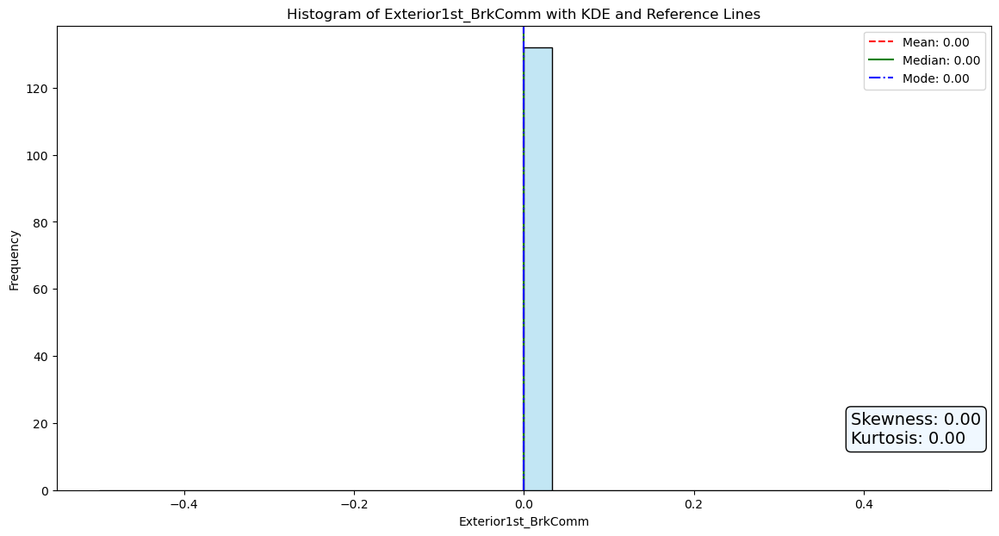

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


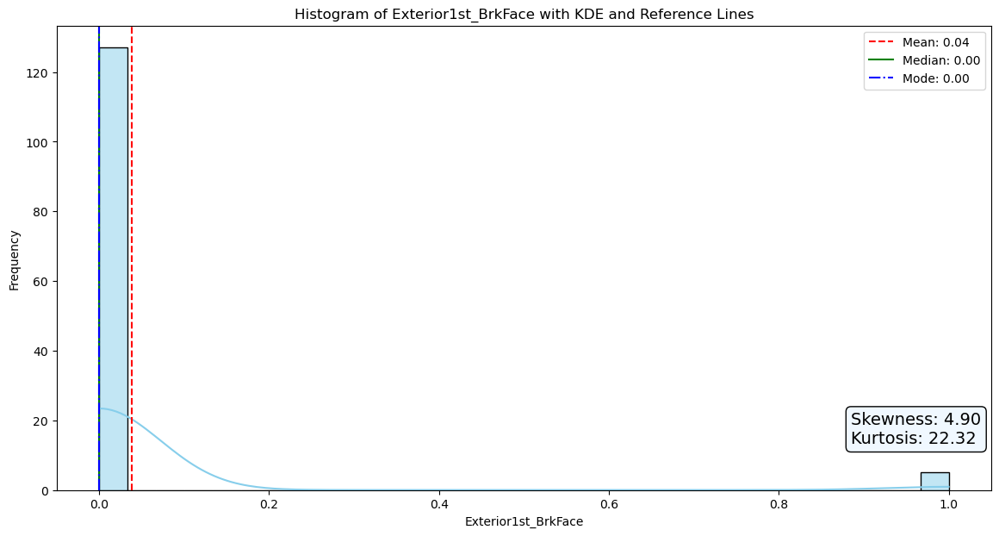

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


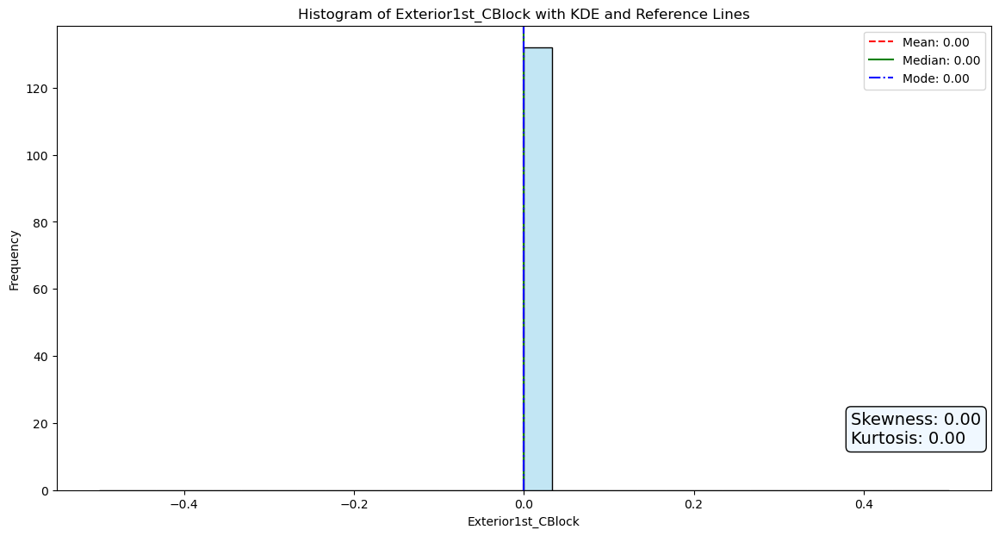

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


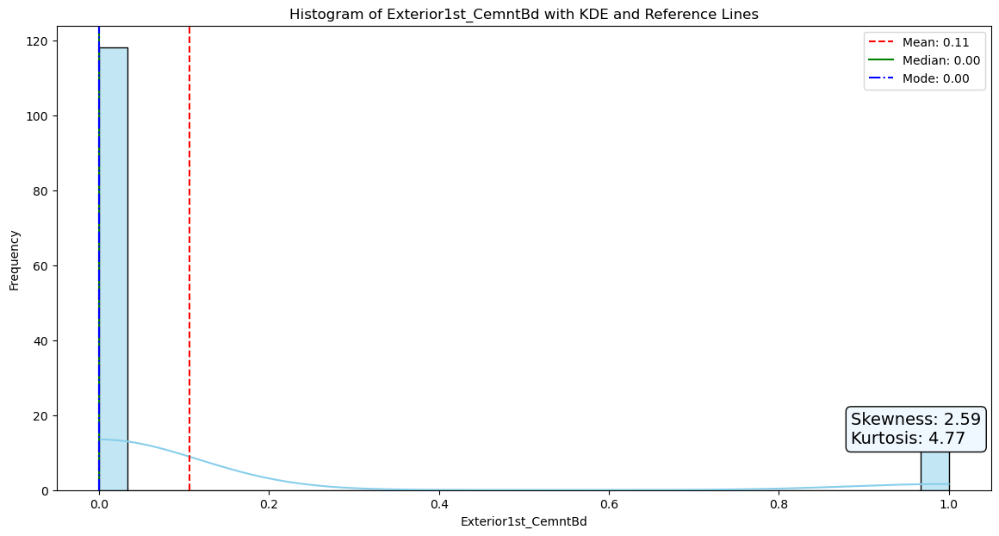

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


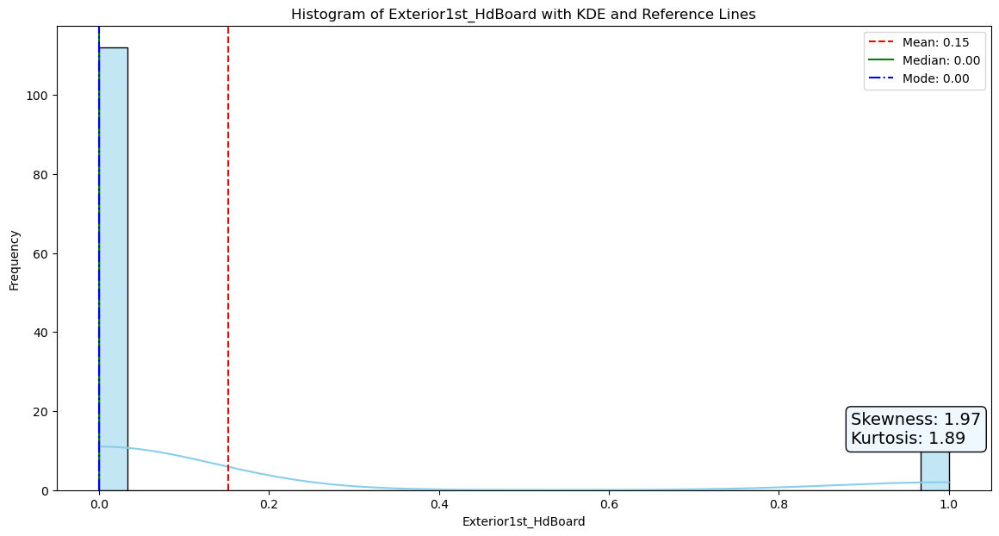

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


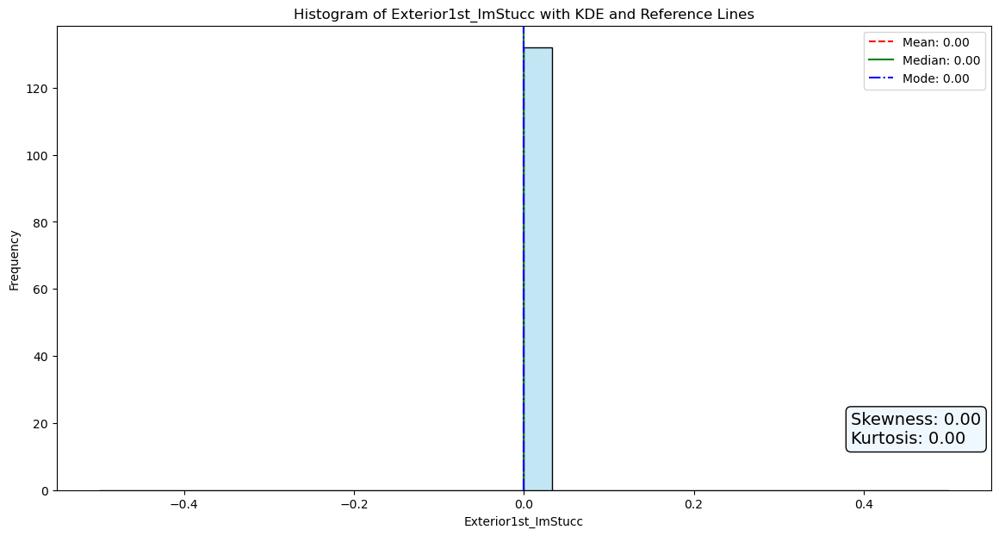

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


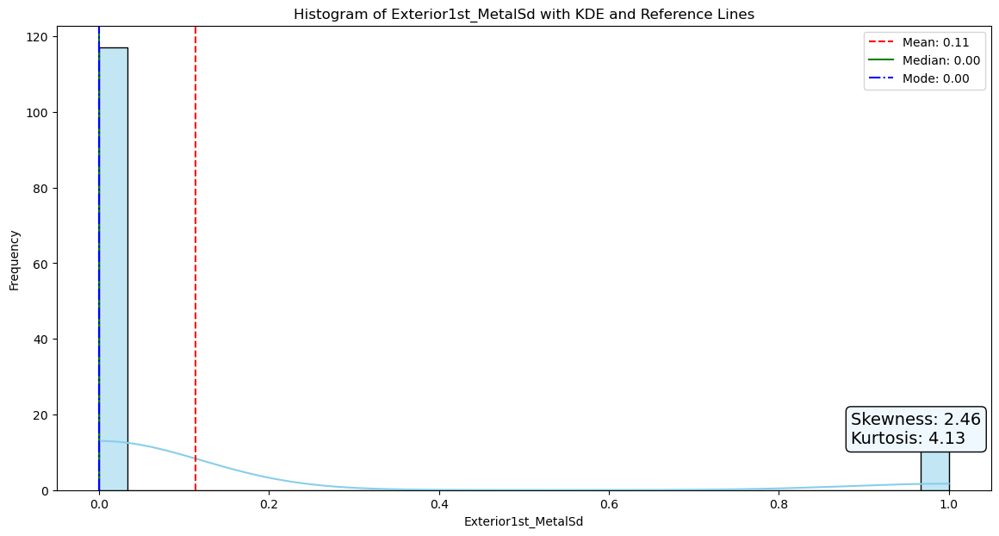

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


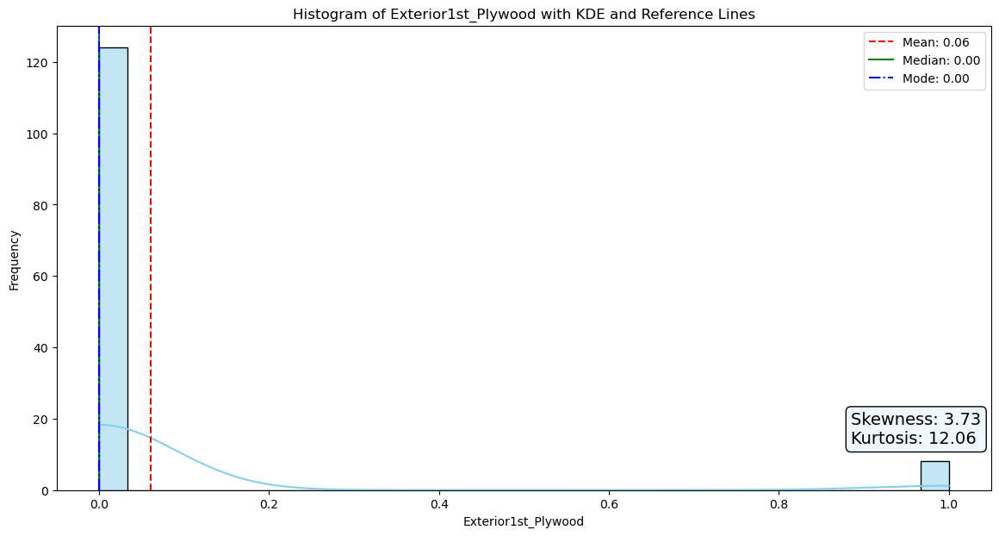

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


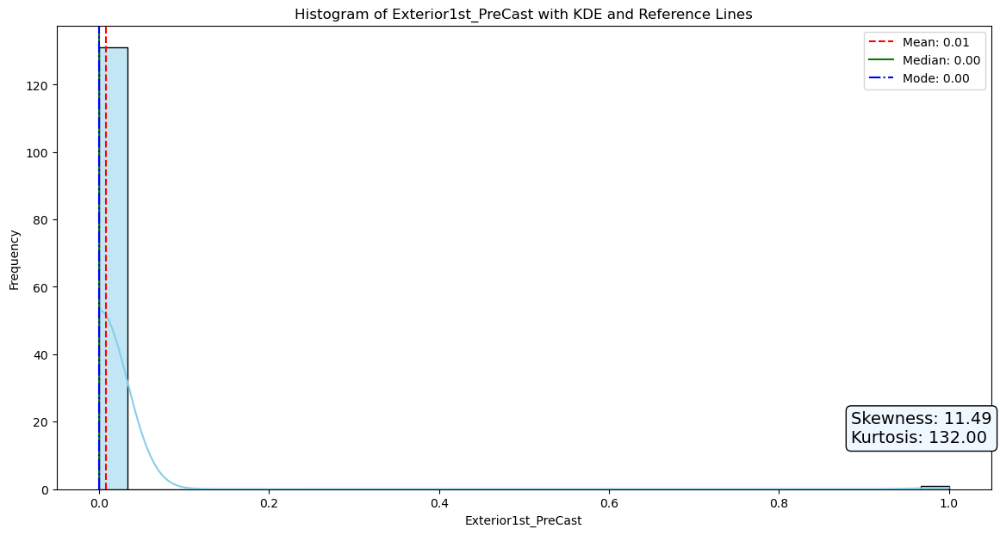

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


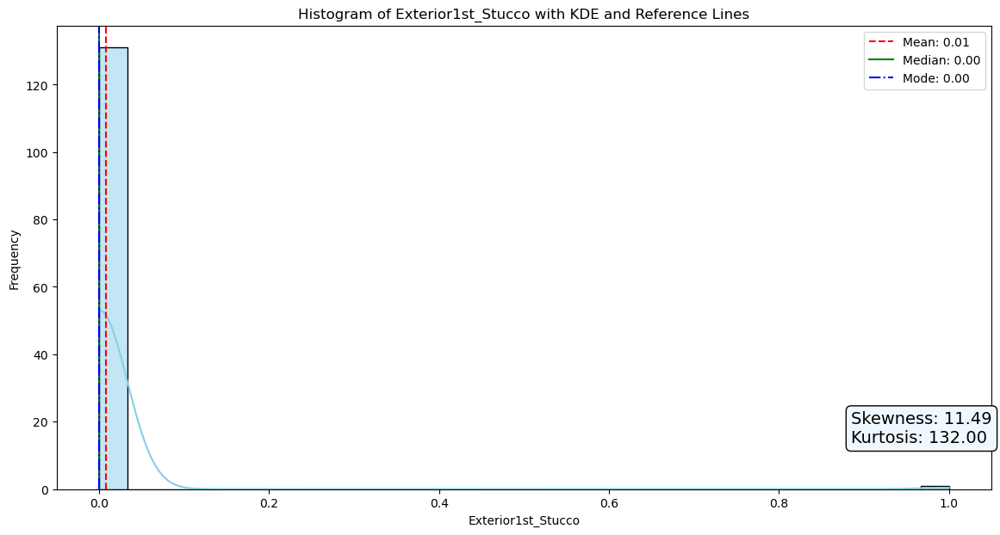

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


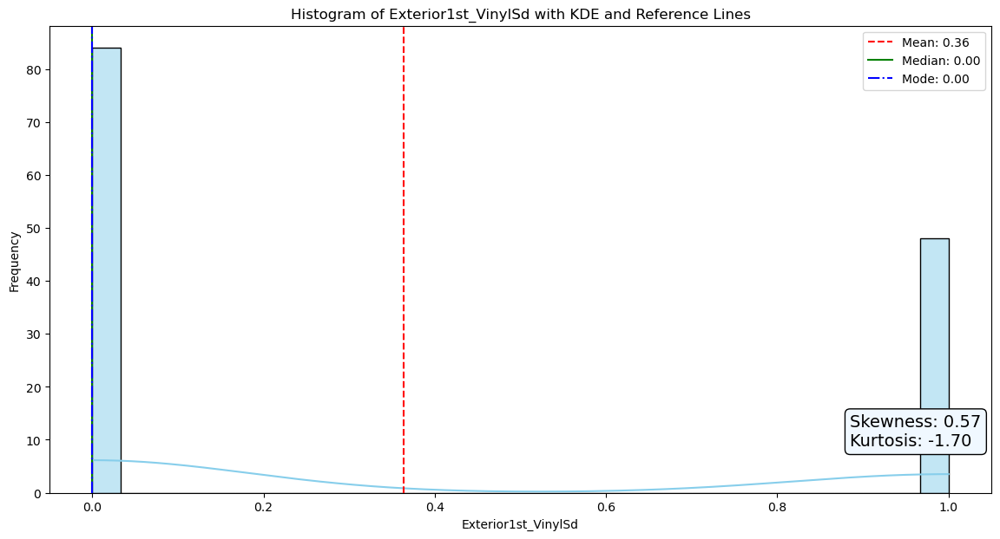

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


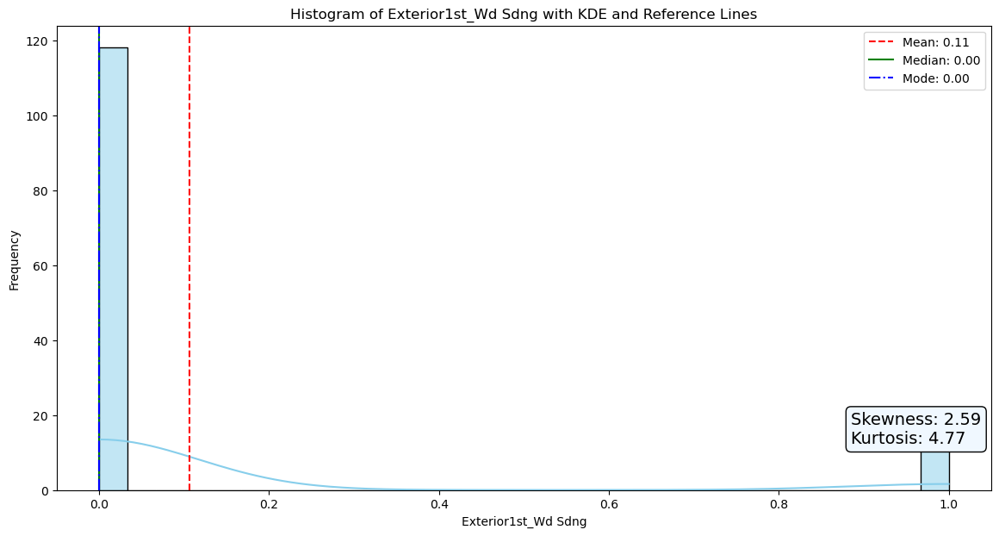

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


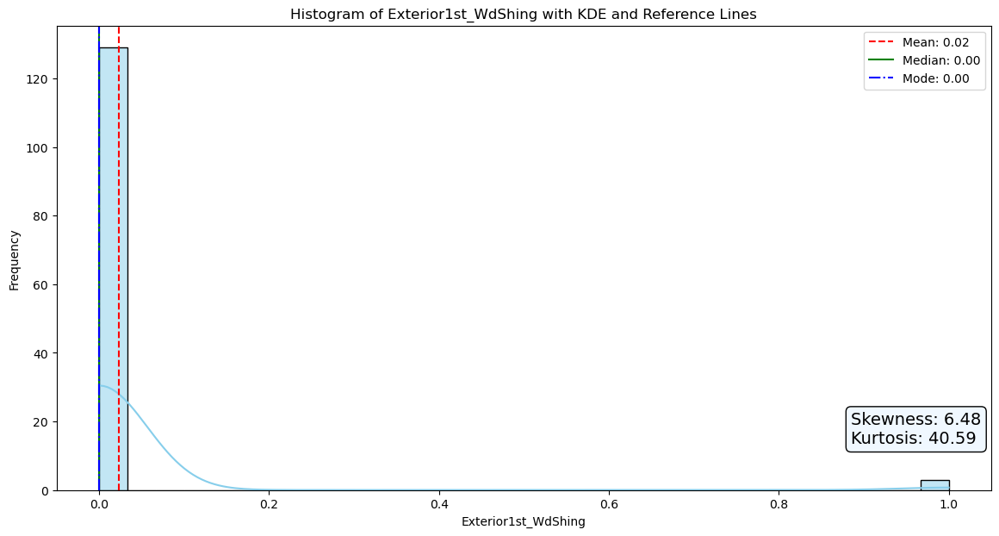

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


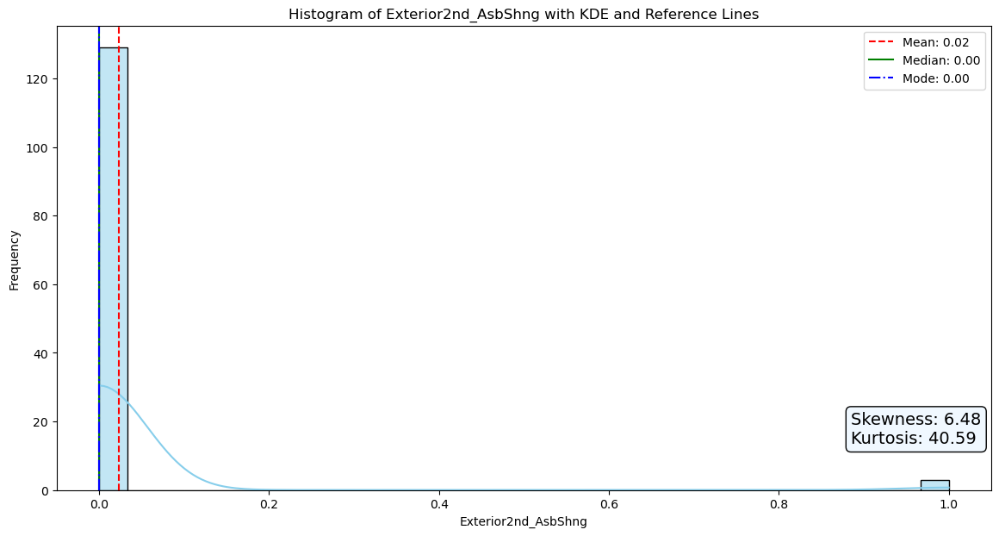

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


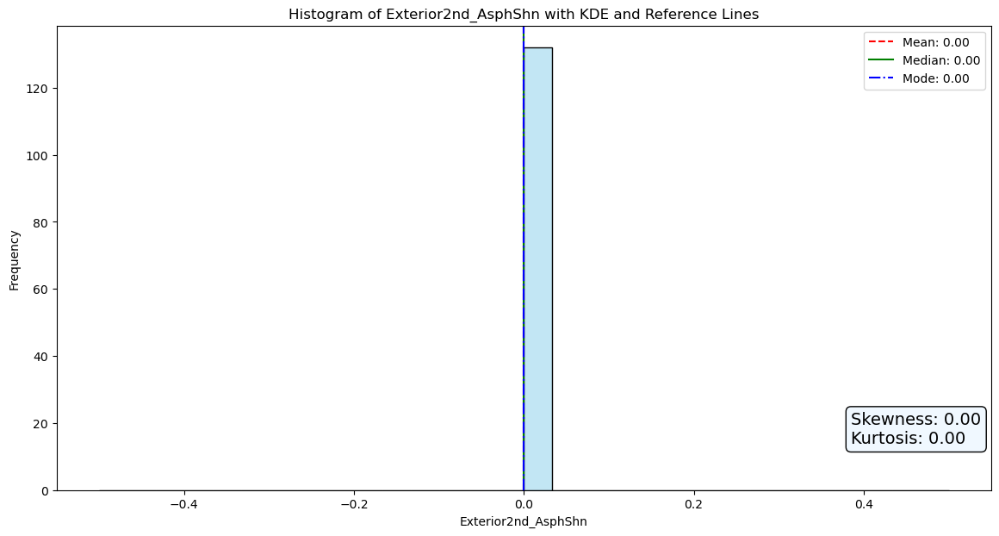

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


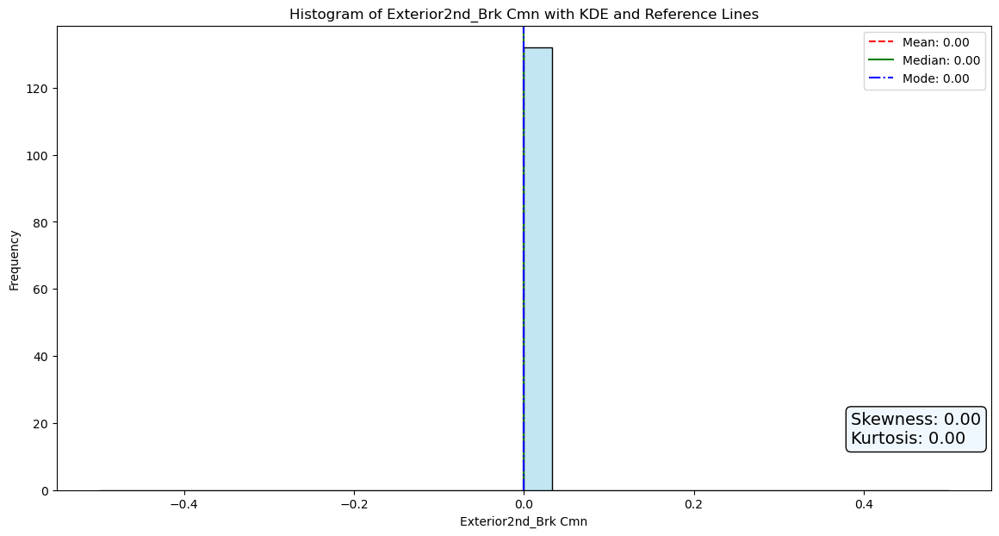

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


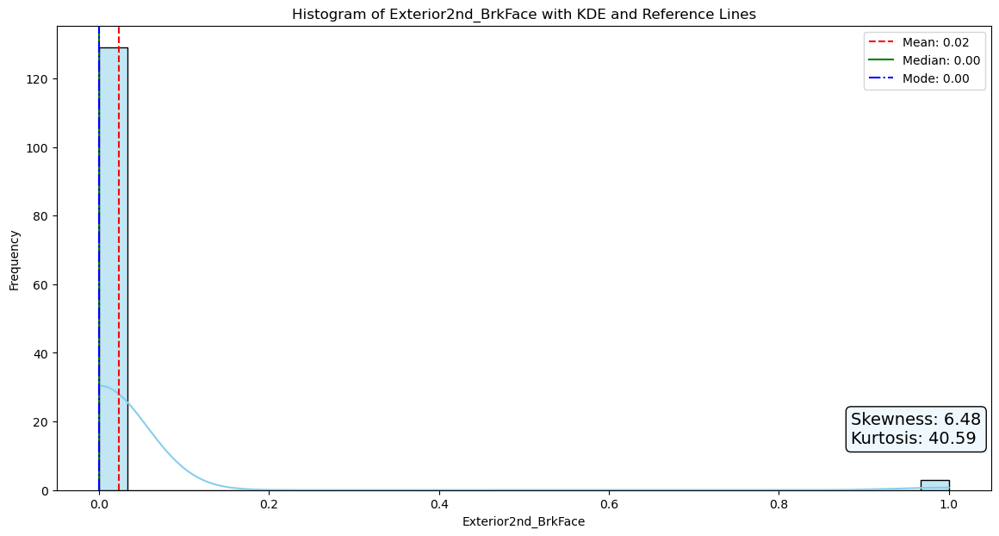

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


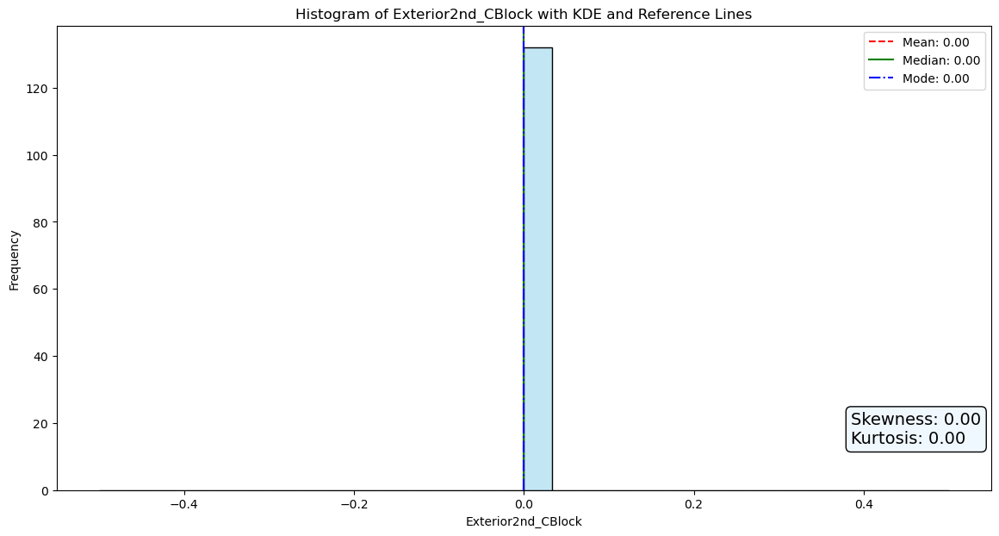

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


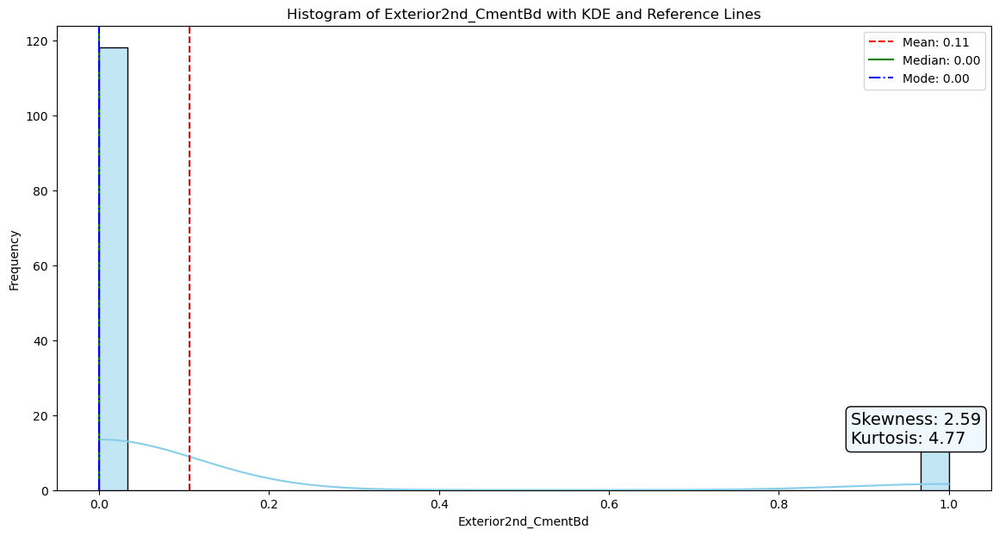

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


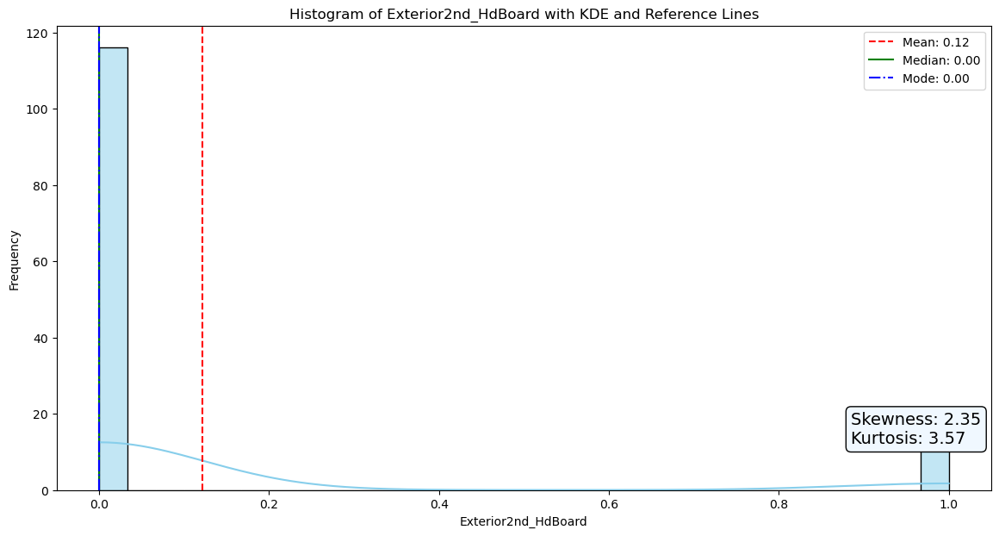

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


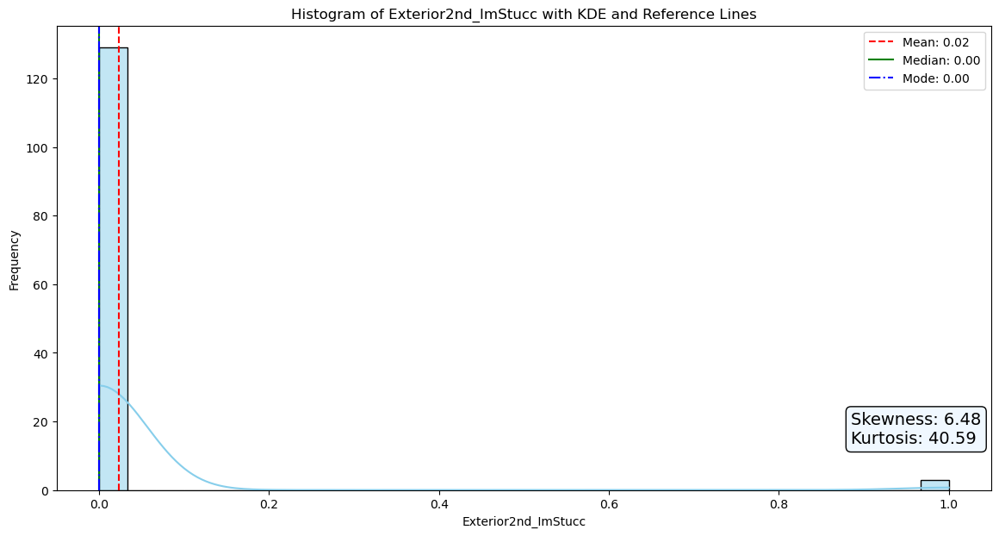

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


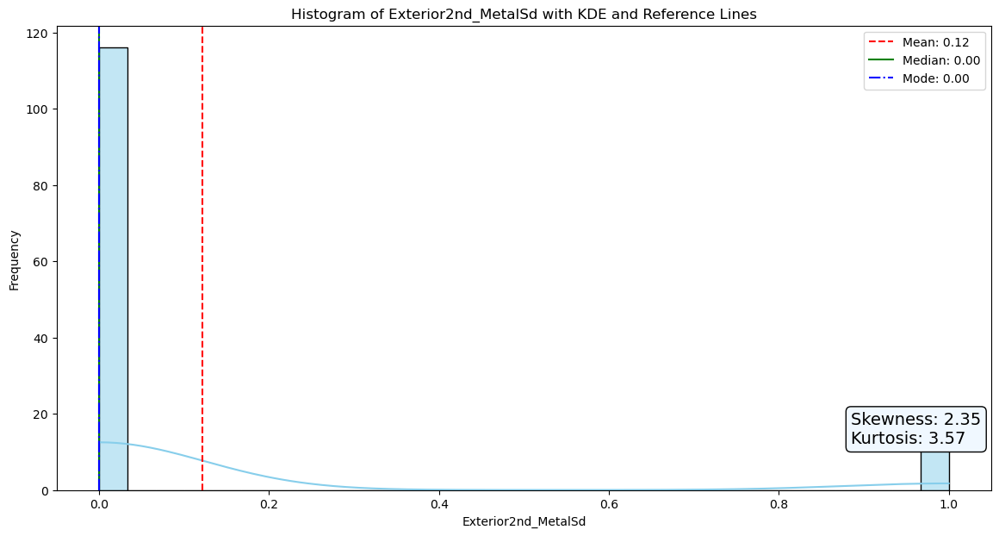

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


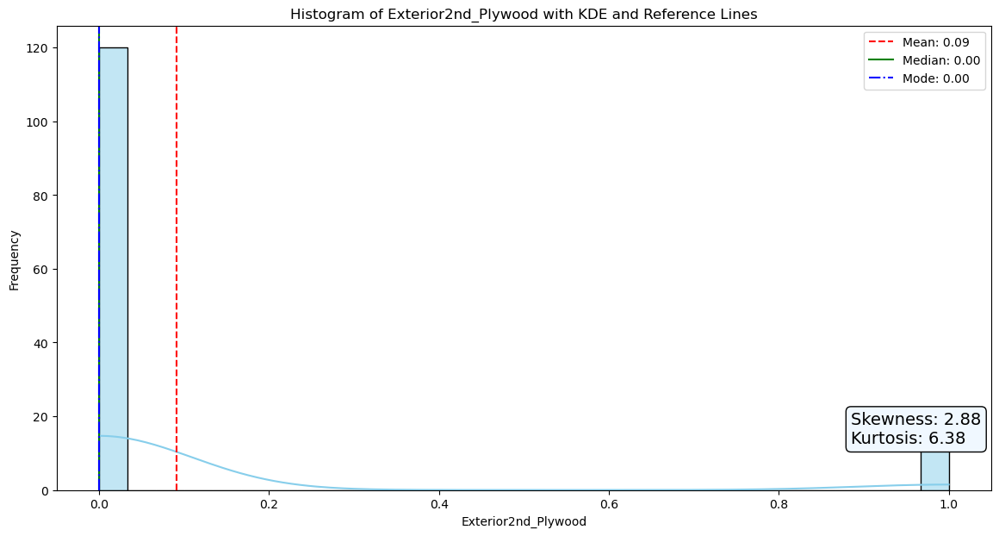

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


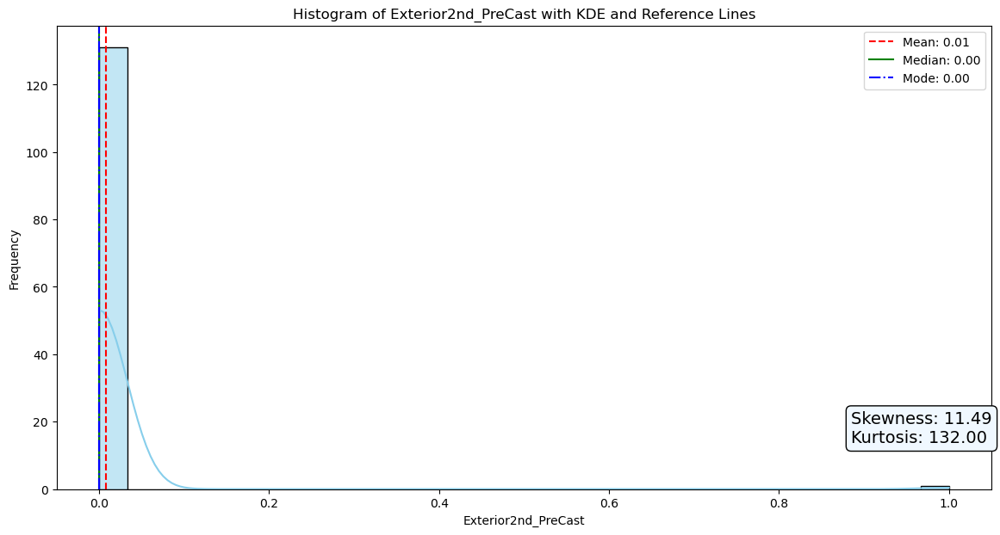

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


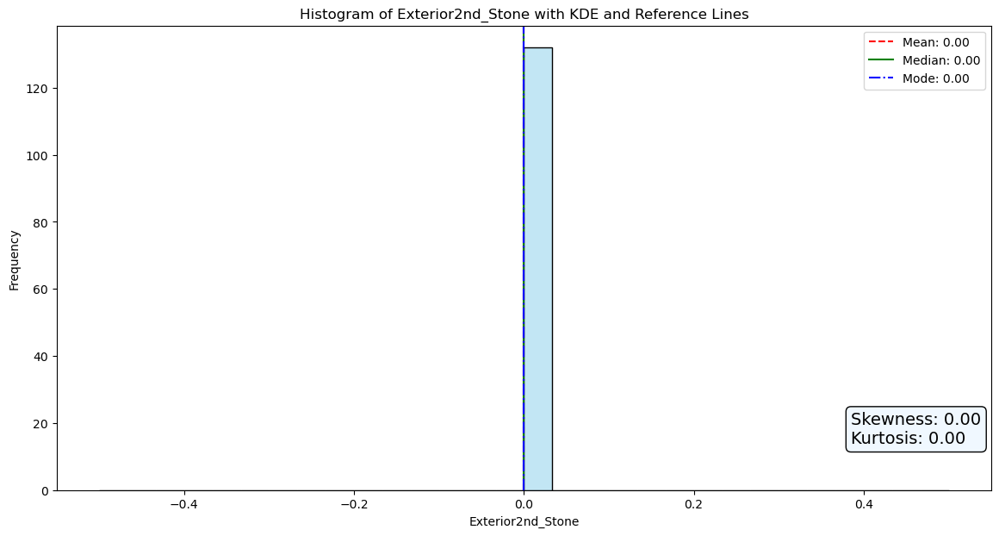

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


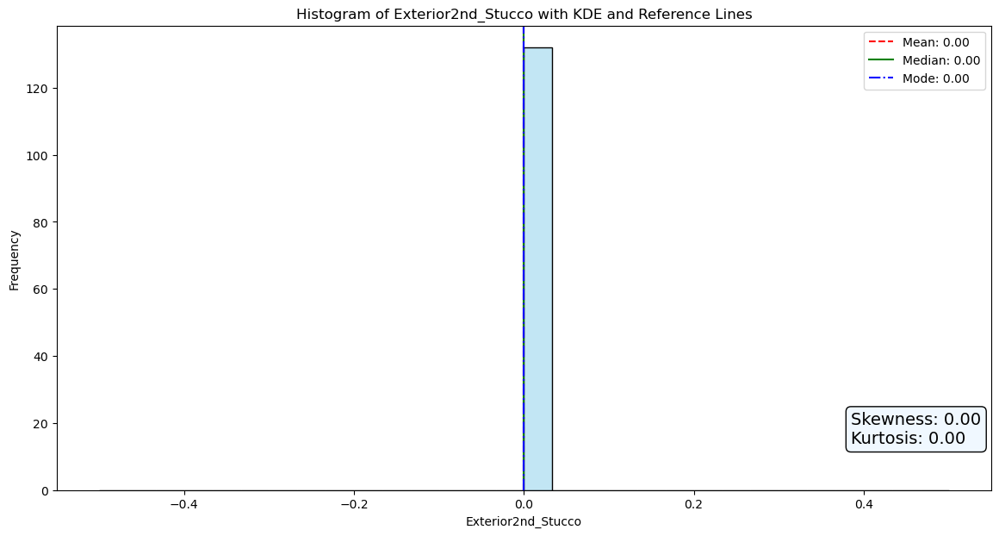

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


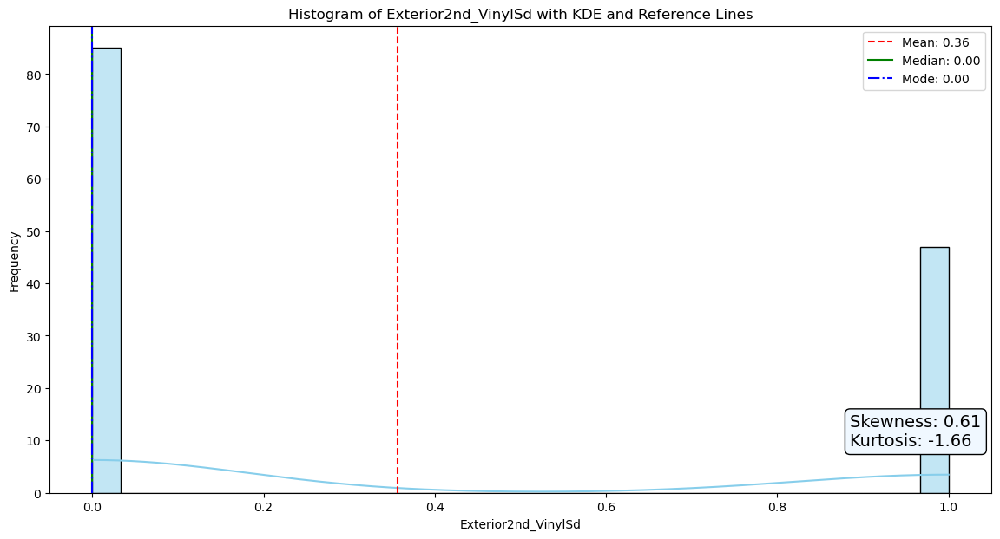

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


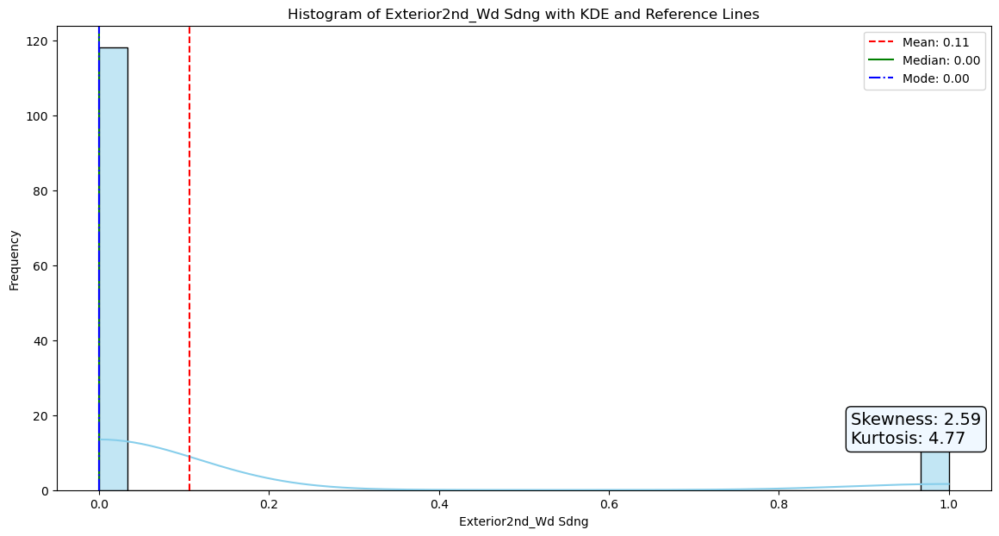

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


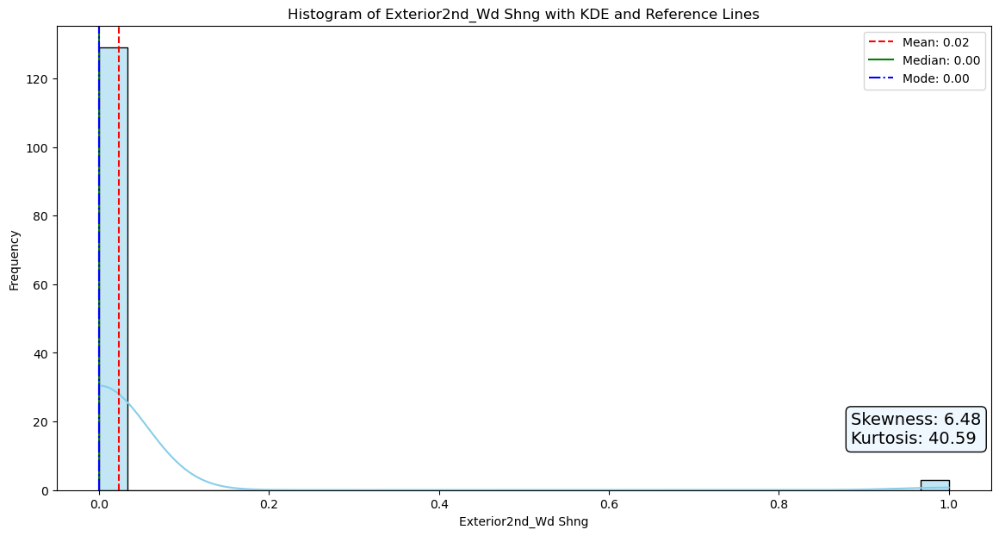

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


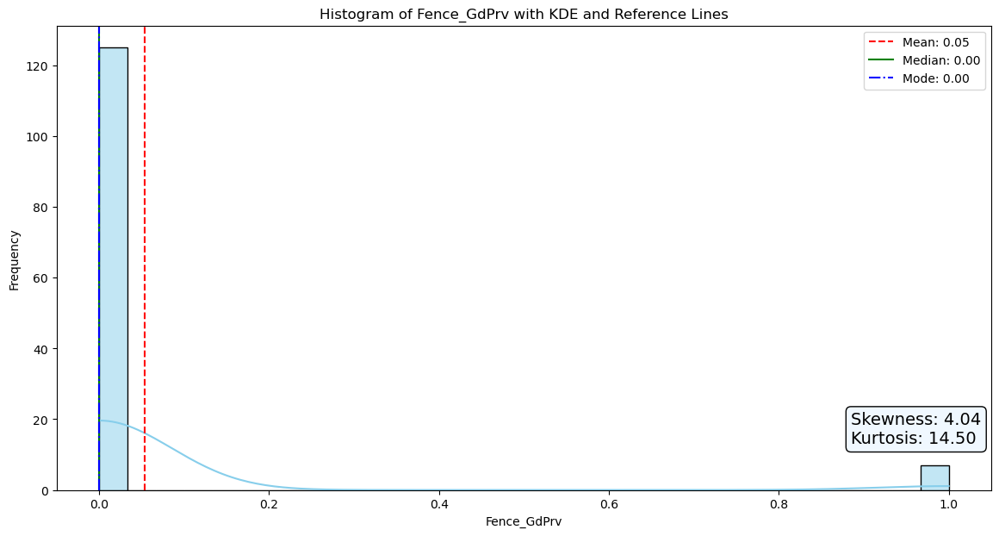

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


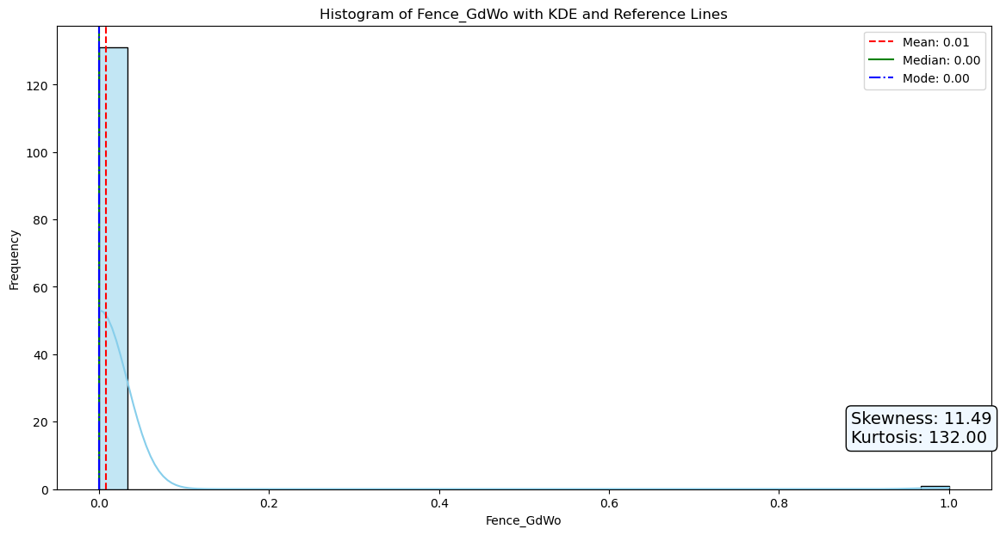

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


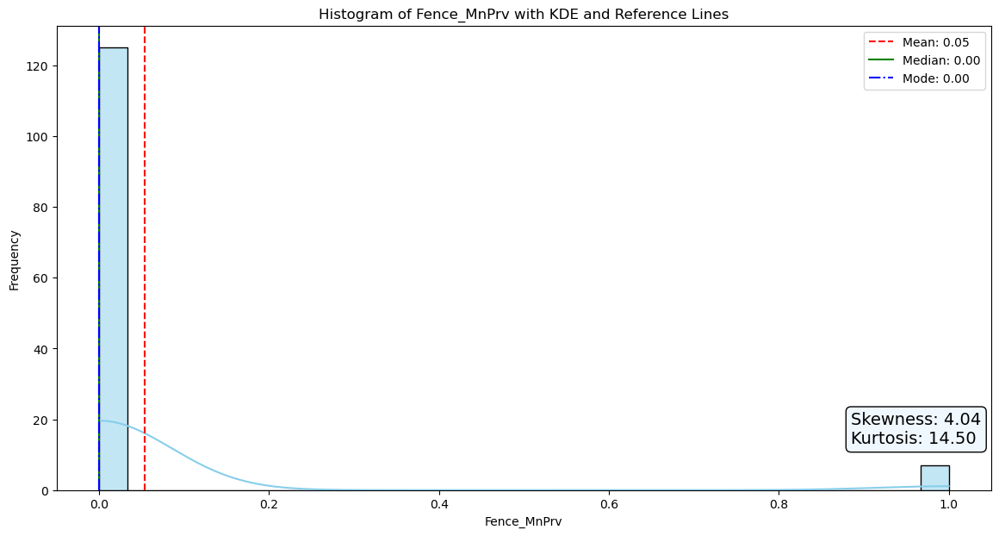

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


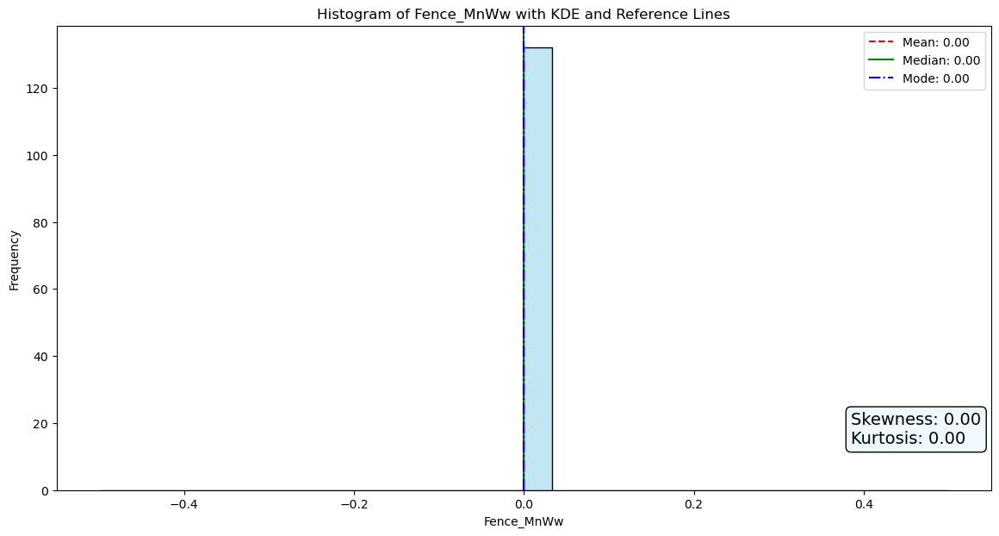

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


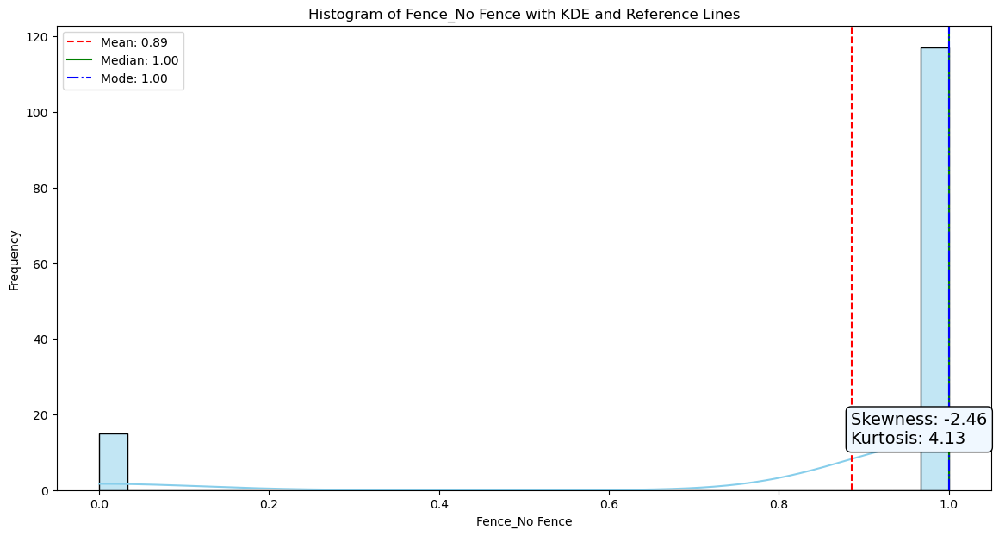

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


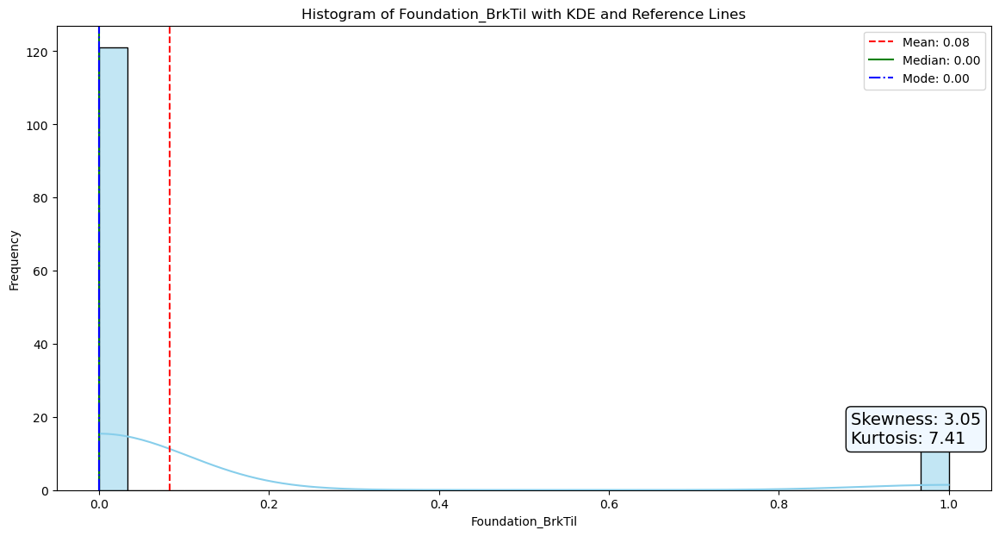

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


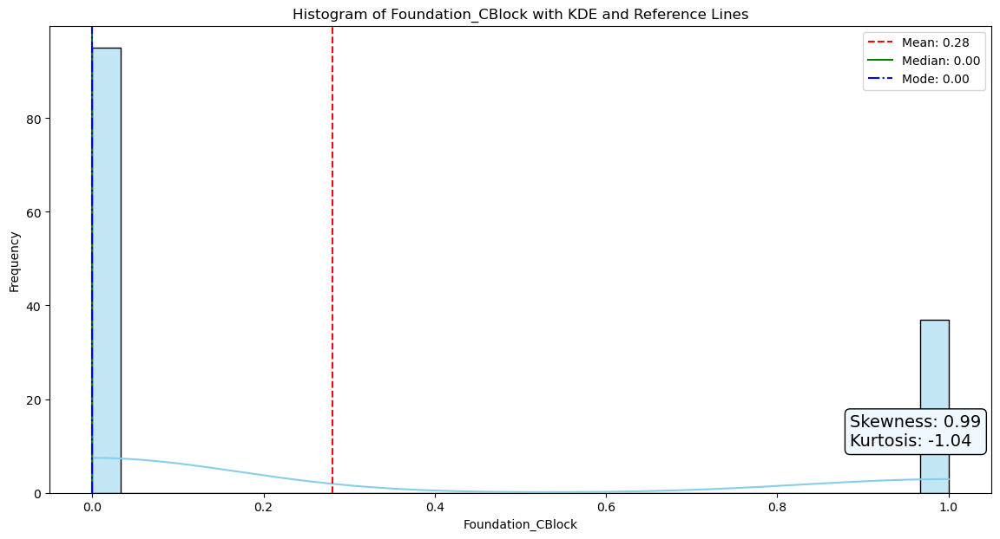

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


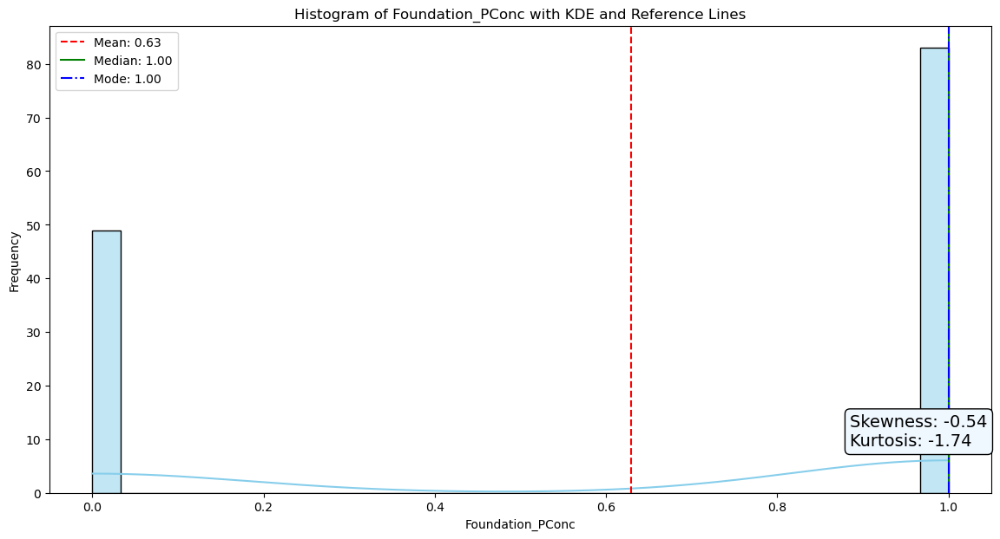

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


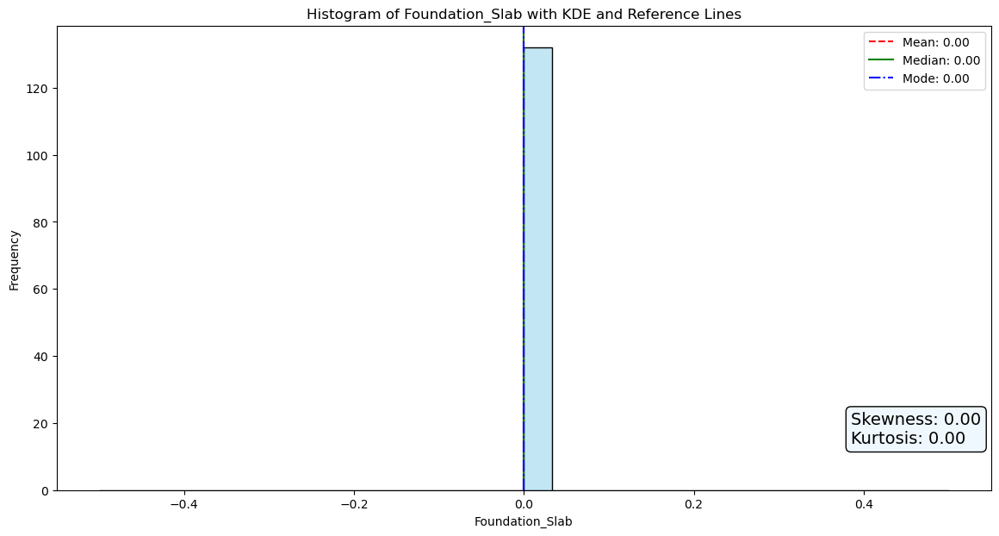

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


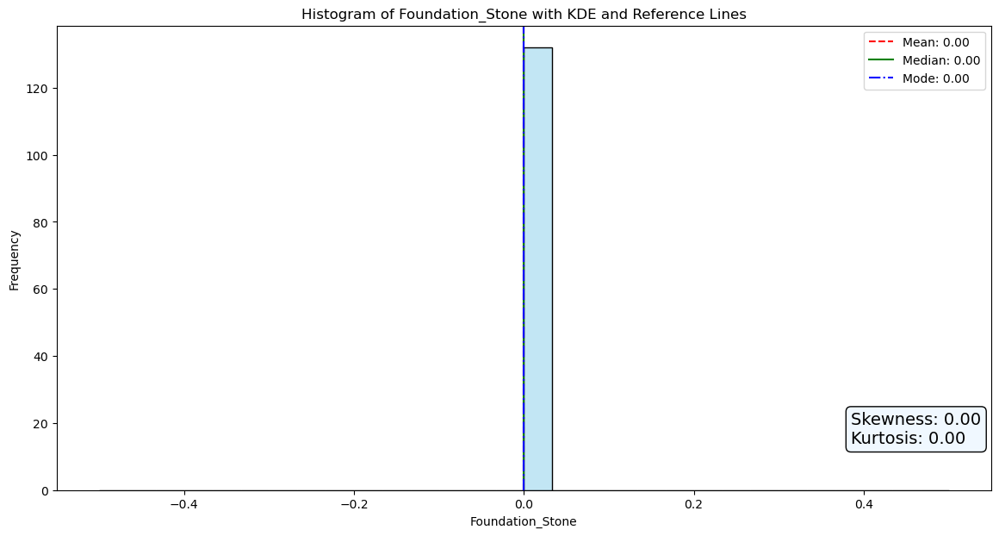

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


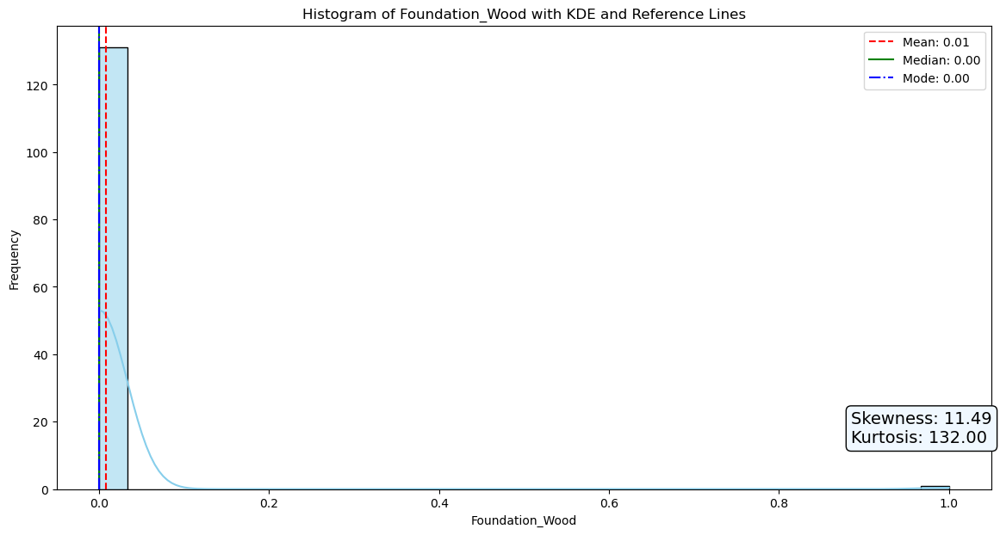

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


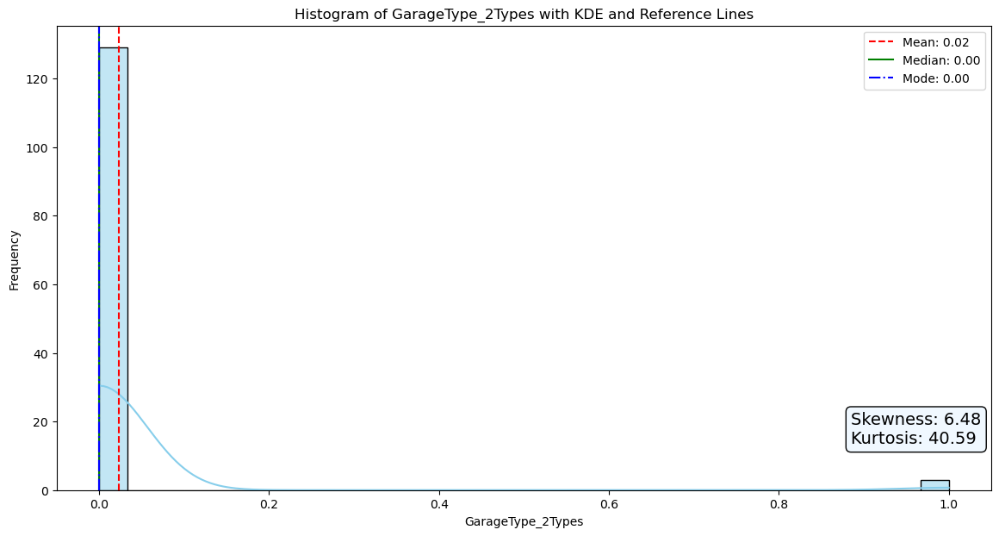

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


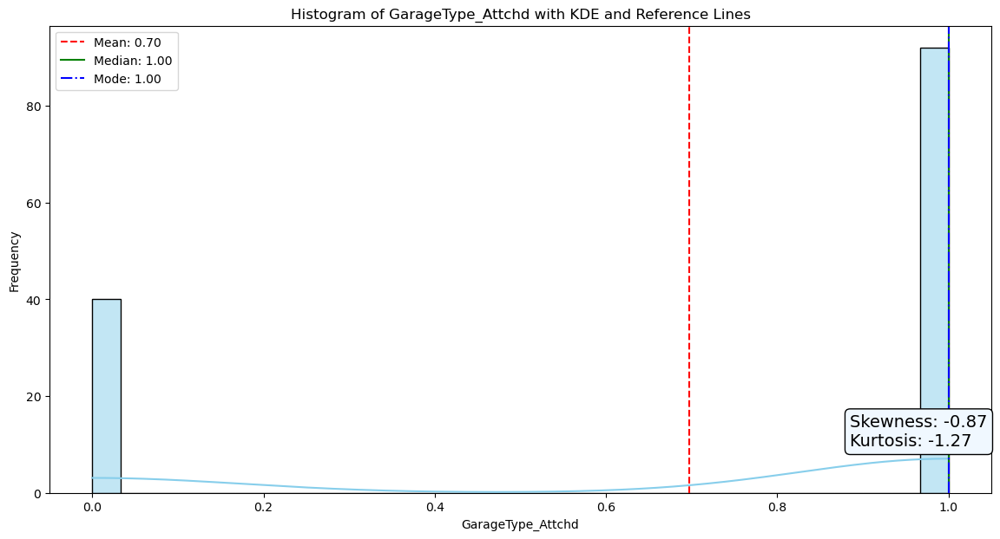

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


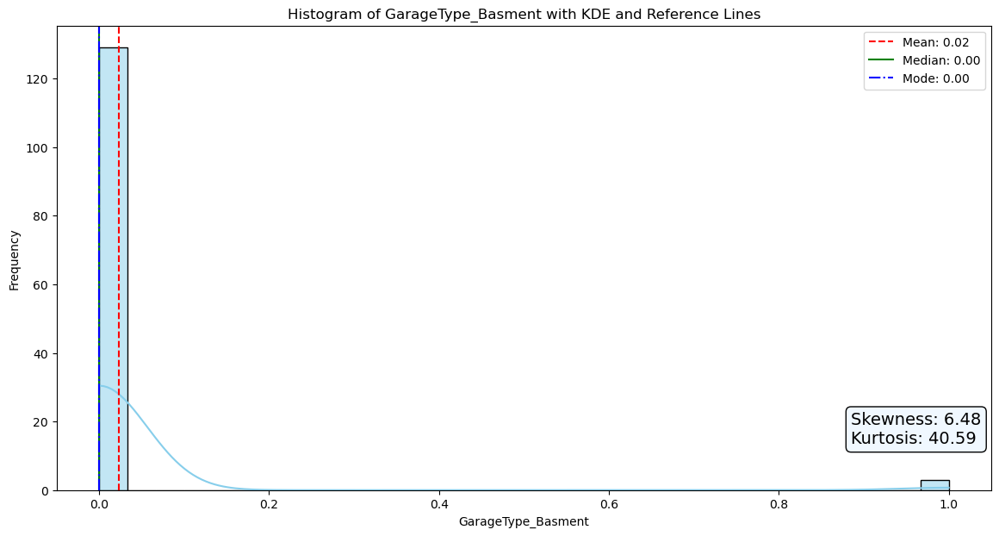

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


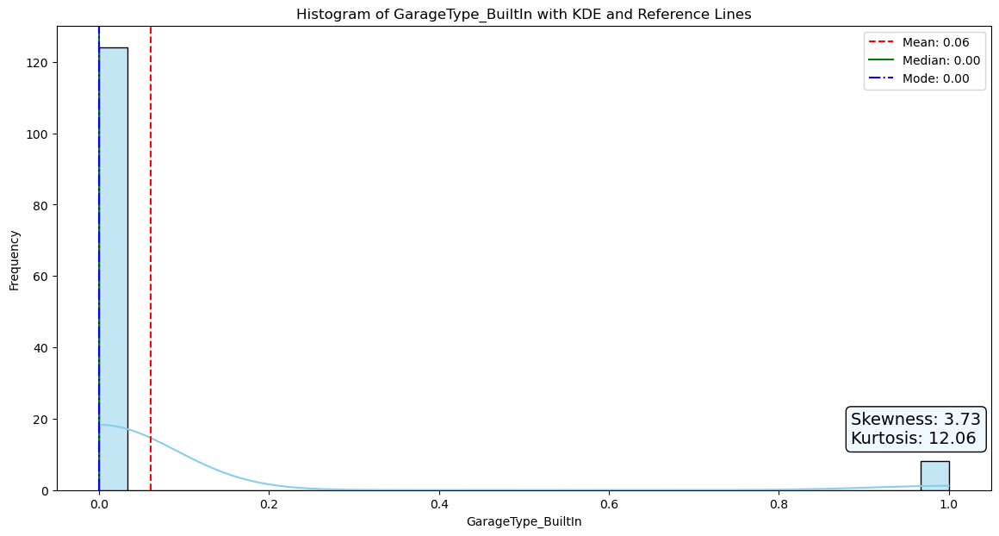

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


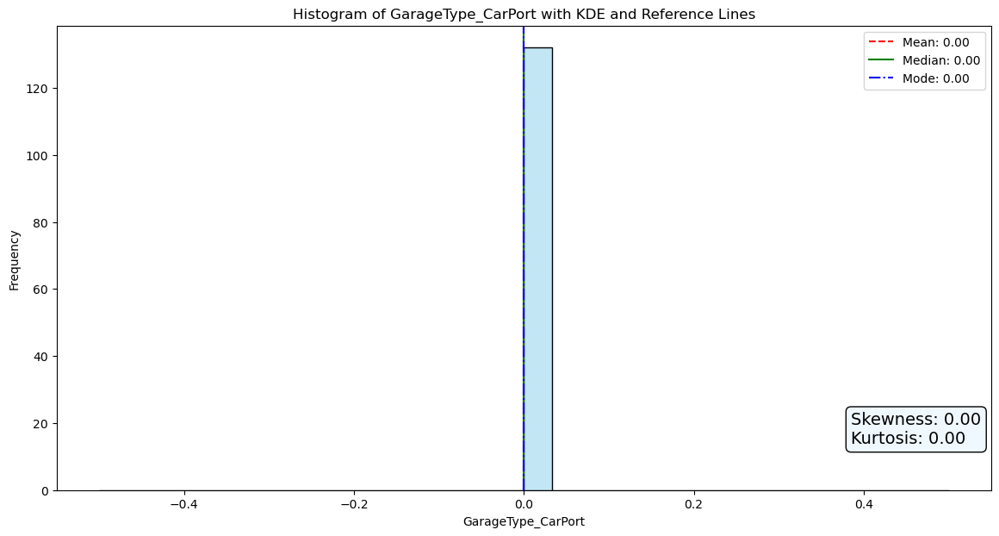

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


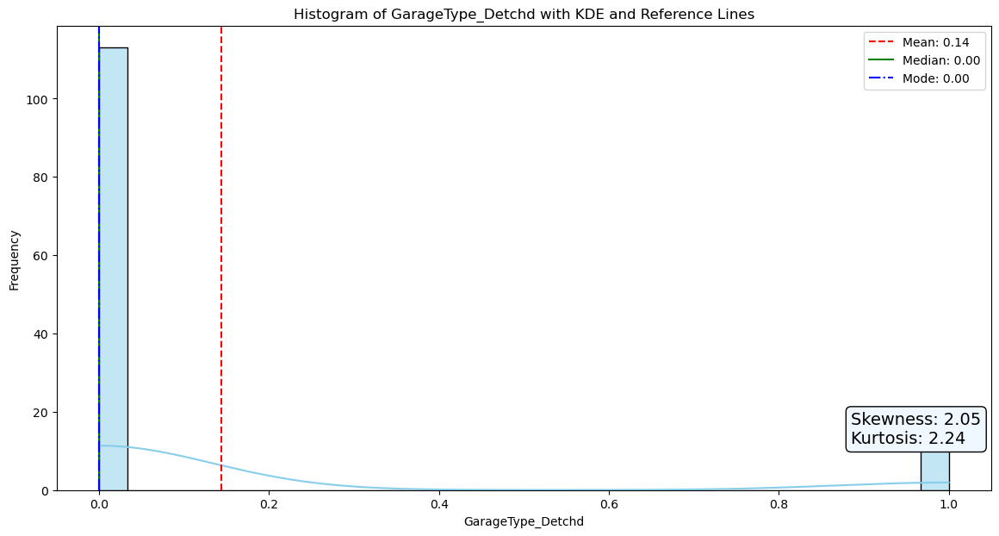

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


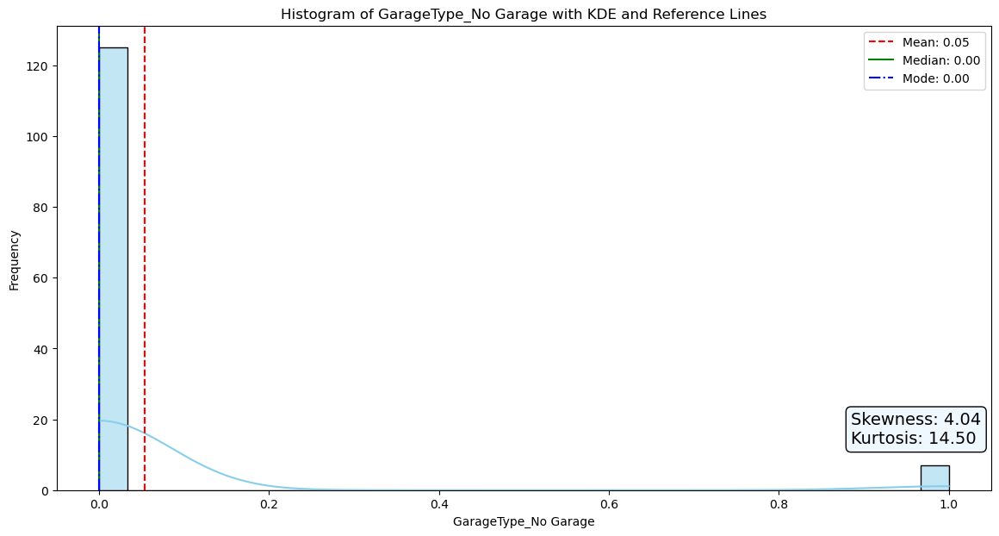

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


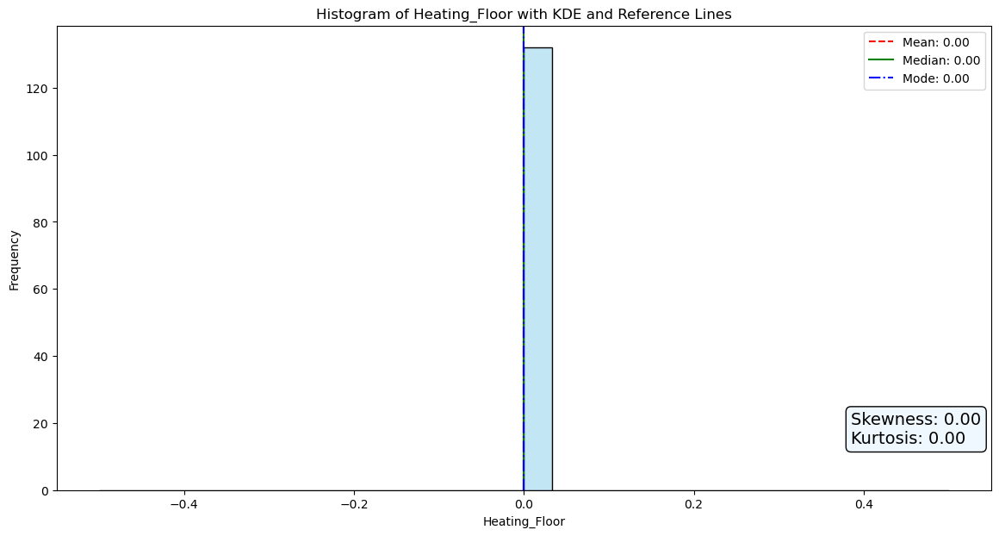

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


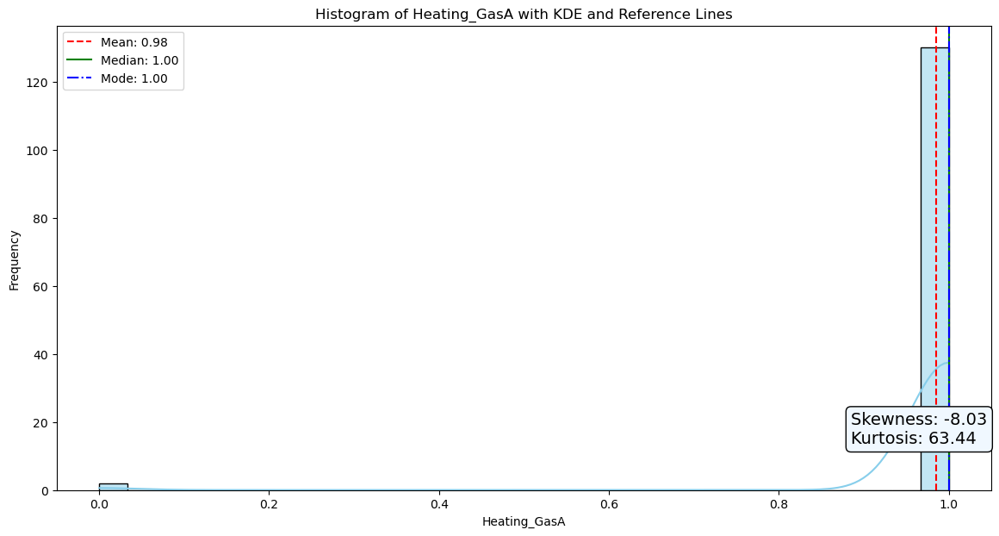

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


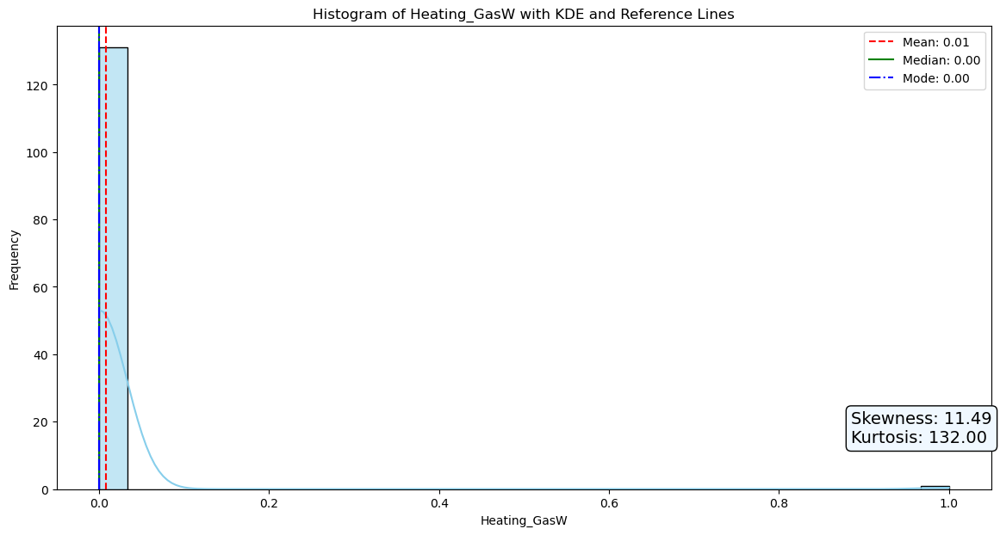

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


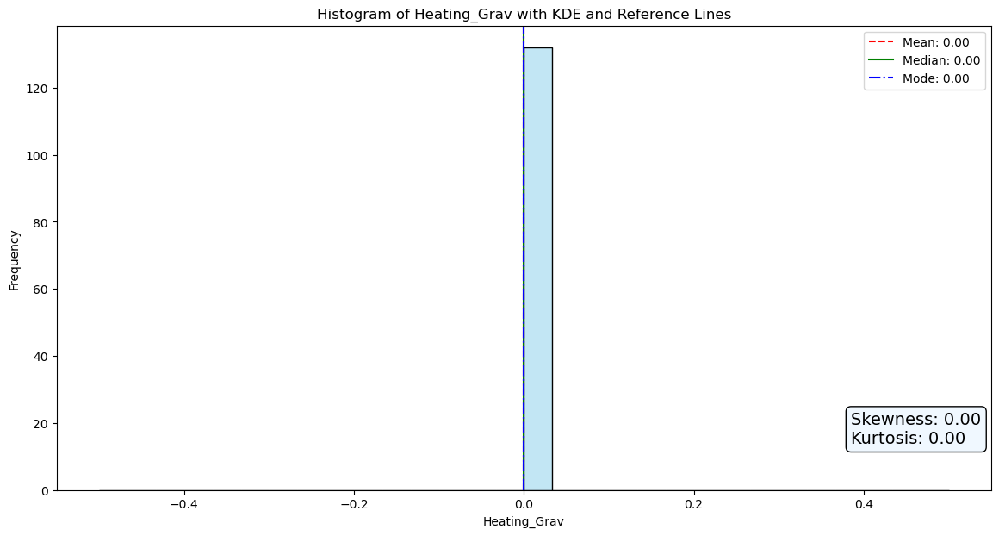

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


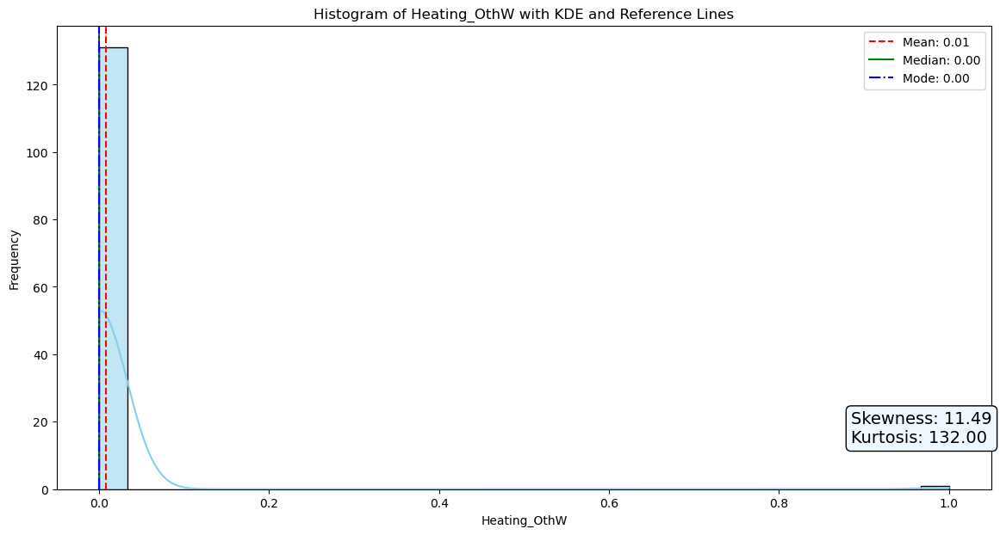

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


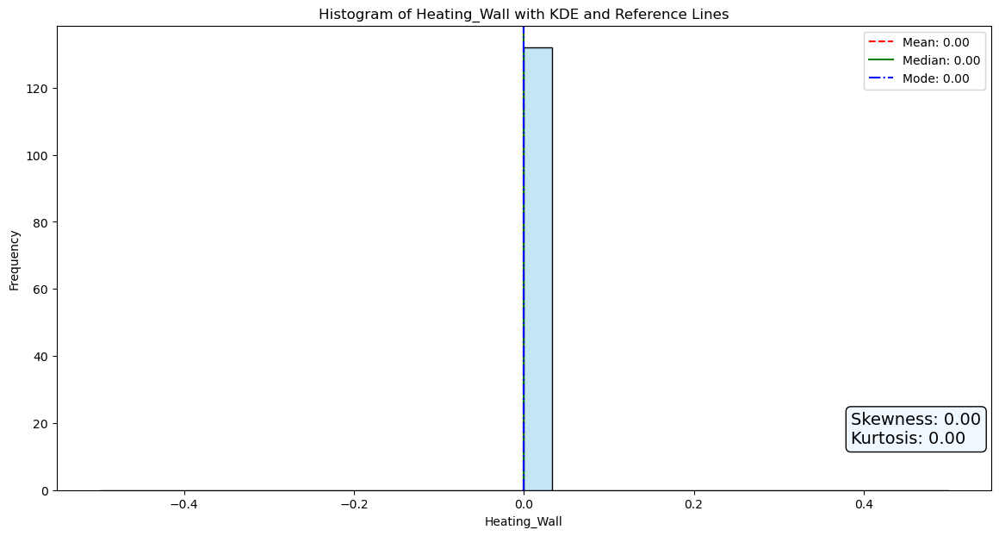

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


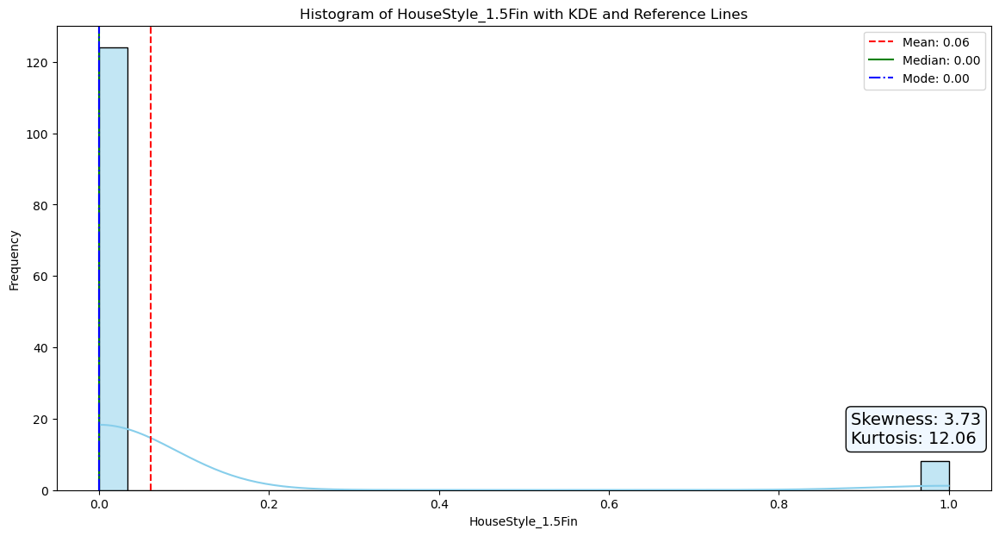

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


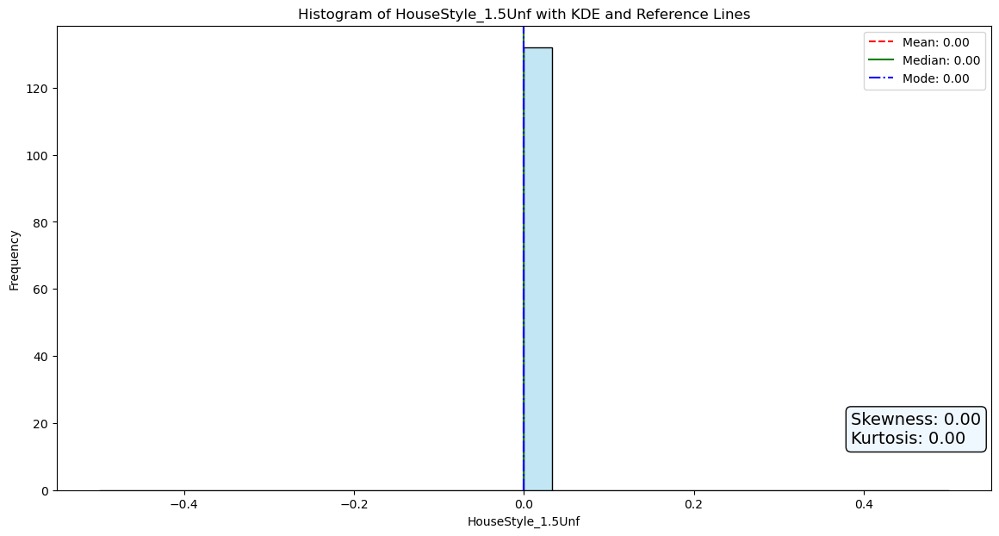

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


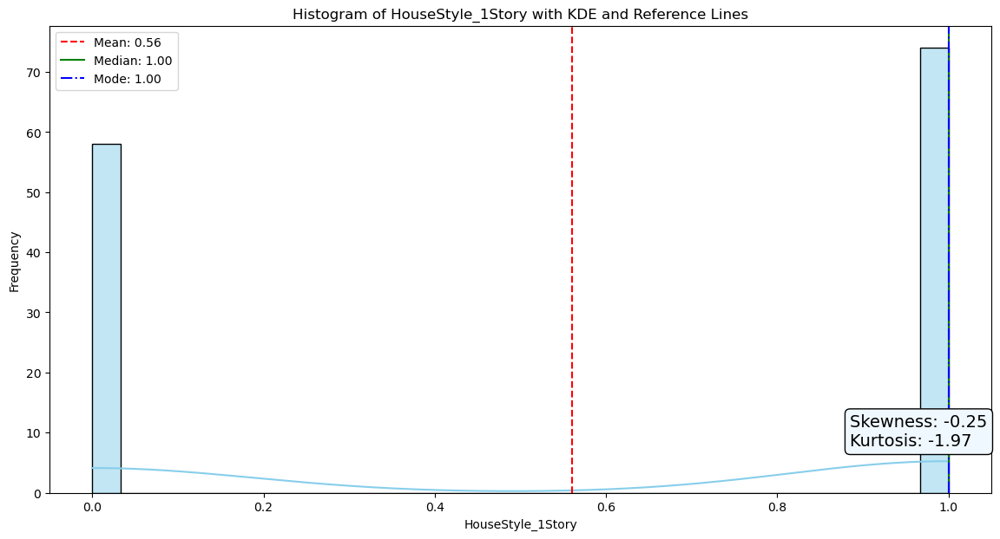

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


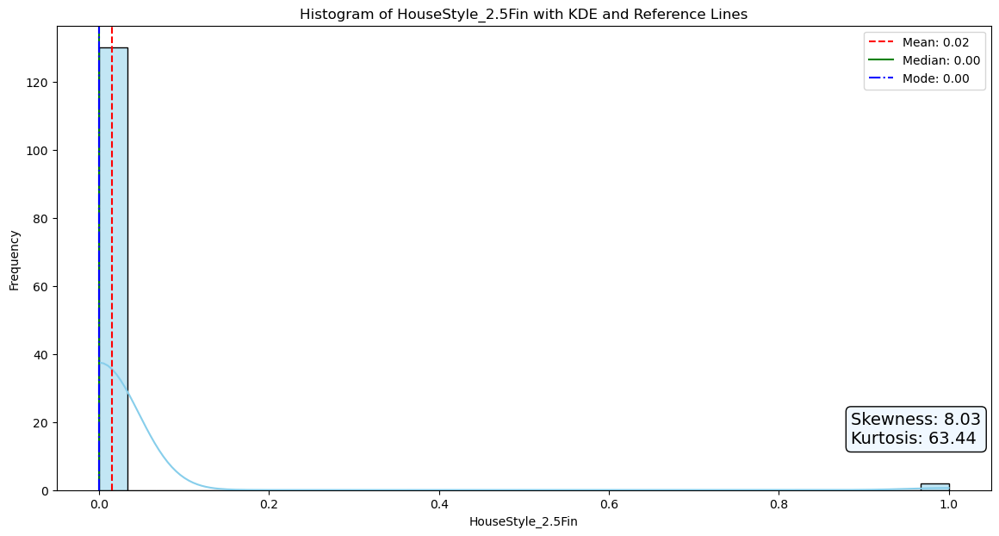

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


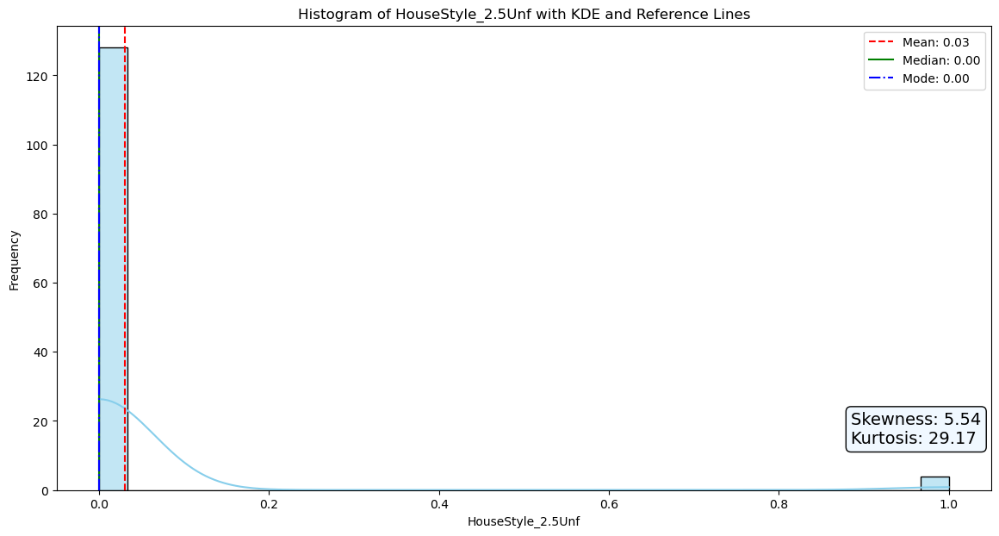

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


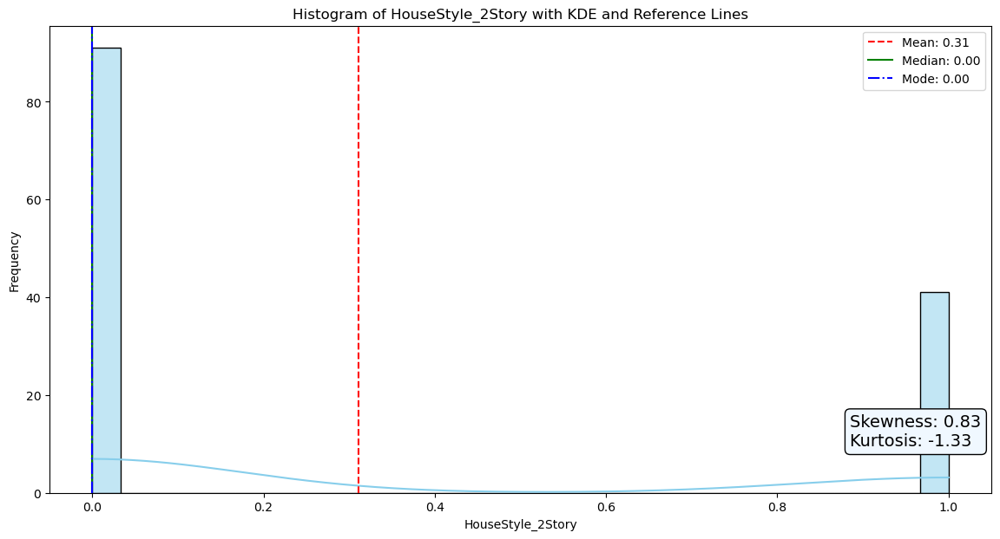

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


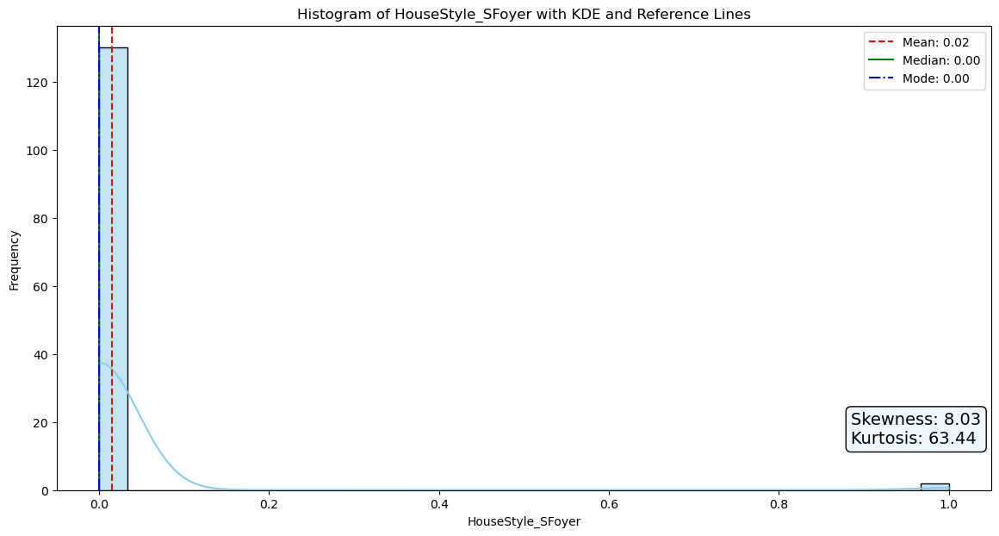

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


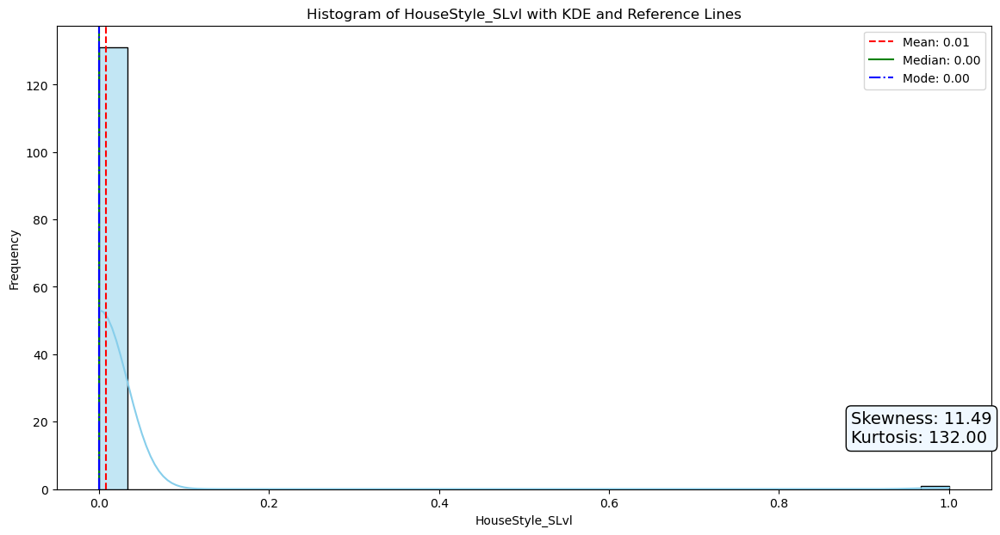

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


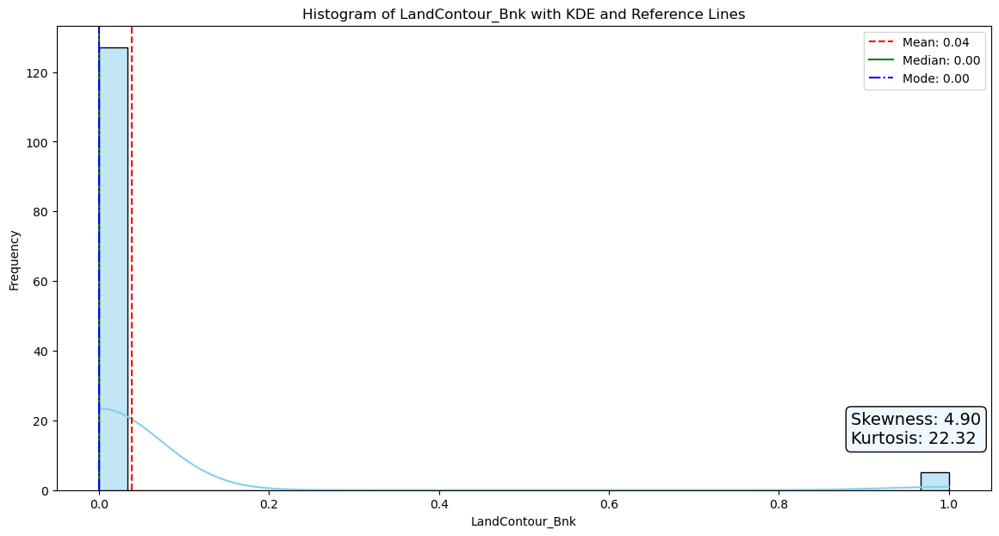

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


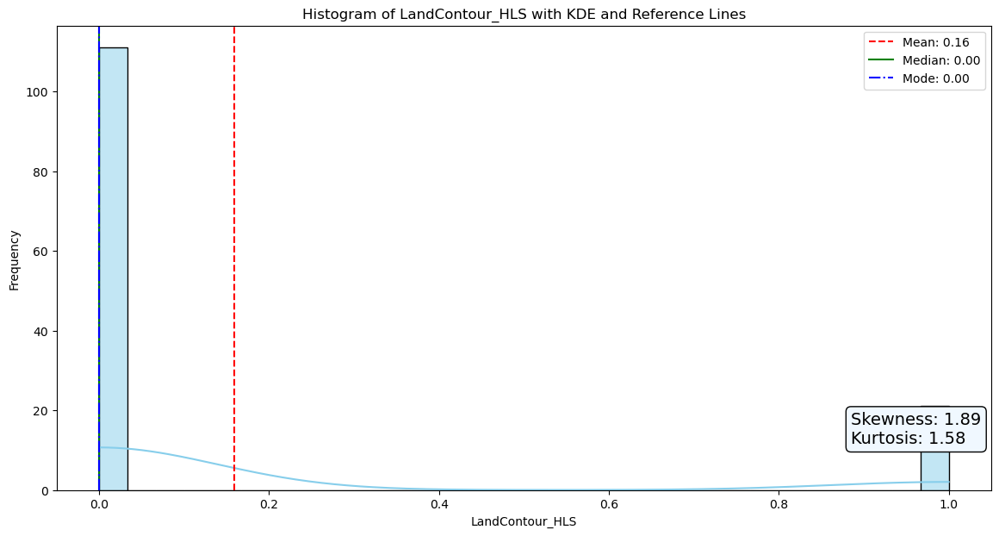

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


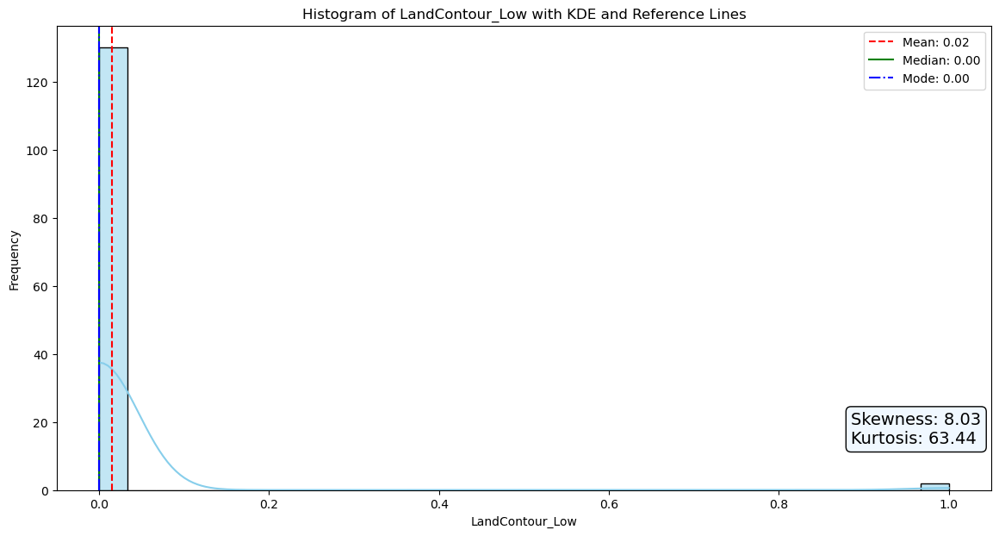

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


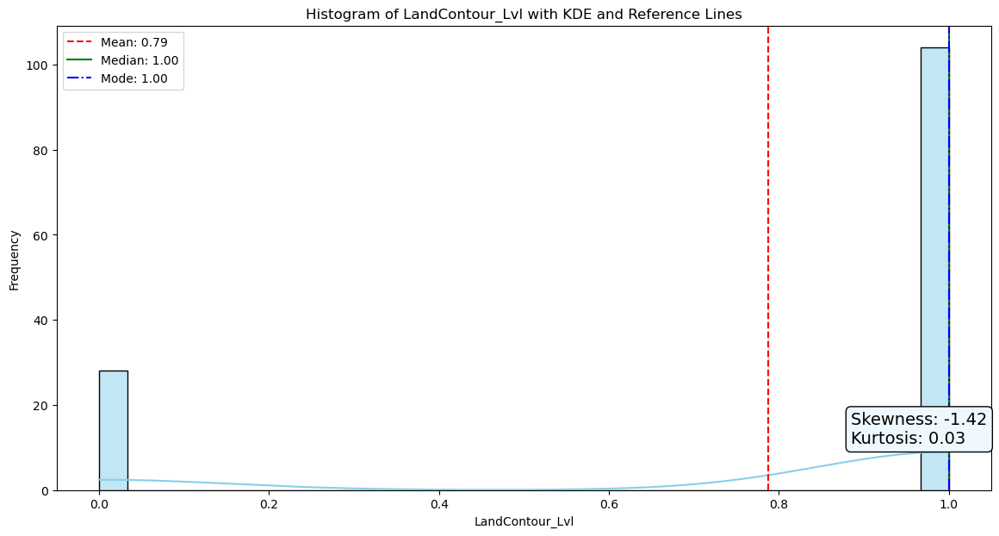

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


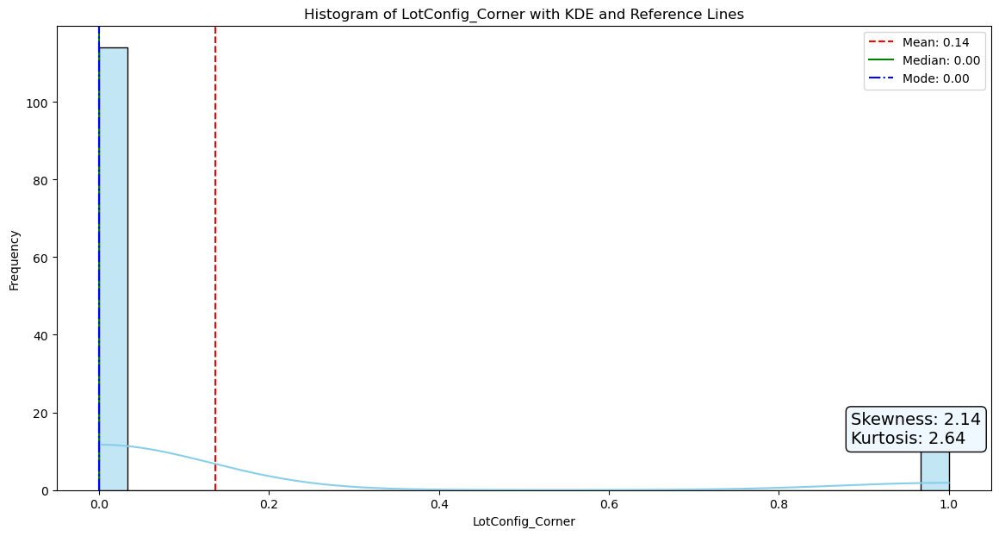

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


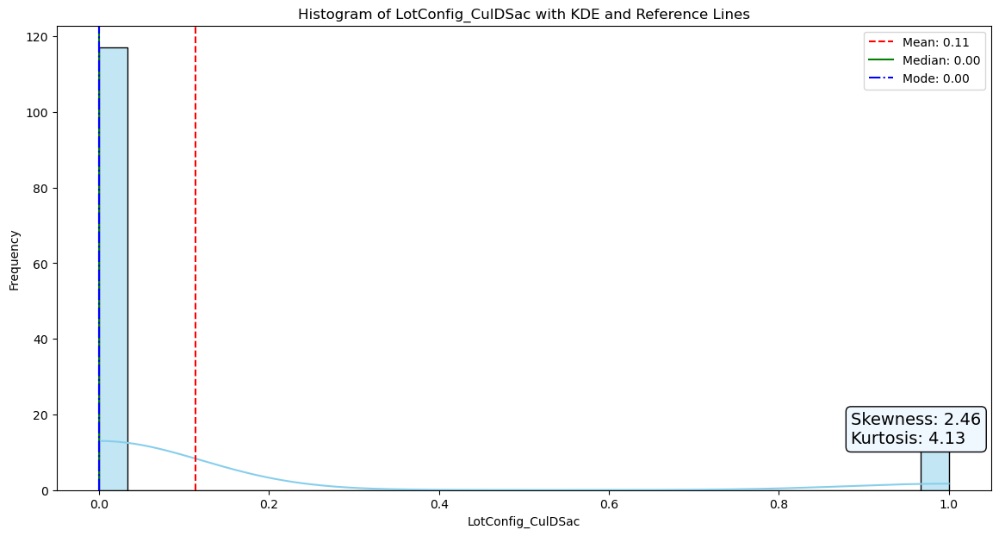

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


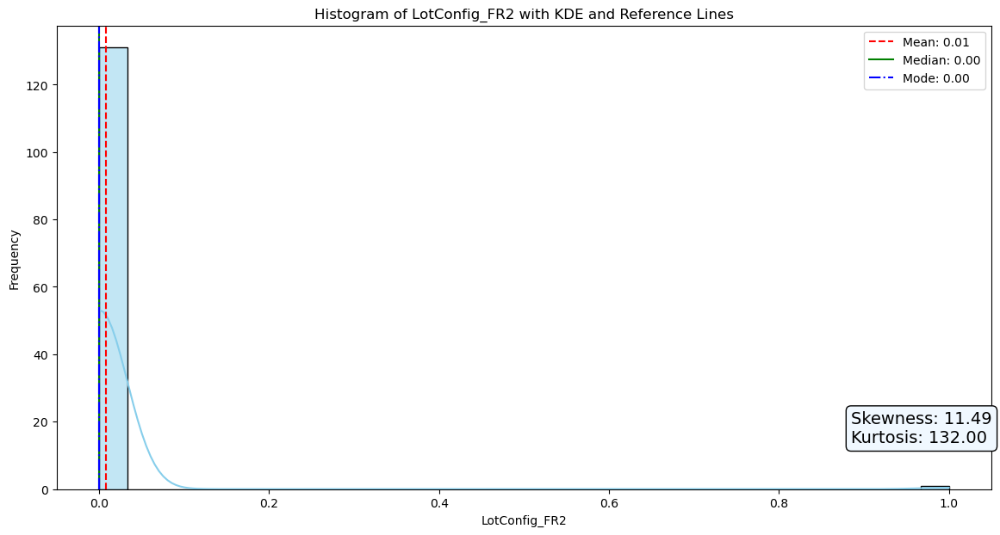

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


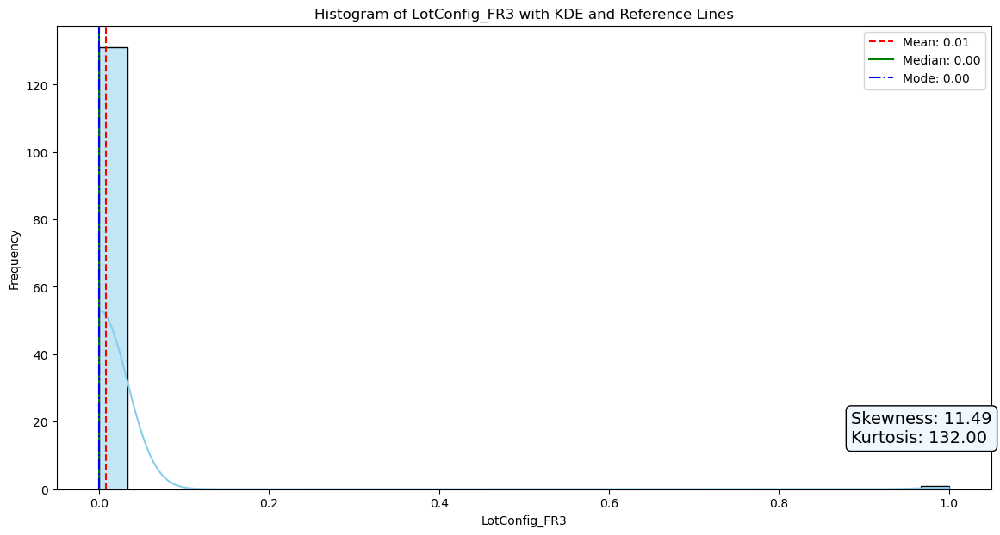

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


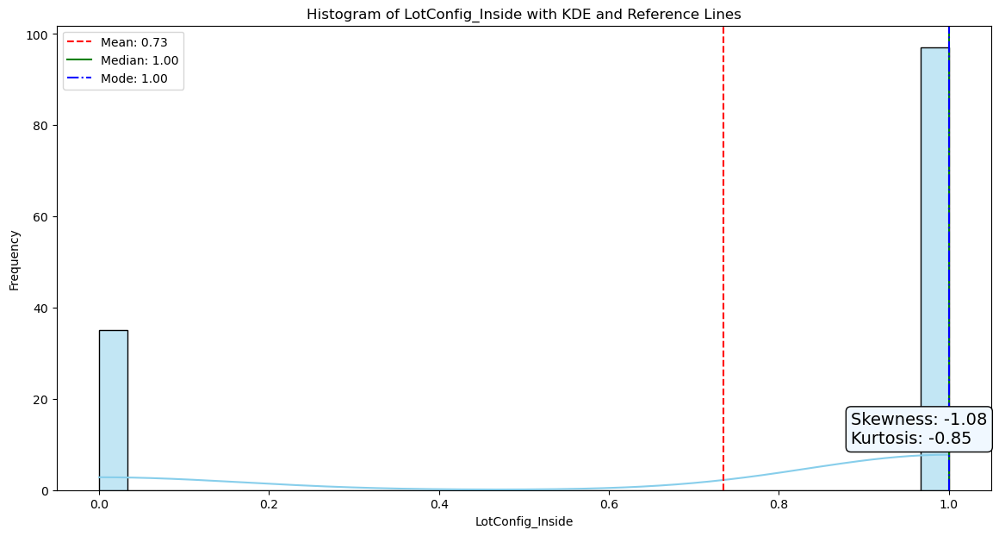

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


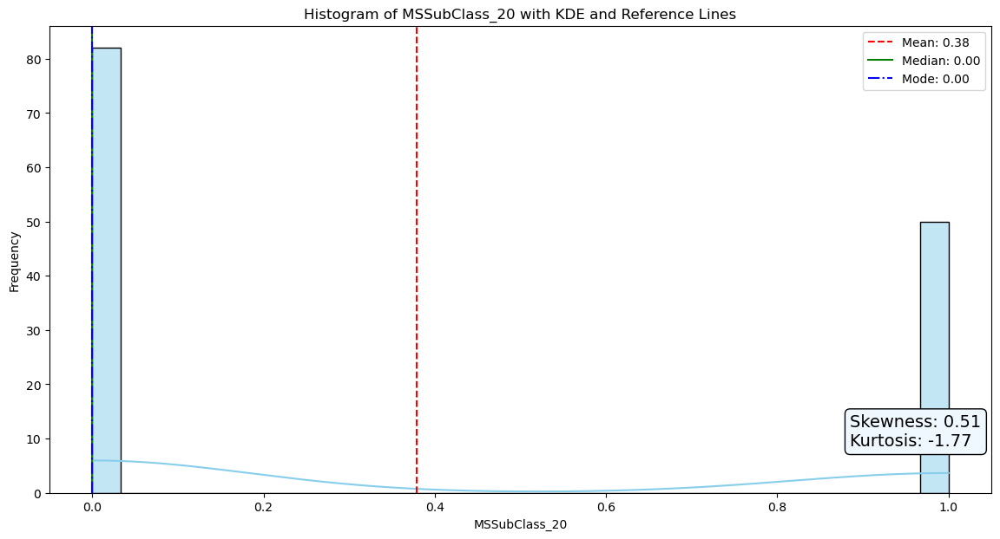

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


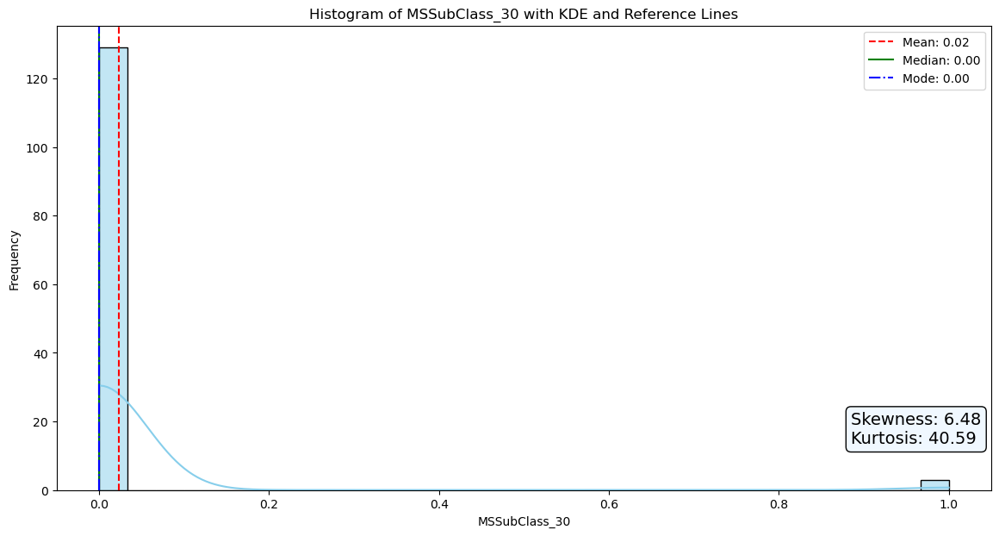

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


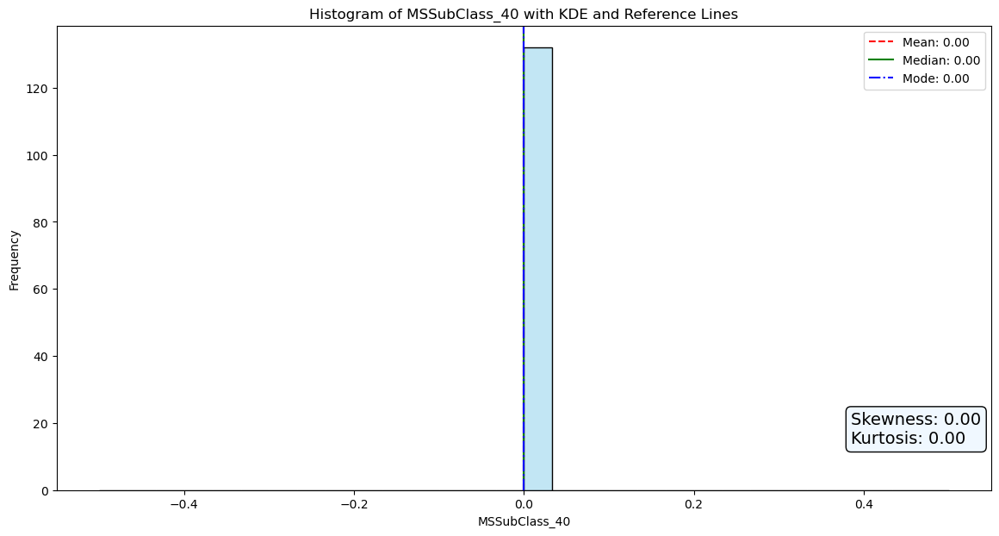

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


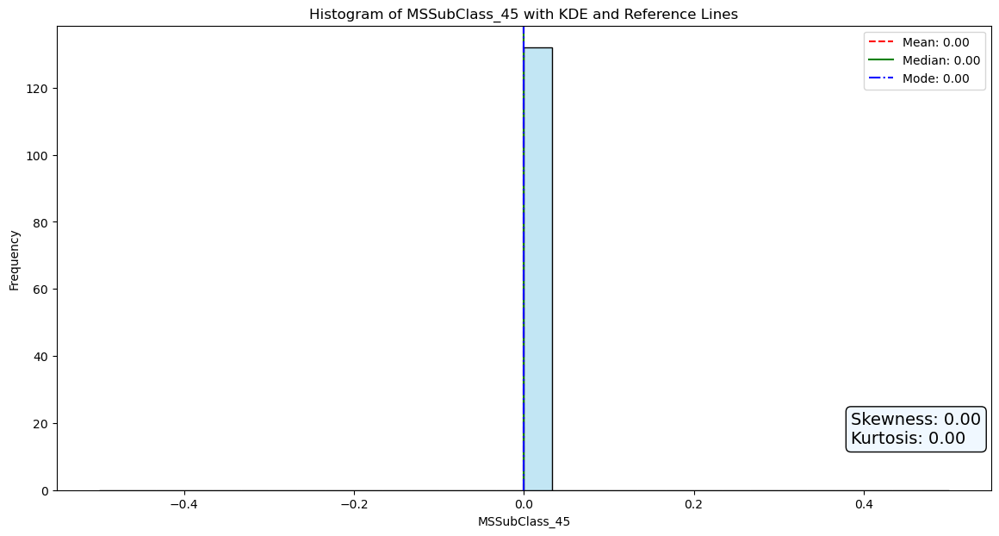

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


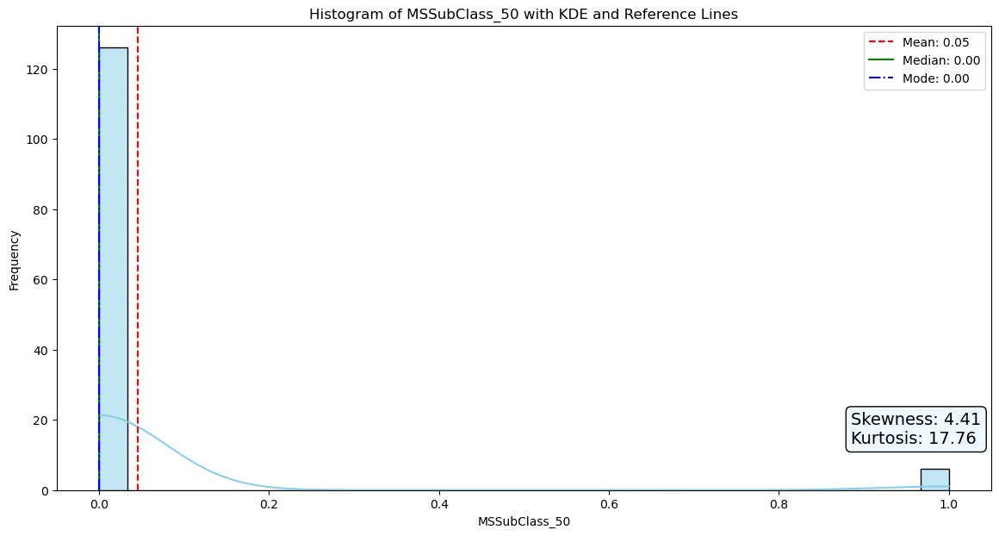

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


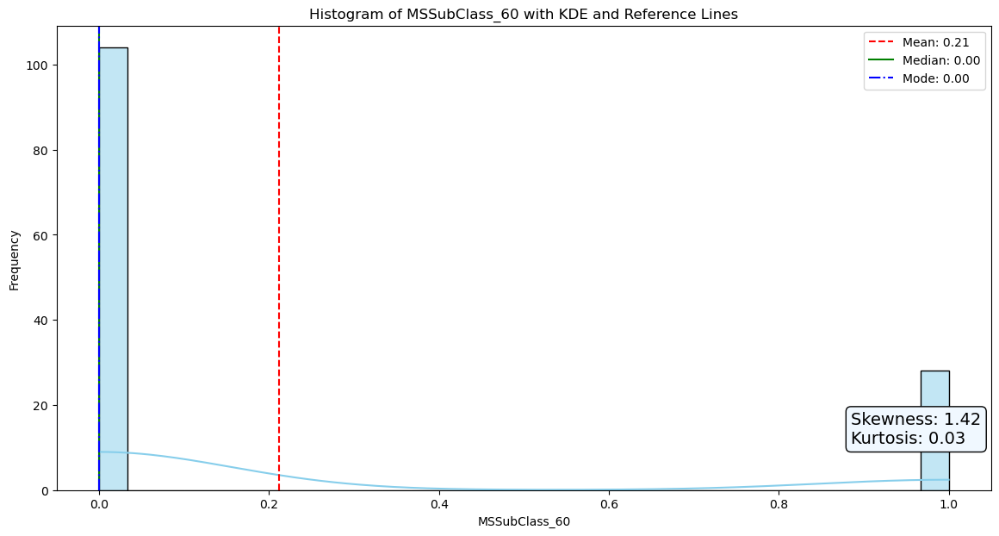

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


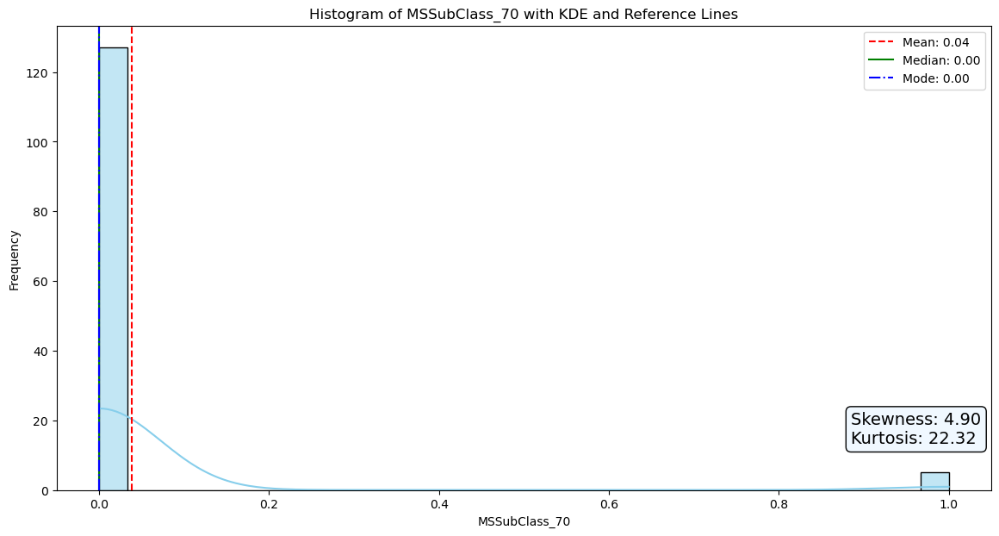

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


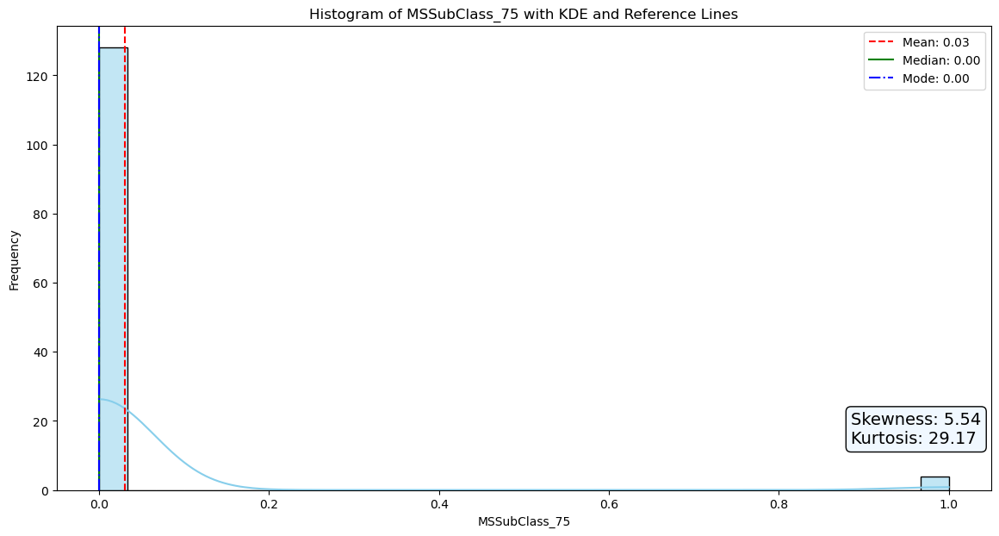

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


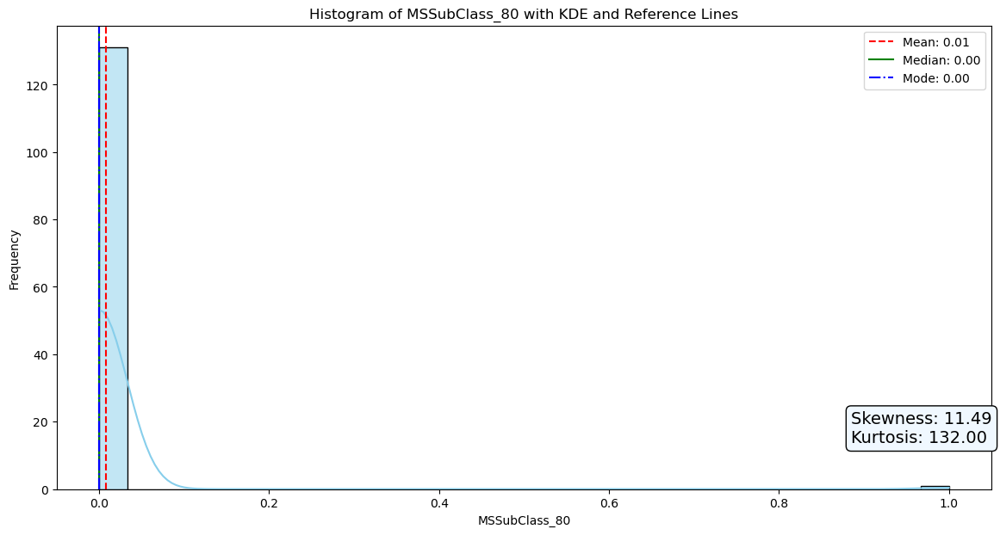

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


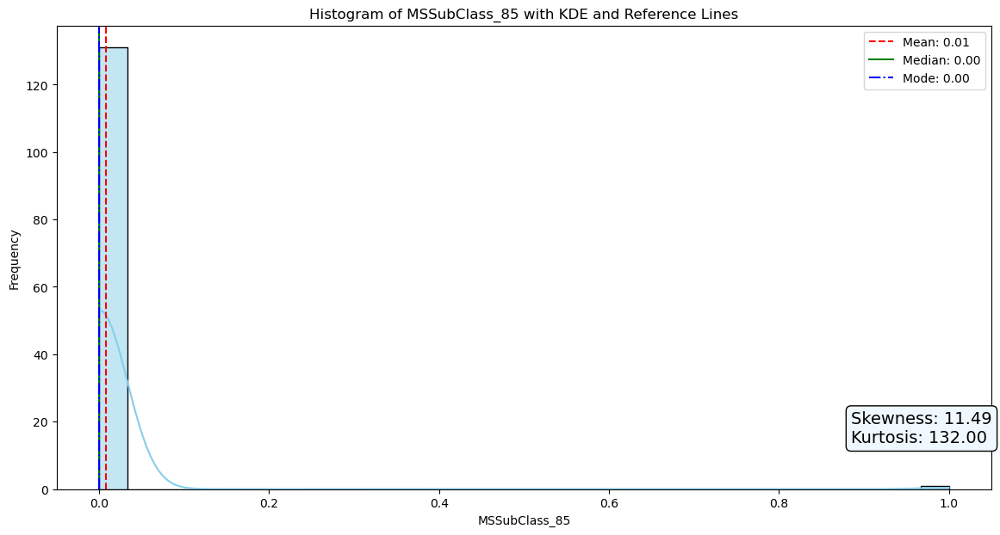

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


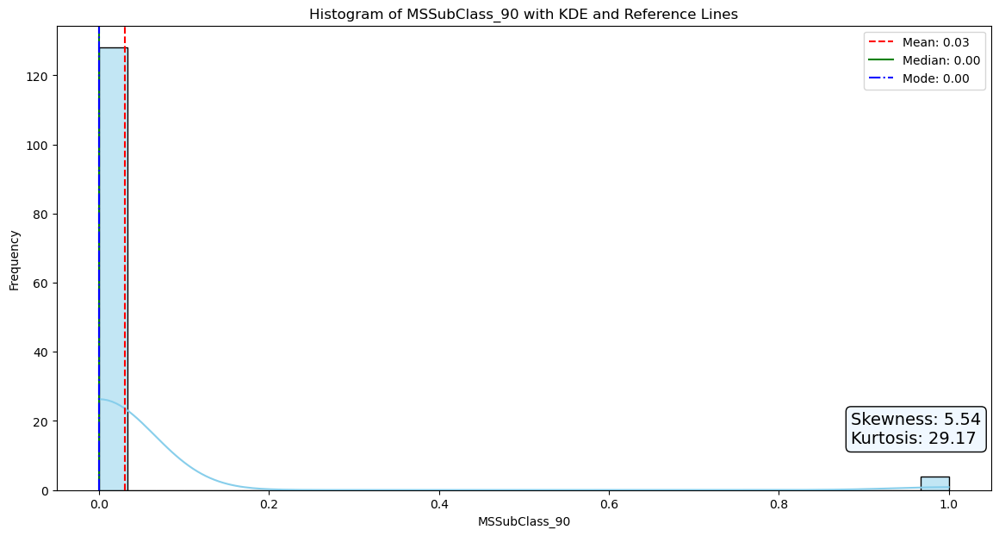

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


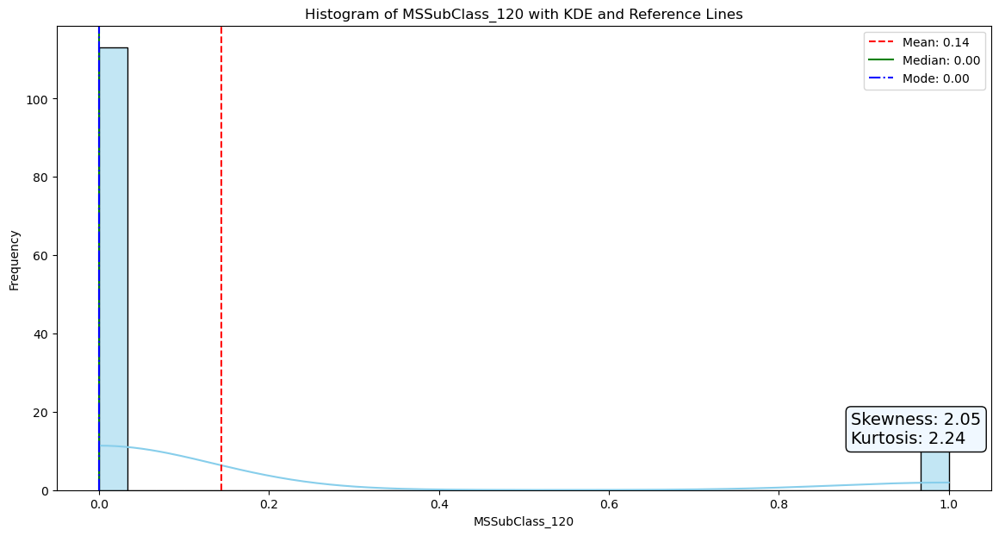

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


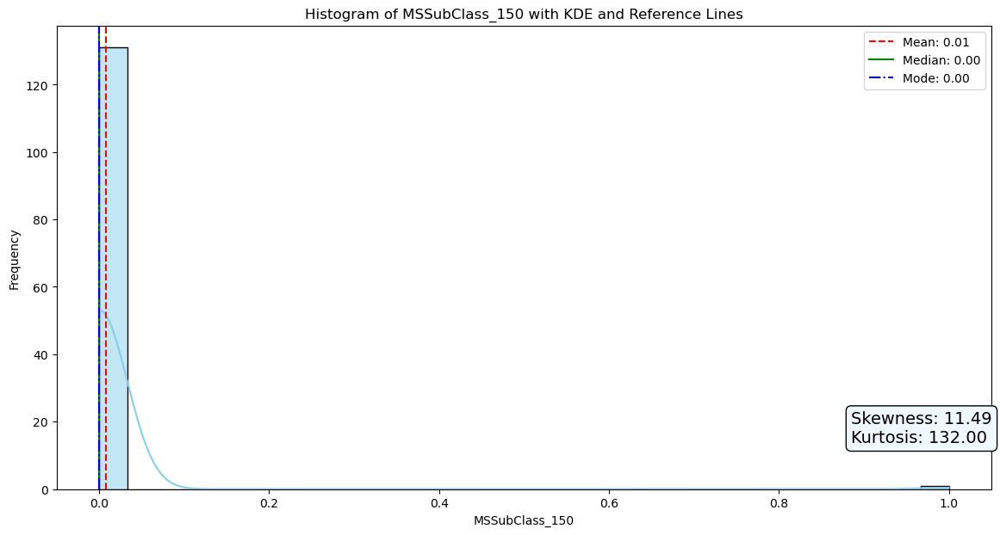

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


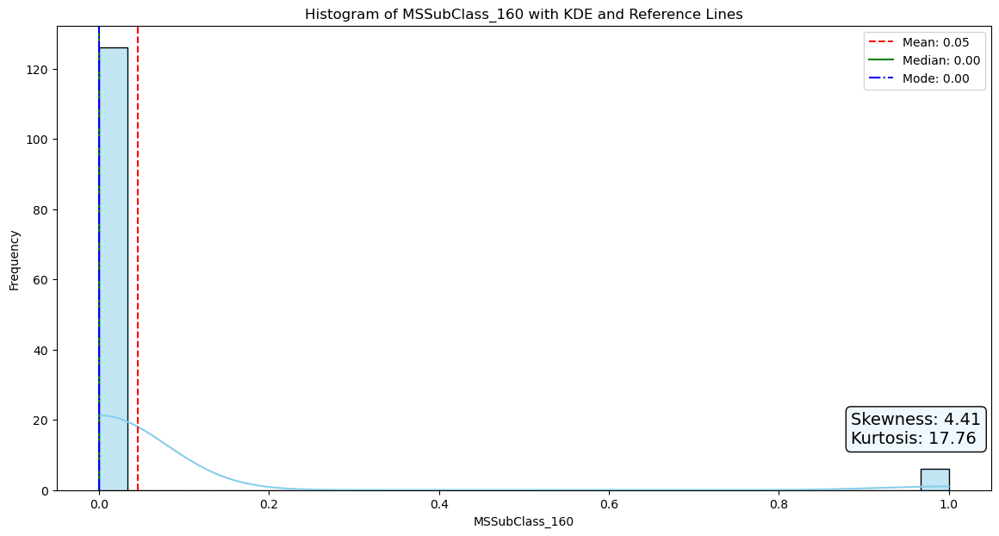

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


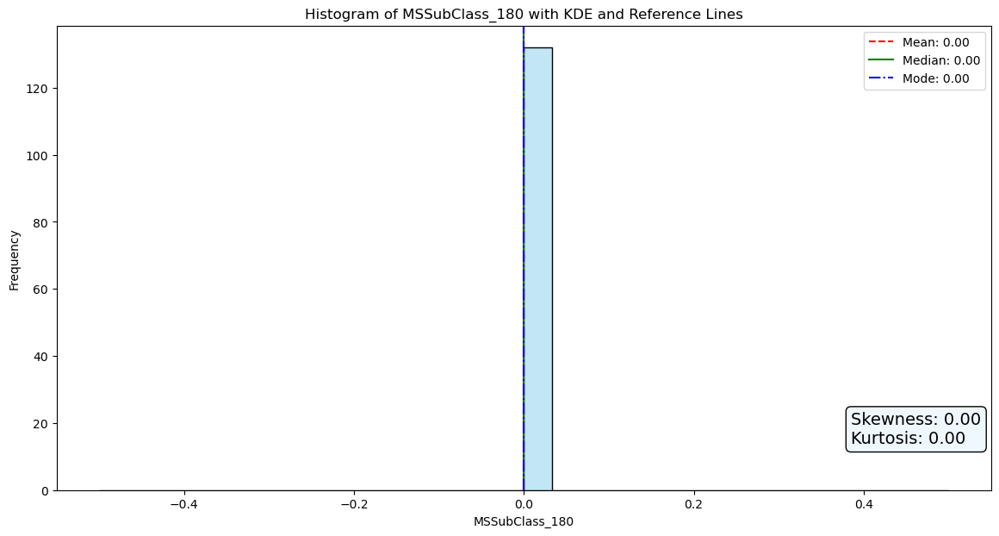

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


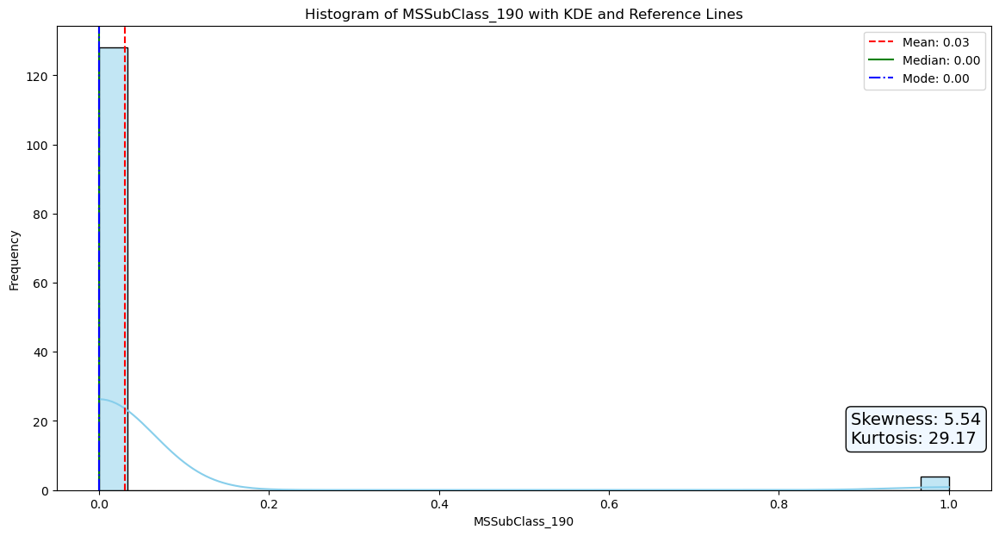

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


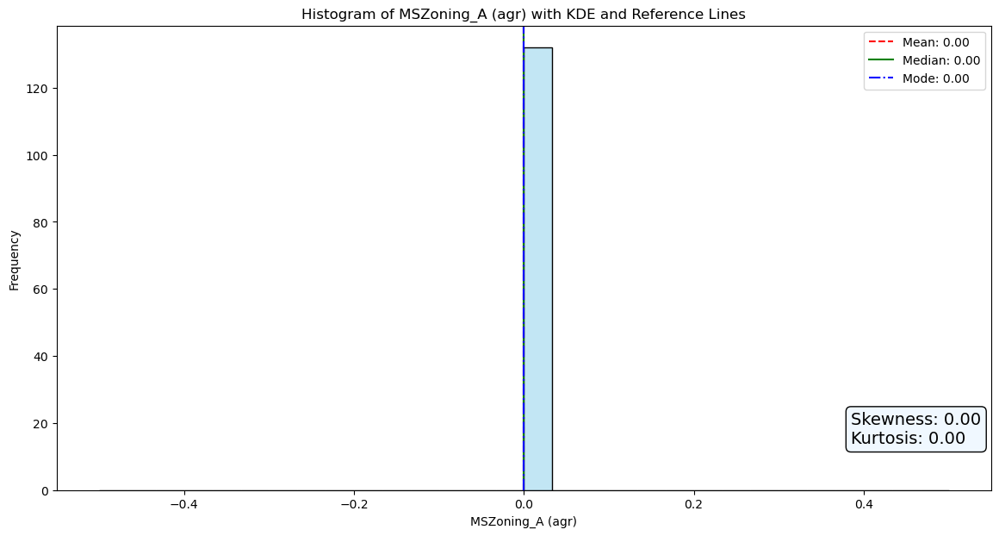

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


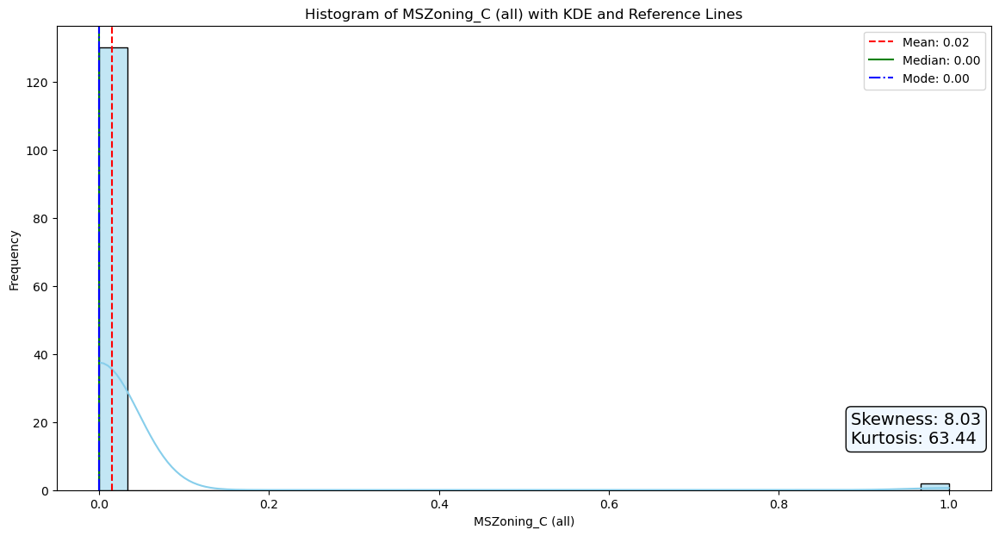

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


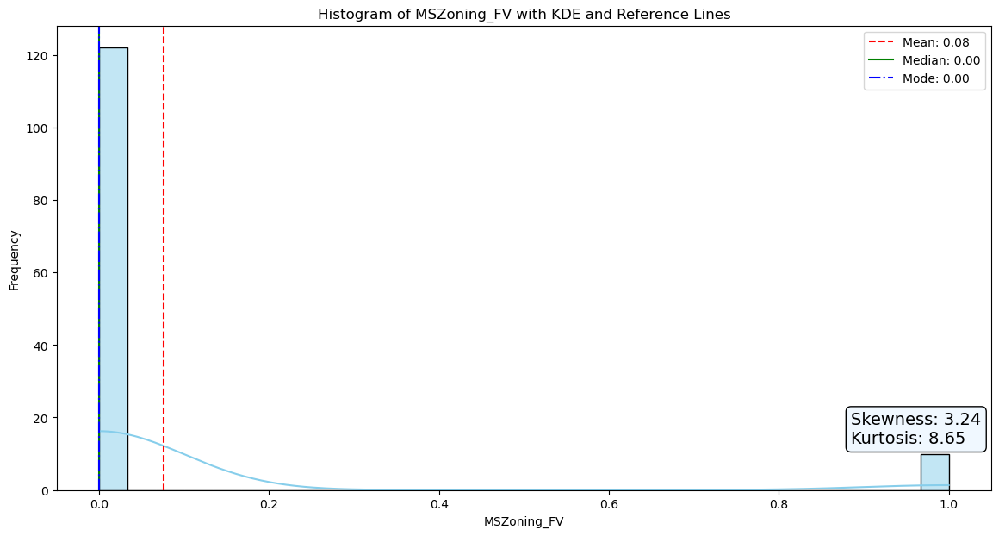

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


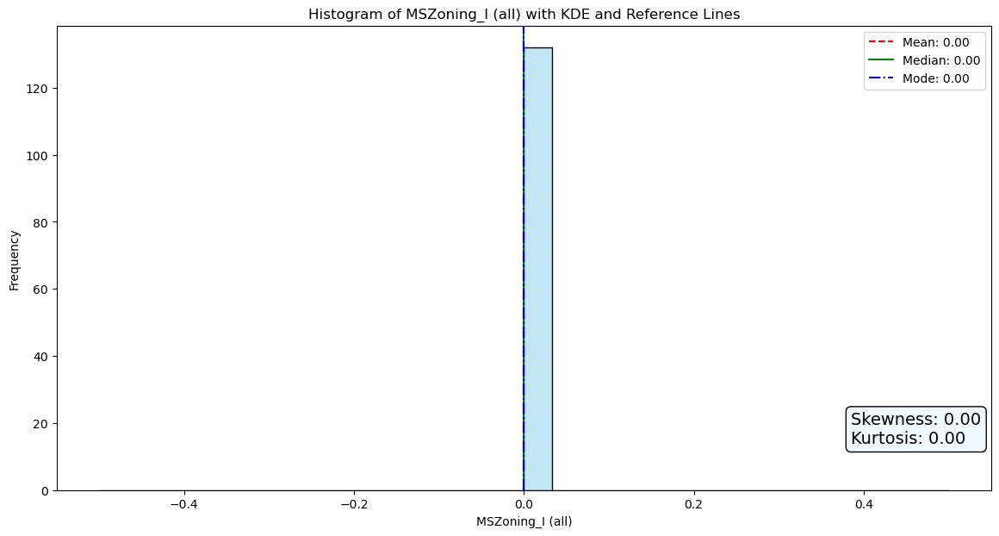

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


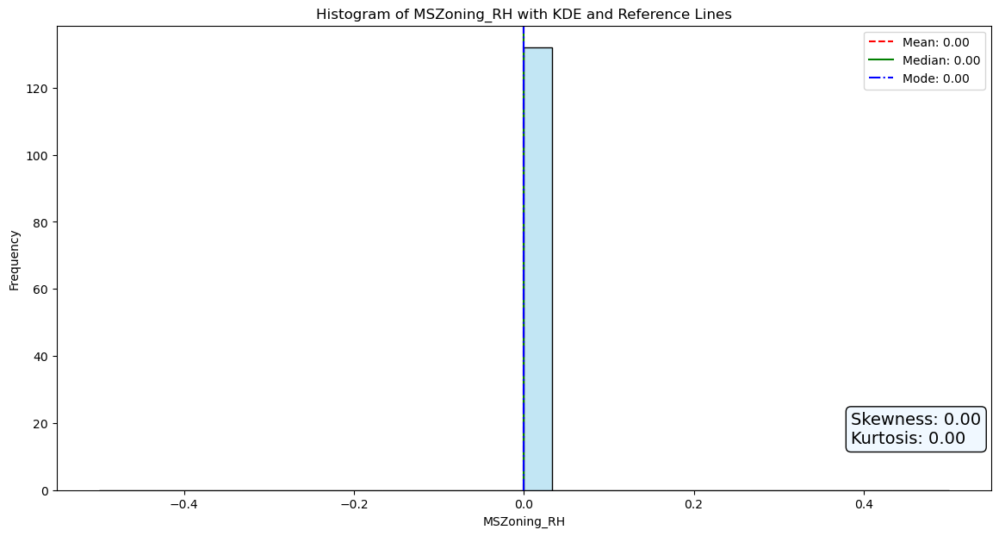

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


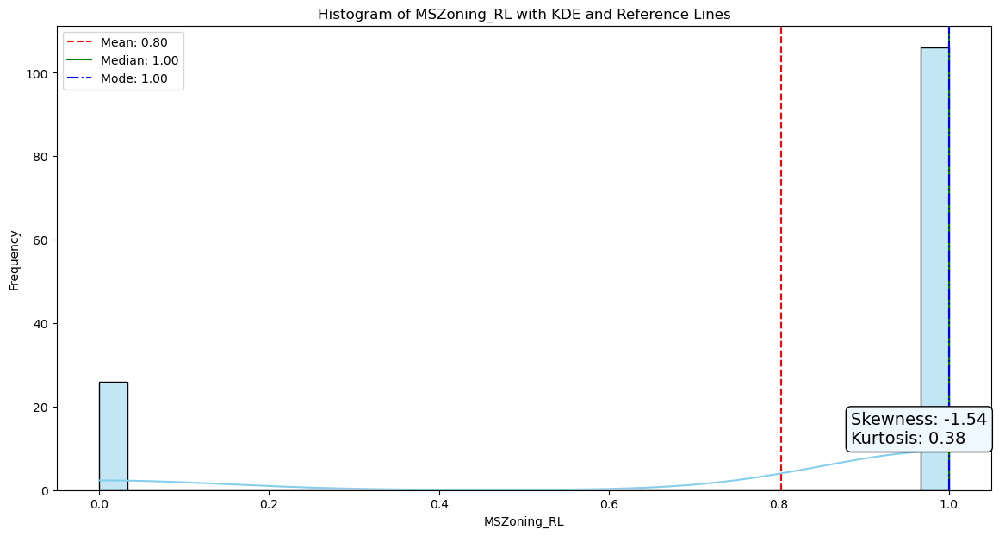

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


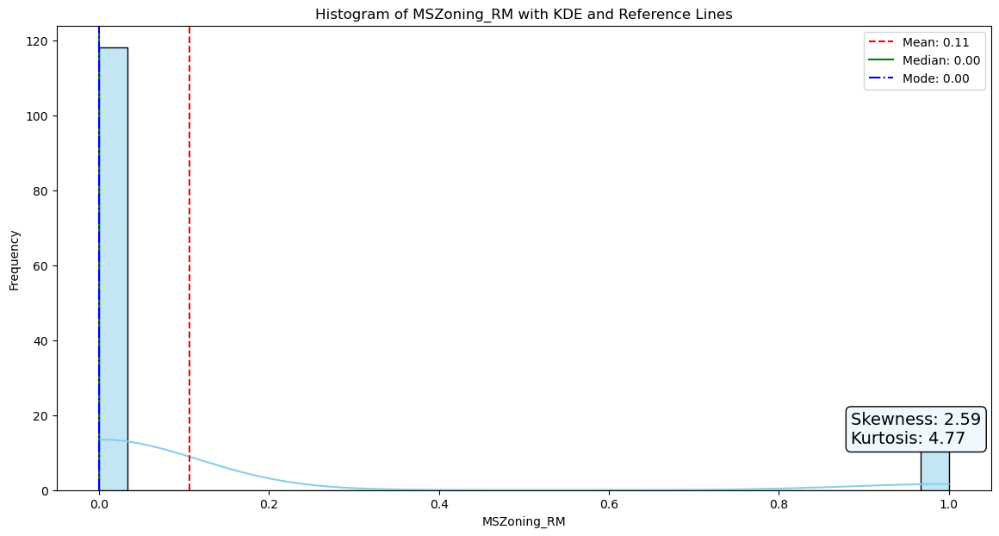

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


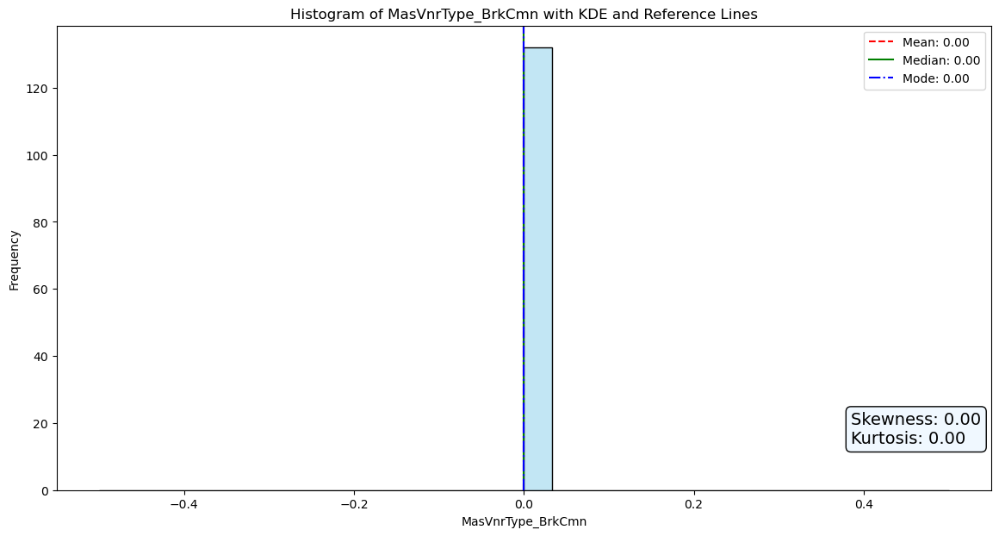

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


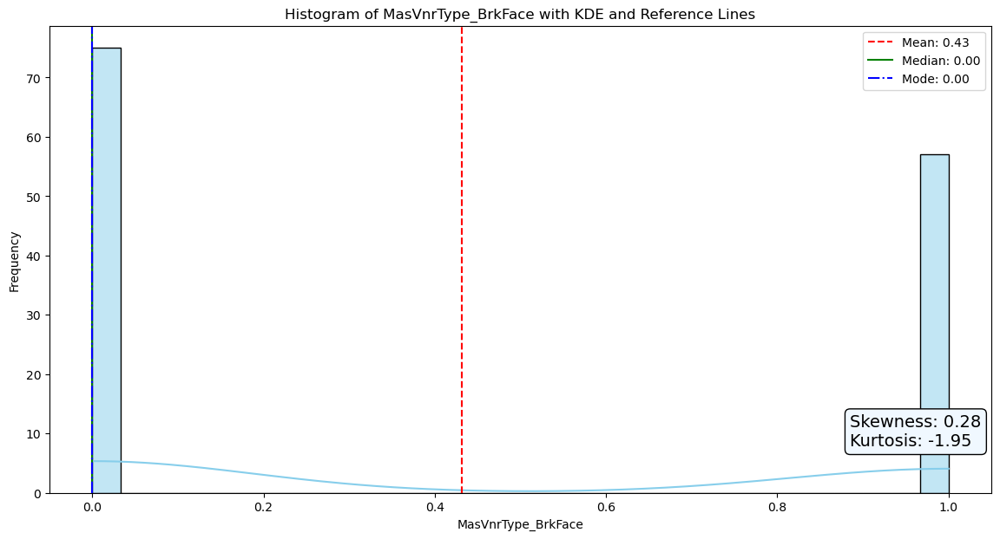

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


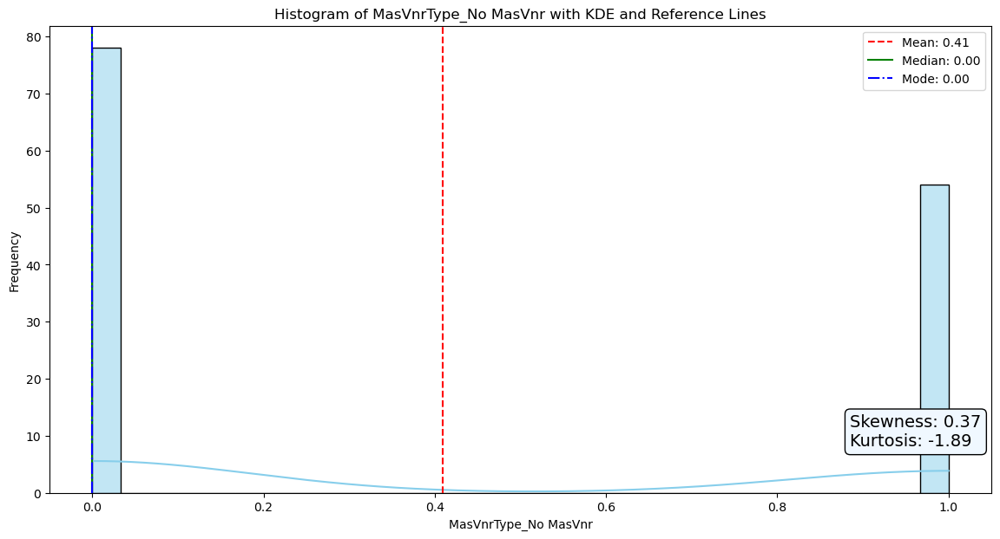

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


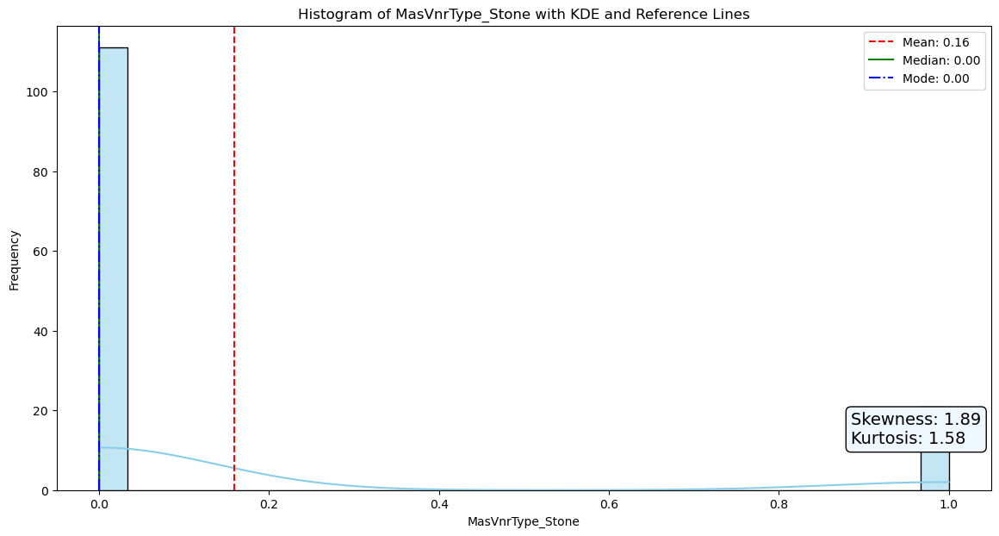

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


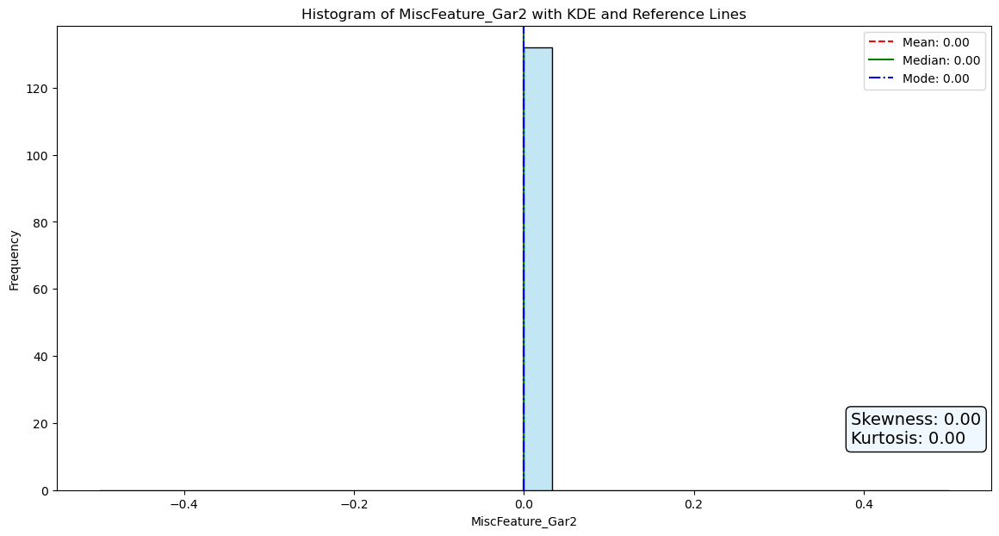

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


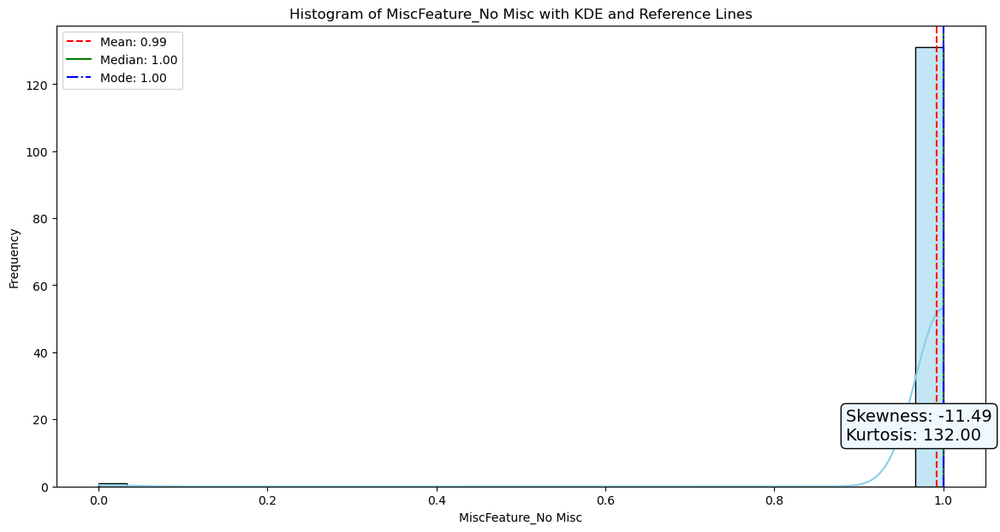

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


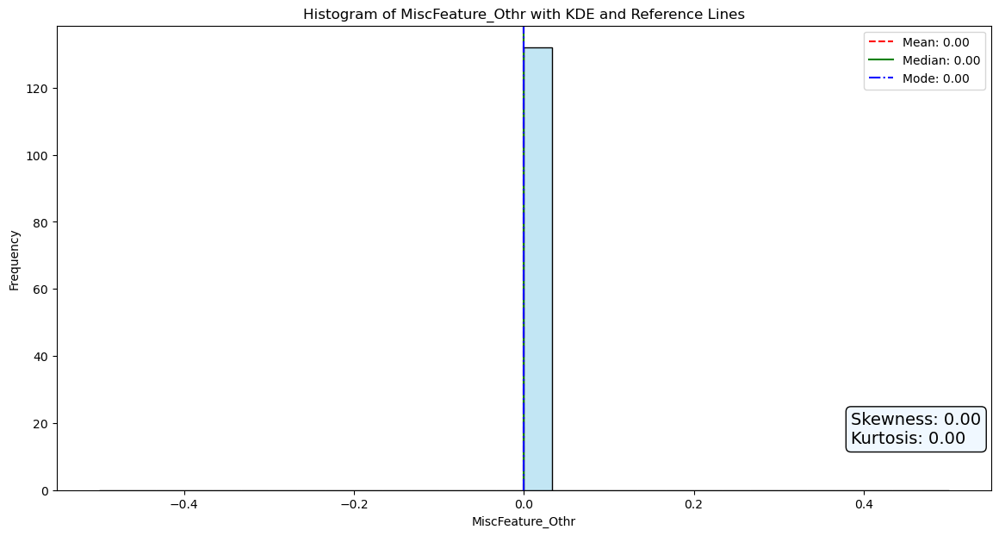

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


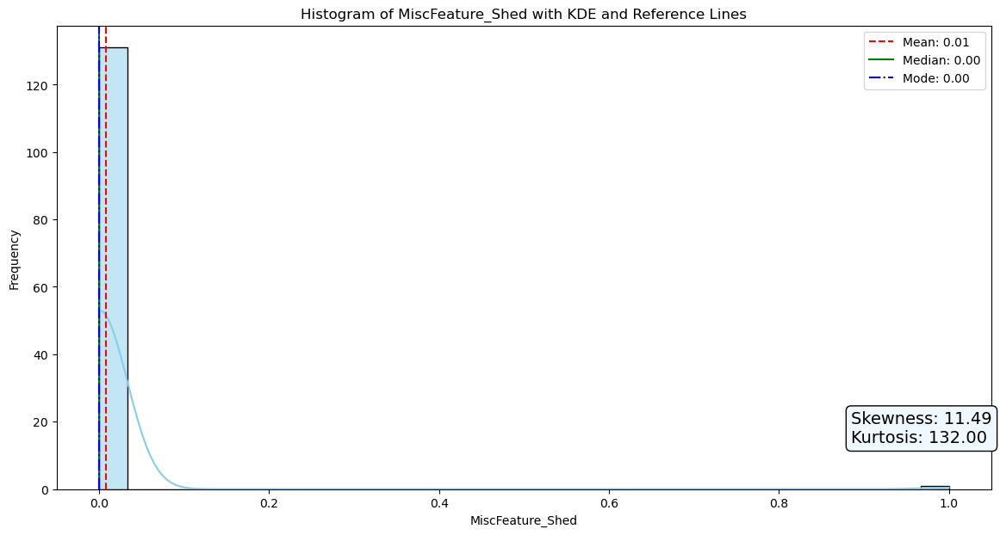

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


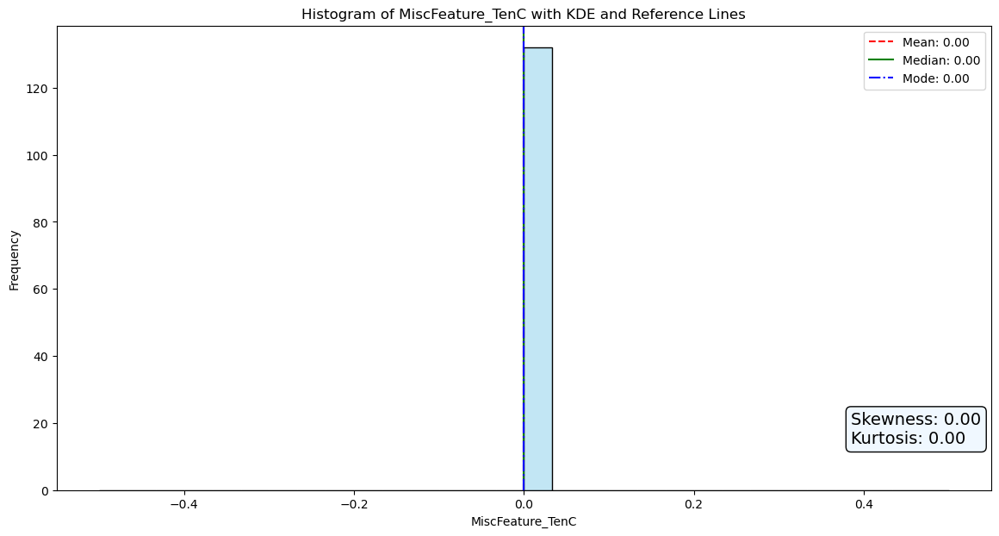

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


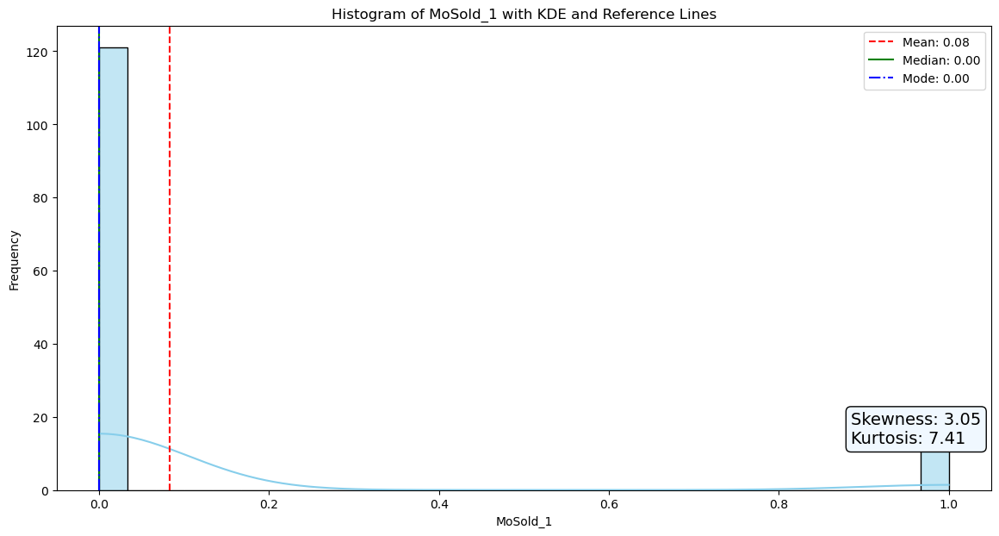

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


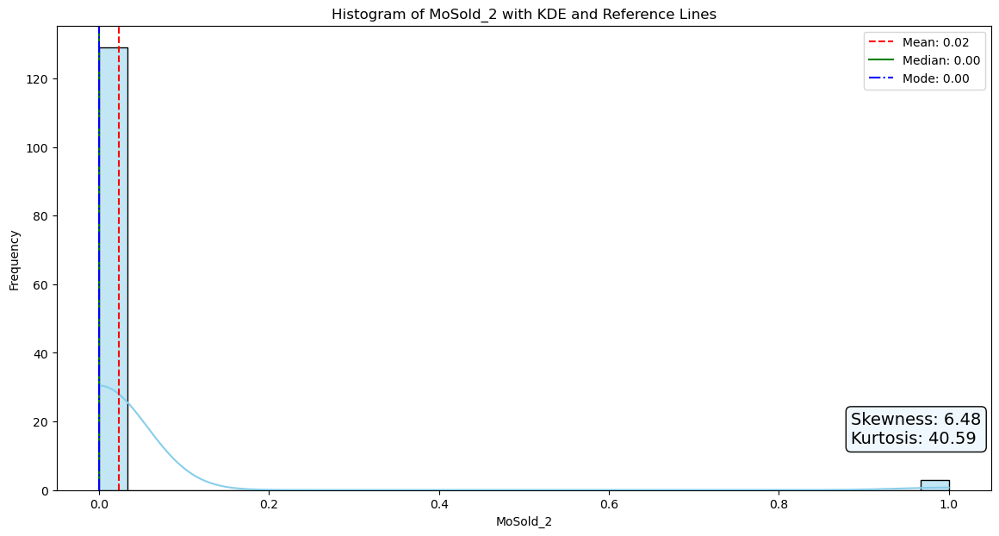

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


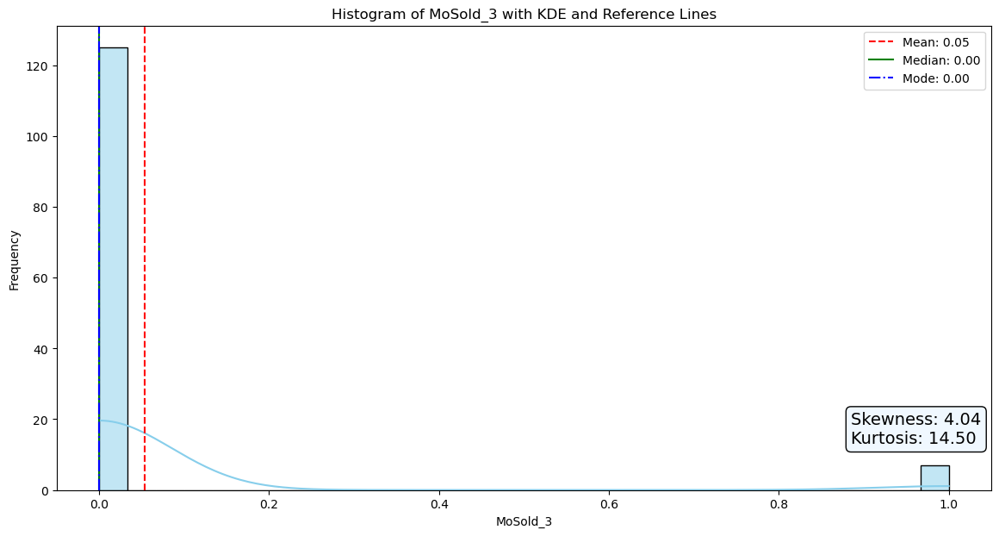

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


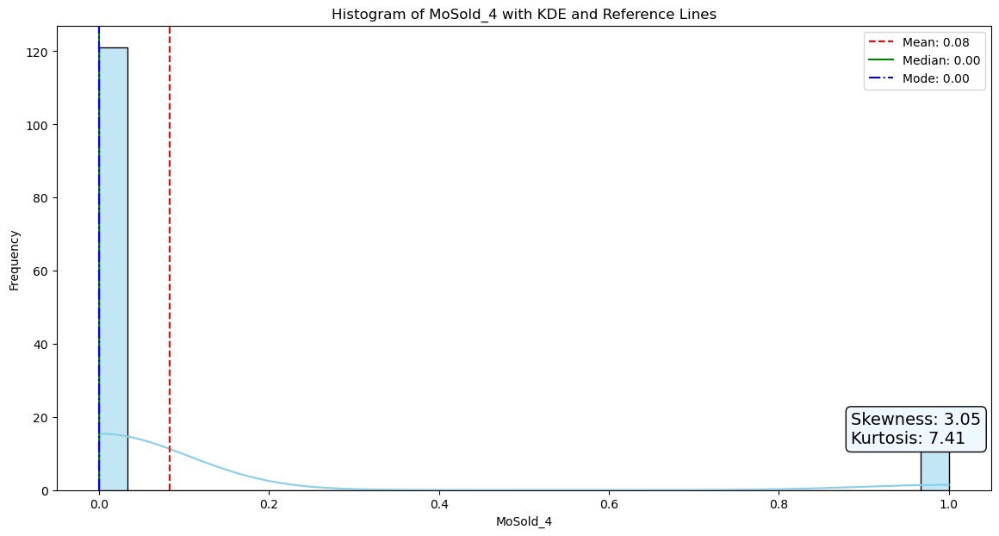

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


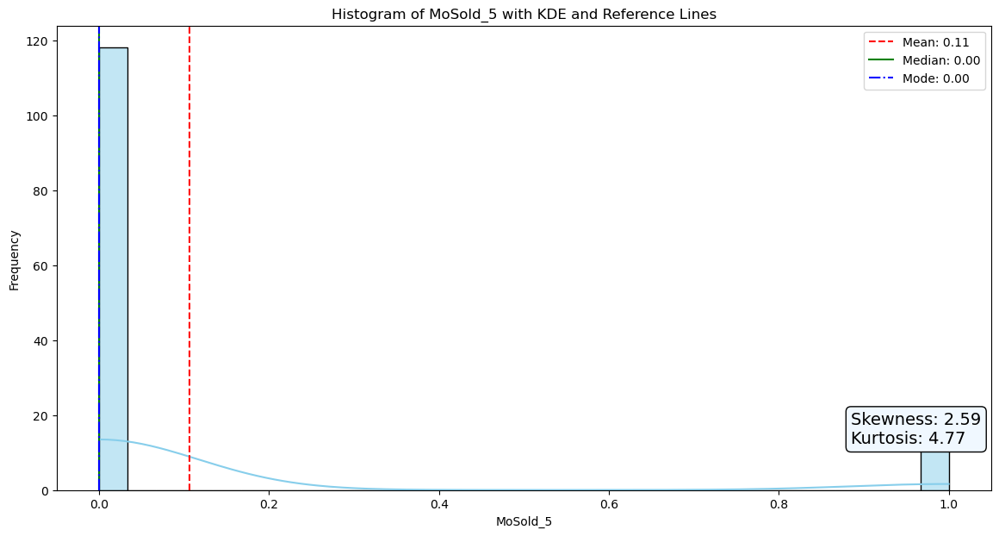

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


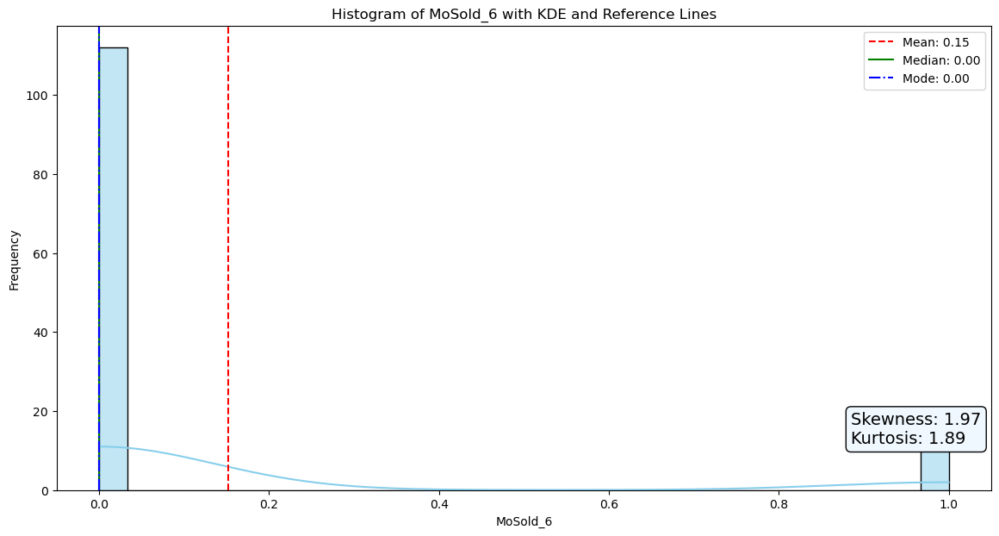

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


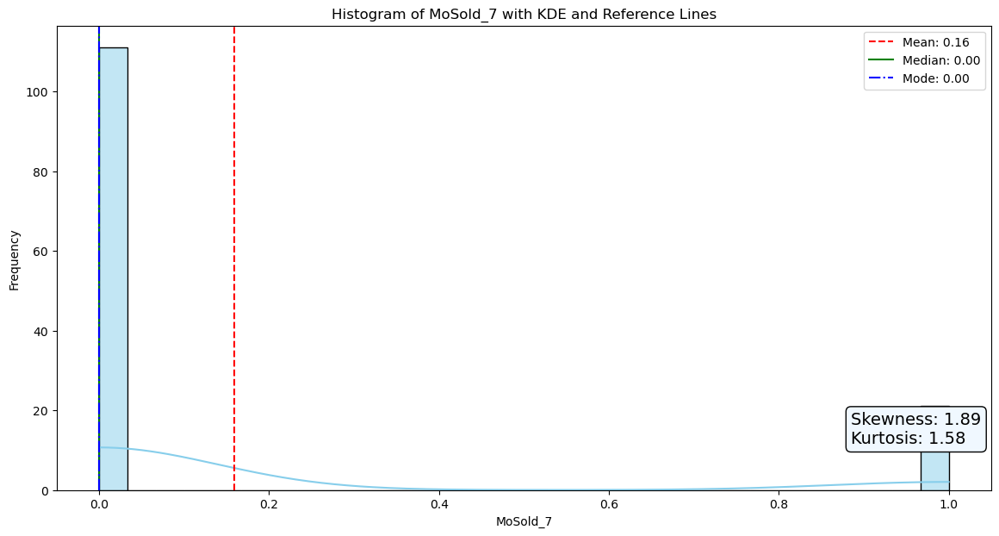

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


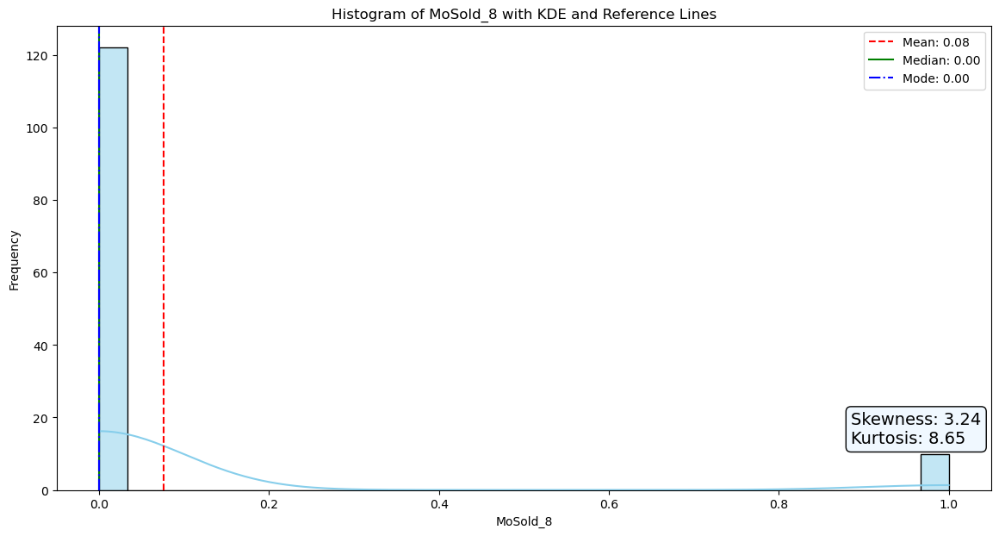

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


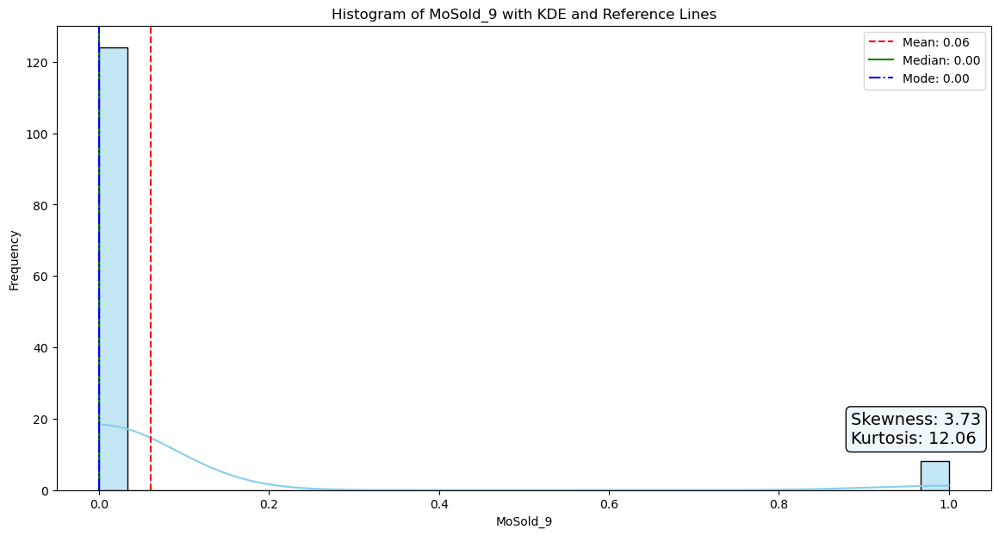

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


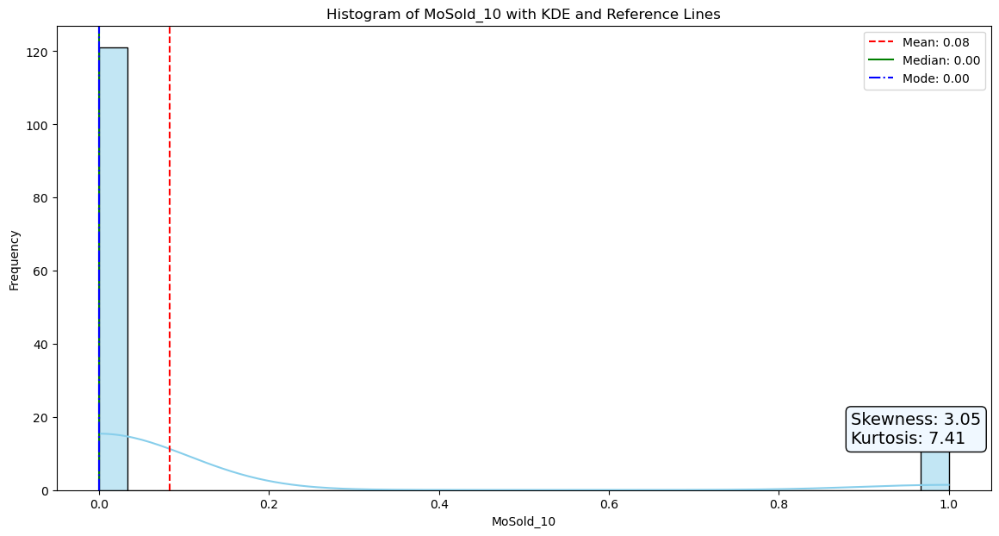

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


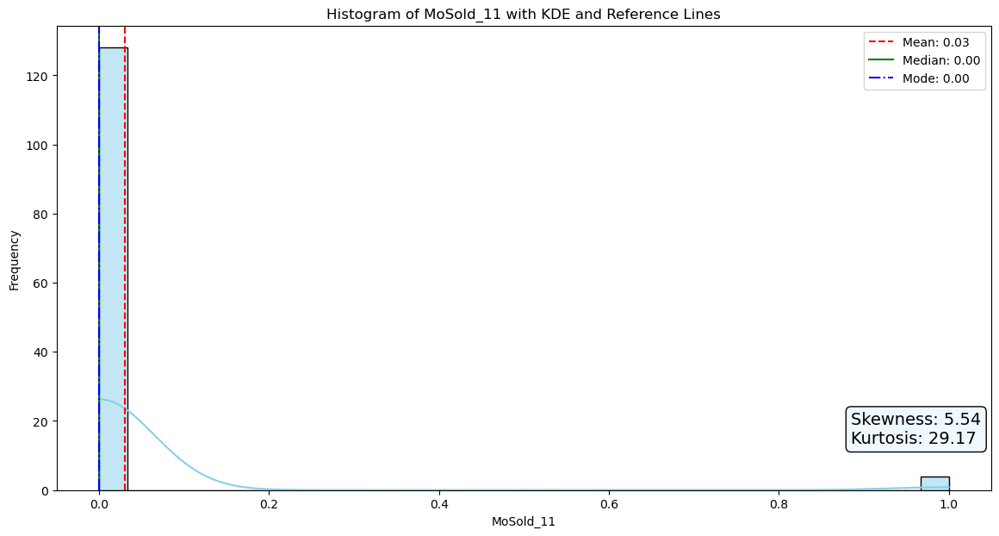

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


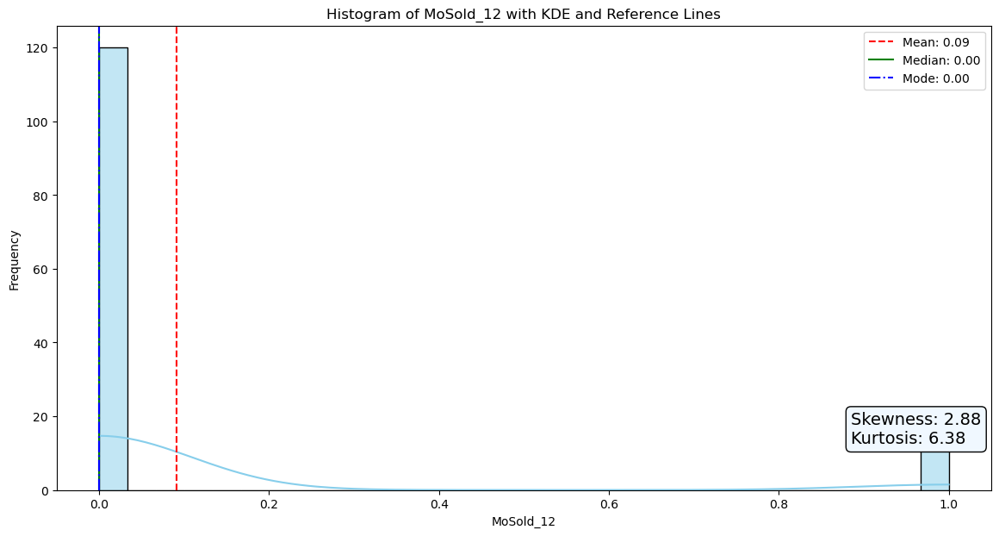

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


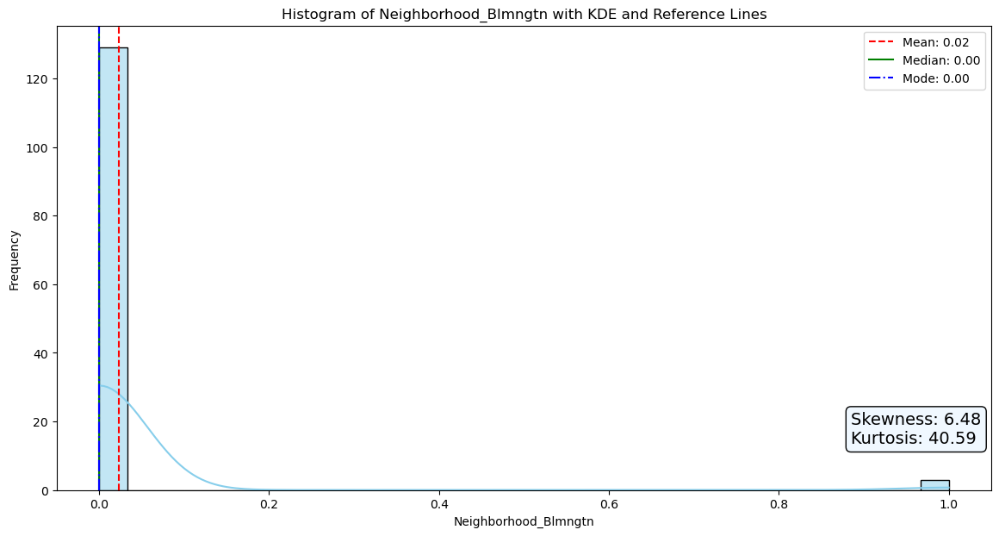

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


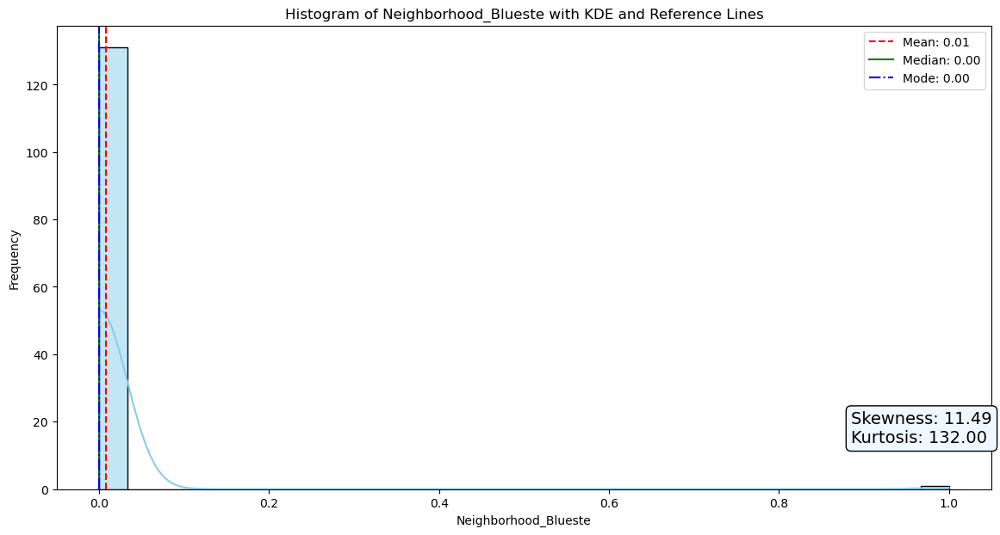

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


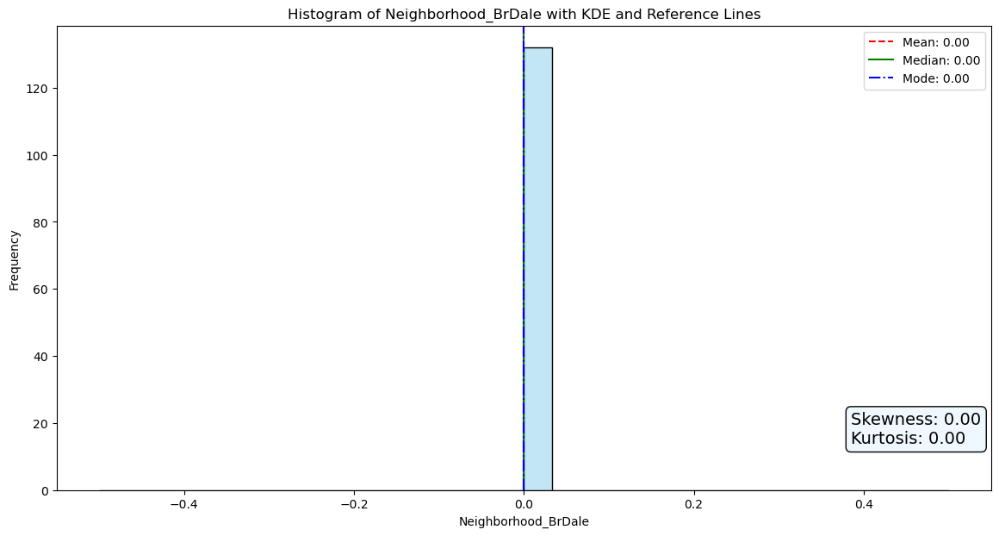

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


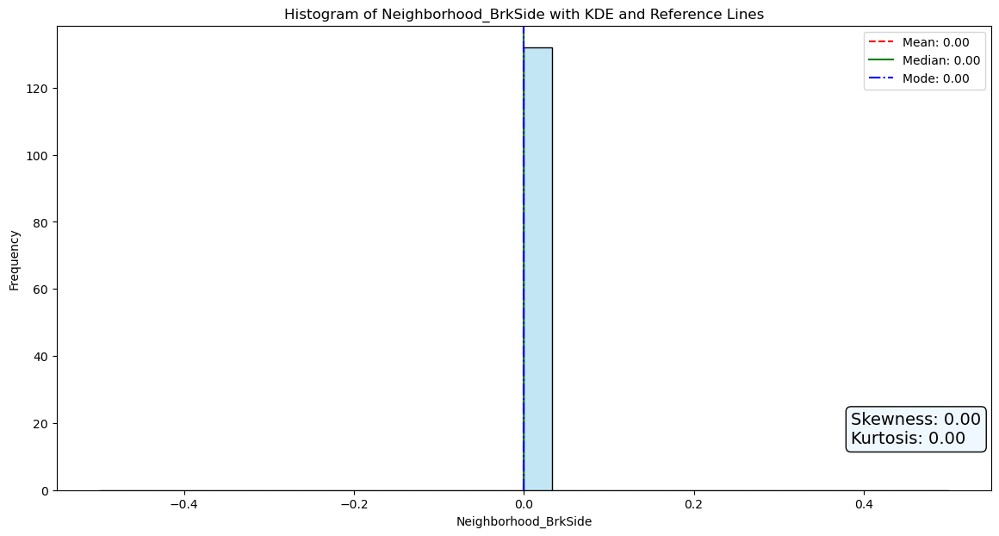

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


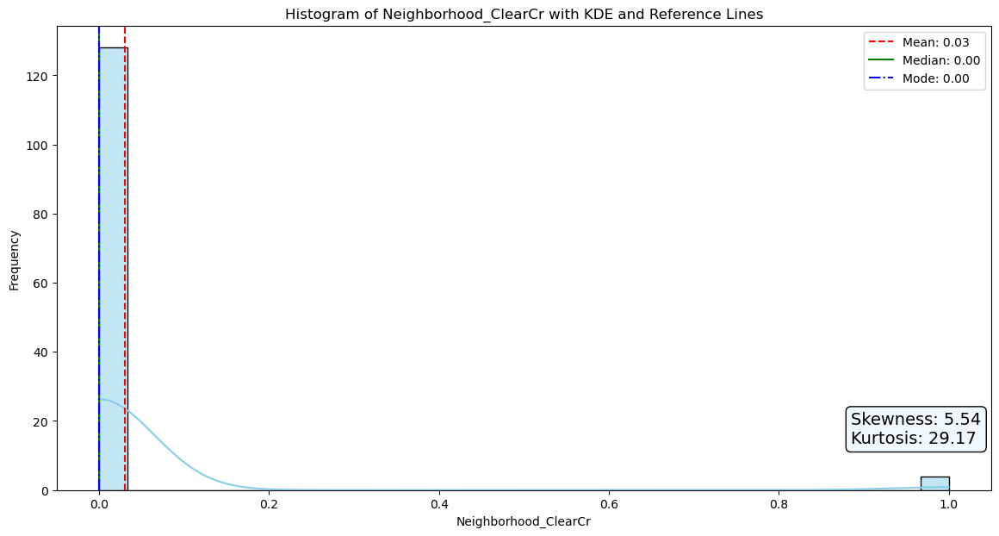

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


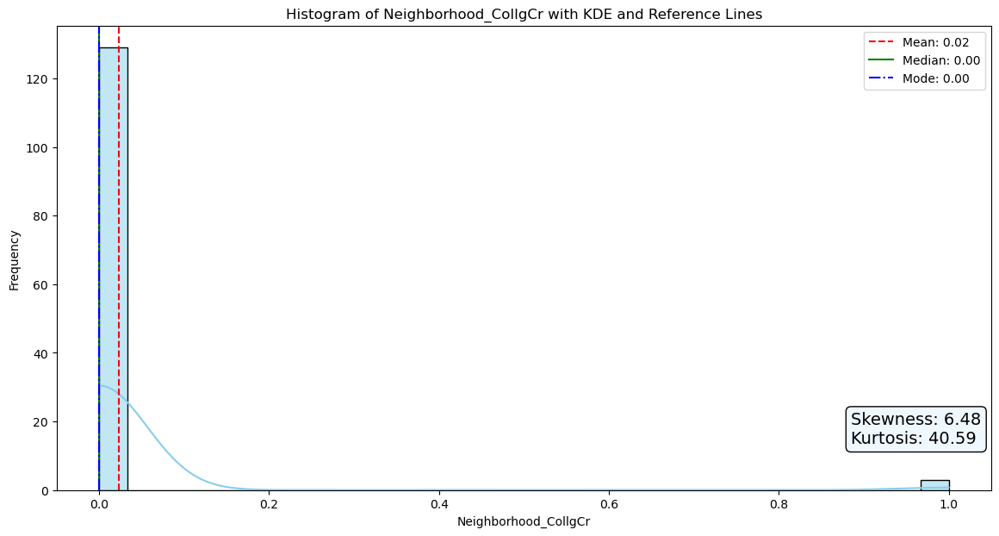

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


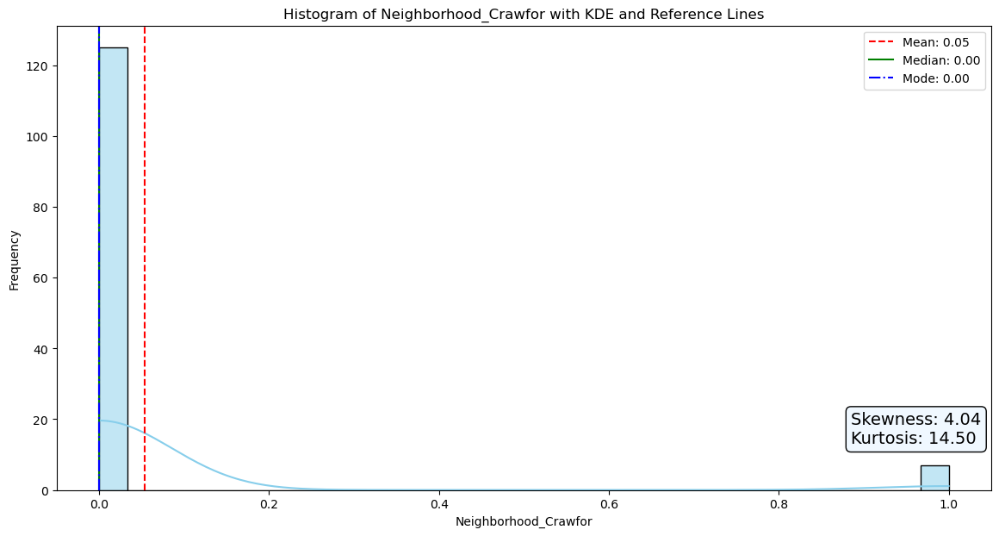

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


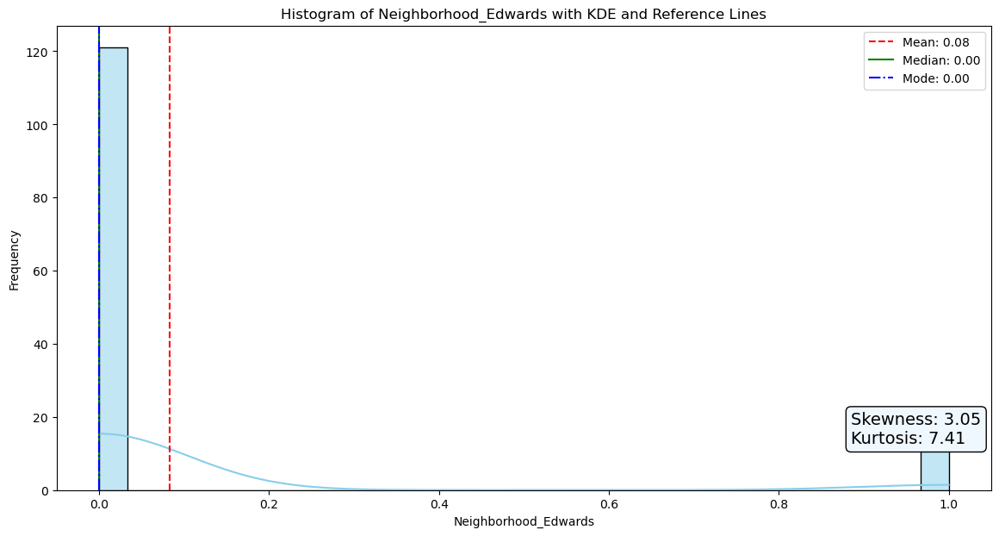

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


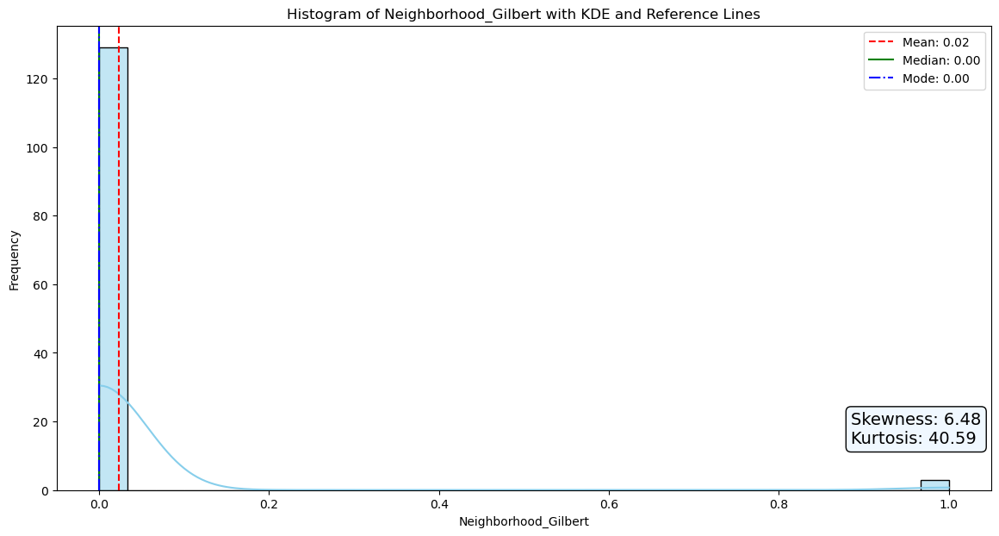

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


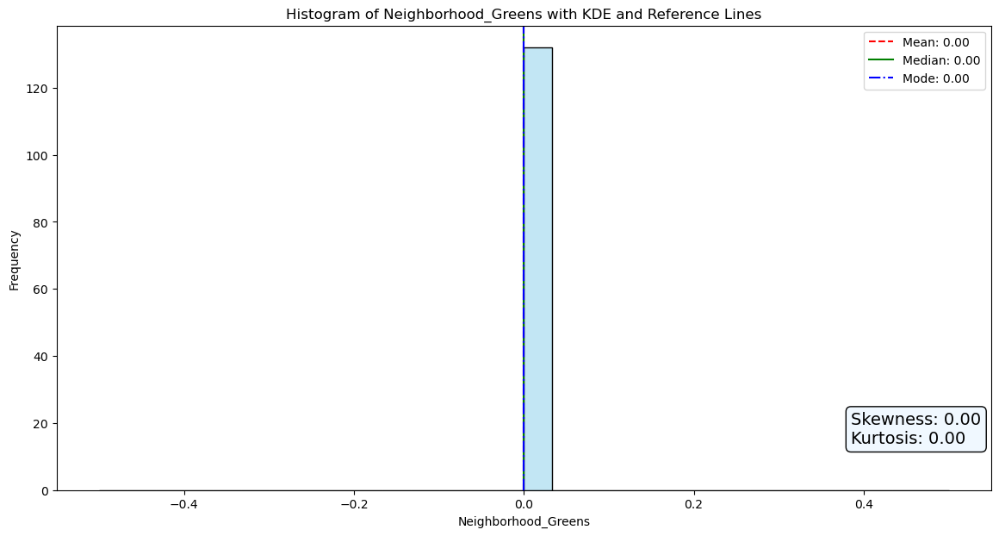

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


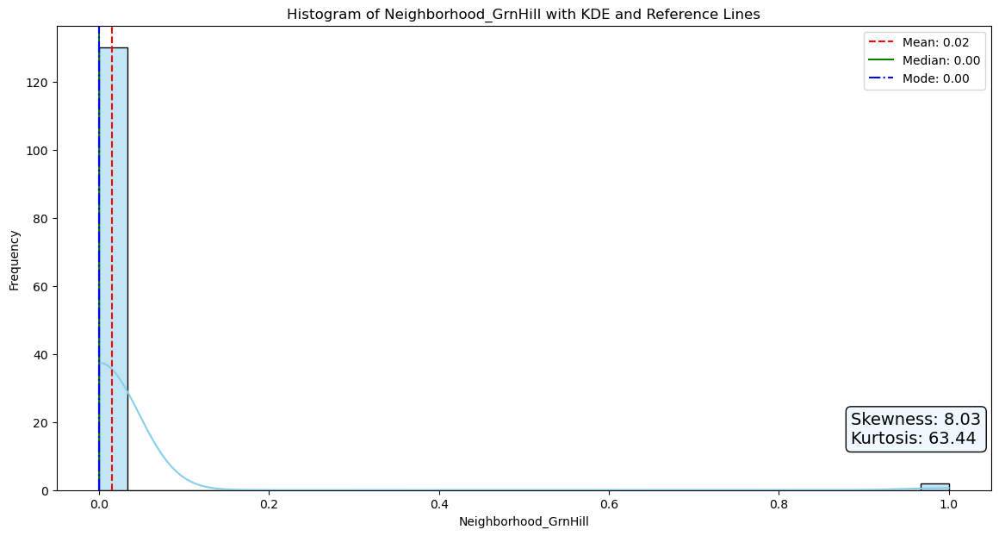

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


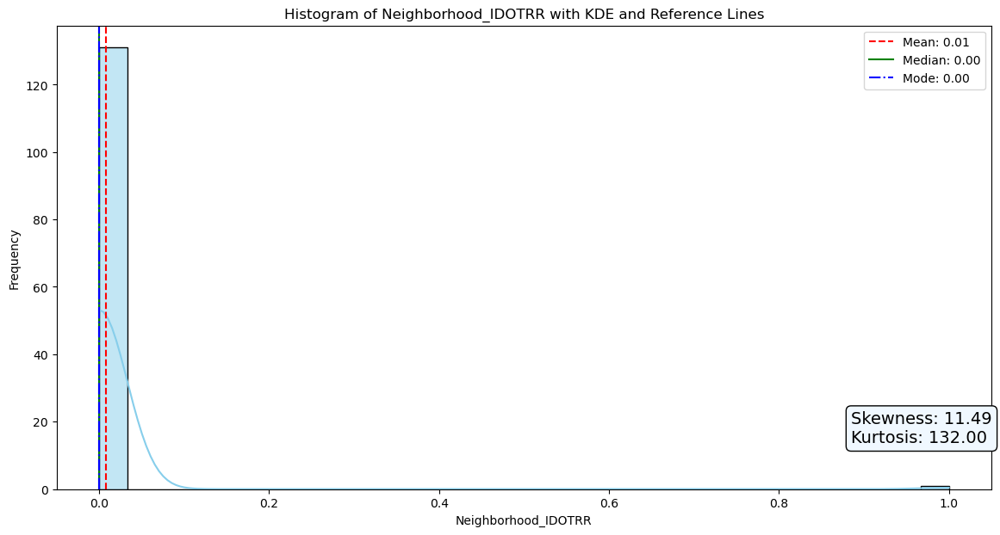

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


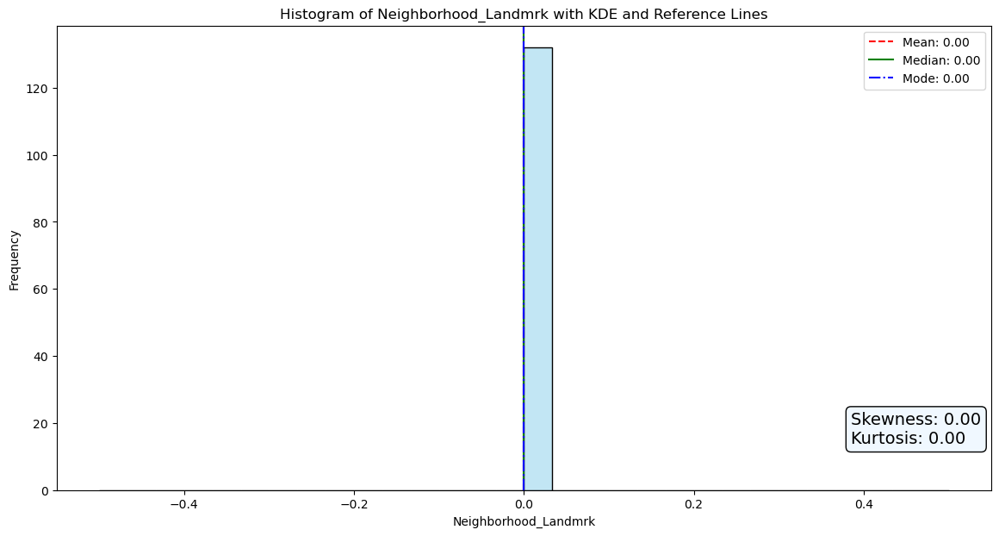

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


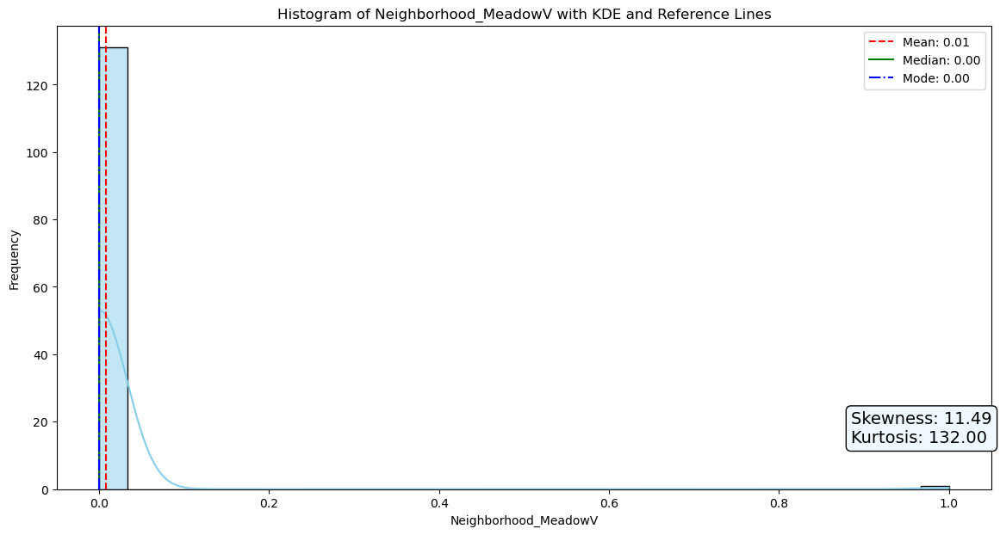

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


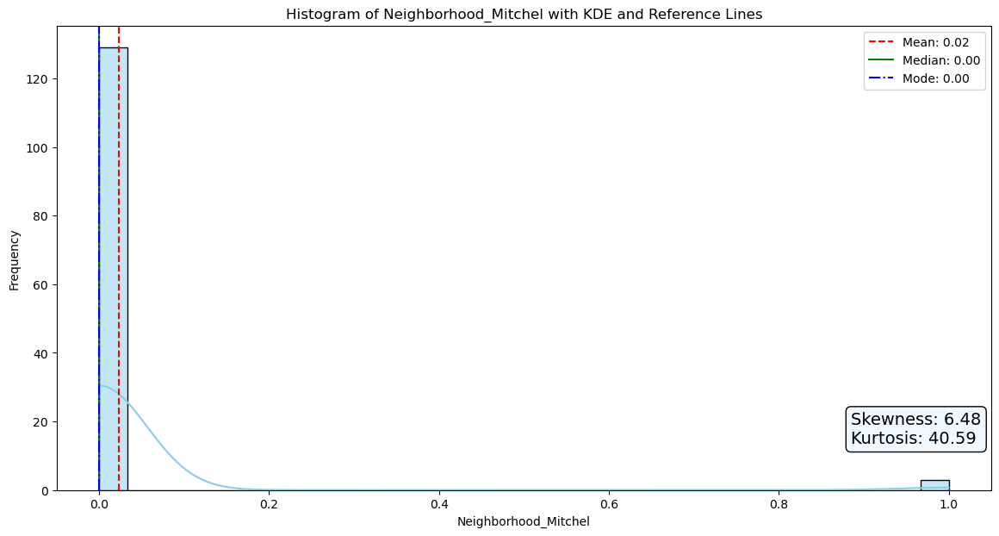

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


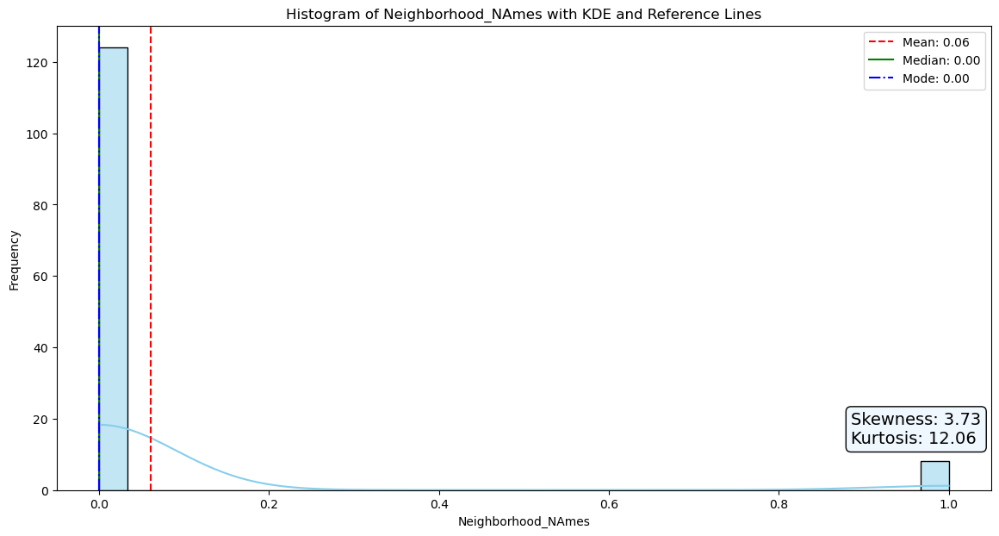

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


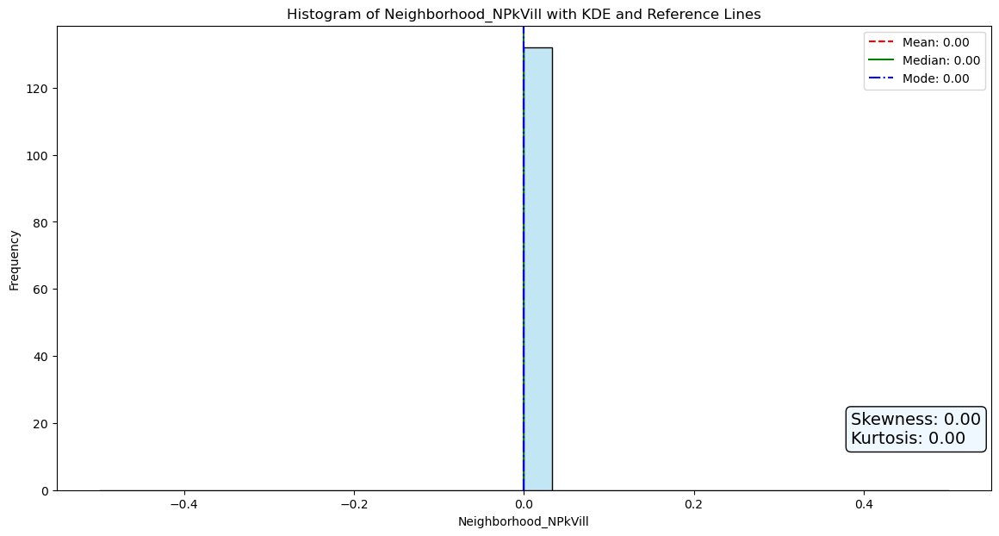

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


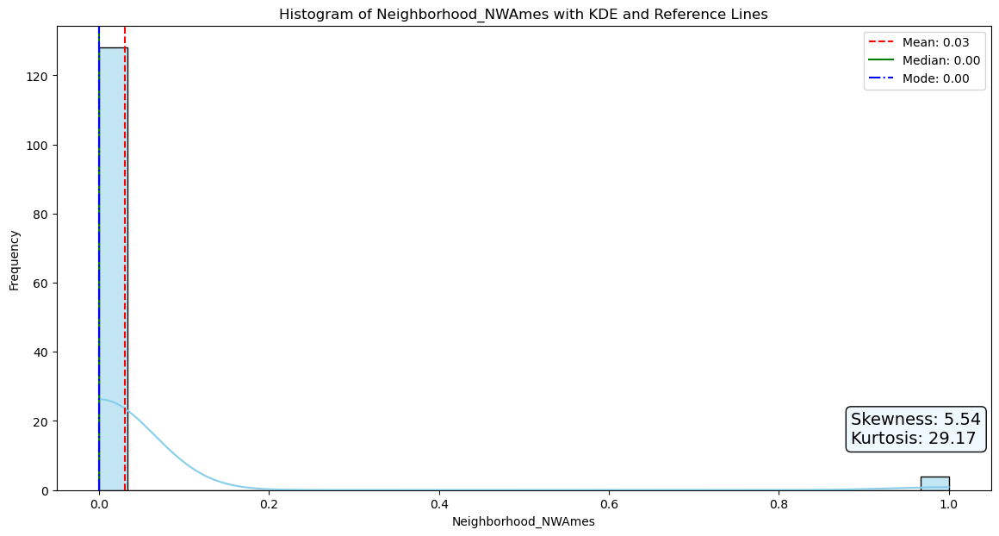

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


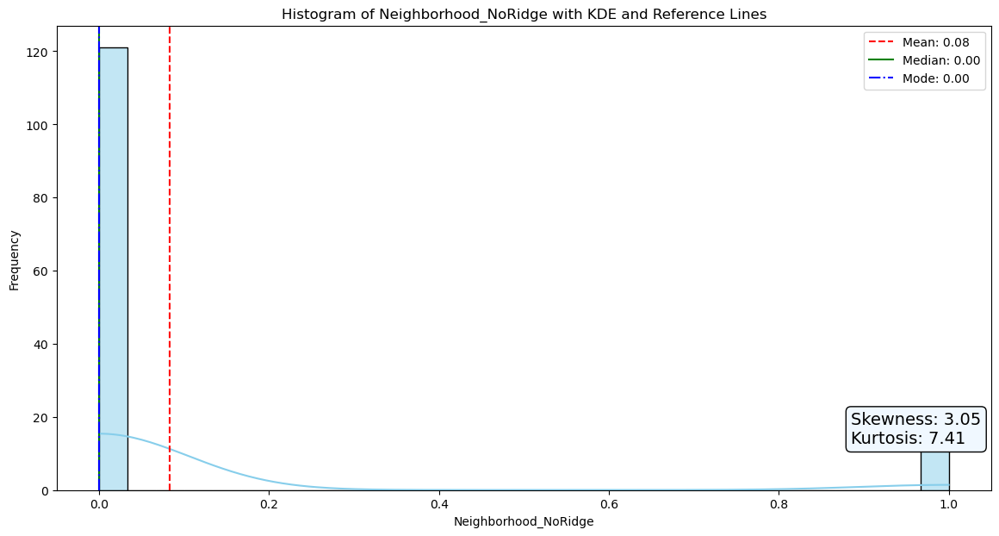

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


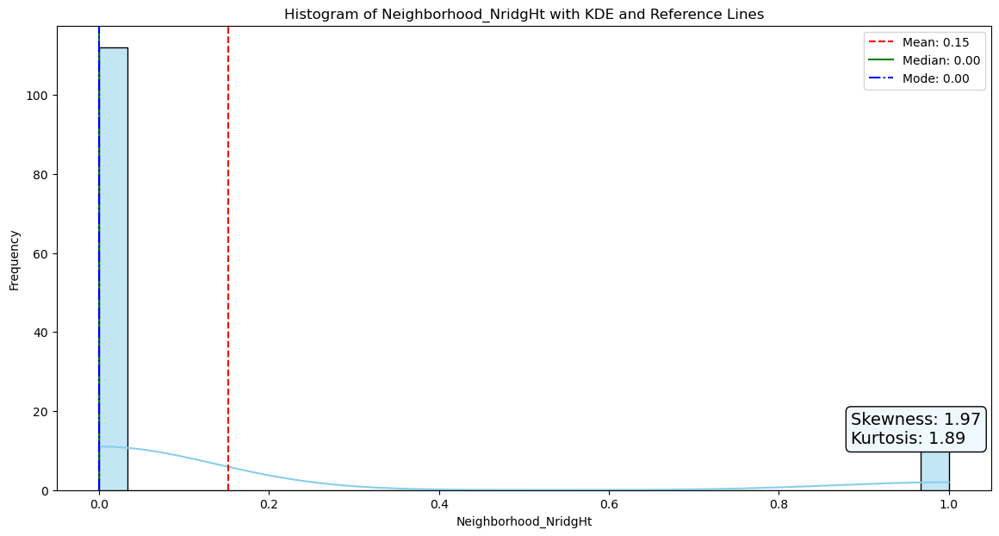

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


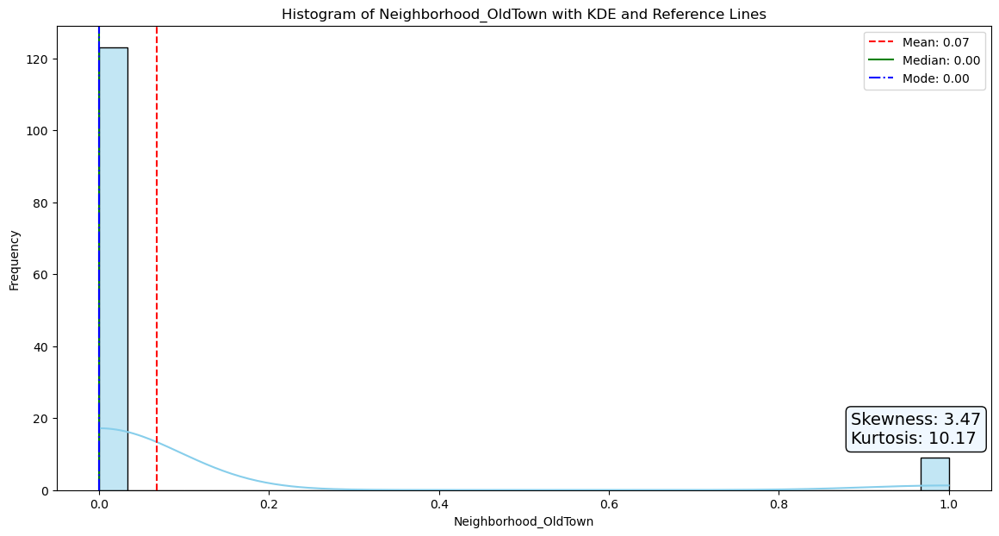

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


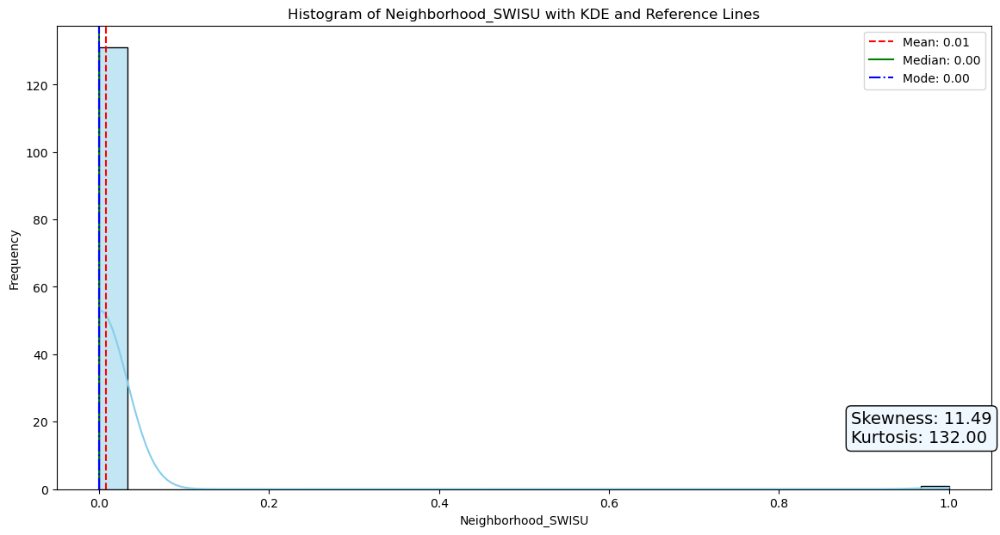

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


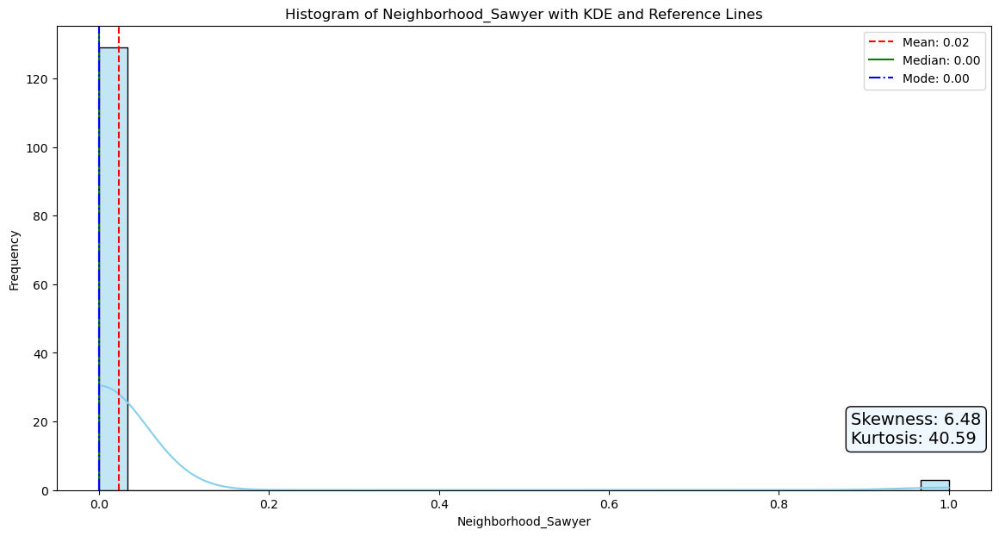

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


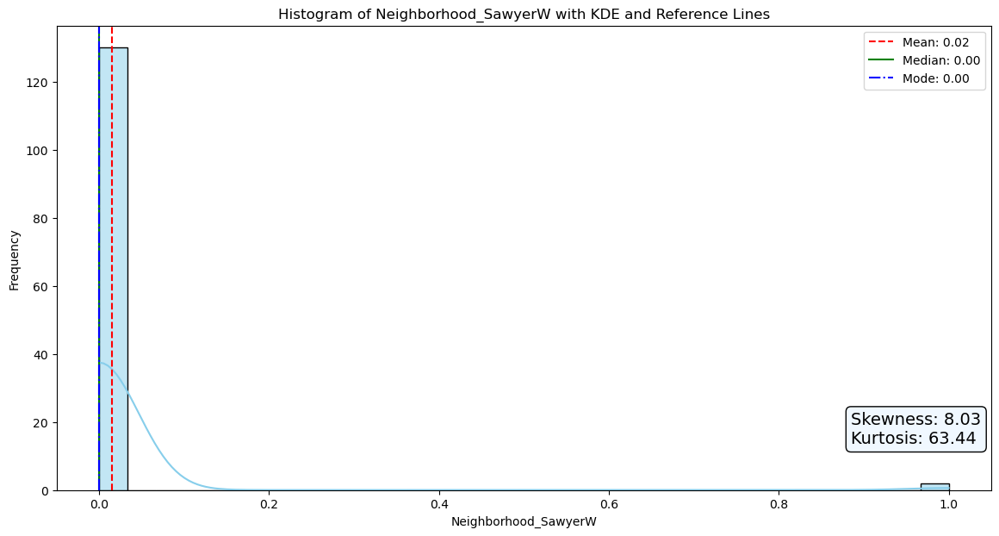

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


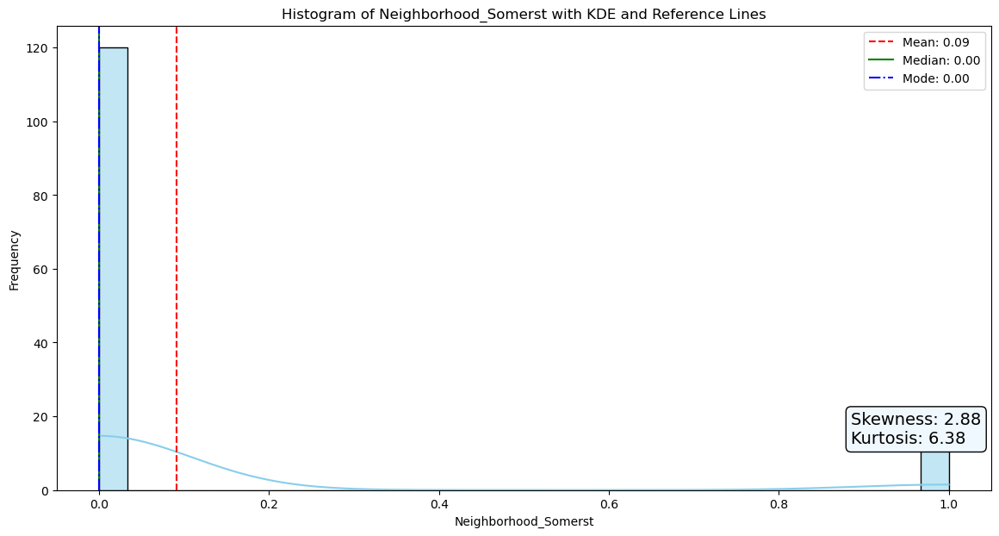

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


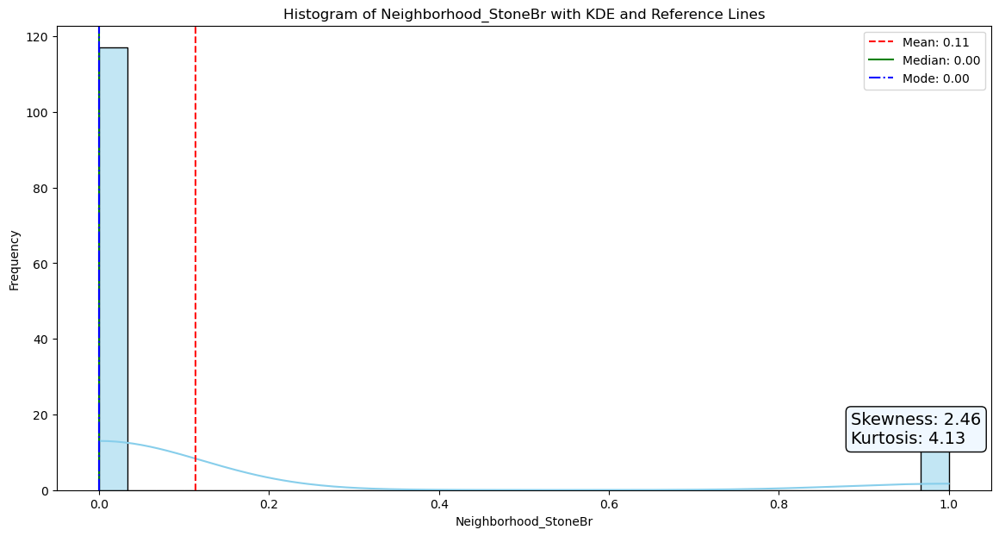

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


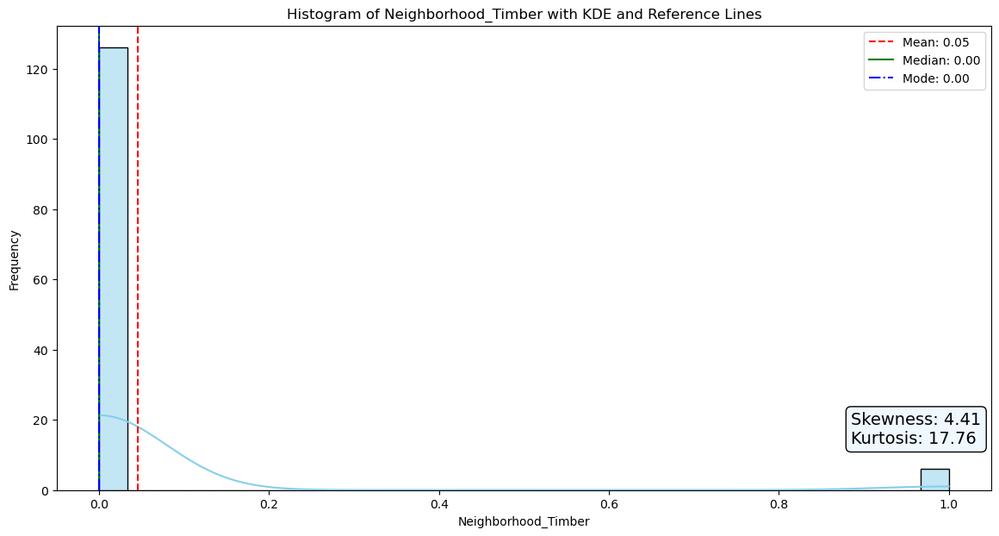

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


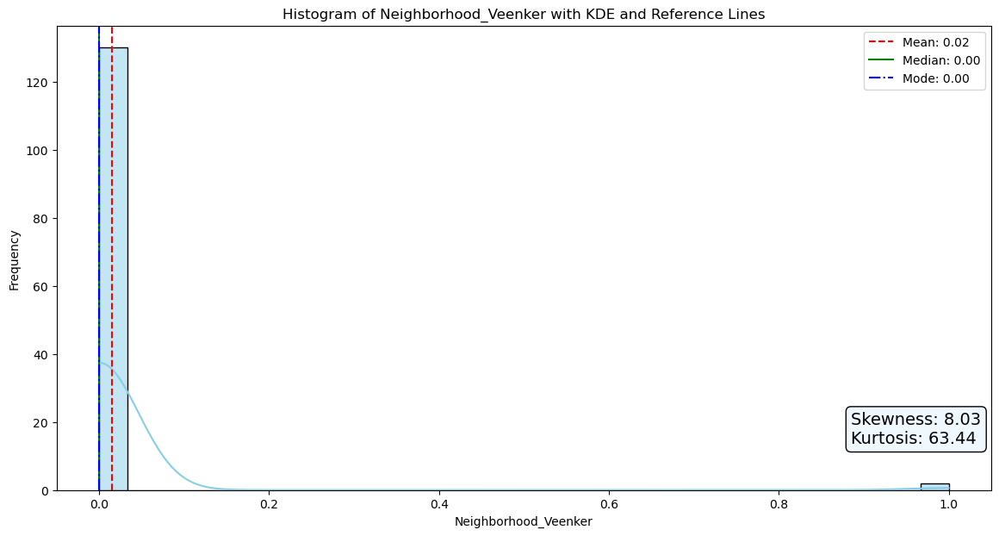

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


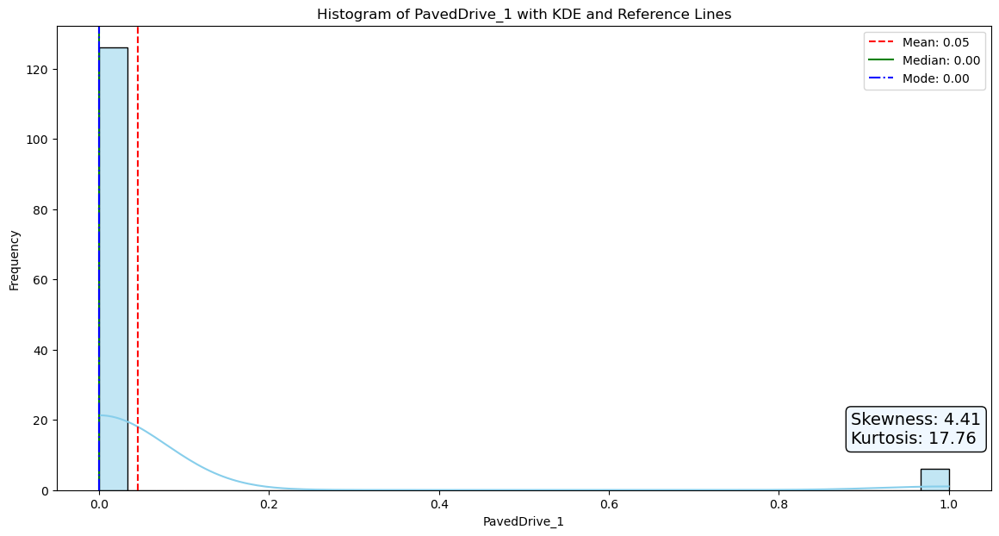

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


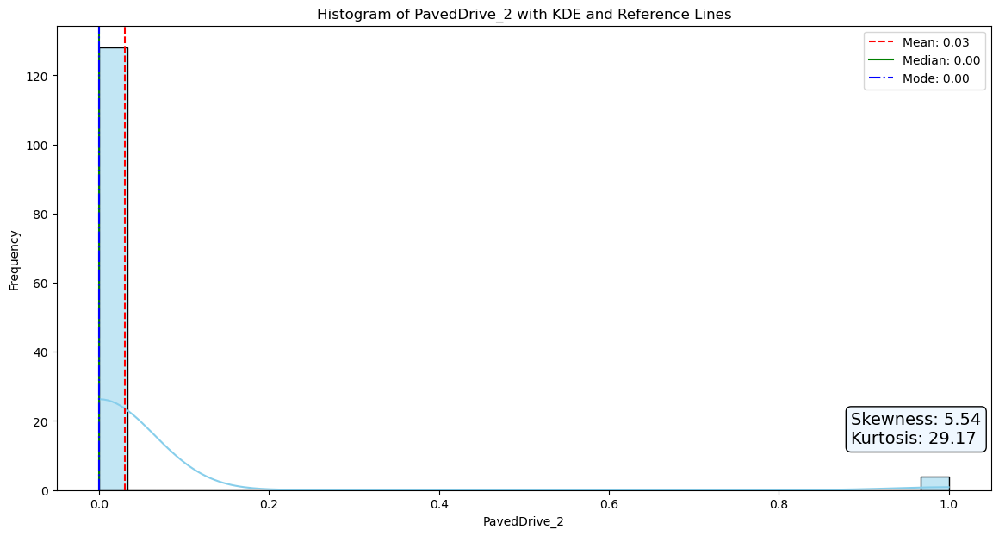

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


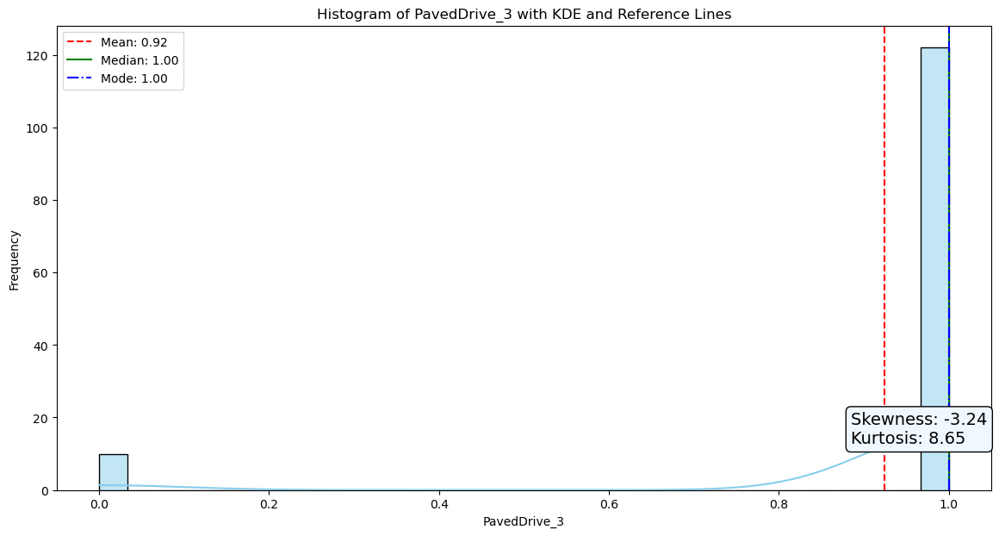

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


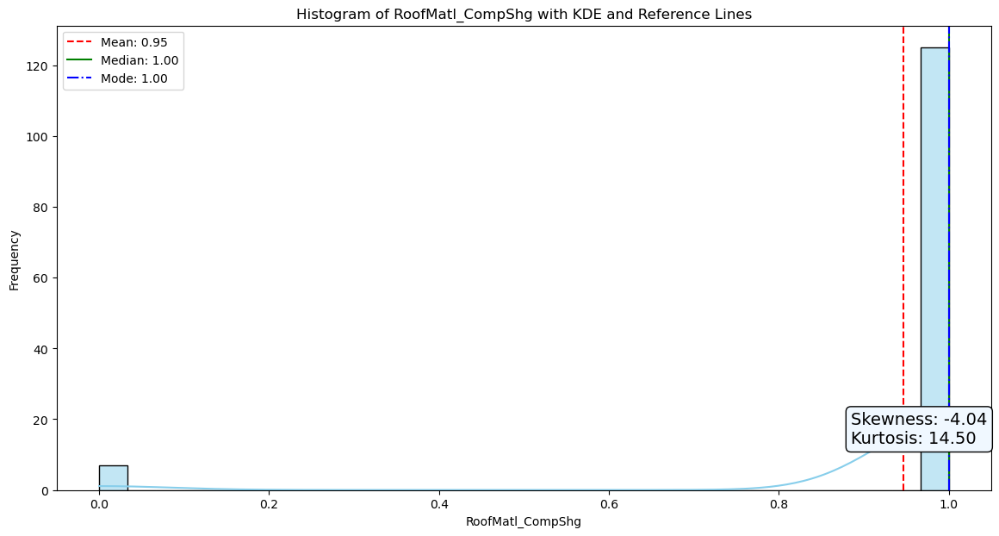

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


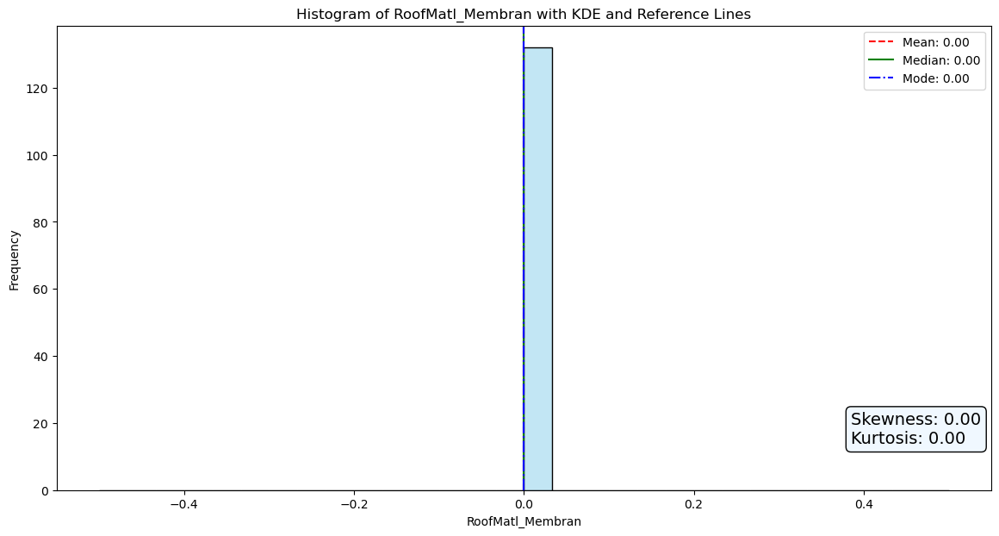

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


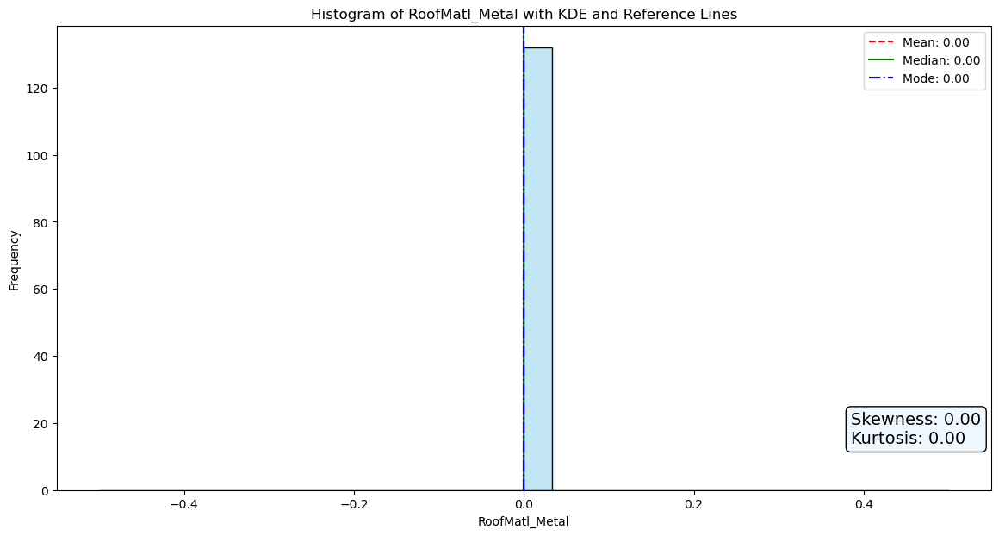

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


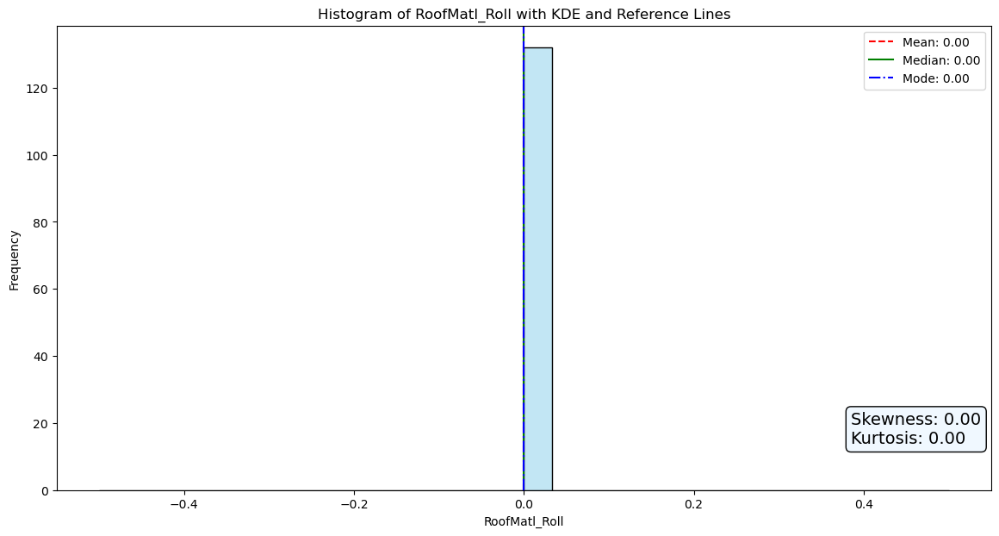

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


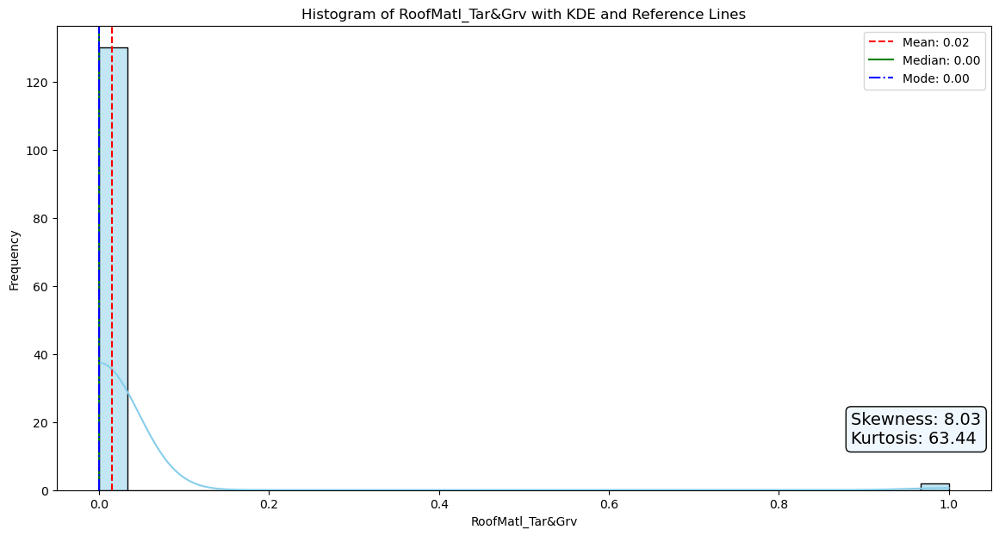

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


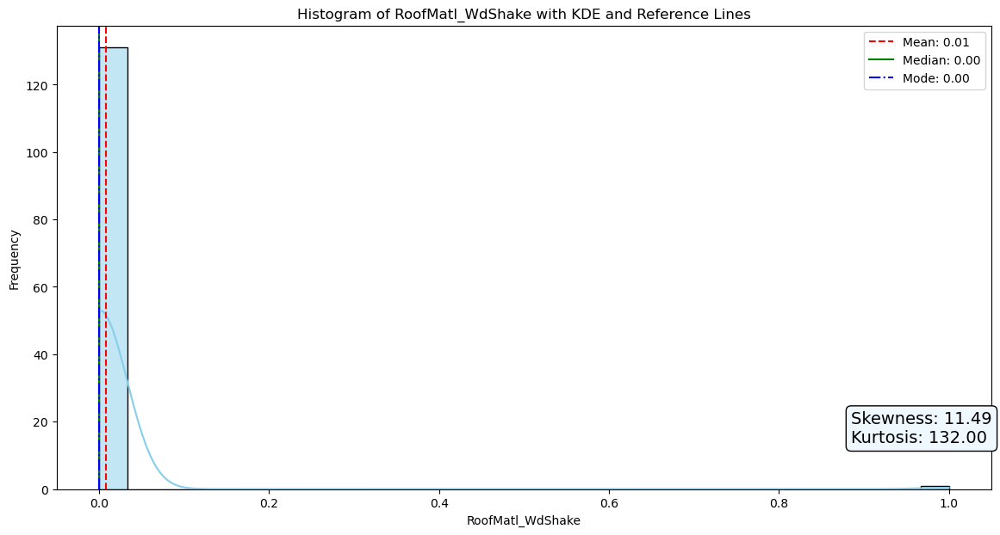

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


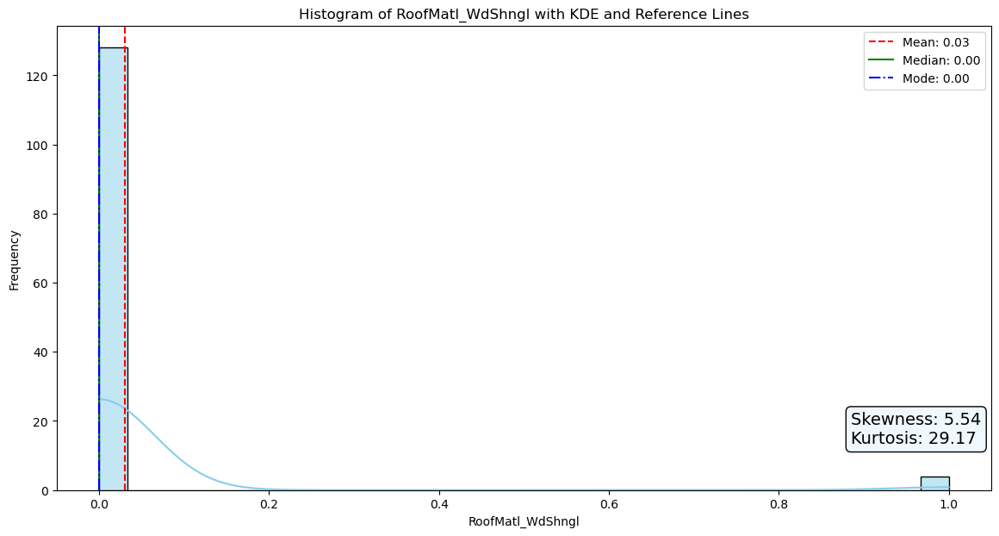

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


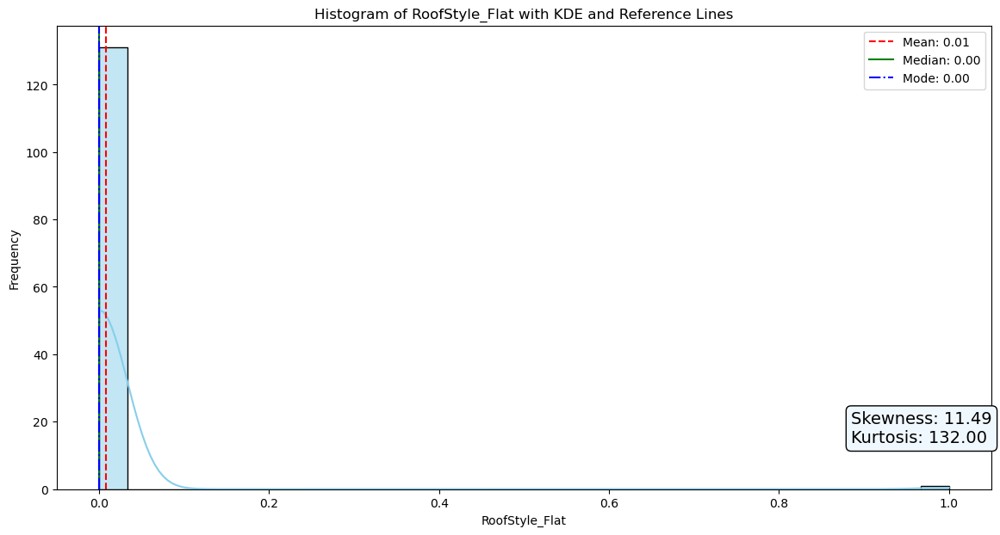

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


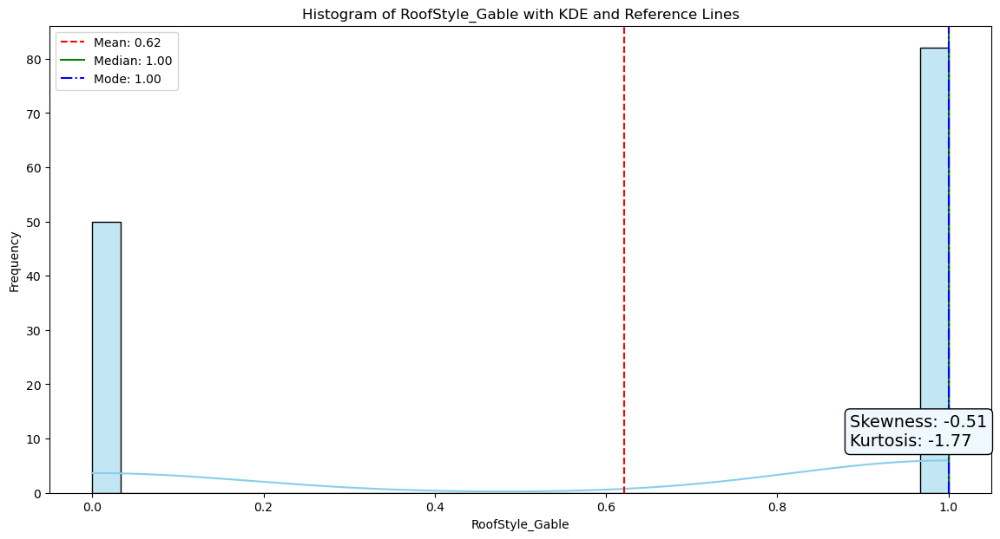

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


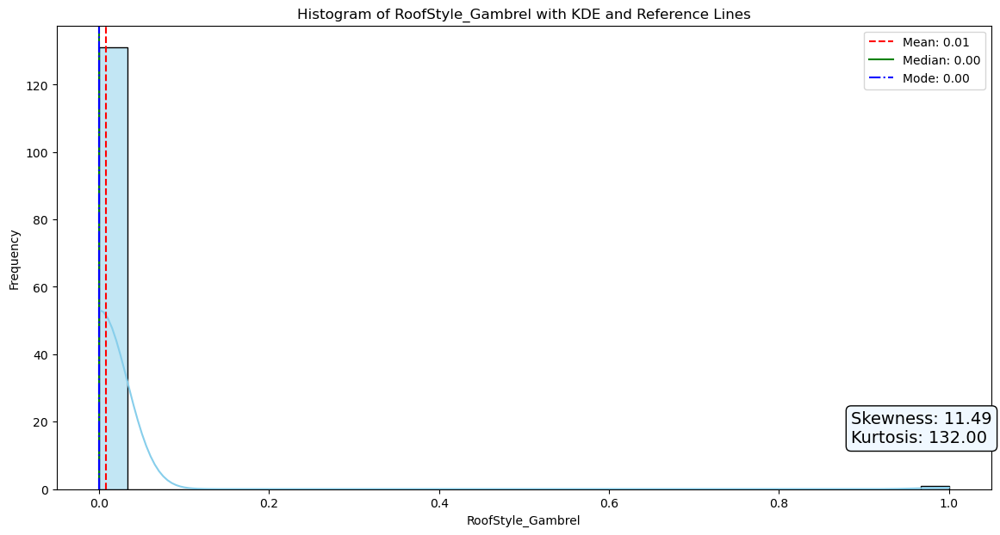

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


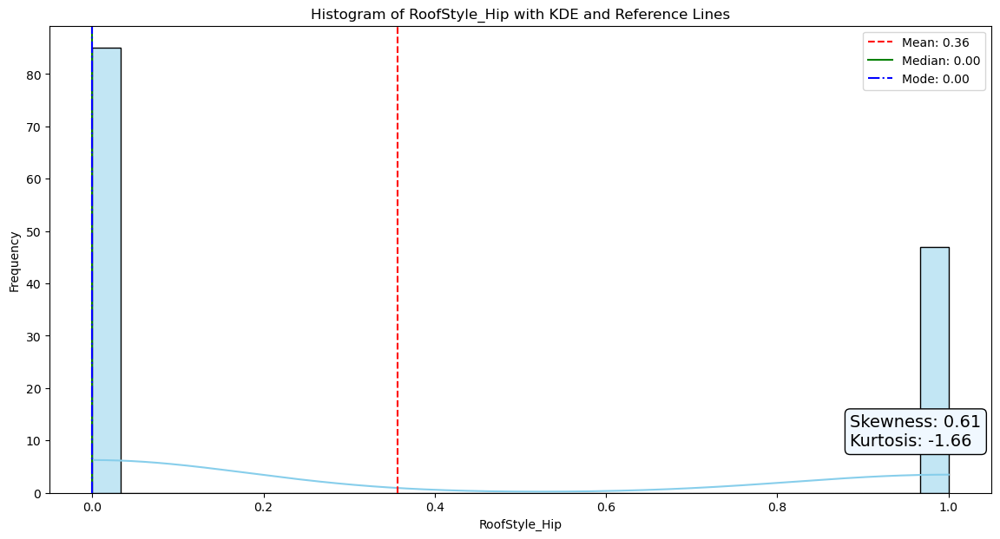

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


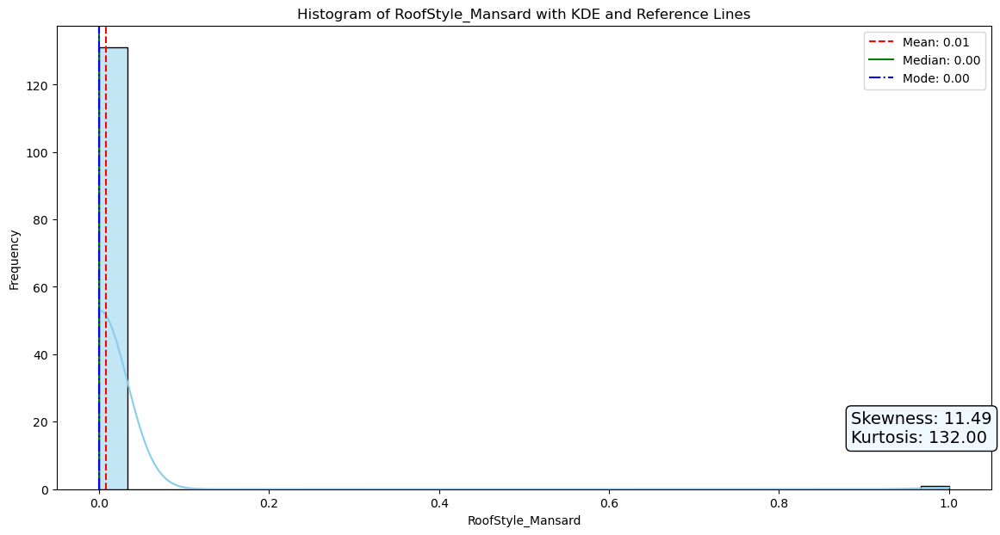

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


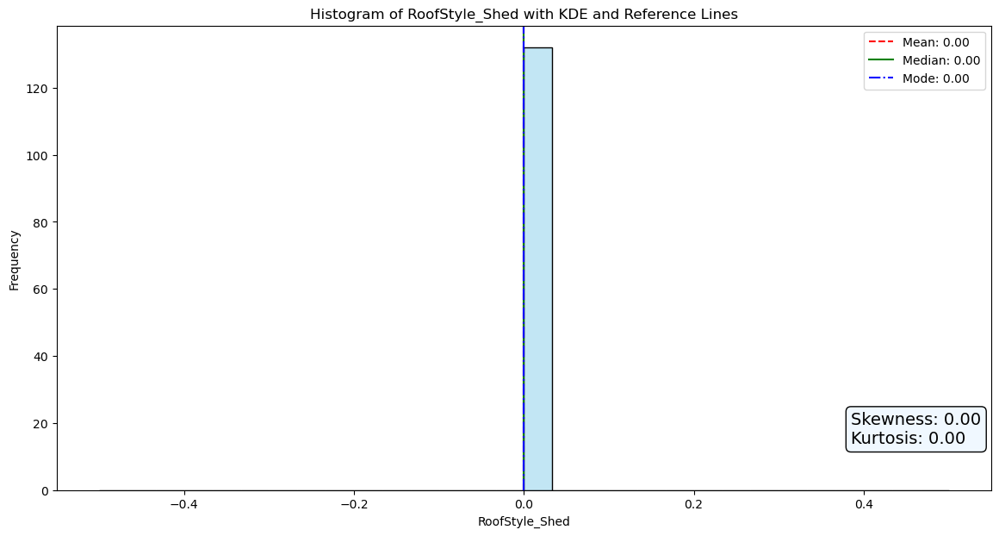

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


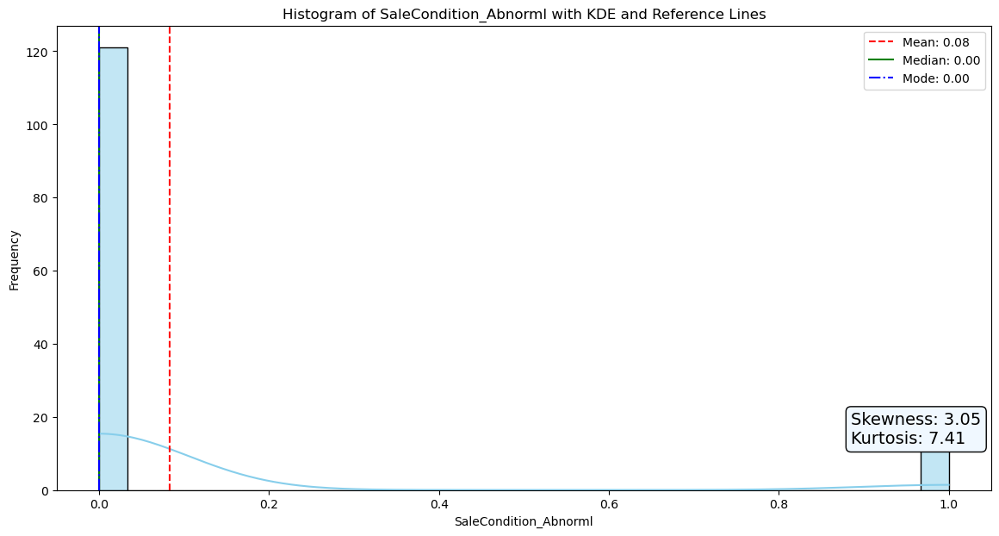

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


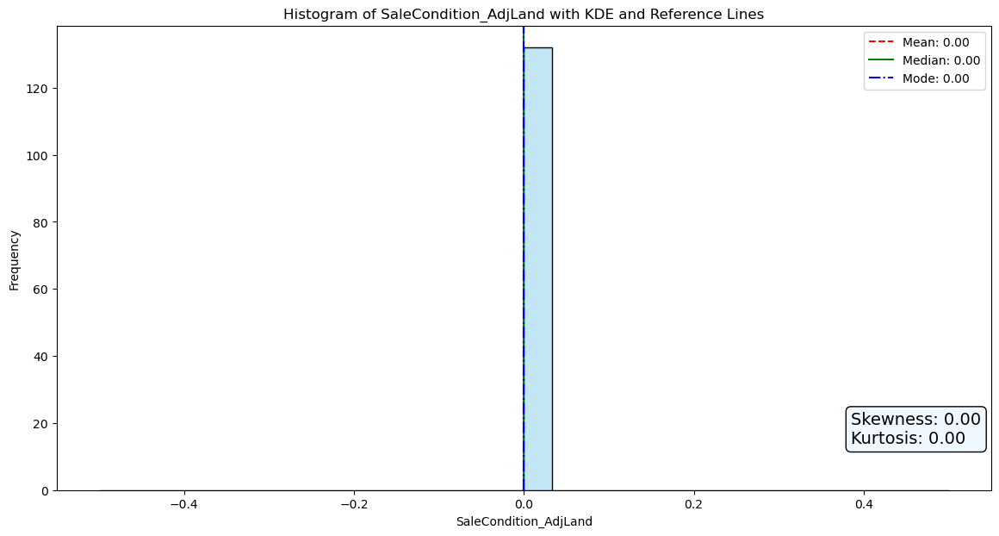

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


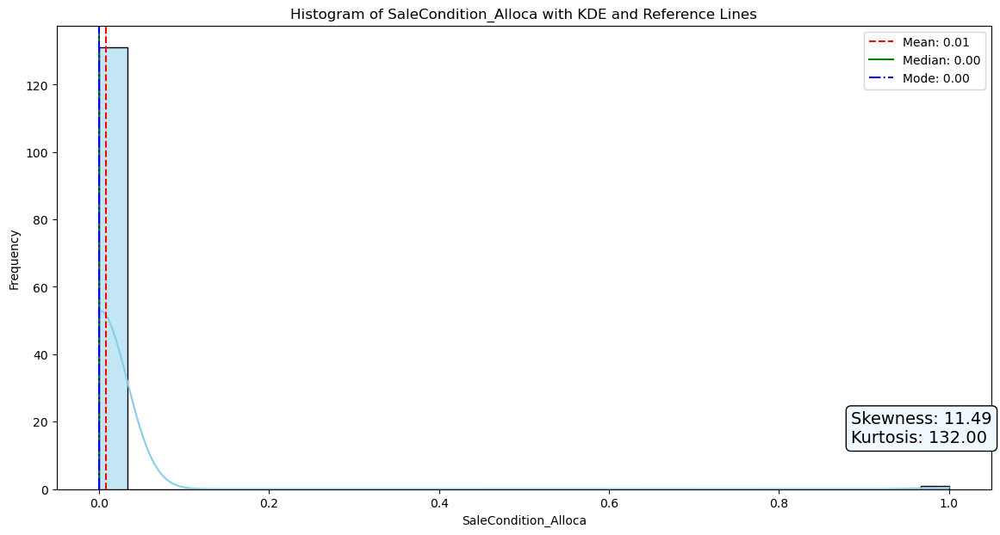

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


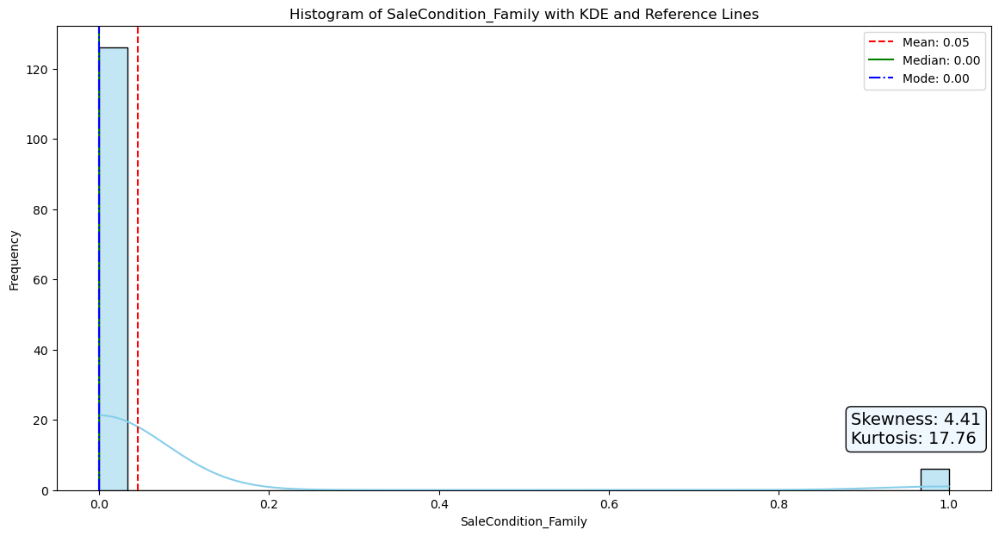

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


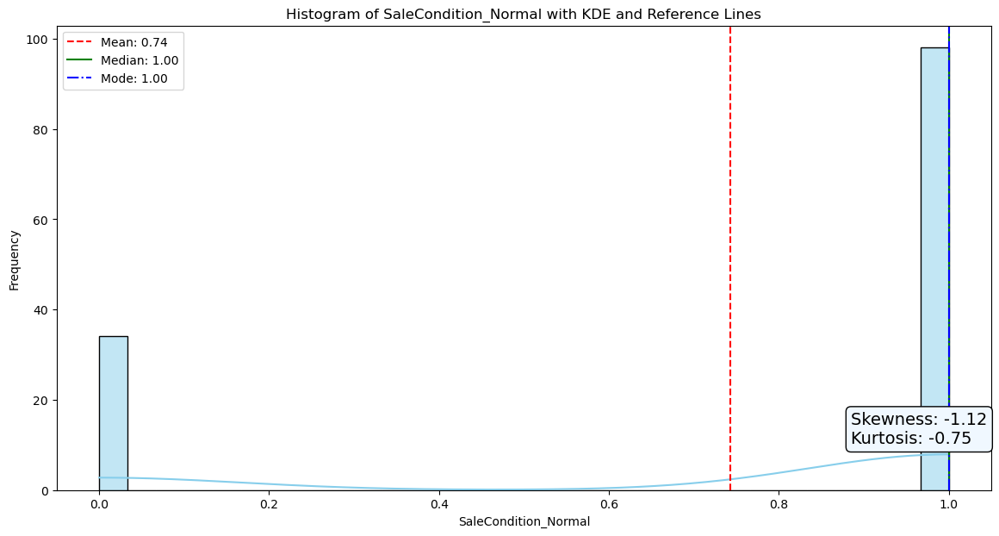

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


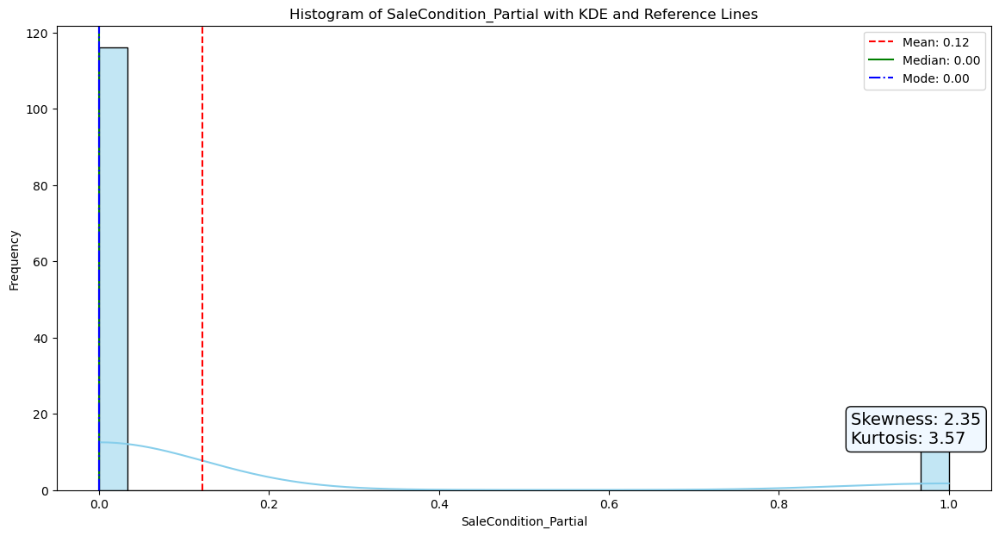

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


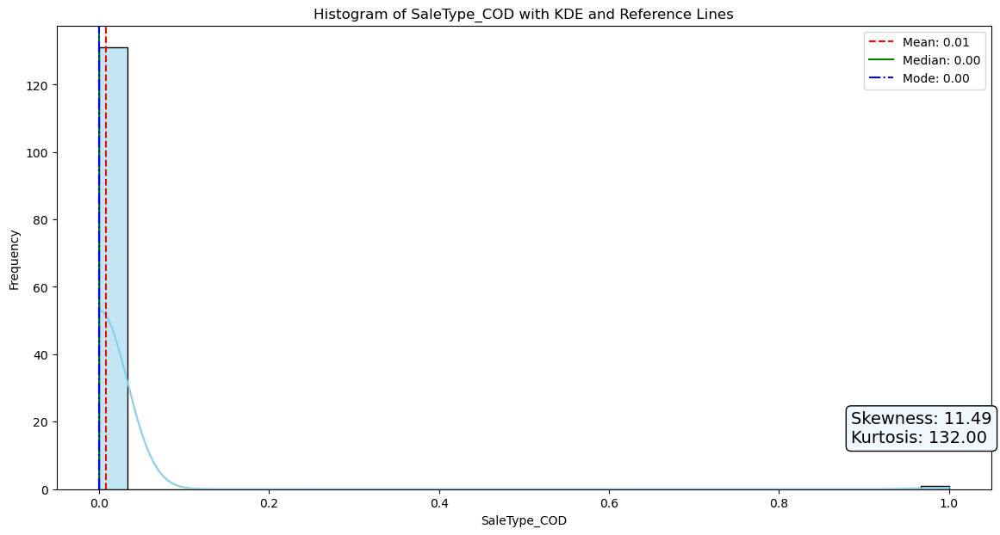

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


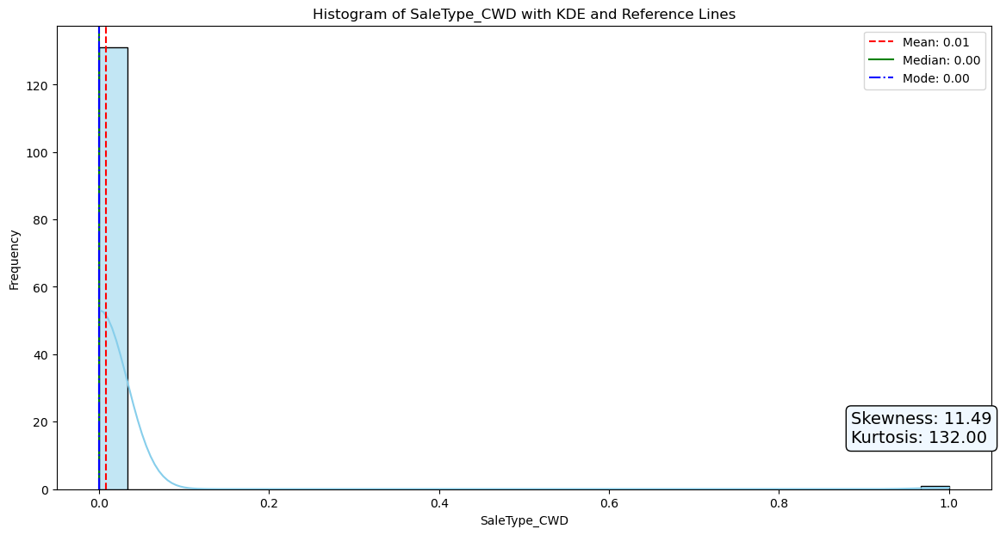

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


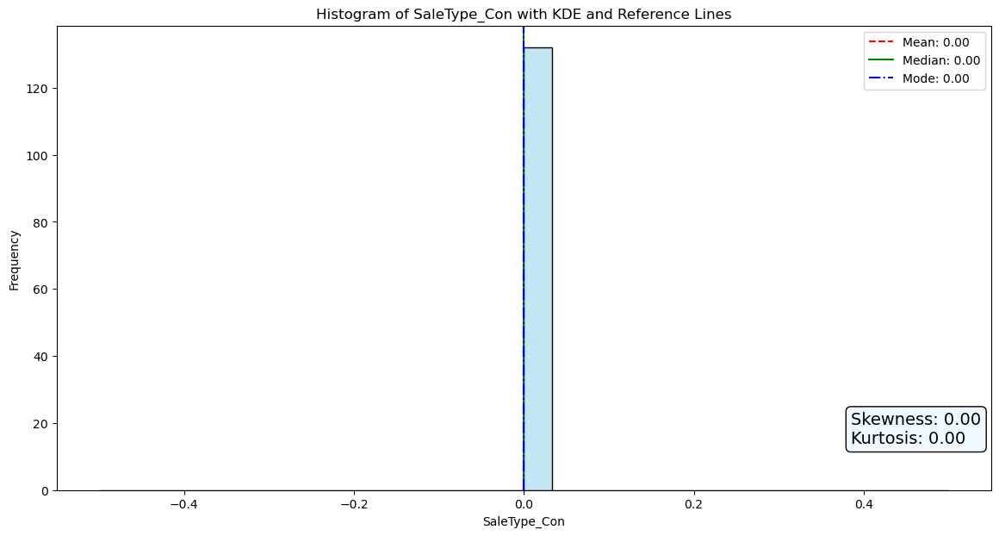

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


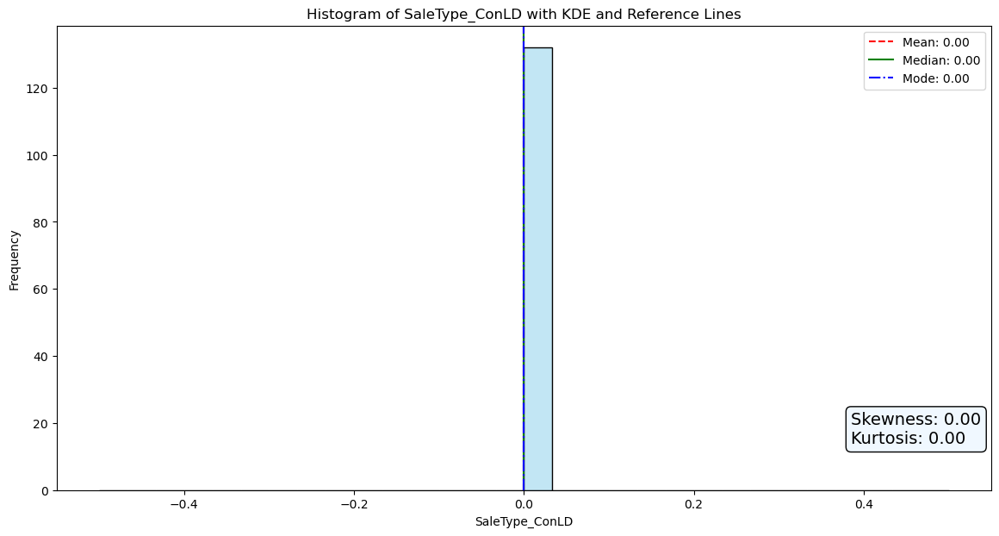

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


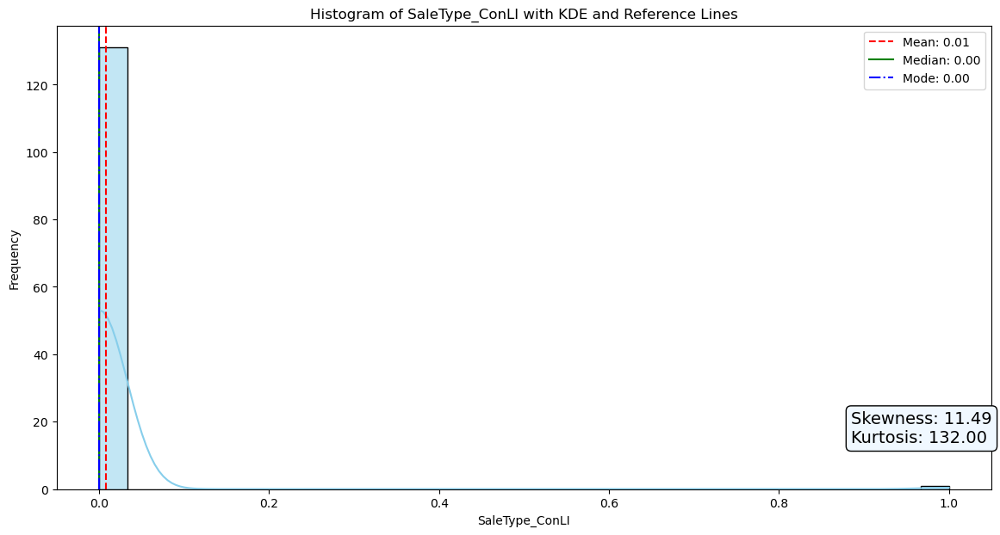

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


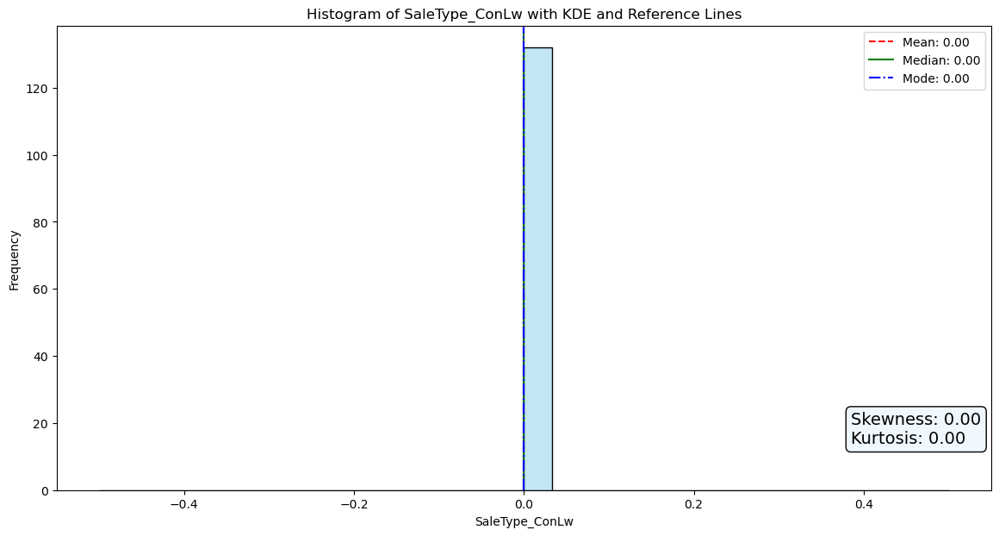

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


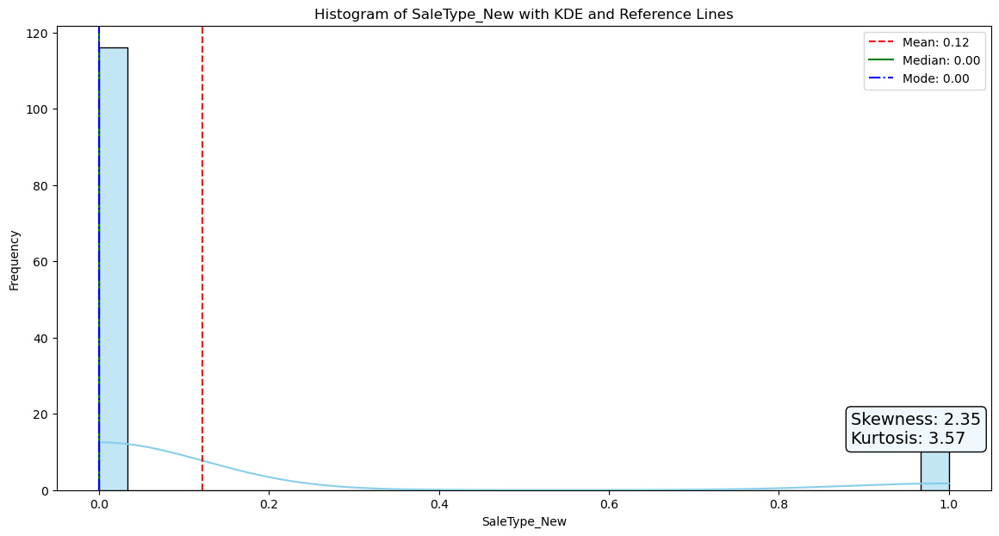

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


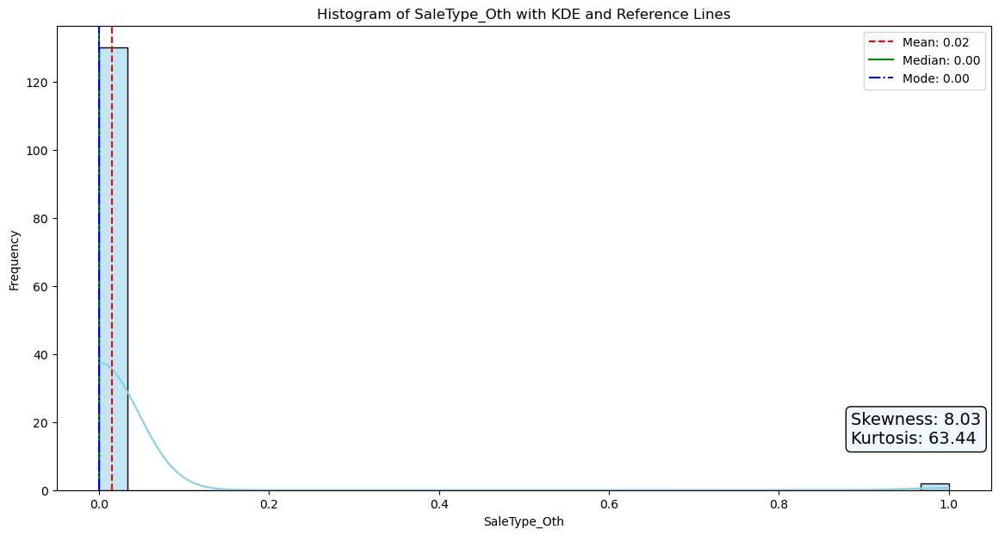

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


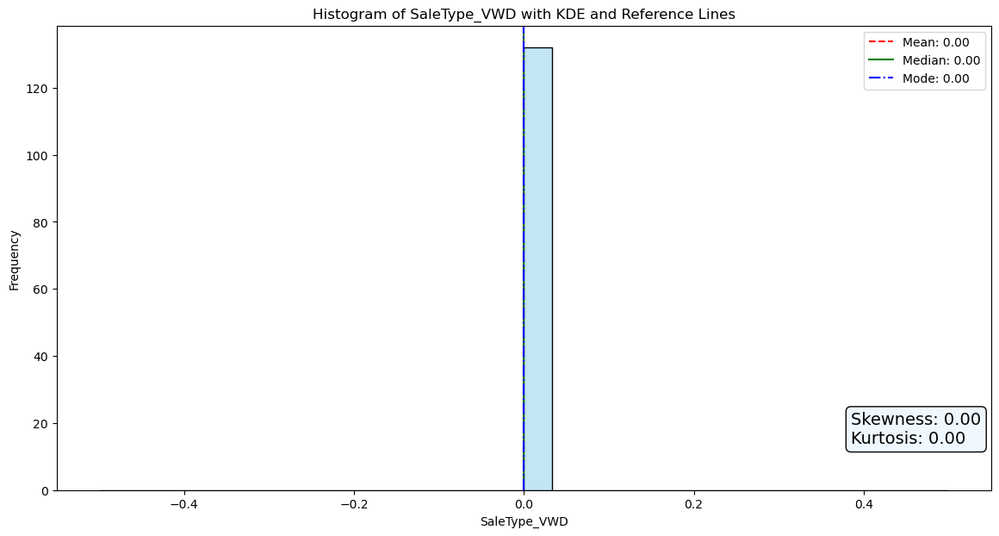

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


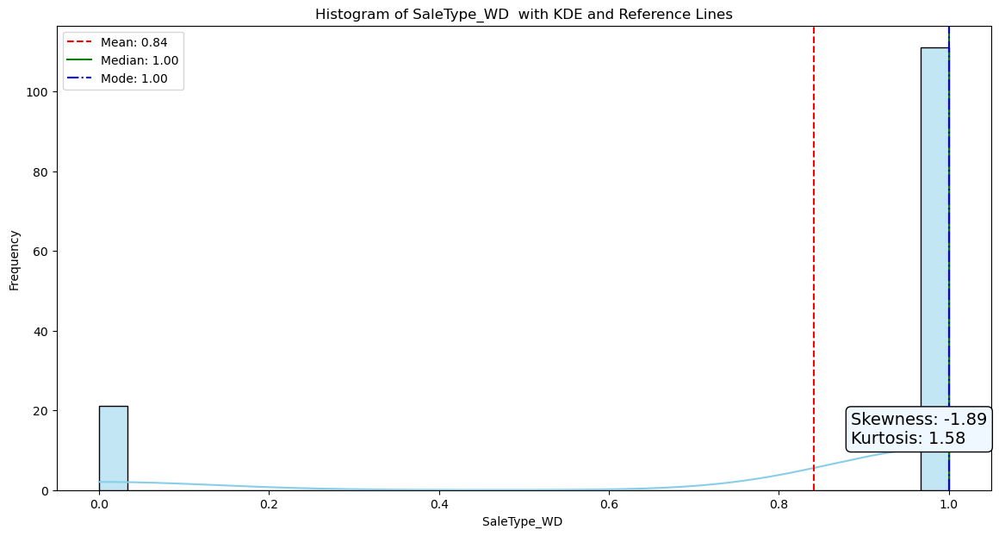

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


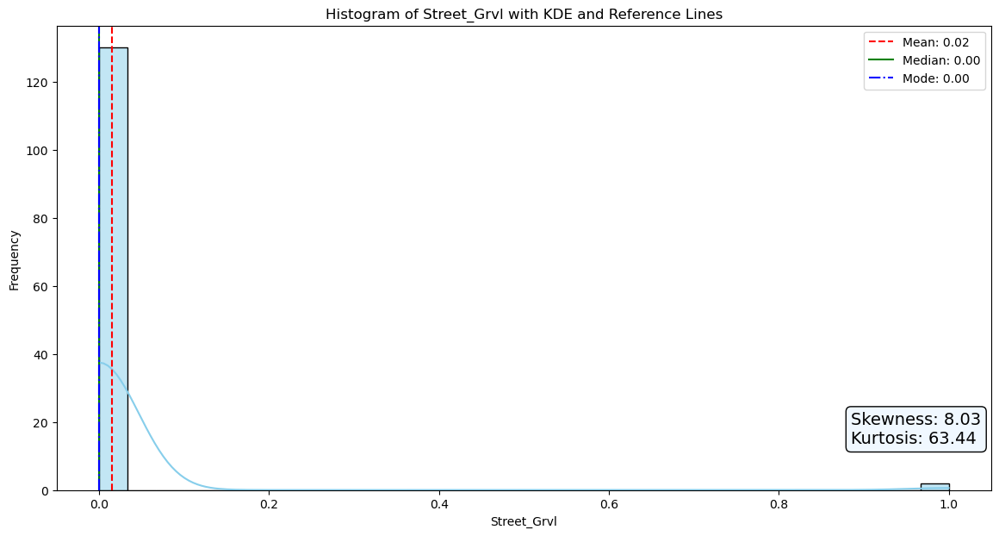

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


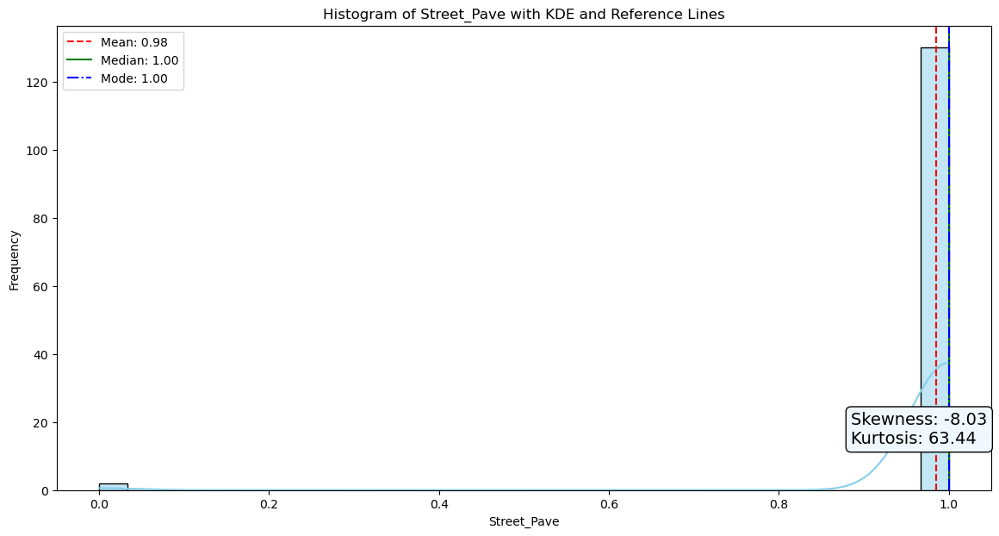

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


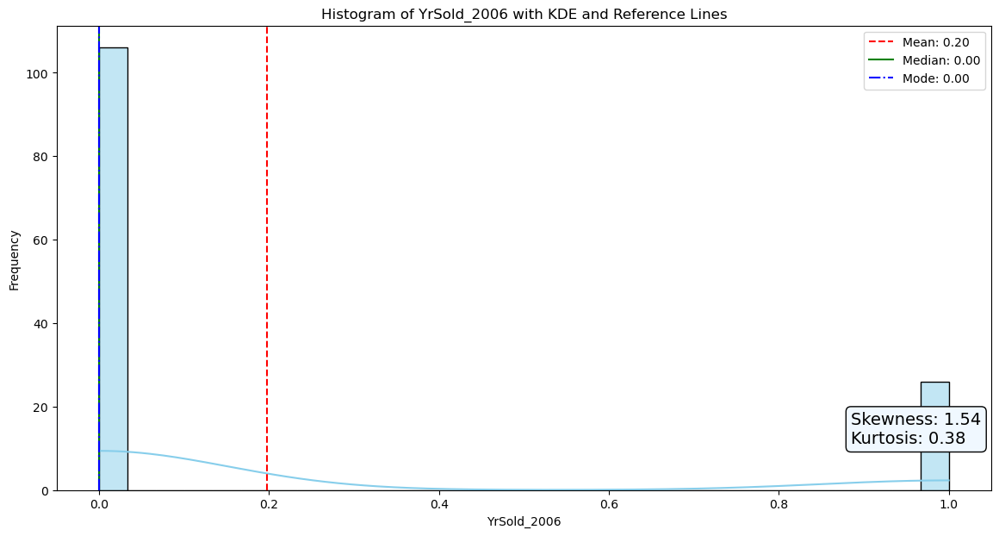

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


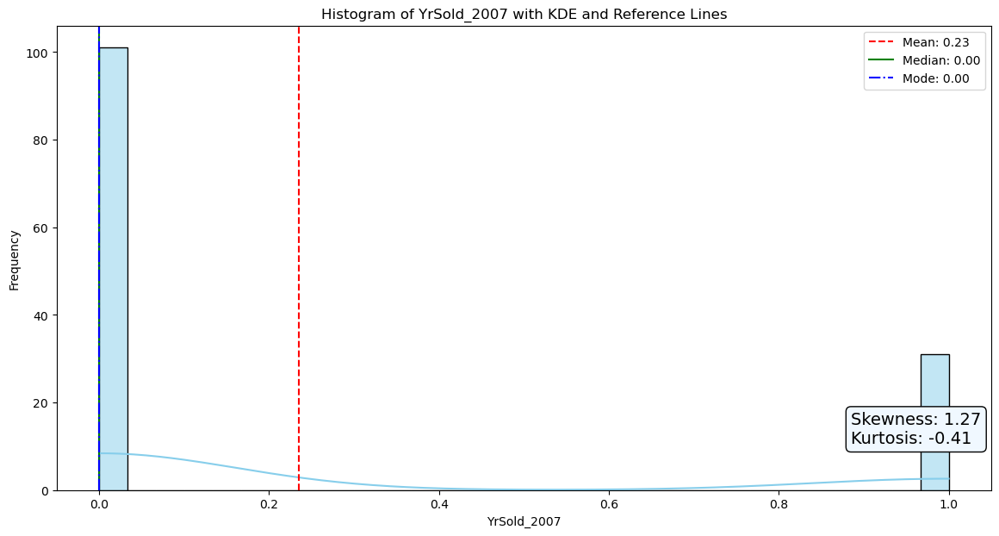

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


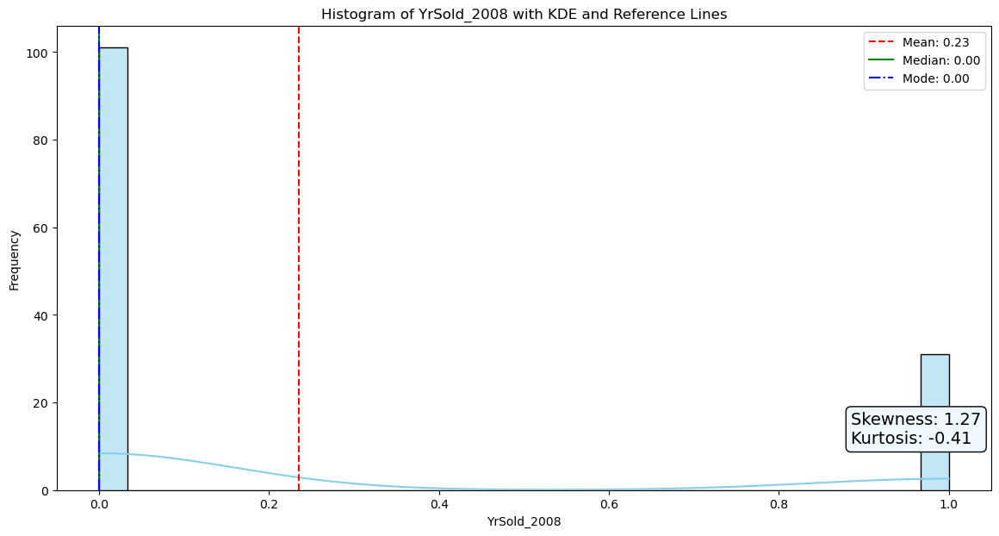

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


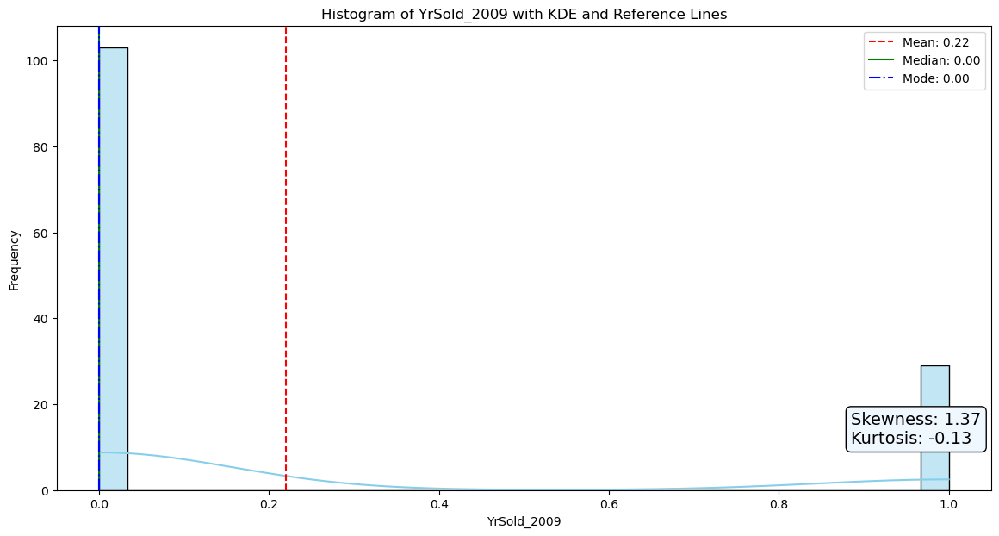

<__array_function__ internals>:200: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


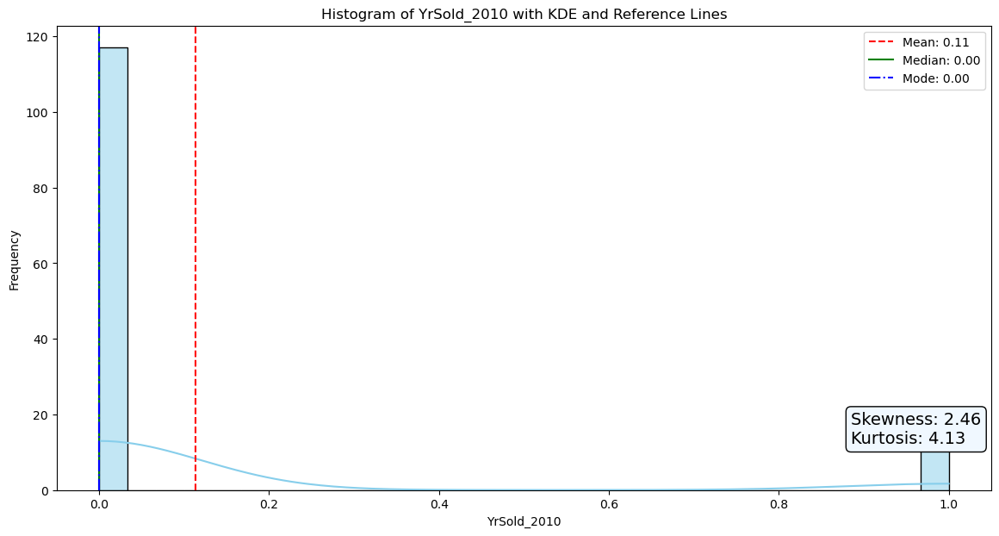

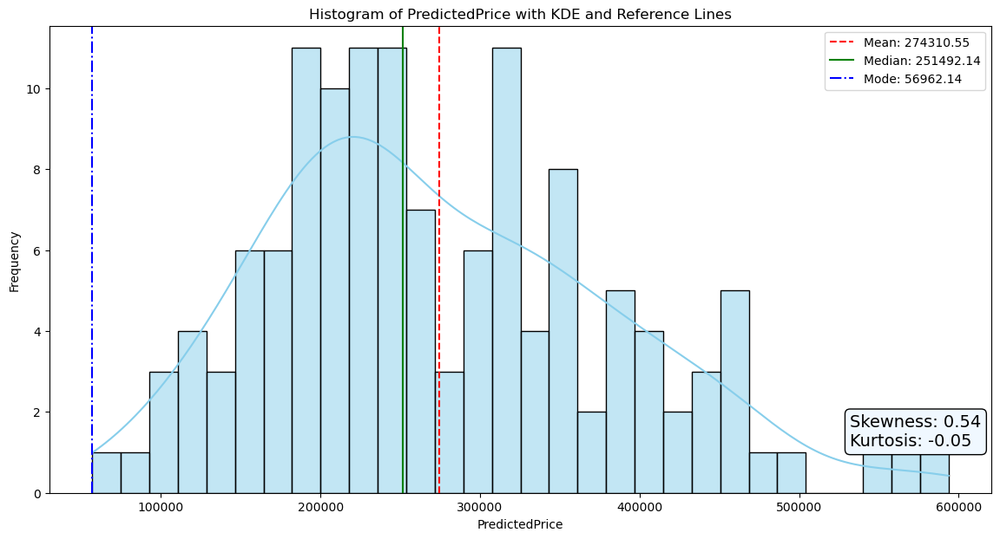

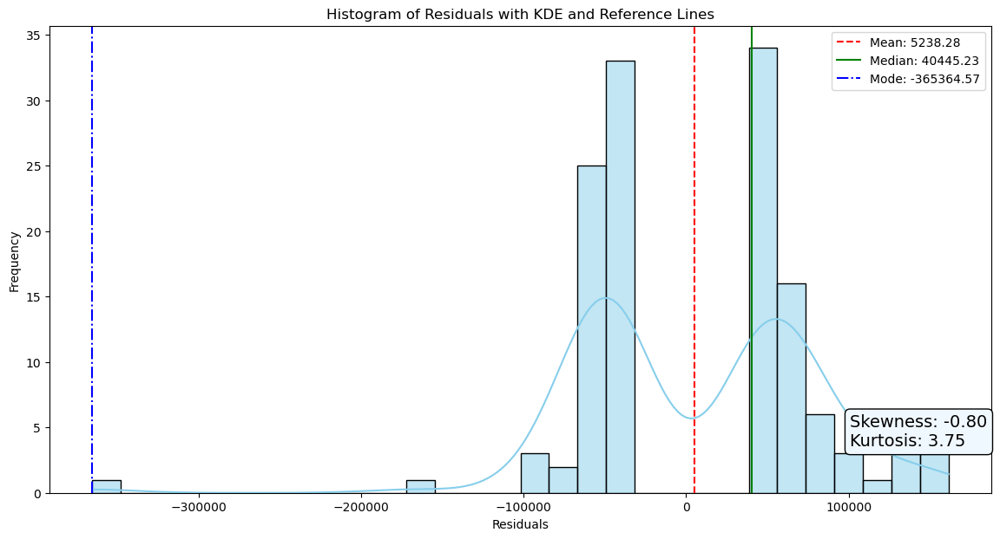

In [173]:
outlier_cols = outlier_rows.columns.tolist()
outlier_cols.remove('PID')
for col_name in outlier_cols:
    snshist(col_name, outlier_rows)
    
#What conclusions can we draw from basic histograms here? how do they compare to the dataset as a whole?

In [174]:
#Remaining Non Zero Coefficient Features:
nominal_vars
ord_vars
num_vars

['YearRemodAdd',
 'HQSF',
 'KitchenAbvGr',
 'TotalPorchSF',
 '3SsnPorch',
 'Fireplaces',
 'YearBuilt',
 'GrLivArea',
 'BsmtHalfBath',
 'ScreenPorch',
 'MasVnrArea',
 'OverallCond',
 'TotRmsAbvGrd',
 '2ndFlrSF',
 'GarageYrBlt',
 'FullBath',
 'BsmtUnfSF',
 'LotFrontage',
 'LowQualFinSF',
 'EnclosedPorch',
 'LotArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'GarageArea',
 'HalfBath',
 'TotalBath',
 'BedxBath',
 'FireplaceYN',
 'OverallQual',
 'GarageCars',
 'BedroomAbvGr',
 'PoolArea',
 'TotalSF',
 'RoomsxBath',
 'OpenPorchSF']

## Being Deliberate about Which Column to drop:
During dummifying in attempt to make the resulting linear model more explainable.

In [53]:
nominal_vars

['LandContour',
 'Exterior2nd',
 'Condition1',
 'Exterior1st',
 'GarageType',
 'MSSubClass',
 'MasVnrType',
 'MoSold',
 'MSZoning',
 'LotConfig',
 'SaleType',
 'RoofMatl',
 'SaleCondition',
 'Foundation',
 'HouseStyle',
 'Neighborhood',
 'YrSold',
 'BldgType']

In [54]:
for col in nominal_vars:
    print(ames_lasso[col].value_counts())

LandContour
Lvl    2337
HLS      96
Bnk      95
Low      52
Name: count, dtype: int64
Exterior2nd
VinylSd    856
MetalSd    404
HdBoard    380
Wd Sdng    369
Plywood    238
CmentBd     97
Wd Shng     76
BrkFace     46
Stucco      37
AsbShng     31
Brk Cmn     21
ImStucc     13
AsphShn      4
Stone        4
CBlock       3
PreCast      1
Name: count, dtype: int64
Condition1
Norm      2228
Feedr      137
Artery      81
RRAn        40
PosN        37
RRAe        26
PosA        19
RRNn         8
RRNe         4
Name: count, dtype: int64
Exterior1st
VinylSd    868
HdBoard    416
MetalSd    407
Wd Sdng    385
Plywood    194
CemntBd     97
BrkFace     80
WdShing     51
Stucco      37
AsbShng     34
BrkComm      5
AsphShn      2
CBlock       2
ImStucc      1
PreCast      1
Name: count, dtype: int64
GarageType
Attchd       1527
Detchd        716
BuiltIn       153
No Garage     127
Basment        27
2Types         21
CarPort         9
Name: count, dtype: int64
MSSubClass
20     939
60     502
50   

Col to Drop- dropping either the most frequent column or one that aids in interpretability (baselines to understand how much changes to these baselines affect the predictions.  
'MSSubClass': Drop '20' 1-STORY 1946 & NEWER ALL STYLES  
'MasVnrType': Drop 'No MasVnr'  
'HouseStyle': Drop '1Story'  
'RoofMatl': Drop 'CompShg'  STANDARD COMPOSITE SHINGLE  
'SaleCondition': Drop 'Normal'  
'GarageType': Drop 'Attchd'  
'YrSold': Dropfirst, 2006  
'LandContour': Drop 'Lvl'  
'Exterior1st' and 'Exterior2nd': Drop VinylSd  
'BldgType': Drop '1Fam'  
'LotConfig': Drop 'Inside'  
'Condition1': Drop 'Norm'  
'MSZoning': Drop 'RL'- RESIDENTIAL LOW DENSITY  
'SaleType': Drop 'WD'- Warranty Deed - Conventional  
'Neighborhood': Drop 'MeadowV'- highest  
'Foundation': Drop 'CBlock'  
'MoSold': Drop 6  

In [55]:
ames_lasso_encoded_nodrop

,PID,GrLivArea,SalePrice,LotFrontage,LotArea,LotShape,Utilities,LandSlope,OverallQual,OverallCond,...,SaleType_Oth,SaleType_VWD,SaleType_WD,Street_Grvl,Street_Pave,YrSold_2006,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010
1,909176150,856,126000,58.769231,7890,4,3,1,6,6,...,False,False,True,False,True,False,False,False,False,True
2,905476230,1049,139500,42.000000,4235,4,3,1,5,5,...,False,False,True,False,True,False,False,False,True,False
3,911128020,1001,124900,60.000000,6060,4,3,1,5,9,...,False,False,True,False,True,False,True,False,False,False
4,535377150,1039,114000,80.000000,8146,4,3,1,4,8,...,False,False,True,False,True,False,False,False,True,False
5,534177230,1665,227000,70.000000,8400,4,3,1,8,6,...,False,False,True,False,True,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
759,903205040,952,121000,55.945652,8854,4,3,1,6,6,...,False,False,True,False,True,False,False,False,True,False
760,905402060,1733,139600,65.490066,13680,3,3,1,3,5,...,False,False,True,False,True,False,False,False,True,False
761,909275030,2002,145000,82.000000,6270,4,3,1,5,6,...,False,False,True,False,True,False,True,False,False,False
762,907192040,1842,217500,69.978947,8826,4,3,1,7,5,...,False,False,True,False,True,False,True,False,False,False


In [56]:
drop_dict = {'MSSubClass': '20', 'MasVnrType': 'No MasVnr', 'HouseStyle': '1Story', 'RoofMatl': 'CompShg',
 'SaleCondition': 'Normal', 'GarageType': 'Attchd', 'YrSold': 2006, 'LandContour': 'Lvl',
'Exterior1st': 'VinylSd', 'Exterior2nd': 'VinylSd', 'BldgType': '1Fam', 'LotConfig': 'Inside', 
'Condition1': 'Norm', 'MSZoning': 'RL', 'SaleType': 'WD', 'Neighborhood': 'MeadowV', 
'Foundation': 'CBlock', 'MoSold': 6}

cols_to_drop = [f"{key}_{val}" if isinstance(val, str) else f"{key}_{str(val)}" for key, val in drop_dict.items()]

cols_to_drop

['MSSubClass_20',
 'MasVnrType_No MasVnr',
 'HouseStyle_1Story',
 'RoofMatl_CompShg',
 'SaleCondition_Normal',
 'GarageType_Attchd',
 'YrSold_2006',
 'LandContour_Lvl',
 'Exterior1st_VinylSd',
 'Exterior2nd_VinylSd',
 'BldgType_1Fam',
 'LotConfig_Inside',
 'Condition1_Norm',
 'MSZoning_RL',
 'SaleType_WD',
 'Neighborhood_MeadowV',
 'Foundation_CBlock',
 'MoSold_6']

In [57]:
cols_to_drop = list(map(lambda x: x.replace('SaleType_WD', 'SaleType_WD '), cols_to_drop))

In [58]:
other_cols_to_drop = ['Alley_Grvl', 'CentralAir_N', 'Condition2_Norm', 'Electrical_SBrkr',
                     'Fence_No Fence', 'Heating_GasA', 'MiscFeature_No Misc', 'PavedDrive_1',
                     'RoofStyle_Gable', 'Street_Pave']
cols_to_drop.extend(other_cols_to_drop)
cols_to_drop

['MSSubClass_20',
 'MasVnrType_No MasVnr',
 'HouseStyle_1Story',
 'RoofMatl_CompShg',
 'SaleCondition_Normal',
 'GarageType_Attchd',
 'YrSold_2006',
 'LandContour_Lvl',
 'Exterior1st_VinylSd',
 'Exterior2nd_VinylSd',
 'BldgType_1Fam',
 'LotConfig_Inside',
 'Condition1_Norm',
 'MSZoning_RL',
 'SaleType_WD ',
 'Neighborhood_MeadowV',
 'Foundation_CBlock',
 'MoSold_6',
 'Alley_Grvl',
 'CentralAir_N',
 'Condition2_Norm',
 'Electrical_SBrkr',
 'Fence_No Fence',
 'Heating_GasA',
 'MiscFeature_No Misc',
 'PavedDrive_1',
 'RoofStyle_Gable',
 'Street_Pave']

In [59]:
ames_encoded_drop = ames_lasso_encoded_nodrop.copy()

In [60]:
ames_encoded_drop.columns.tolist()

['PID',
 'GrLivArea',
 'SalePrice',
 'LotFrontage',
 'LotArea',
 'LotShape',
 'Utilities',
 'LandSlope',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'PoolQC',
 'MiscVal',
 'TotalBath',
 'TotalSF',
 'HQSF',
 'yrsbtwn',
 'BedxBath',
 'RoomsxBath',
 'FireplaceYN',
 'TotalPorchSF',
 'Alley_Grvl',
 'Alley_No Alley',
 'Alley_Pave',
 'BldgType_1Fam',
 'BldgType_2fmCon',
 'BldgType_Duplex',

In [61]:
nominal_vars

['LandContour',
 'Exterior2nd',
 'Condition1',
 'Exterior1st',
 'GarageType',
 'MSSubClass',
 'MasVnrType',
 'MoSold',
 'MSZoning',
 'LotConfig',
 'SaleType',
 'RoofMatl',
 'SaleCondition',
 'Foundation',
 'HouseStyle',
 'Neighborhood',
 'YrSold',
 'BldgType']

In [62]:
nominal_vars_dropfirst = ['BldgType_2fmCon', 'BldgType_Duplex', 'BldgType_Twnhs', 'BldgType_TwnhsE',
                         'Condition1_Artery', 'Condition1_Feedr', 'Condition1_PosA', 'Condition1_PosN',
                          'Condition1_RRAe', 'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn',
                          'Exterior1st_AsbShng', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace',
                          'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc',
                          'Exterior1st_MetalSd', 'Exterior1st_Plywood', 'Exterior1st_PreCast', 'Exterior1st_Stucco',
                          'Exterior1st_Wd Sdng', 'Exterior1st_WdShing', 'Exterior2nd_AsbShng', 'Exterior2nd_AsphShn',
                          'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CBlock', 'Exterior2nd_CmentBd',
                          'Exterior2nd_HdBoard', 'Exterior2nd_ImStucc', 'Exterior2nd_MetalSd', 'Exterior2nd_Plywood',
                          'Exterior2nd_PreCast', 'Exterior2nd_Stone', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Sdng',
                          'Exterior2nd_Wd Shng', 'Foundation_BrkTil', 'Foundation_PConc', 'Foundation_Slab',
                          'Foundation_Stone', 'Foundation_Wood', 'GarageType_2Types', 'GarageType_Basment', 'GarageType_BuiltIn',
                          'GarageType_CarPort', 'GarageType_Detchd', 'GarageType_No Garage', 'HouseStyle_1.5Fin',
                          'HouseStyle_1.5Unf', 'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'HouseStyle_2Story', 'HouseStyle_SFoyer',
                          'HouseStyle_SLvl', 'LandContour_Bnk', 'LandContour_HLS', 'LandContour_Low', 'LotConfig_Corner',
                          'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'MSSubClass_120', 'MSSubClass_150', 'MSSubClass_160',
                          'MSSubClass_180', 'MSSubClass_190', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50',
                          'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90',
                          'MSZoning_A (agr)', 'MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_I (all)', 'MSZoning_RH', 'MSZoning_RL',
                          'MSZoning_RM', 'MasVnrType_BrkCmn', 'MasVnrType_BrkFace', 'MasVnrType_Stone', 'MoSold_1', 'MoSold_2',
                          'MoSold_3', 'MoSold_4', 'MoSold_5', 'MoSold_7', 'MoSold_8', 'MoSold_9', 'MoSold_10', 'MoSold_11',
                          'MoSold_12', 'Neighborhood_Blmngtn', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide',
                          'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert',
                          'Neighborhood_Greens', 'Neighborhood_GrnHill', 'Neighborhood_IDOTRR', 'Neighborhood_Landmrk',
                         'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes',
                         'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU',
                         'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst', 'Neighborhood_StoneBr',
                         'Neighborhood_Timber', 'Neighborhood_Veenker', 'RoofMatl_Membran', 'RoofMatl_Metal',
                         'RoofMatl_Roll', 'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 'RoofMatl_WdShngl', 'SaleCondition_Abnorml',
                         'SaleCondition_AdjLand', 'SaleCondition_Alloca', 'SaleCondition_Family', 'SaleCondition_Partial',
                         'SaleType_COD', 'SaleType_CWD', 'SaleType_Con', 'SaleType_ConLD', 'SaleType_ConLI',
                         'SaleType_ConLw', 'SaleType_New', 'SaleType_Oth', 'SaleType_VWD', 'YrSold_2007', 'YrSold_2008',
                         'YrSold_2009', 'YrSold_2010']

In [63]:
ord_vars
num_vars

['YearRemodAdd',
 'HQSF',
 'KitchenAbvGr',
 'TotalPorchSF',
 '3SsnPorch',
 'Fireplaces',
 'YearBuilt',
 'GrLivArea',
 'ScreenPorch',
 'MasVnrArea',
 'OverallCond',
 'GarageYrBlt',
 'FullBath',
 'LotFrontage',
 'LotArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'GarageArea',
 'TotalBath',
 '1stFlrSF',
 'FireplaceYN',
 'WoodDeckSF',
 'OverallQual',
 'GarageCars',
 'BedroomAbvGr',
 'PoolArea',
 'TotalSF',
 'RoomsxBath',
 'OpenPorchSF']

In [64]:
ames_encoded_drop.columns.tolist()

['PID',
 'GrLivArea',
 'SalePrice',
 'LotFrontage',
 'LotArea',
 'LotShape',
 'Utilities',
 'LandSlope',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'PoolQC',
 'MiscVal',
 'TotalBath',
 'TotalSF',
 'HQSF',
 'yrsbtwn',
 'BedxBath',
 'RoomsxBath',
 'FireplaceYN',
 'TotalPorchSF',
 'Alley_Grvl',
 'Alley_No Alley',
 'Alley_Pave',
 'BldgType_1Fam',
 'BldgType_2fmCon',
 'BldgType_Duplex',

## Run MLR on Non-Zero Features Remaining from Lasso- specify dropped column in attempt to make more interpretable

In [90]:
#MLR on all non zero features from Lasso, no scaling!

#nominal_vars_dropfirst are dummified nominal vars dropping specified first columns for interpretability
#will eventually combine with ord_vars and num_vars

combined_features = nominal_vars_dropfirst + ord_vars + num_vars

X = ames_encoded_drop[combined_features]
y = ames_encoded_drop['SalePrice']

kf = KFold(n_splits = 5, shuffle=True, random_state = 0)

#store scores and coefs
rmse_scores = []
r2_scores = []
coefs_per_fold = []

#Perform Cross-Validation
for fold, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    #Fit lm model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    coefs_per_fold.append(model.coef_)
    
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_scores.append(rmse)
    r2_scores.append(r2)
    
    print(f"Fold{fold+1}: RMSE = {round(rmse, 4)}, R2 = {round(r2, 4)}")

mean_rmse = np.mean(rmse_scores)
mean_r2 = np.mean(r2_scores)
print(f"\nAverage RMSE: {round(mean_rmse, 4)}")
print(f"Average R2: {round(mean_r2, 4)}")

# Calculate the average and average absolute coefficients across all folds
average_coefficients = np.mean(coefs_per_fold, axis=0)
average_absolute_coefficients = np.mean(np.abs(coefs_per_fold), axis=0)

# Create DataFrames for the average and average absolute coefficients
feature_names = X.columns
average_coefficients_df = pd.DataFrame({'Feature': feature_names, 'Average Coefficient': average_coefficients})
average_abs_coefficients_df = pd.DataFrame({'Feature': feature_names, 'Average Absolute Coefficient': average_absolute_coefficients})

print(average_coefficients_df)
print(average_abs_coefficients_df)

Fold1: RMSE = 23851.2081, R2 = 0.91
Fold2: RMSE = 28578.3047, R2 = 0.813
Fold3: RMSE = 20613.732, R2 = 0.9303
Fold4: RMSE = 20823.728, R2 = 0.9113
Fold5: RMSE = 26140.1394, R2 = 0.8935

Average RMSE: 24001.4224
Average R2: 0.8916
                   Feature  Average Coefficient
0          BldgType_2fmCon         18159.946108
1          BldgType_Duplex         -8454.375315
2           BldgType_Twnhs          -680.391106
3          BldgType_TwnhsE          8443.503986
4        Condition1_Artery         -8981.963488
5         Condition1_Feedr         -8176.748399
6          Condition1_PosA         13346.984171
7          Condition1_PosN         -2054.264134
8          Condition1_RRAe        -13181.056622
9          Condition1_RRAn         -4964.204667
10         Condition1_RRNe        -10721.385059
11         Condition1_RRNn        -11408.571851
12     Exterior1st_AsbShng         10837.723654
13     Exterior1st_AsphShn          3001.649822
14     Exterior1st_BrkComm         18072.296277
15

In [66]:
average_coefficients_df

,Feature,Average Coefficient
0,BldgType_2fmCon,18159.946108
1,BldgType_Duplex,-8454.375315
2,BldgType_Twnhs,-680.391106
3,BldgType_TwnhsE,8443.503986
4,Condition1_Artery,-8981.963488
...,...,...
191,BedroomAbvGr,-4581.609644
192,PoolArea,-131.951861
193,TotalSF,-7.120167
194,RoomsxBath,1153.990457


In [67]:
average_abs_coefficients_df

,Feature,Average Absolute Coefficient
0,BldgType_2fmCon,18159.946108
1,BldgType_Duplex,8454.375315
2,BldgType_Twnhs,2664.700379
3,BldgType_TwnhsE,8443.503986
4,Condition1_Artery,8981.963488
...,...,...
191,BedroomAbvGr,4581.609644
192,PoolArea,131.951861
193,TotalSF,7.446255
194,RoomsxBath,1153.990457


In [68]:
coef_df= pd.DataFrame(coefs_per_fold, columns = X.columns)
coef_df = coef_df.T
coef_df.columns = [f"Fold {i+1}" for i in range(coef_df.shape[1])]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
print('Coefs for each feature across 5 folds')
coef_df

Coefs for each feature across 5 folds


,Fold 1,Fold 2,Fold 3,Fold 4,Fold 5
BldgType_2fmCon,2.171138e+04,12913.172201,2.355064e+04,1.942652e+04,1.319801e+04
BldgType_Duplex,-6.929930e+03,-11392.292390,-8.581071e+03,-8.437530e+03,-6.931053e+03
BldgType_Twnhs,4.105688e+03,-2651.102687,8.550852e+02,-4.913065e+03,-7.985614e+02
BldgType_TwnhsE,1.522682e+04,5957.208268,8.870582e+03,5.640642e+03,6.522271e+03
Condition1_Artery,-9.355836e+03,-10345.323849,-9.881356e+03,-6.959847e+03,-8.367455e+03
Condition1_Feedr,-1.007934e+04,-8112.714889,-7.192838e+03,-7.743026e+03,-7.755824e+03
Condition1_PosA,1.285761e+04,14800.772954,1.199536e+04,1.141408e+04,1.566710e+04
Condition1_PosN,-1.044196e+04,13664.191900,-6.720536e+03,-6.096814e+03,-6.762018e+02
Condition1_RRAe,-1.474274e+04,-13991.312586,-1.162457e+04,-1.274896e+04,-1.279770e+04
Condition1_RRAn,-5.480050e+03,-5012.752536,-7.615449e+03,-3.083881e+03,-3.628890e+03


In [69]:
signs_df = coef_df.T.apply(np.sign)
signs_df
mixed_signs = []
for feature in signs_df.columns:
    if len(signs_df[feature].unique()) >1:
        mixed_signs.append(feature)
mixed_signs

['BldgType_Twnhs',
 'Condition1_PosN',
 'Exterior1st_AsphShn',
 'Exterior1st_CBlock',
 'Exterior1st_CemntBd',
 'Exterior1st_PreCast',
 'Exterior2nd_AsphShn',
 'Exterior2nd_CBlock',
 'Exterior2nd_CmentBd',
 'Exterior2nd_PreCast',
 'Exterior2nd_Stone',
 'Foundation_BrkTil',
 'GarageType_Basment',
 'GarageType_BuiltIn',
 'GarageType_CarPort',
 'HouseStyle_1.5Unf',
 'HouseStyle_2.5Fin',
 'HouseStyle_SFoyer',
 'MSSubClass_45',
 'MSZoning_I (all)',
 'MSZoning_RH',
 'MSZoning_RL',
 'MSZoning_RM',
 'MoSold_3',
 'MoSold_4',
 'MoSold_8',
 'MoSold_9',
 'MoSold_10',
 'MoSold_11',
 'Neighborhood_Blmngtn',
 'Neighborhood_Crawfor',
 'Neighborhood_Landmrk',
 'RoofMatl_Roll',
 'RoofMatl_Tar&Grv',
 'SaleCondition_Alloca',
 'SaleCondition_Partial',
 'SaleType_COD',
 'SaleType_ConLw',
 'SaleType_New',
 'SaleType_Oth',
 'YrSold_2010',
 'LandSlope',
 'LotShape',
 'ExterCond',
 'Utilities',
 'GarageYrBlt',
 'LotFrontage',
 'WoodDeckSF',
 'TotalSF']